In [2]:
import numpy as np
import torch
import torch.nn as nn
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import wandb
from torch.optim.lr_scheduler import StepLR
from torch.utils.data import Dataset, DataLoader
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import r2_score
from matplotlib.colors import ListedColormap, Normalize
from matplotlib.cm import ScalarMappable
from matplotlib.lines import Line2D
from datetime import datetime
from sklearn.preprocessing import StandardScaler
import os
from helper import train_VAE 
import json

In [3]:
X_train = pd.read_csv('../datasets/Admission/X_train.csv',index_col=0)  
X_test = pd.read_csv('../datasets/Admission/X_test.csv',index_col=0)  
y_train = pd.read_csv('../datasets/Admission/y_train.csv',index_col=0)  
y_test = pd.read_csv('../datasets/Admission/y_test.csv',index_col=0) 
X_train_with_confounder=X_train.drop(columns=['CGPA'])
X_test_with_confounder=X_test.drop(columns=['CGPA'])
print(X_train.shape)
print(X_train_with_confounder)
print(X_test.shape)
print(X_test_with_confounder.shape)
print(X_train.columns)
print(X_train_with_confounder.columns)
X_train_with_confounder

(400, 7)
     GRE Score  TOEFL Score  University Rating  SOP  LOR   Research
60         309          100                  2  3.0   3.0         0
298        330          114                  3  4.5   4.5         1
228        318          112                  3  4.0   3.5         0
141        332          118                  2  4.5   3.5         1
3          322          110                  3  3.5   2.5         1
..         ...          ...                ...  ...   ...       ...
381        319          105                  3  3.0   3.5         1
37         300          105                  1  1.0   2.0         0
153        324          105                  3  3.0   4.0         0
396        325          107                  3  3.0   3.5         1
101        312          105                  2  2.5   3.0         0

[400 rows x 6 columns]
(100, 7)
(100, 6)
Index(['GRE Score', 'TOEFL Score', 'University Rating', 'SOP', 'LOR ', 'CGPA',
       'Research'],
      dtype='object')
Index(['GRE 

,GRE Score,TOEFL Score,University Rating,SOP,LOR,Research
60,309,100,2,3.0,3.0,0
298,330,114,3,4.5,4.5,1
228,318,112,3,4.0,3.5,0
141,332,118,2,4.5,3.5,1
3,322,110,3,3.5,2.5,1
...,...,...,...,...,...,...
381,319,105,3,3.0,3.5,1
37,300,105,1,1.0,2.0,0
153,324,105,3,3.0,4.0,0
396,325,107,3,3.0,3.5,1


In [4]:

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_with_confounder)
X_test_scaled = scaler.transform(X_test_with_confounder)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [4]:
import itertools

# Define the ranges for your parameters
x_dim_values = [X_train_with_confounder.shape[1]]
z_dim_values = [3]
zz_dim_values = [1]
encoder_z_layers_values = [[10,10,10]]
encoder_zz_layers_values = [[10,10]]
#decoder_layers_values = [[14,X_train_with_confounder.shape[1]],[32, 32,X_train_with_confounder.shape[1]],[128,128,128,X_train_with_confounder.shape[1]]]
fc_z_to_y_layers_values = [[12,12,1],]

# Get all combinations
configurations = list(itertools.product(x_dim_values, z_dim_values, zz_dim_values, encoder_z_layers_values, encoder_zz_layers_values, fc_z_to_y_layers_values))

# Convert to a list of dictionaries
config_dicts = [{'x_dim': x_dim, 'z_dim': z_dim, 'zz_dim': zz_dim, 'encoder_z_layers': encoder_z_layers, 'encoder_zz_layers': encoder_zz_layers, 'decoder_layers': encoder_z_layers+ [x_dim], 'fc_z_to_y_layers': fc_z_to_y_layers} for x_dim, z_dim, zz_dim, encoder_z_layers, encoder_zz_layers, fc_z_to_y_layers in configurations]
print(config_dicts)

[{'x_dim': 6, 'z_dim': 3, 'zz_dim': 1, 'encoder_z_layers': [10, 10, 10], 'encoder_zz_layers': [10, 10], 'decoder_layers': [10, 10, 10, 6], 'fc_z_to_y_layers': [12, 12, 1]}]


In [9]:
# Define betas
BETAS=[
    #{'b1': 6, 'b2': 1, 'b3': 1, 'b4': 6,'b5':1},
    #{'b1': 1, 'b2': 1, 'b3': 1, 'b4': 1000,'b5':1},
    #{'b1': 100, 'b2': 1, 'b3': 100, 'b4': 100,'b5':1},
    #{'b1': 100,'b2': 1, 'b3': 1, 'b4': 10,'b5':1},  
    #{'b1': 10000, 'b2': 1, 'b3': 1, 'b4': 10000,'b5':1},
    {'b1': 10000, 'b2': 1, 'b3': 1, 'b4': 10000,'b5':1}
]
import itertools

# Define the ranges for your parameters
lr_values = [1e-3]
batch_size_values = [32]
num_epochs_values = [600]

# Get all combinations
configs = list(itertools.product(config_dicts, BETAS, lr_values, batch_size_values, num_epochs_values))

# Convert to a list of dictionaries
configs = [{'config': config, 'beta': beta, 'lr': lr, 'batch_size': bs, 'num_epochs': epochs} for config, beta, lr, bs, epochs in configs]
print(len(configs))

1


In [10]:
#train_VAE(X_train,X_test,X_test_original,y_train,y_test,configs,path,save_pictures=False,freeze_weights=True,wabdb=False,dropout=False,z_and_zz_to_y=True)

In [11]:
dict_d=dict(configs[0])

{'config': {'x_dim': 6, 'z_dim': 3, 'zz_dim': 1, 'encoder_z_layers': [10, 10, 10], 'encoder_zz_layers': [10, 10], 'decoder_layers': [10, 10, 10, 6], 'fc_z_to_y_layers': [12, 12, 1]}, 'beta': {'b1': 10000, 'b2': 1, 'b3': 1, 'b4': 10000, 'b5': 1}, 'lr': 0.001, 'batch_size': 32, 'num_epochs': 600}
False
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1                   [-1, 10]              70
              ReLU-2                   [-1, 10]               0
            Linear-3                   [-1, 10]             110
              ReLU-4                   [-1, 10]               0
            Linear-5                   [-1, 10]             110
              ReLU-6                   [-1, 10]               0
            Linear-7                    [-1, 3]              33
            Linear-8                    [-1, 3]              33
            Linear-9                   [-1, 10]          

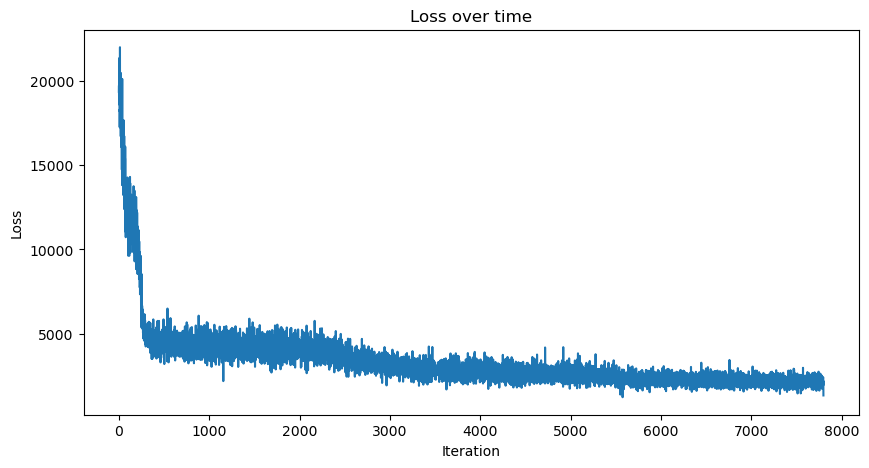

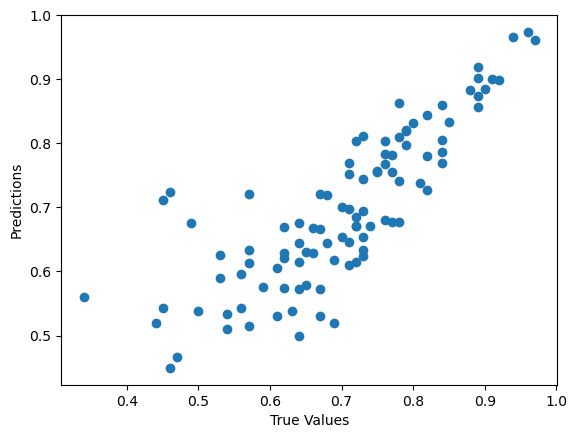

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3       zz1     0  
0  1.012131  0.226090 -1.769014 -0.720096  0.69  
1  1.119013 -0.432403 -1.902829  0.207730  0.61  
2  0.945826  0.326540 -0.866088 -0.542910  0.66  
3  0.394273 -0.448682 -0.963357 -0.099080  0.67  
4 -1.137997 -0.941072 -0.242700 -2.050218  0.46  
heatmap_VAE_xdim6_zdim3_zzdim1_lr0001_bs32_epochs600_b110000_b21_b31_b410000_b51_encZ10_10_10_encZZ10_10_dec10_10_10_

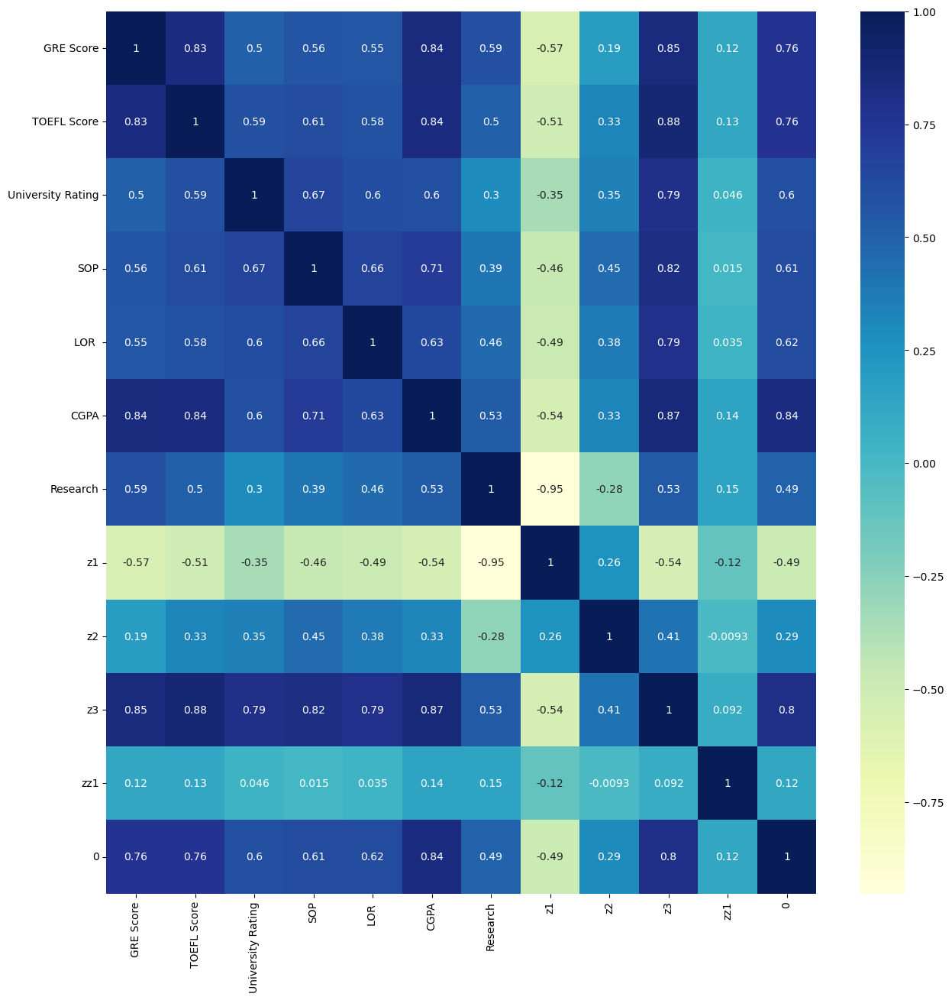

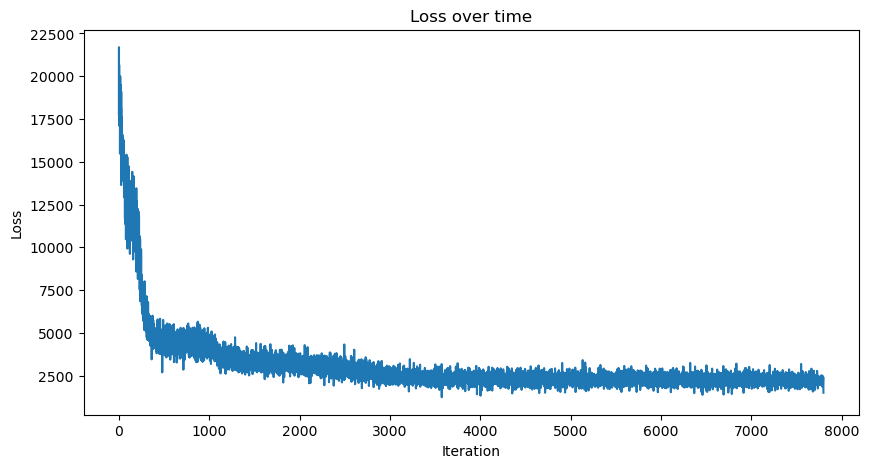

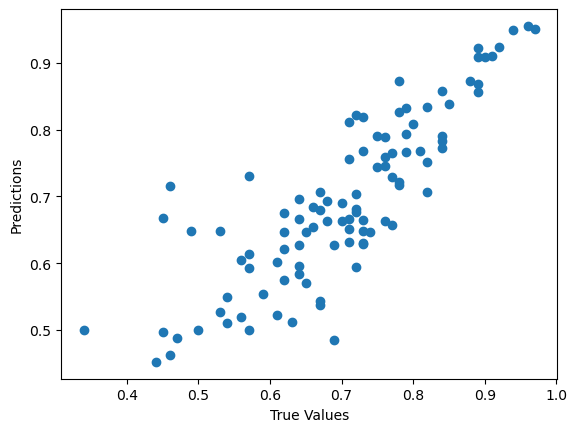

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3       zz1     0  
0  1.256994 -1.905663  0.782671  1.303948  0.69  
1  0.679220 -1.923937  0.726243 -0.464218  0.61  
2  0.979926 -1.389459 -0.274203  0.353336  0.66  
3  1.978089 -1.631913 -0.203283  0.830324  0.67  
4 -1.328136  0.789379  0.229823 -0.507548  0.46  
heatmap_VAE_xdim6_zdim3_zzdim1_lr0001_bs32_epochs600_b110000_b21_b31_b410000_b51_encZ10_10_10_encZZ10_10_dec10_10_10_

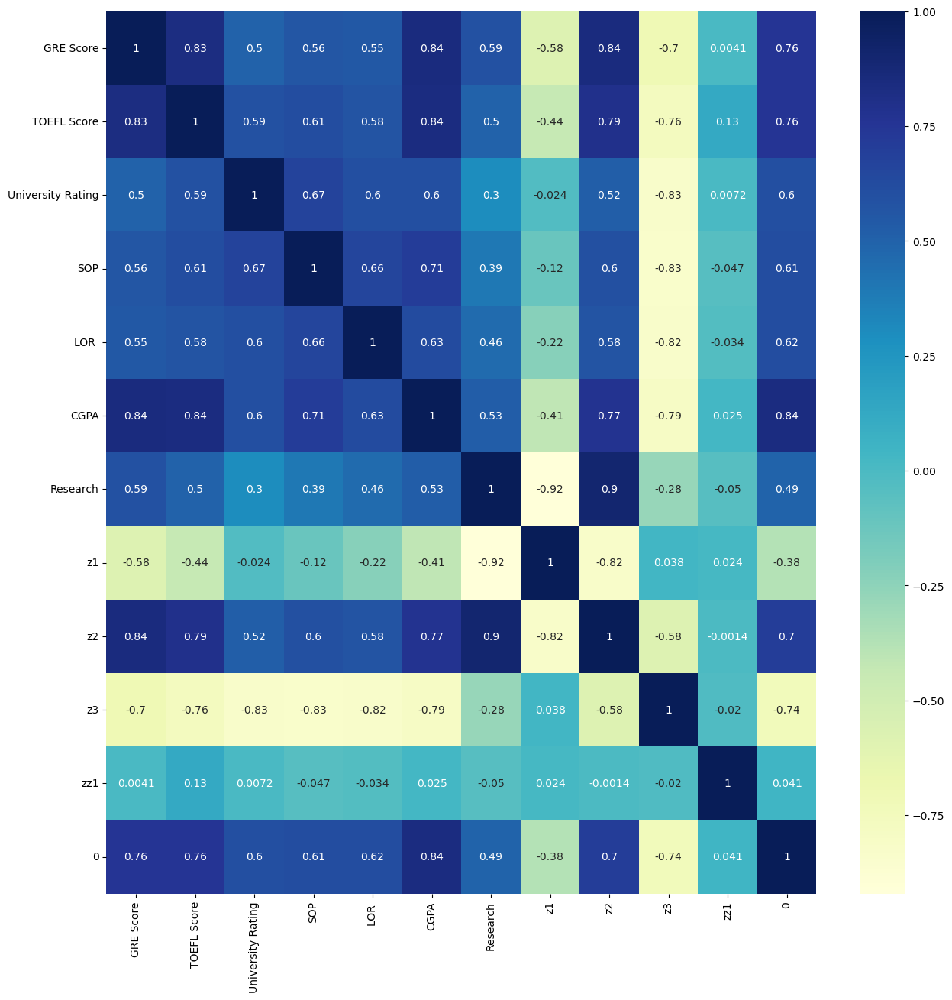

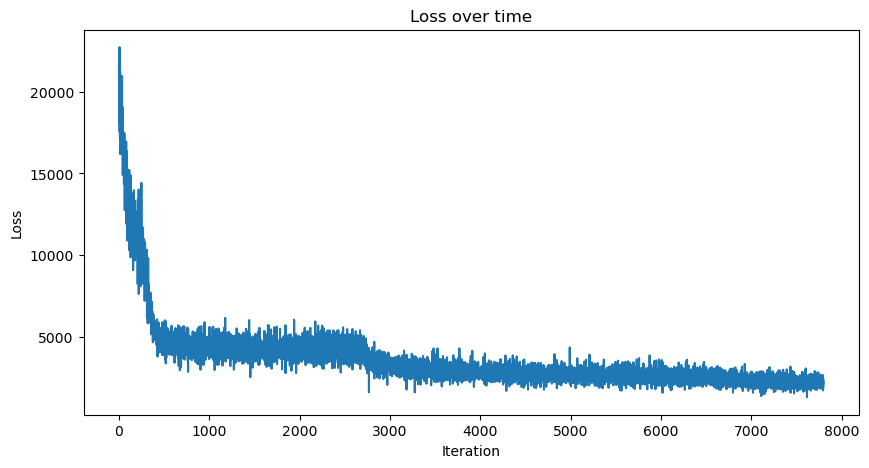

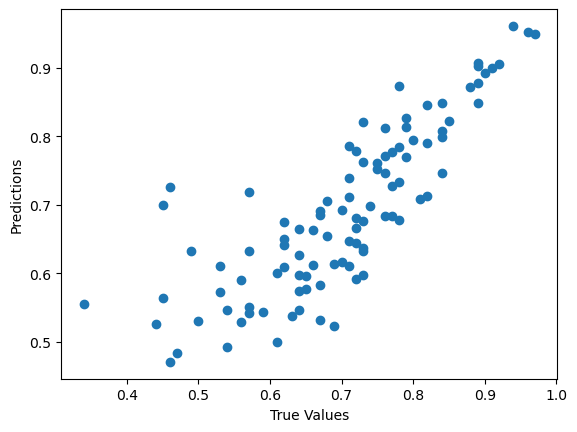

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3       zz1     0  
0 -0.942558 -0.164175  0.913758  0.712841  0.69  
1 -1.119678  0.555146  0.760218  0.568459  0.61  
2 -0.238867  0.684478  0.763413  0.237685  0.66  
3 -0.183152  1.004192  0.553897 -0.080302  0.67  
4  0.523904 -0.657686 -1.691497 -1.796330  0.46  
heatmap_VAE_xdim6_zdim3_zzdim1_lr0001_bs32_epochs600_b110000_b21_b31_b410000_b51_encZ10_10_10_encZZ10_10_dec10_10_10_

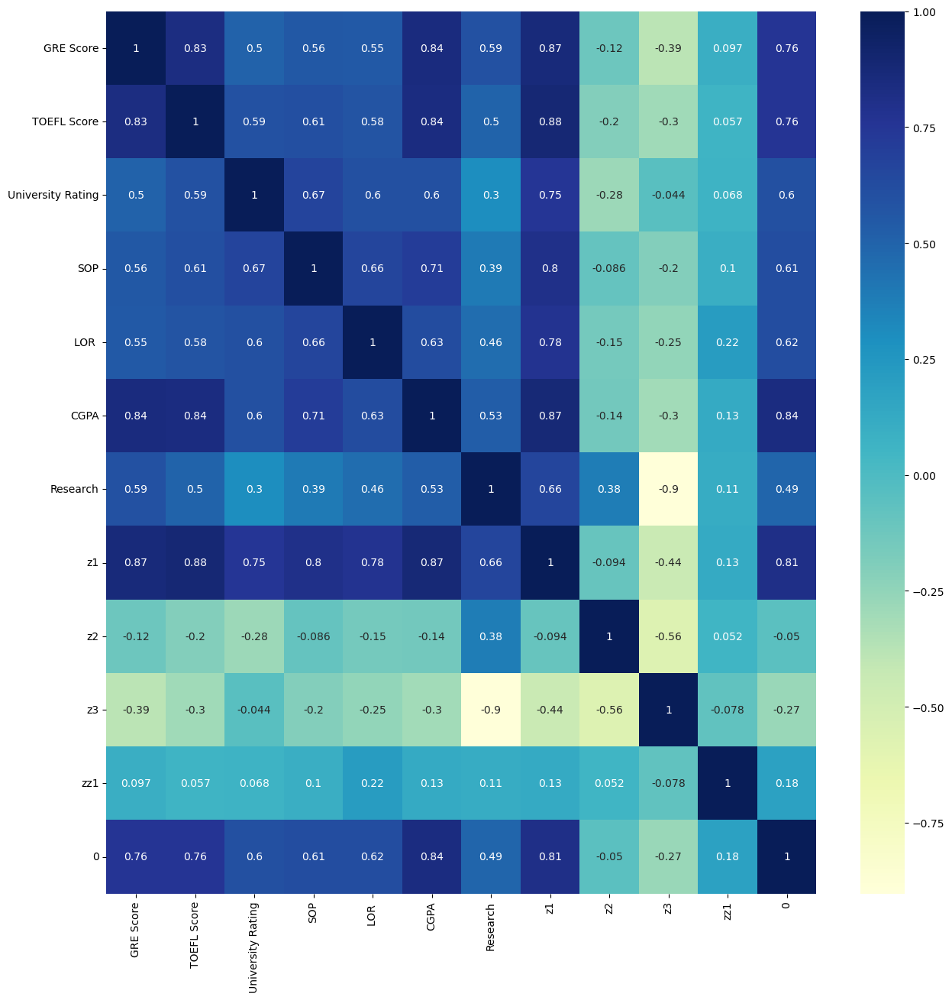

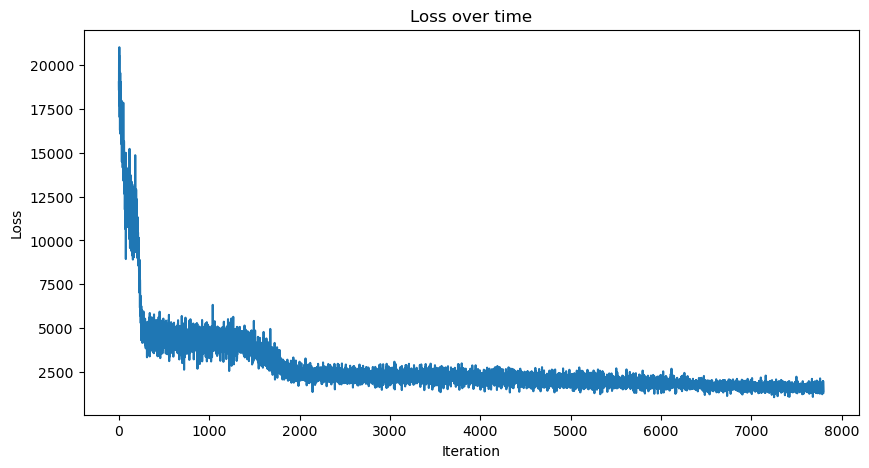

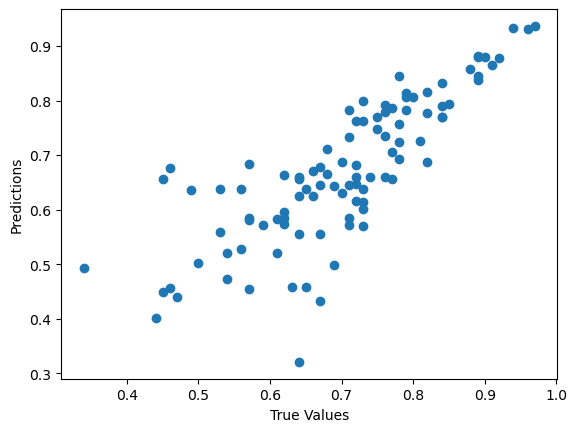

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3       zz1     0  
0 -1.708282  1.059080  0.662902  1.356098  0.69  
1 -1.681283  1.245139  0.178687 -0.969929  0.61  
2 -0.941735  0.309517  0.814870  0.235668  0.66  
3 -0.843511  1.483244  1.164855 -0.339002  0.67  
4  0.320406  0.723116 -1.255986  1.833550  0.46  
heatmap_VAE_xdim6_zdim3_zzdim1_lr0001_bs32_epochs600_b110000_b21_b31_b410000_b51_encZ10_10_10_encZZ10_10_dec10_10_10_

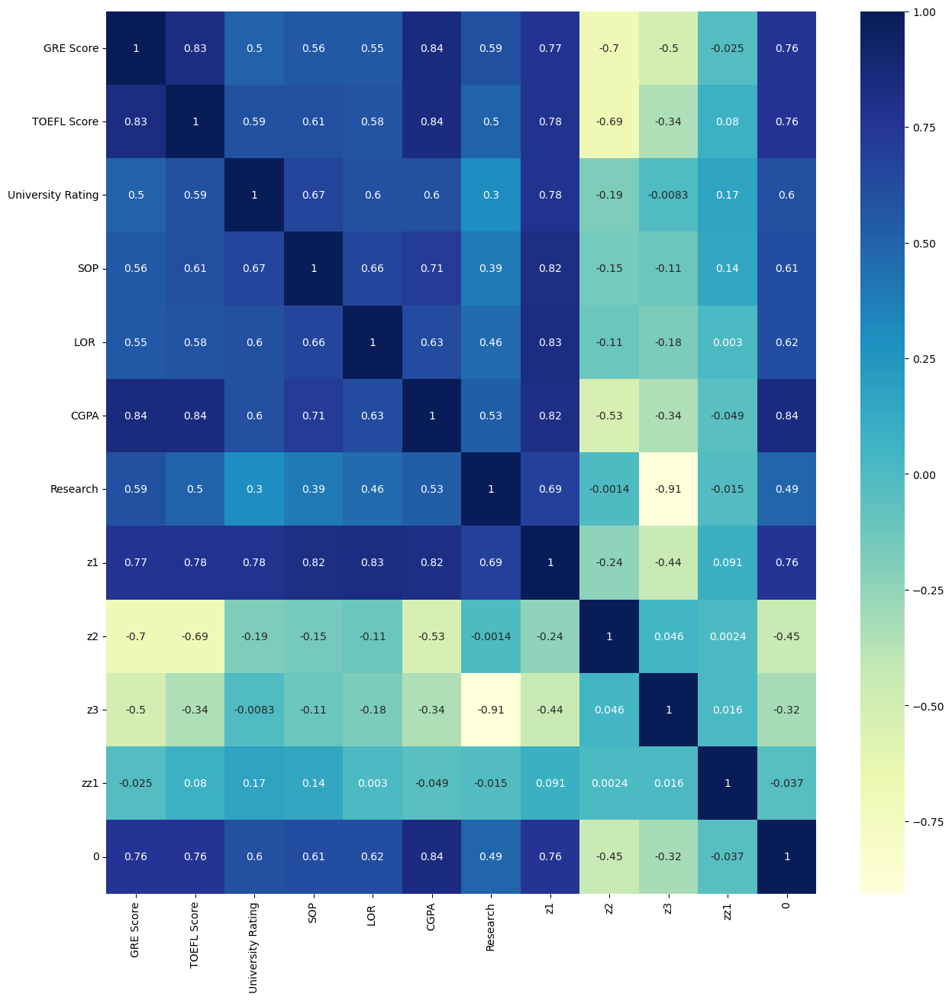

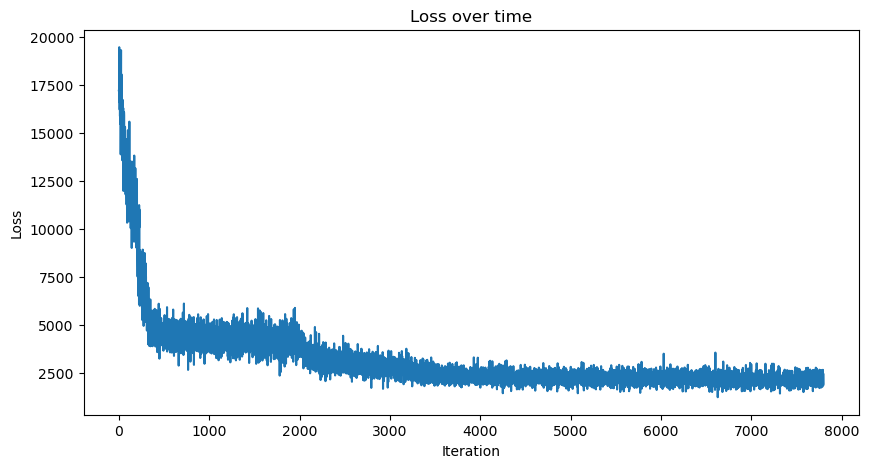

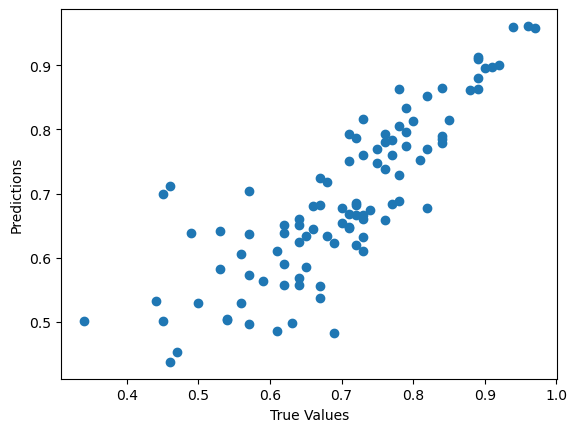

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3       zz1     0  
0  1.151776  1.994032 -1.630349  0.766353  0.69  
1  0.785292 -1.173545 -1.713797  0.153862  0.61  
2  1.299126  0.000109 -0.667165 -0.140309  0.66  
3  1.762099 -0.022807 -1.082313  0.290750  0.67  
4 -0.788500  1.776823  0.615400 -1.211423  0.46  
heatmap_VAE_xdim6_zdim3_zzdim1_lr0001_bs32_epochs600_b110000_b21_b31_b410000_b51_encZ10_10_10_encZZ10_10_dec10_10_10_

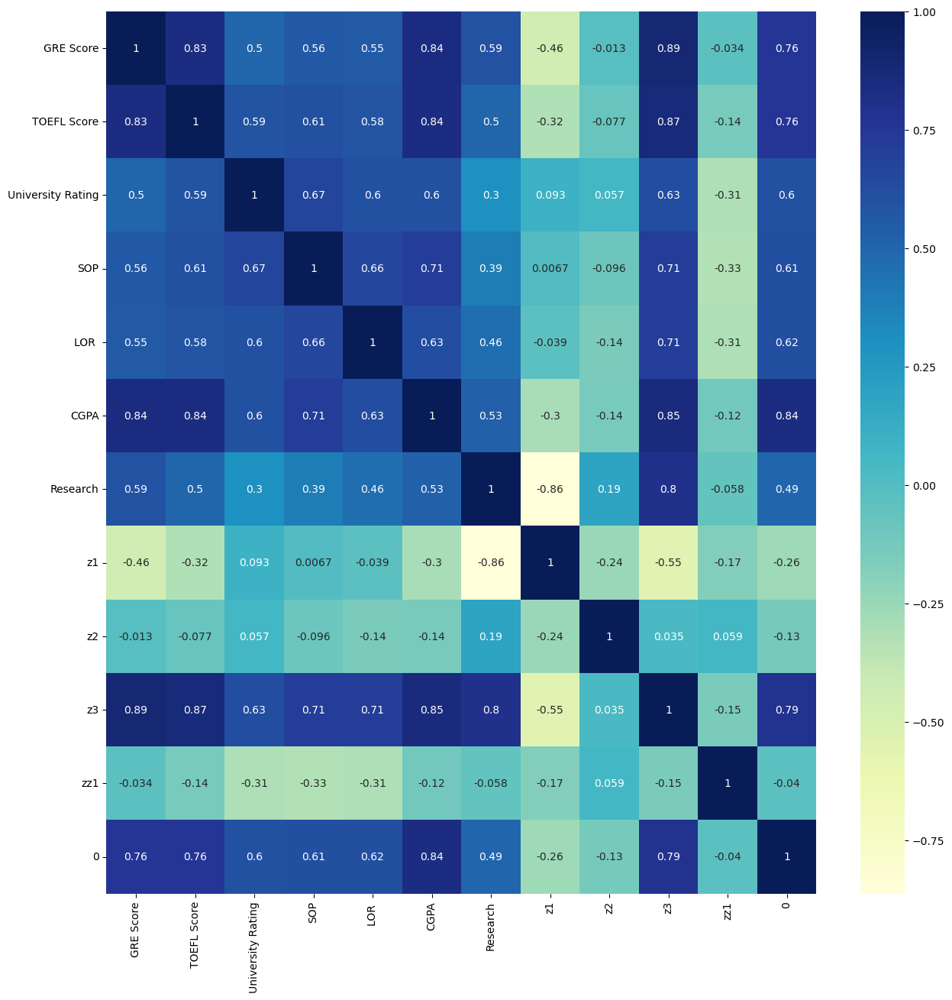

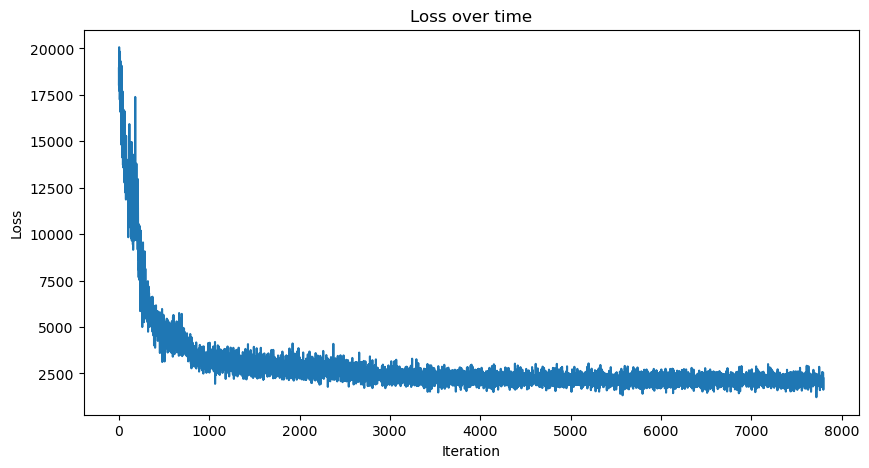

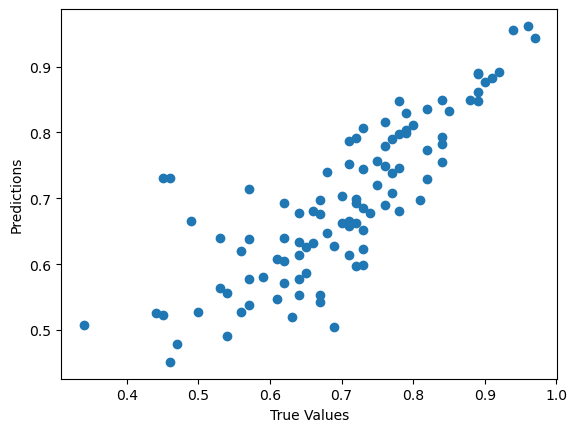

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3       zz1     0  
0  1.303911 -0.629296 -0.115022 -1.077021  0.69  
1  1.186229 -0.442762 -0.737196  2.426111  0.61  
2  0.186571 -0.948902  0.422212  1.008586  0.66  
3  0.762873 -1.316913 -1.261454 -0.277521  0.67  
4 -0.473008  1.429019 -0.211561  0.486800  0.46  
heatmap_VAE_xdim6_zdim3_zzdim1_lr0001_bs32_epochs600_b110000_b21_b31_b410000_b51_encZ10_10_10_encZZ10_10_dec10_10_10_

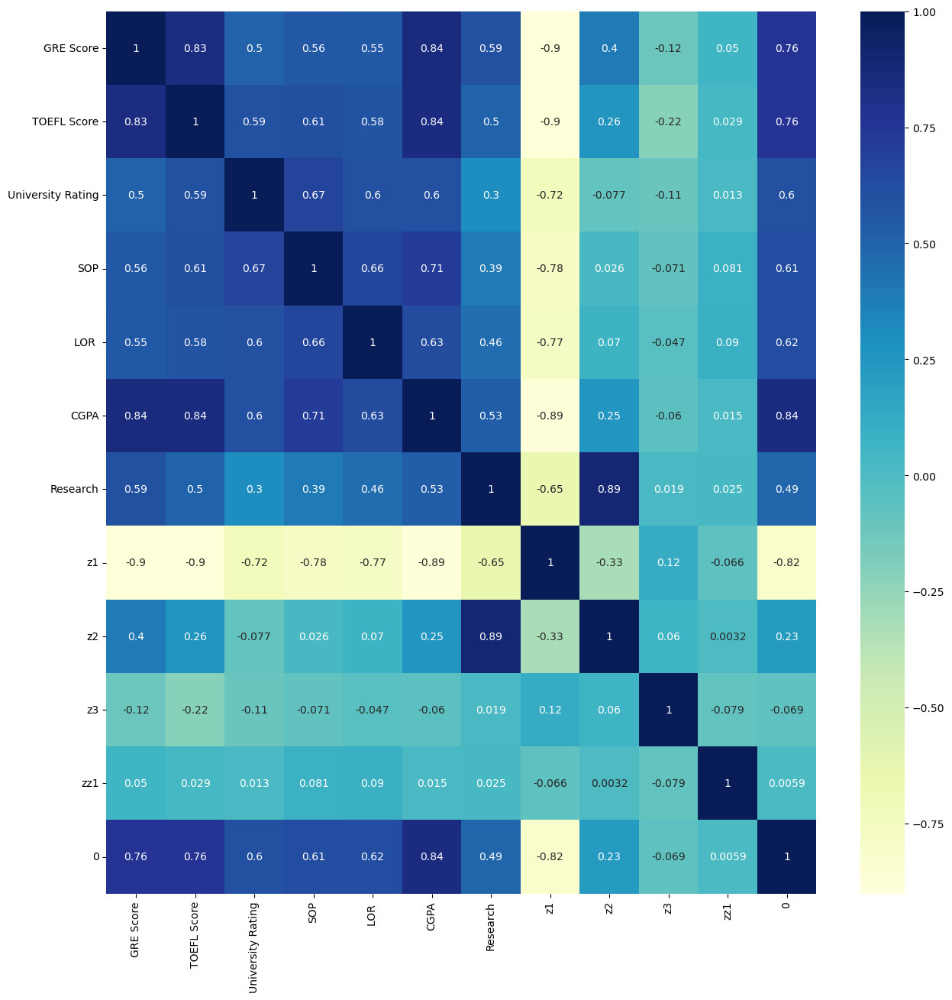

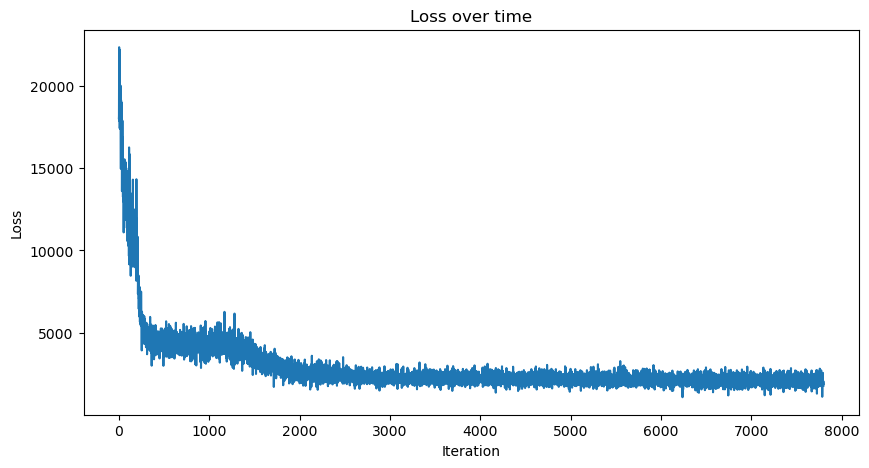

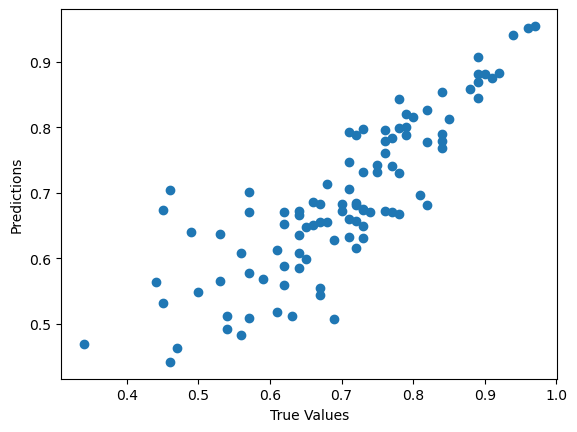

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3       zz1     0  
0 -1.905789  0.490921  0.148832  1.739612  0.69  
1 -1.917822  0.497175 -0.194608 -0.331075  0.61  
2 -1.042454  0.622157  0.499564  0.340234  0.66  
3 -1.512615  1.034236  1.111694 -2.210092  0.67  
4  0.465422 -1.850957 -1.323571  0.275014  0.46  
heatmap_VAE_xdim6_zdim3_zzdim1_lr0001_bs32_epochs600_b110000_b21_b31_b410000_b51_encZ10_10_10_encZZ10_10_dec10_10_10_

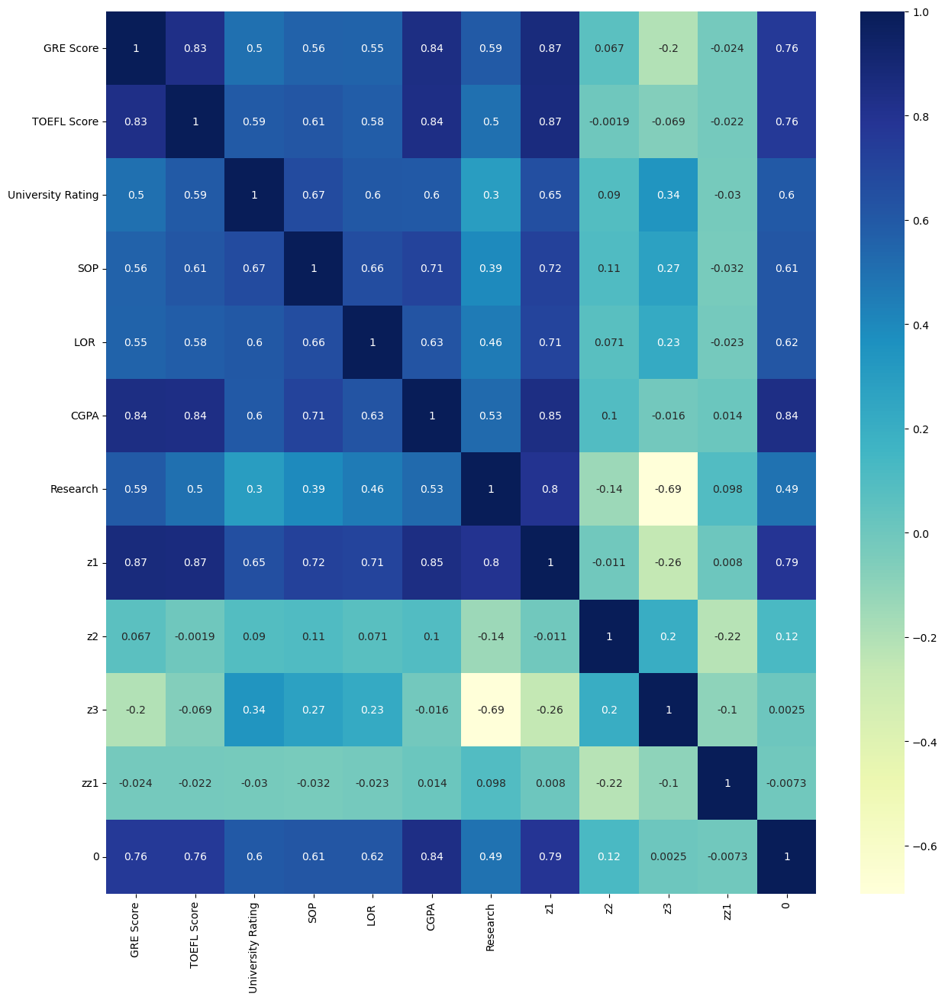

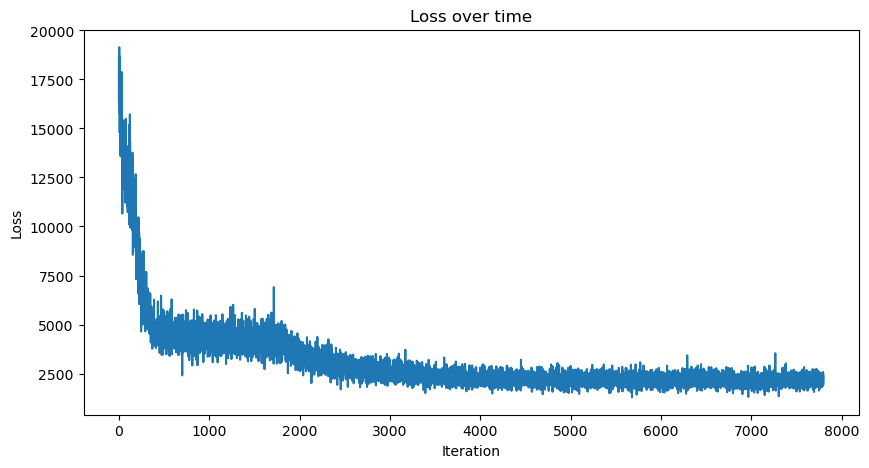

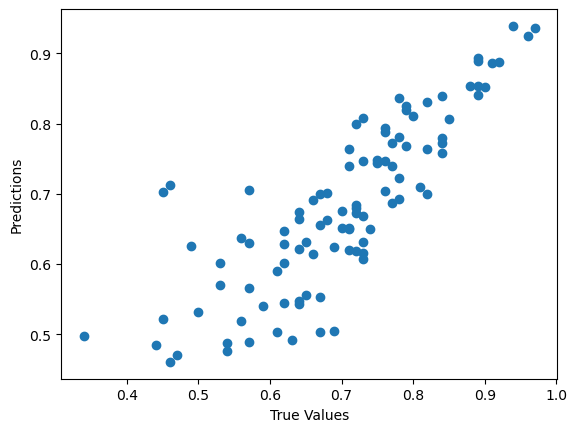

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3       zz1     0  
0 -0.433201  0.568781 -1.632247  0.477692  0.69  
1  0.274884  0.521914 -1.809439 -0.256686  0.61  
2 -0.962402  0.930534 -0.886268  0.744594  0.66  
3 -0.220649  1.239490 -1.118053 -1.032115  0.67  
4 -0.609874 -1.301348  0.210962 -0.738903  0.46  
heatmap_VAE_xdim6_zdim3_zzdim1_lr0001_bs32_epochs600_b110000_b21_b31_b410000_b51_encZ10_10_10_encZZ10_10_dec10_10_10_

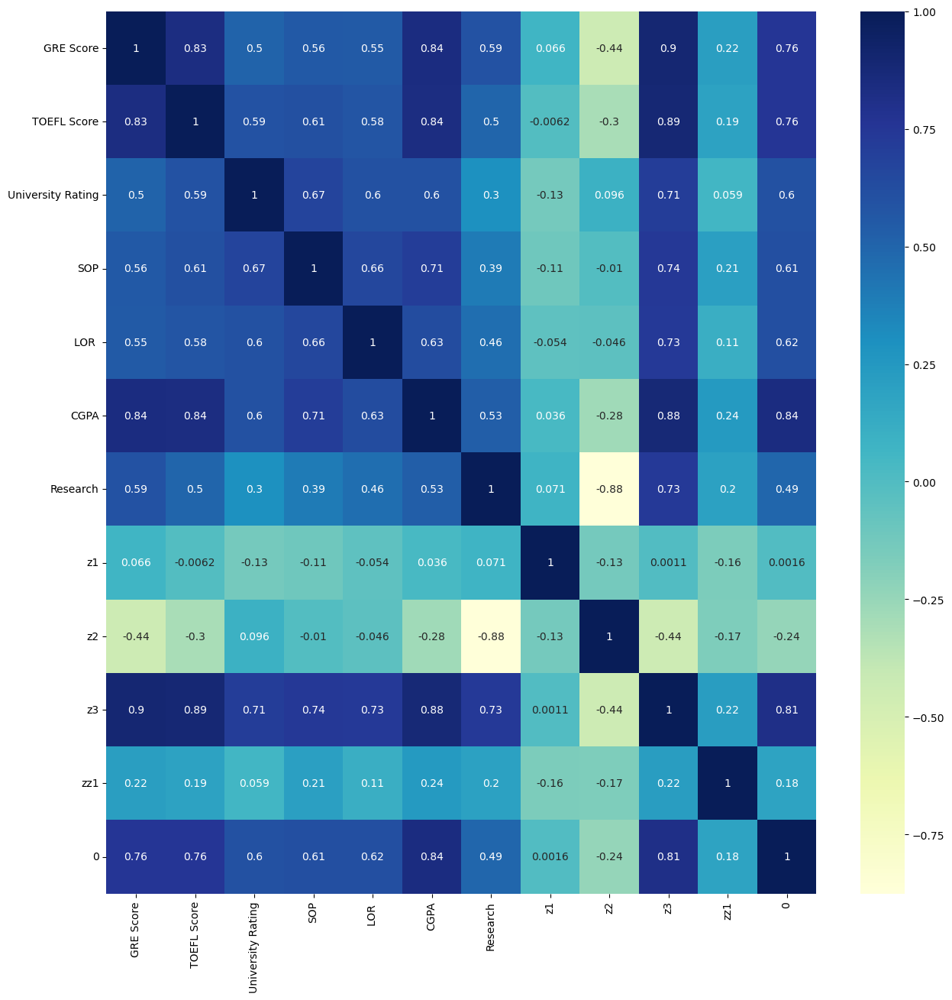

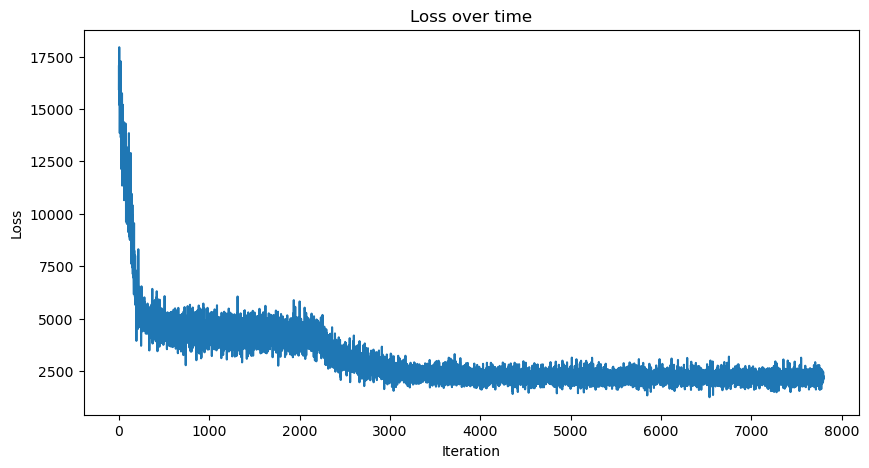

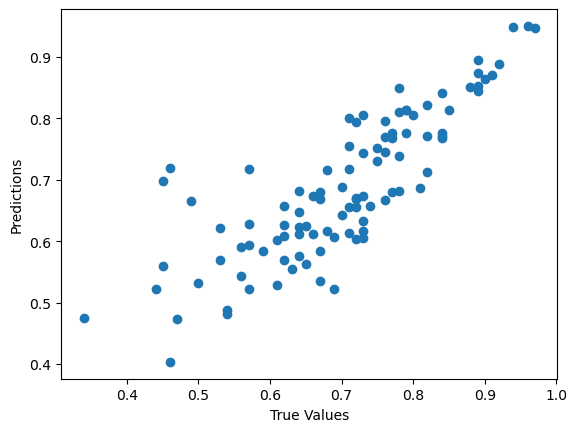

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3       zz1     0  
0 -1.664390 -0.128845  0.291684  0.512820  0.69  
1 -1.693788  0.100395  0.010250  0.246306  0.61  
2 -0.874472 -0.442446 -0.074789 -1.080514  0.66  
3 -1.174576 -0.913145  0.027182  0.277495  0.67  
4  0.629333  1.378607  0.114171 -1.040310  0.46  
heatmap_VAE_xdim6_zdim3_zzdim1_lr0001_bs32_epochs600_b110000_b21_b31_b410000_b51_encZ10_10_10_encZZ10_10_dec10_10_10_

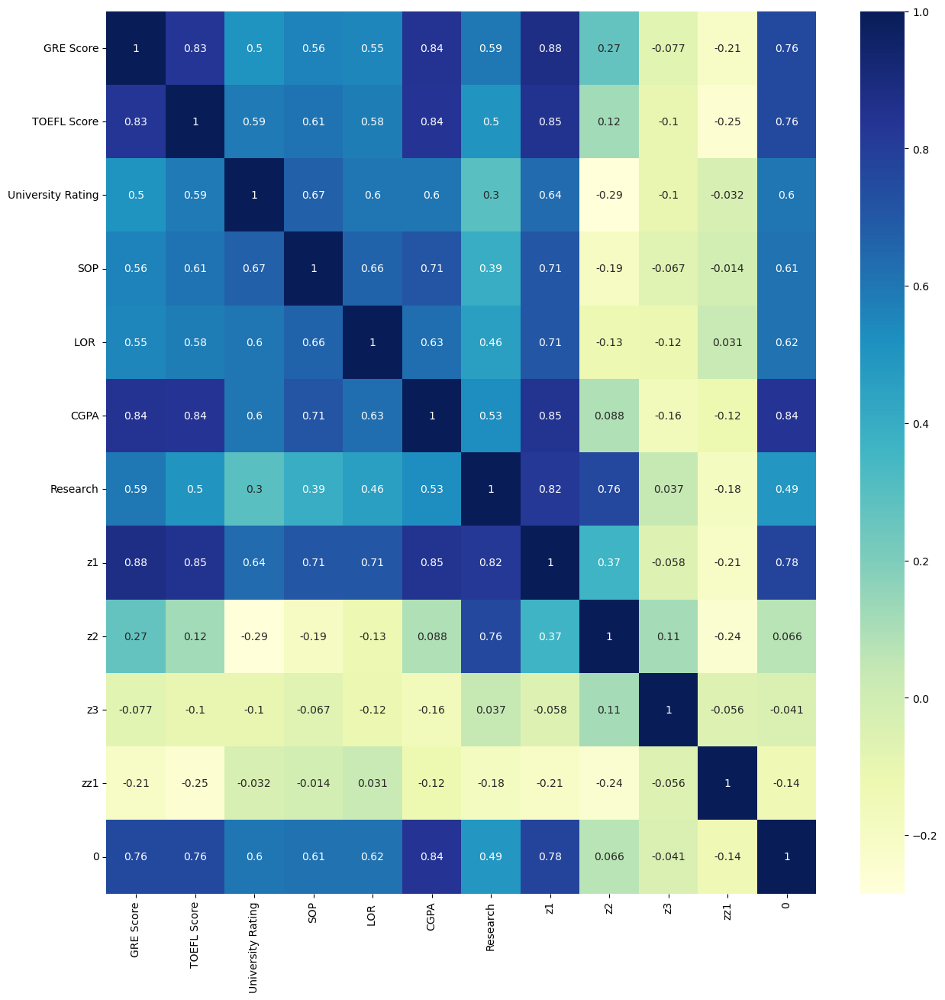

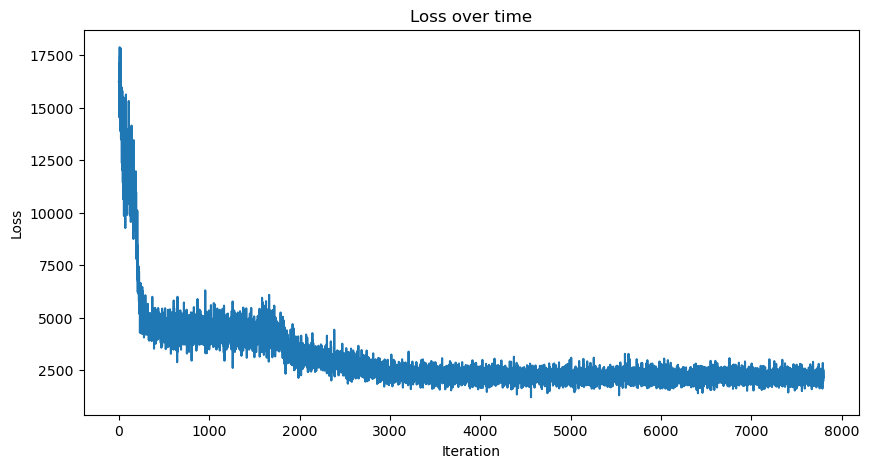

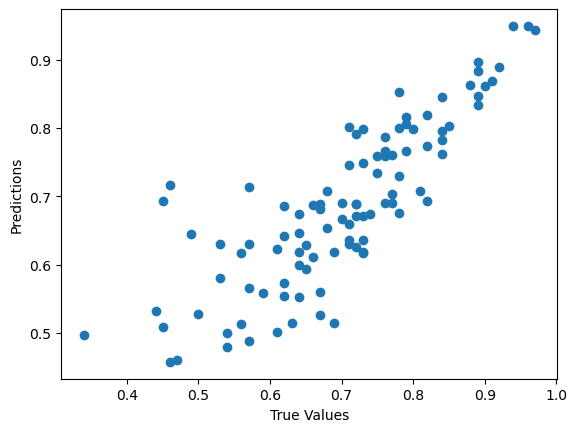

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3       zz1     0  
0  1.153838 -1.170720  0.281071 -1.208285  0.69  
1  1.284208 -0.941899  0.136632 -1.269504  0.61  
2  0.472763 -1.272202 -0.790908  0.259477  0.66  
3  0.602549 -1.624263  0.639560  0.463247  0.67  
4 -0.636709  1.111515  0.853429  0.052327  0.46  
heatmap_VAE_xdim6_zdim3_zzdim1_lr0001_bs32_epochs600_b110000_b21_b31_b410000_b51_encZ10_10_10_encZZ10_10_dec10_10_10_

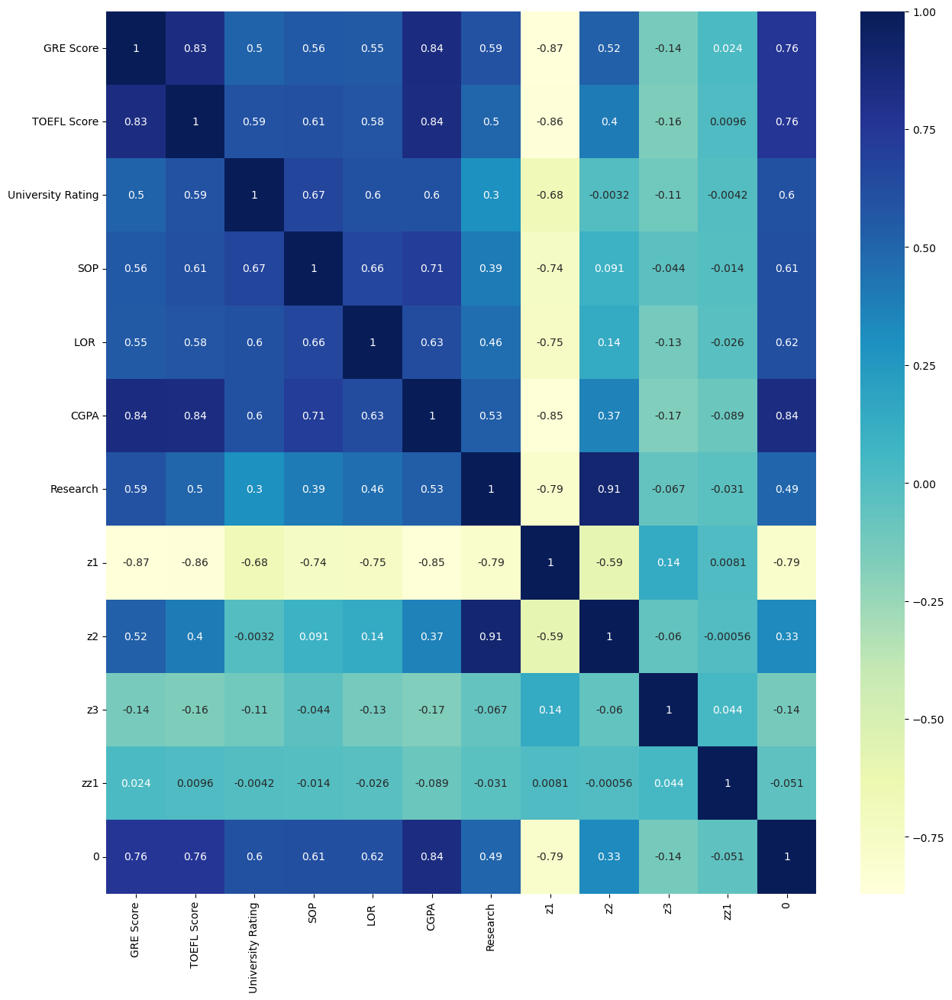

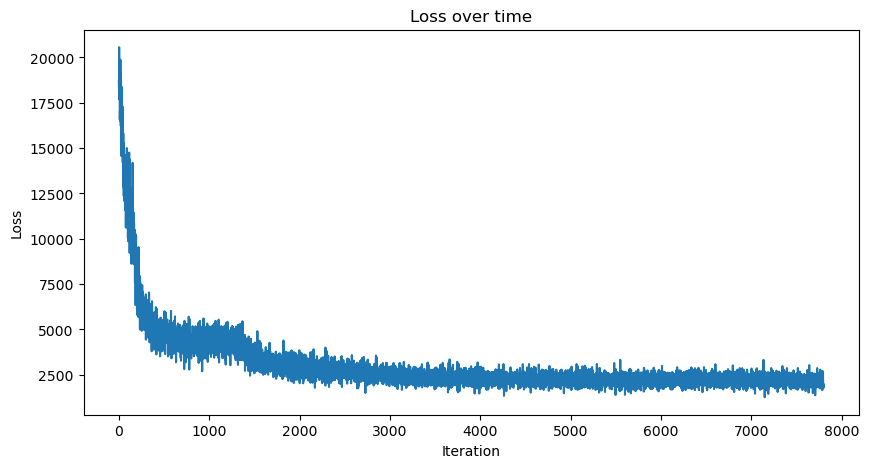

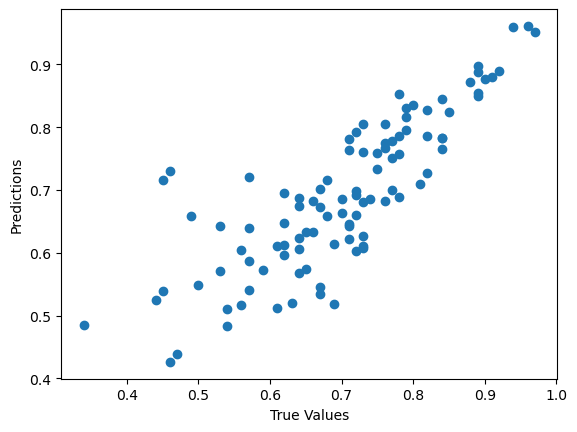

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3       zz1     0  
0  0.755617  1.149924  0.145383 -0.985022  0.69  
1  0.824609  0.905485 -0.444335  0.287909  0.61  
2  0.166977  1.332226  0.761223  0.154333  0.66  
3  0.366114  1.595817  0.519838  0.114910  0.67  
4 -0.691814 -1.125627 -0.370969  0.792132  0.46  
heatmap_VAE_xdim6_zdim3_zzdim1_lr0001_bs32_epochs600_b110000_b21_b31_b410000_b51_encZ10_10_10_encZZ10_10_dec10_10_10_

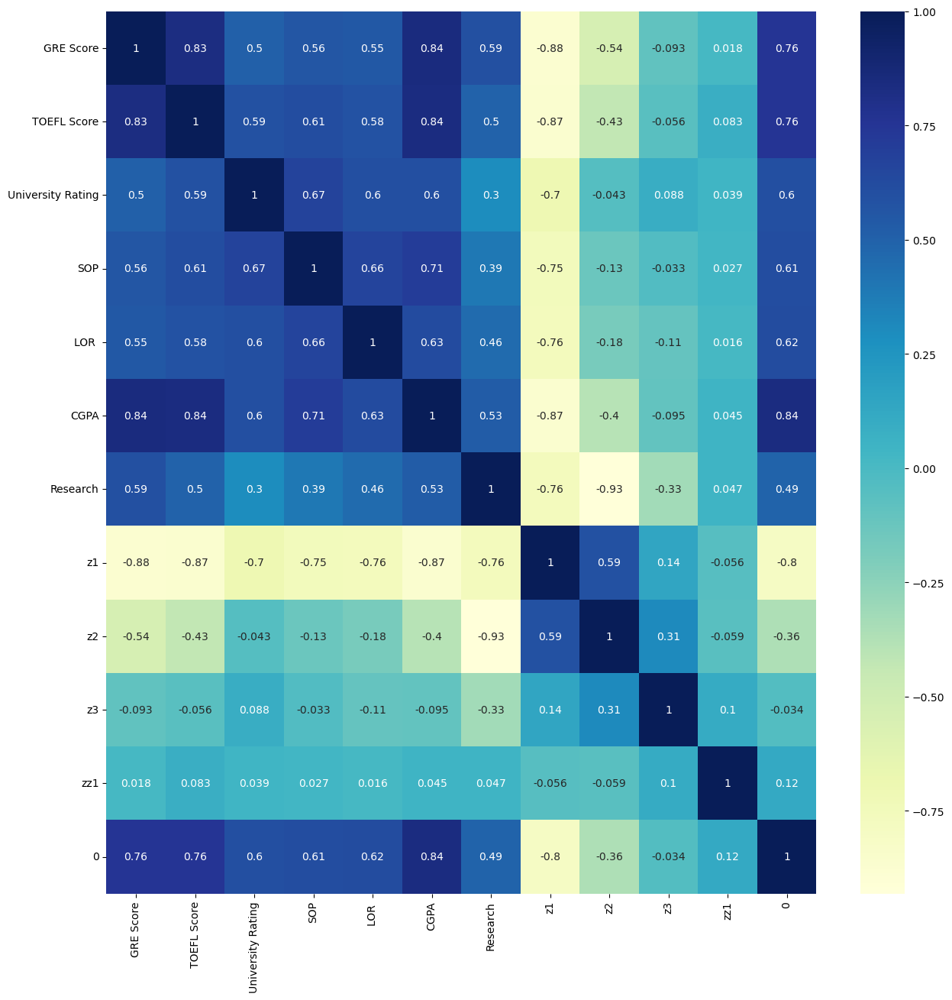

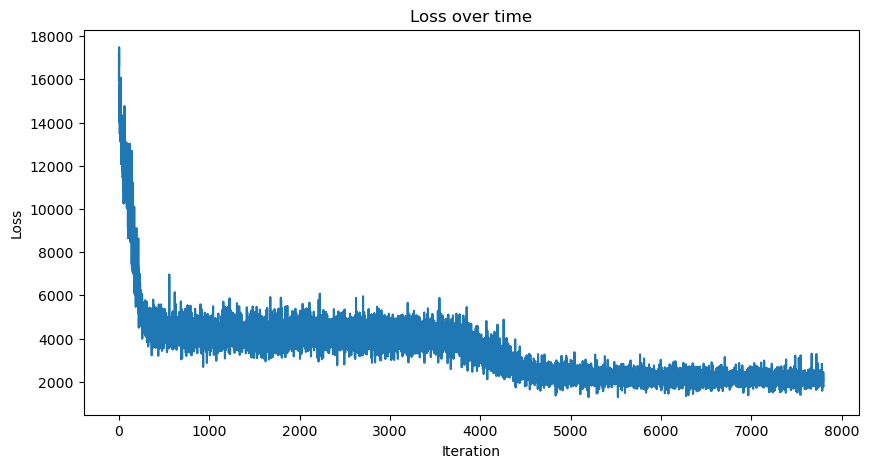

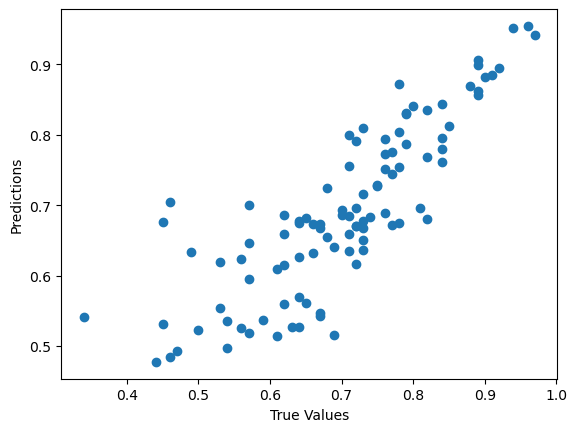

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3       zz1     0  
0 -0.839355  1.830146 -0.437592  0.022884  0.69  
1 -0.846908  1.909762  0.611385 -0.185707  0.61  
2  0.646428  1.170364 -0.728596 -0.802320  0.66  
3  0.048262  1.104754  0.316845 -0.157703  0.67  
4 -0.975511 -0.546130 -0.795402 -0.550471  0.46  
heatmap_VAE_xdim6_zdim3_zzdim1_lr0001_bs32_epochs600_b110000_b21_b31_b410000_b51_encZ10_10_10_encZZ10_10_dec10_10_10_

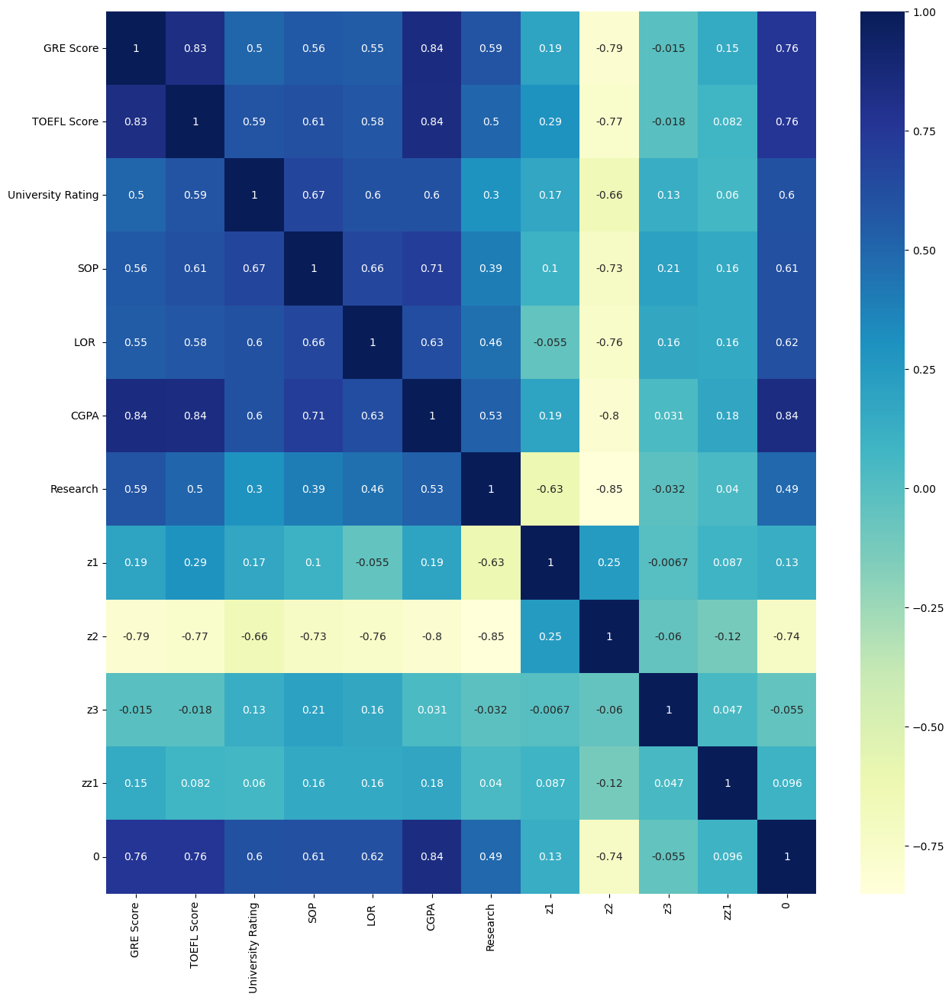

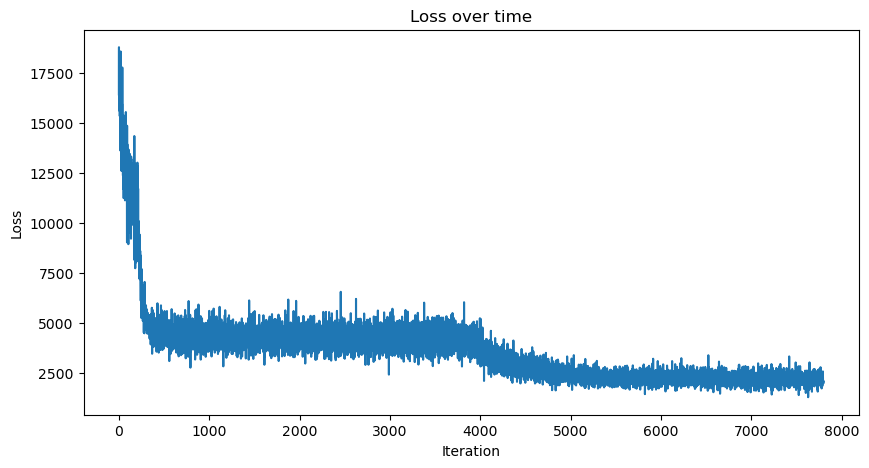

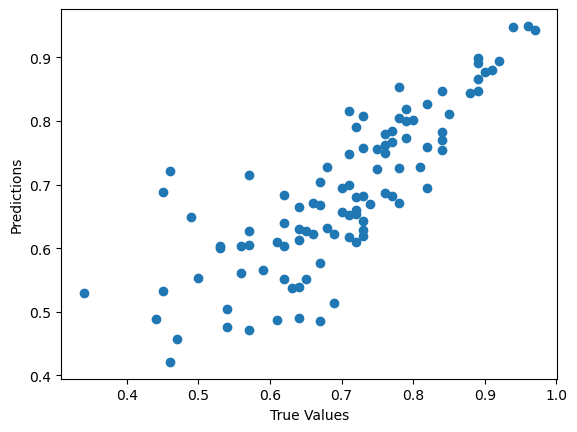

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3       zz1     0  
0  1.649795 -0.521869  0.542650 -2.012341  0.69  
1  1.728995 -0.351735 -0.321208  0.308709  0.61  
2  0.813980 -0.868220  1.462514  0.049168  0.66  
3  0.819521 -0.529888 -0.894207 -0.373774  0.67  
4 -0.250372  1.268635  0.297754  1.351365  0.46  
heatmap_VAE_xdim6_zdim3_zzdim1_lr0001_bs32_epochs600_b110000_b21_b31_b410000_b51_encZ10_10_10_encZZ10_10_dec10_10_10_

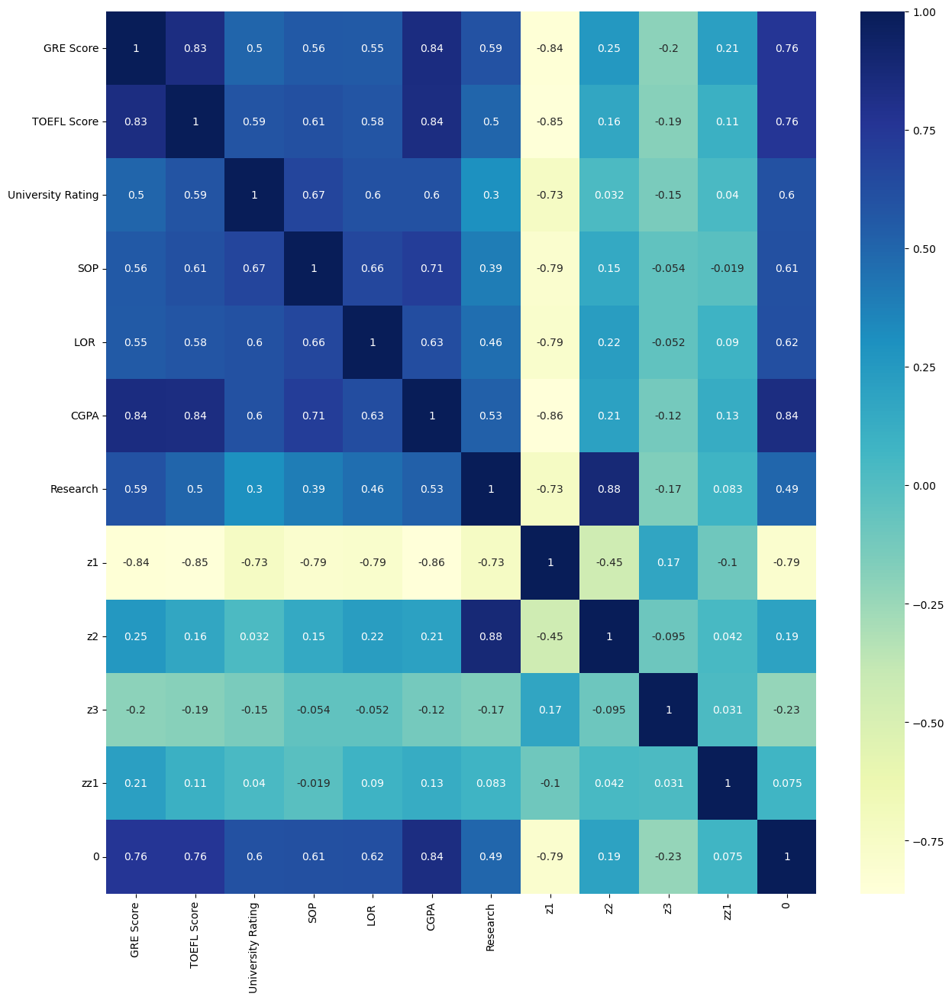

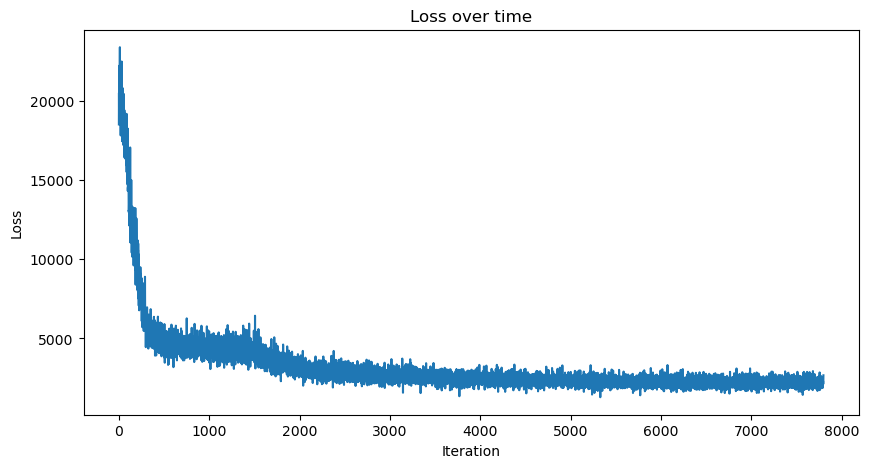

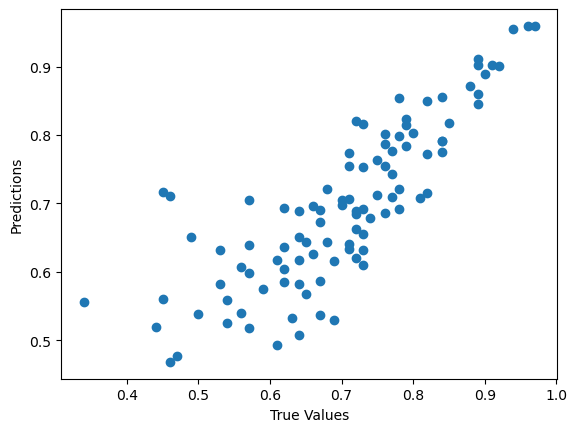

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3       zz1     0  
0  0.918528 -1.078885 -0.060097 -0.757707  0.69  
1  0.814282 -1.080288 -0.158906 -0.525588  0.61  
2  1.423725 -1.175002  0.406776 -0.176922  0.66  
3  0.280792 -0.901263  0.224058 -0.456588  0.67  
4  0.462652  0.999344  0.583932  0.033139  0.46  
heatmap_VAE_xdim6_zdim3_zzdim1_lr0001_bs32_epochs600_b110000_b21_b31_b410000_b51_encZ10_10_10_encZZ10_10_dec10_10_10_

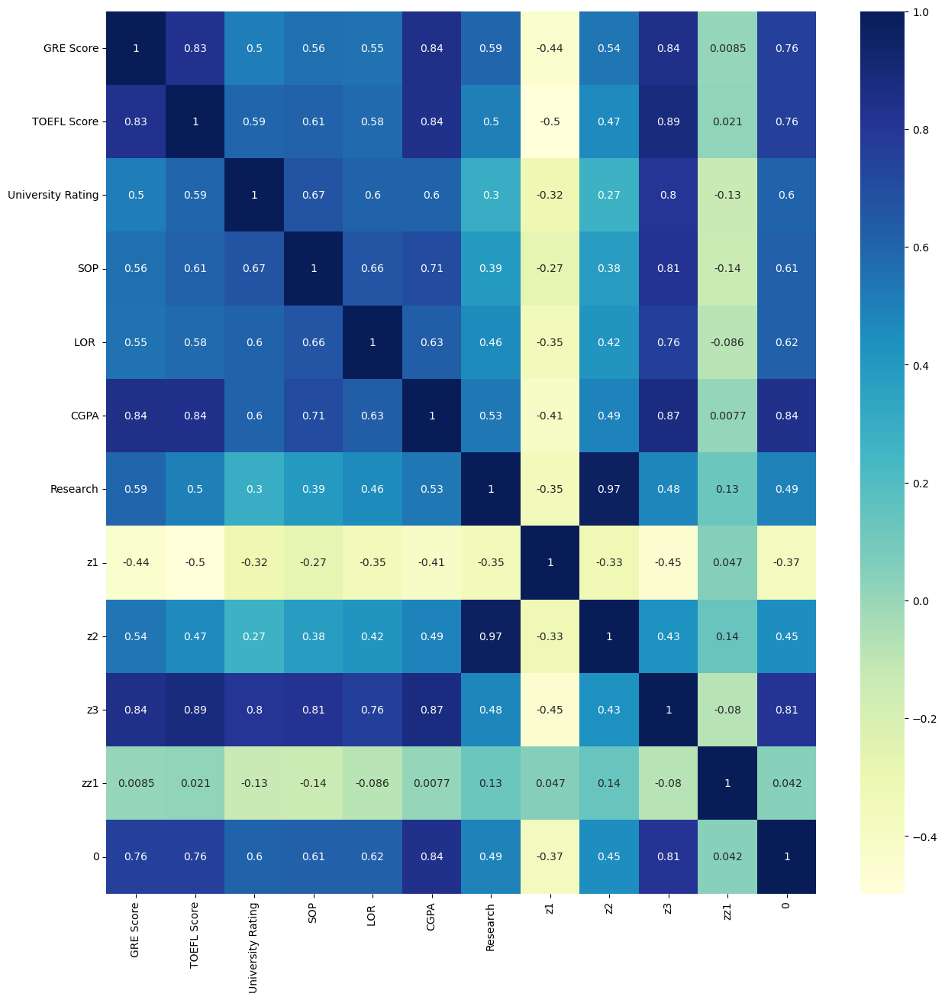

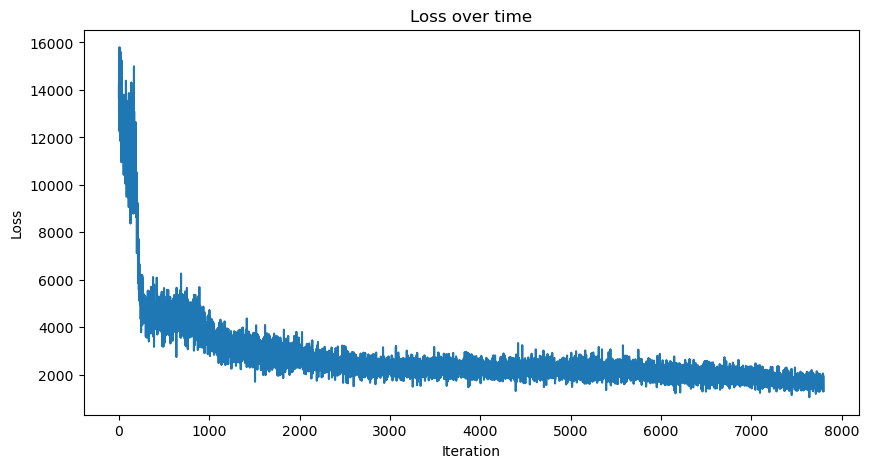

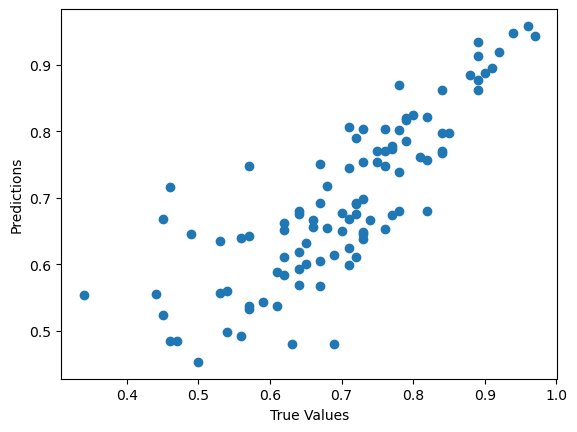

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3       zz1     0  
0 -1.567590  0.937670  0.899089  0.359631  0.69  
1 -1.682675  0.849257  0.084055 -0.222345  0.61  
2 -0.656525  1.043068  0.382124 -0.631759  0.66  
3 -0.797452  1.348229  1.074603  0.013322  0.67  
4  0.163866 -1.304031 -1.220412 -0.011036  0.46  
heatmap_VAE_xdim6_zdim3_zzdim1_lr0001_bs32_epochs600_b110000_b21_b31_b410000_b51_encZ10_10_10_encZZ10_10_dec10_10_10_

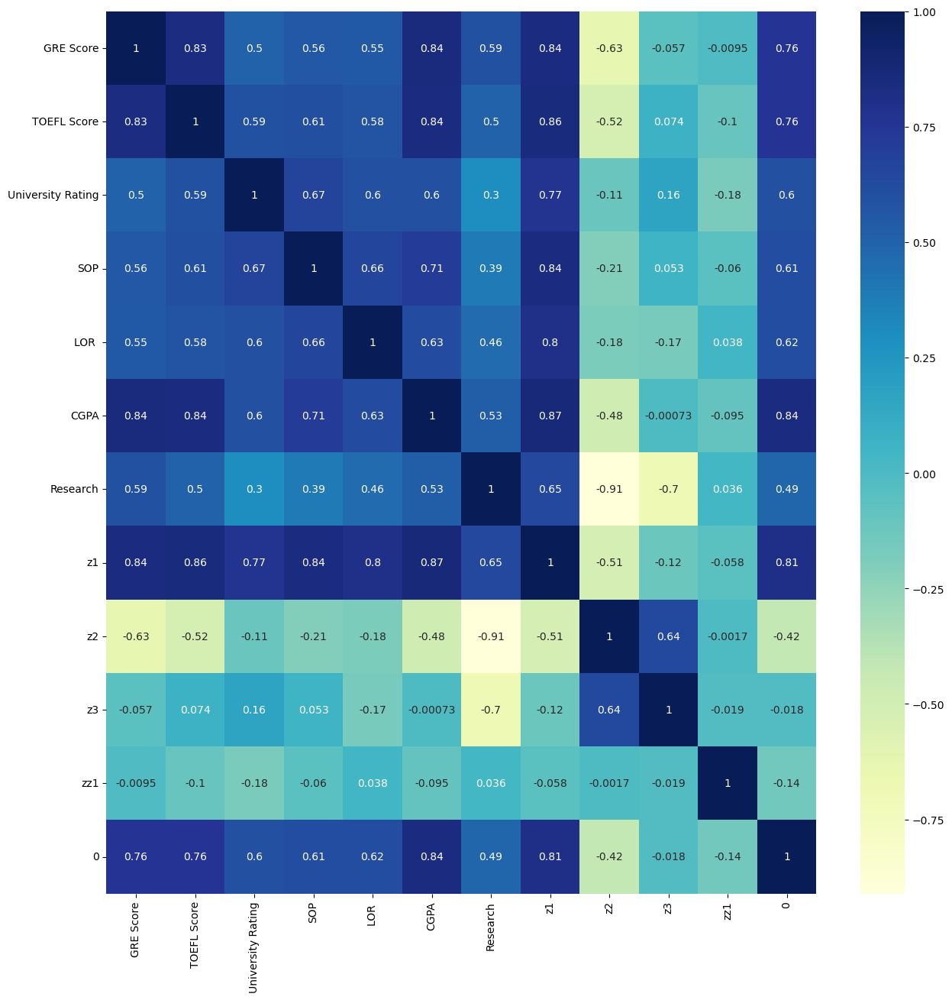

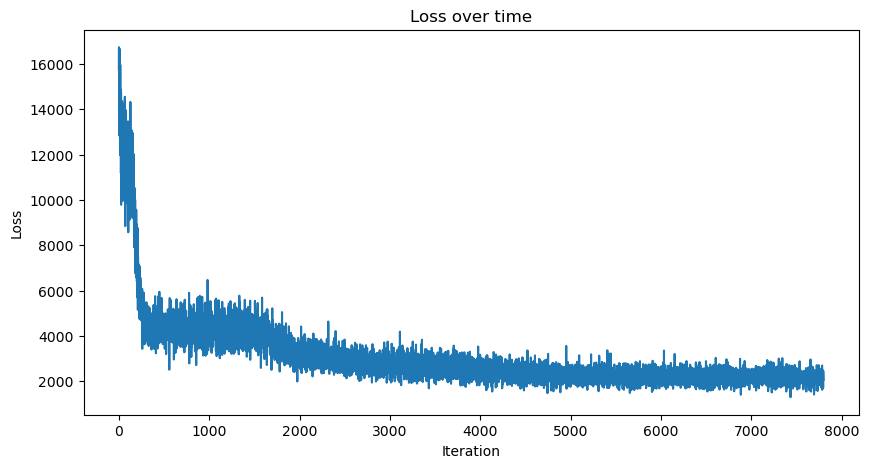

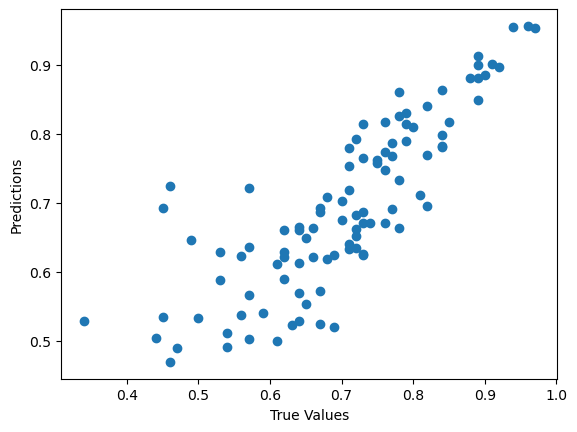

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3       zz1     0  
0  0.318954  1.670545  2.492553 -0.444289  0.69  
1  0.569322  1.775506 -0.982901  0.386623  0.61  
2 -0.485992  1.161734 -0.305615  0.597908  0.66  
3 -0.159675  1.127005  1.051360  1.177195  0.67  
4  0.359531 -0.433174  0.710949 -0.358875  0.46  
heatmap_VAE_xdim6_zdim3_zzdim1_lr0001_bs32_epochs600_b110000_b21_b31_b410000_b51_encZ10_10_10_encZZ10_10_dec10_10_10_

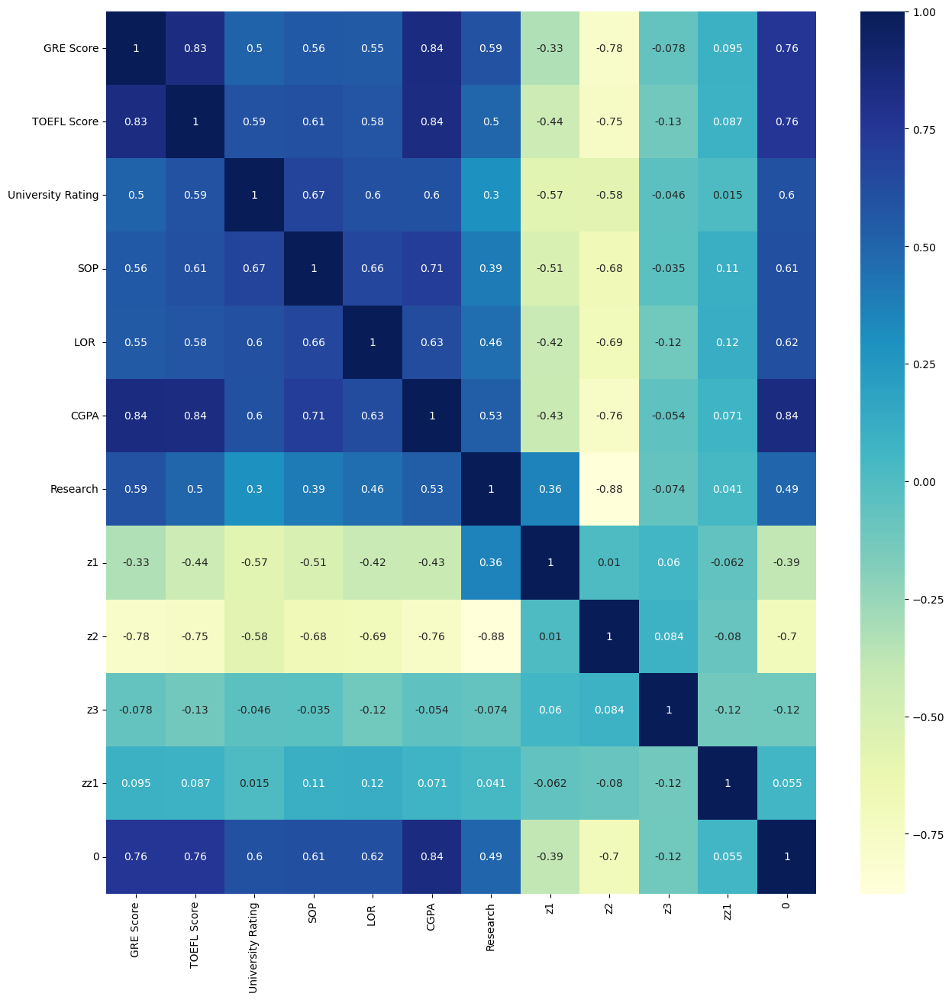

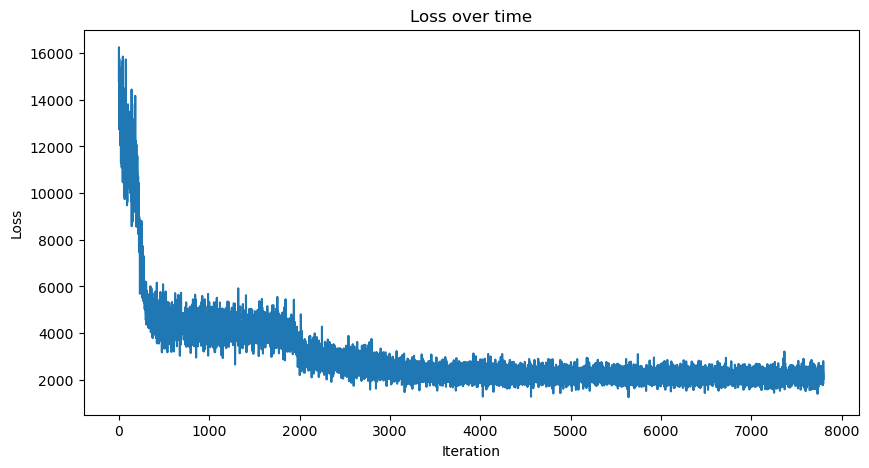

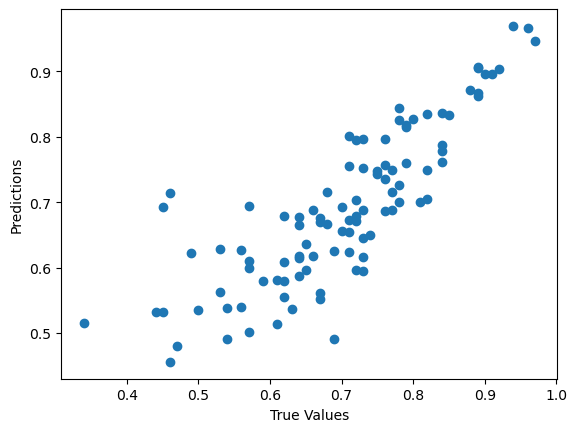

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3       zz1     0  
0 -1.881060 -0.694054 -1.202125 -0.278787  0.69  
1 -1.849146 -0.313806 -1.207568 -2.345164  0.61  
2 -1.123328 -1.077339 -1.370814  1.555390  0.66  
3 -1.417418 -1.467178 -1.465569  0.379293  0.67  
4 -0.026642  1.361045  0.106239 -0.219484  0.46  
heatmap_VAE_xdim6_zdim3_zzdim1_lr0001_bs32_epochs600_b110000_b21_b31_b410000_b51_encZ10_10_10_encZZ10_10_dec10_10_10_

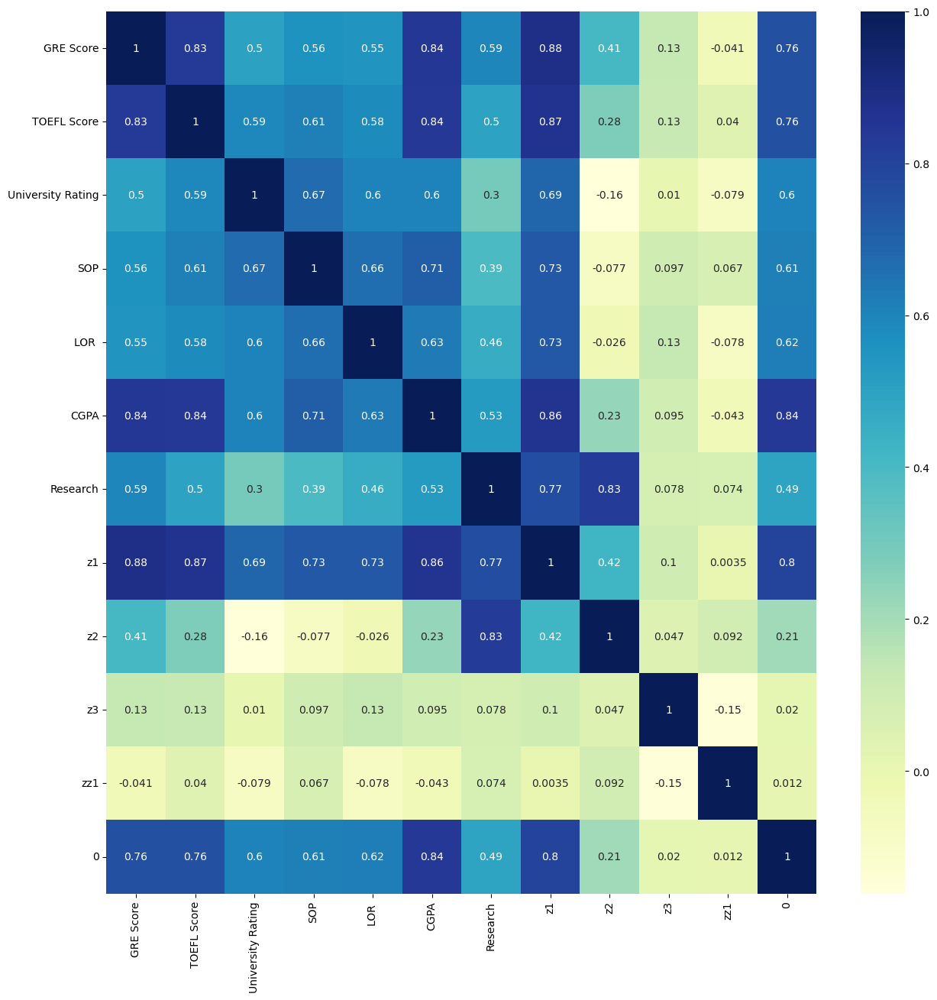

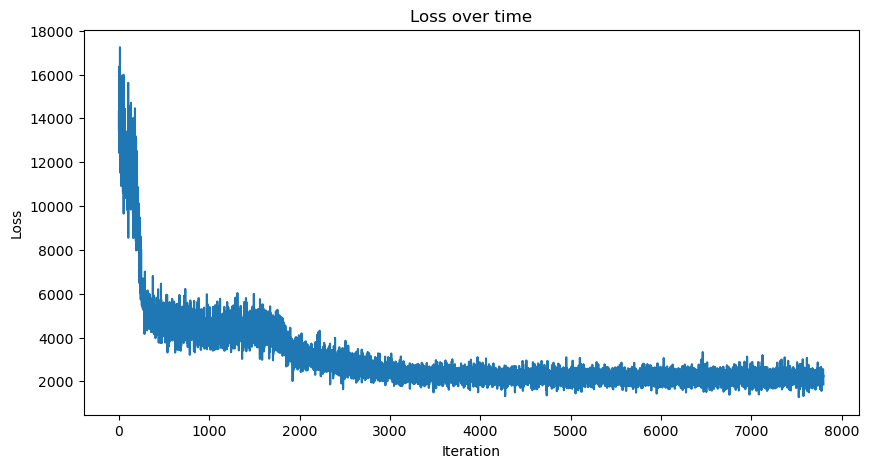

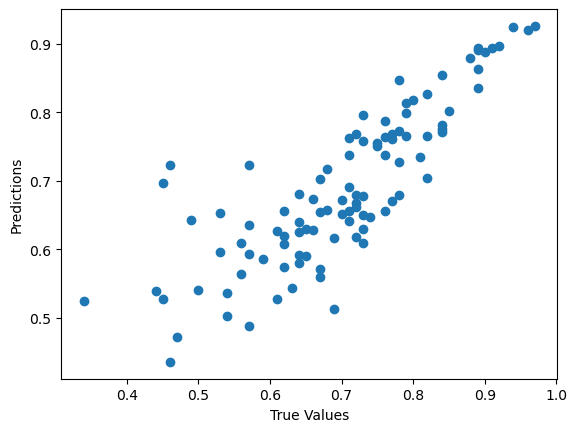

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3       zz1     0  
0 -1.793514  0.904013  1.355214  0.593309  0.69  
1 -1.740339  1.014896  1.253174  1.313225  0.61  
2 -1.584114  0.105498 -0.330015 -0.444003  0.66  
3 -1.919339  0.082129 -0.503153  0.090963  0.67  
4  0.197461  0.755370 -0.081550 -0.191513  0.46  
heatmap_VAE_xdim6_zdim3_zzdim1_lr0001_bs32_epochs600_b110000_b21_b31_b410000_b51_encZ10_10_10_encZZ10_10_dec10_10_10_

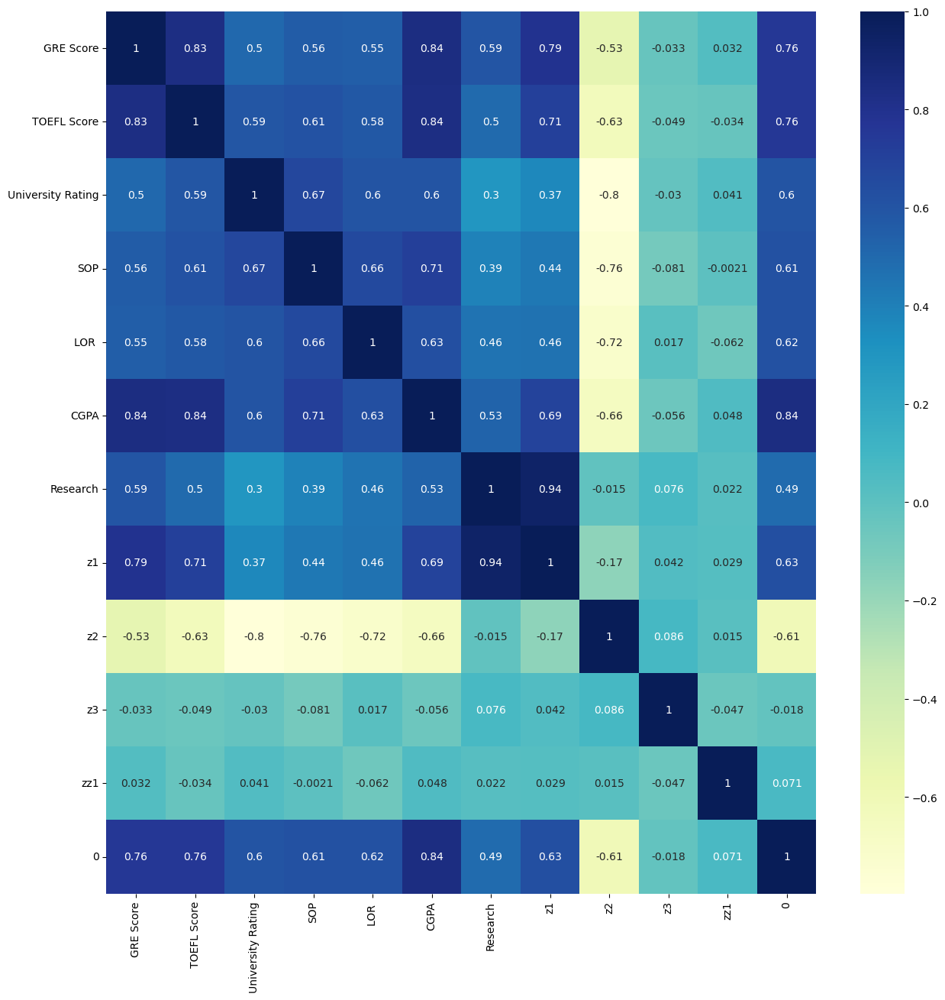

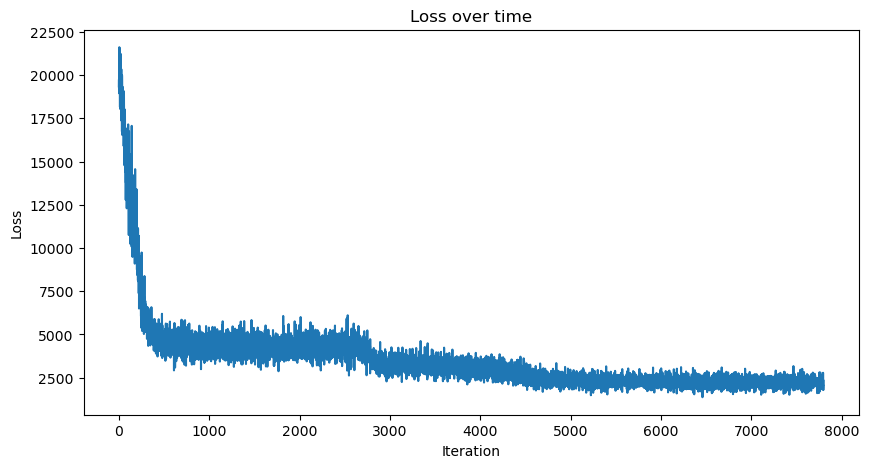

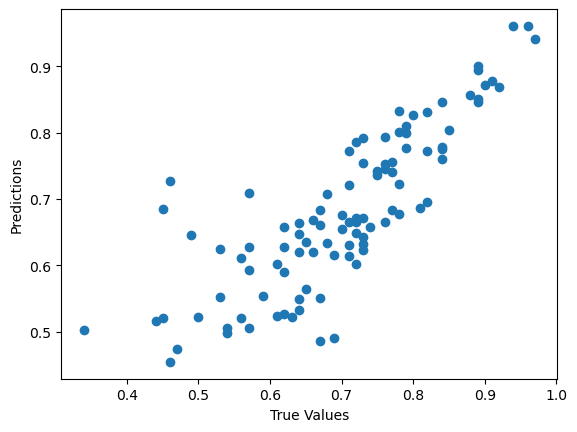

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3       zz1     0  
0 -2.664677  1.904506 -0.636153  0.333369  0.69  
1 -0.382047  1.963107 -0.523587 -0.294450  0.61  
2 -0.710046  1.058020 -0.943255  0.324304  0.66  
3 -0.151768  1.259448 -1.183594 -0.318151  0.67  
4 -0.208970 -0.274688  1.158434  0.812905  0.46  
heatmap_VAE_xdim6_zdim3_zzdim1_lr0001_bs32_epochs600_b110000_b21_b31_b410000_b51_encZ10_10_10_encZZ10_10_dec10_10_10_

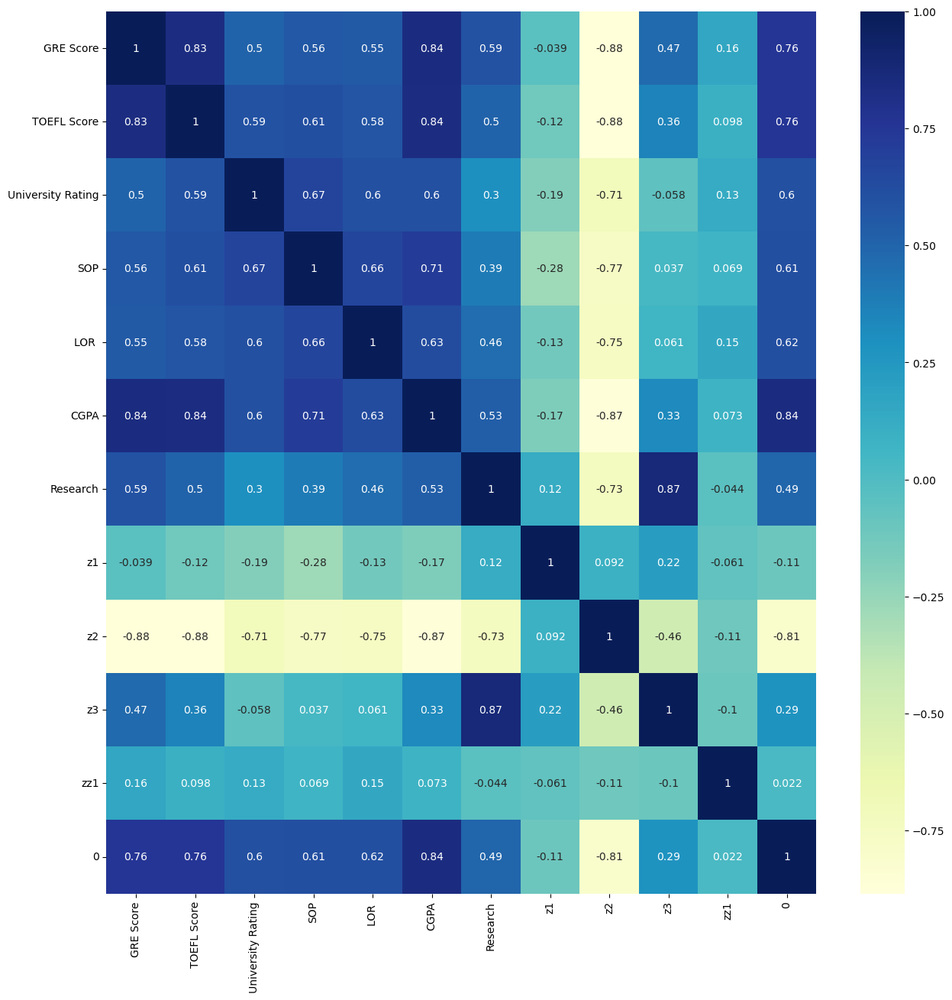

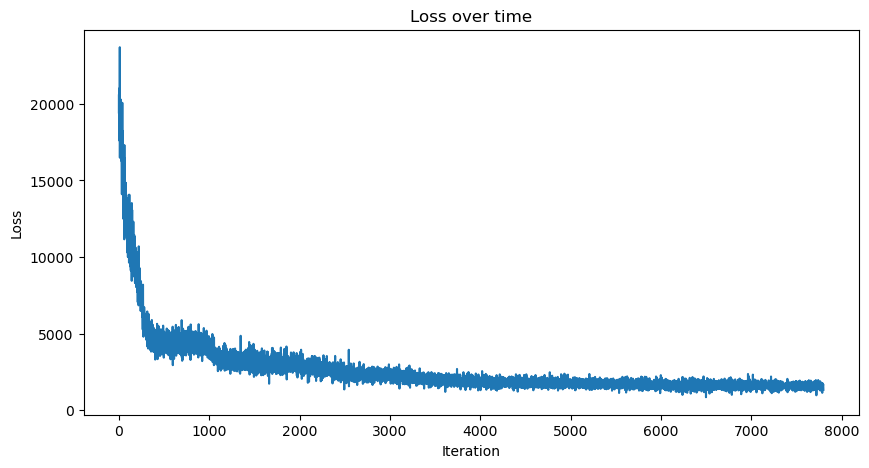

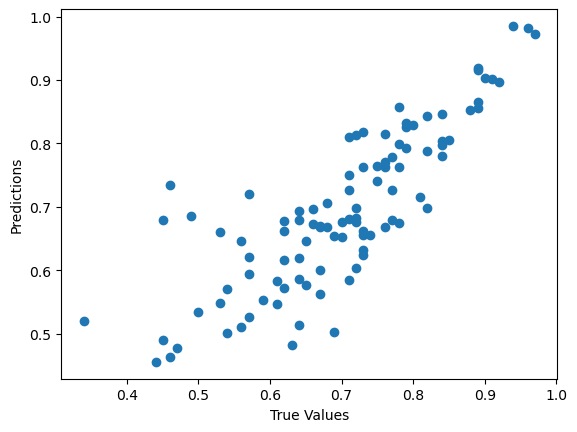

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3       zz1     0  
0  0.226791 -1.792164  1.214536  0.587959  0.69  
1  0.158327 -1.230005  1.743518  0.564822  0.61  
2  0.504935 -0.839060  0.401684 -0.693201  0.66  
3 -0.060893 -1.790740  0.210098 -0.888662  0.67  
4 -0.803646  0.805730  0.083583 -0.238777  0.46  
heatmap_VAE_xdim6_zdim3_zzdim1_lr0001_bs32_epochs600_b110000_b21_b31_b410000_b51_encZ10_10_10_encZZ10_10_dec10_10_10_

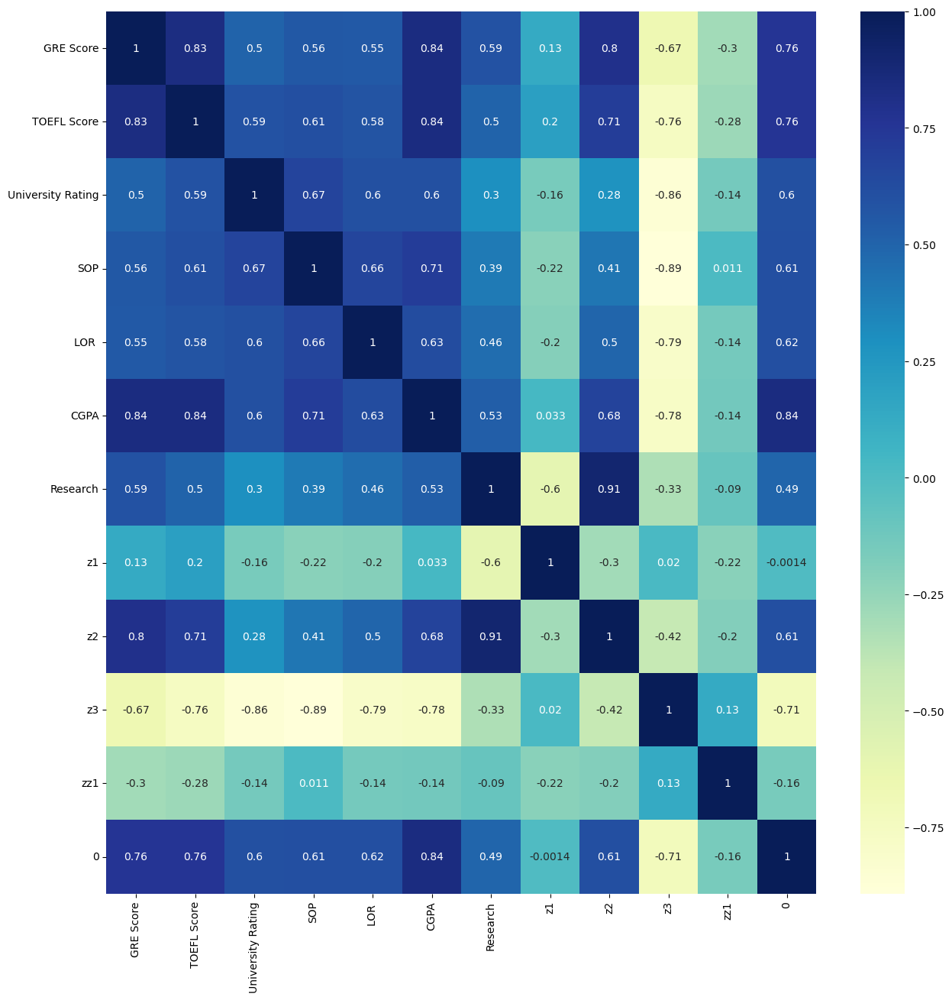

In [12]:
for i in range(20):
    mod,r,lt,ltt=train_VAE(X_train_scaled,X_test_scaled,X_test,y_train.values,y_test.values,configs[0],'./Test',save_pictures=True,freeze_weights=False)
    if r>0.683:
        dict_d=dict(configs[0])
        r2_text = str(r).replace(".", "_")
        torch.save(mod,f"./Admission/Models/Admission_No_freeze_z_and_zz_to_y_R2_{r2_text}_model.zip")
        with open(f"./Admission/Models/Config_Admission_No_freeze_z_and_zz_to_y_R2_{r2_text}.json", 'w') as outfile:
            json.dump(dict_d, outfile)

# No Freez and z and zz to y 

In [ ]:
import itertools

# Define the ranges for your parameters
x_dim_values = [X_train_with_confounder.shape[1]]
z_dim_values = [4]
zz_dim_values = [1]
encoder_z_layers_values = [[10,10,10]]
encoder_zz_layers_values = [[10,10]]
#decoder_layers_values = [[14,X_train_with_confounder.shape[1]],[32, 32,X_train_with_confounder.shape[1]],[128,128,128,X_train_with_confounder.shape[1]]]
fc_z_to_y_layers_values = [[12,12,1],]

# Get all combinations
configurations = list(itertools.product(x_dim_values, z_dim_values, zz_dim_values, encoder_z_layers_values, encoder_zz_layers_values, fc_z_to_y_layers_values))

# Convert to a list of dictionaries
config_dicts = [{'x_dim': x_dim, 'z_dim': z_dim, 'zz_dim': zz_dim, 'encoder_z_layers': encoder_z_layers, 'encoder_zz_layers': encoder_zz_layers, 'decoder_layers': encoder_z_layers+ [x_dim], 'fc_z_to_y_layers': fc_z_to_y_layers} for x_dim, z_dim, zz_dim, encoder_z_layers, encoder_zz_layers, fc_z_to_y_layers in configurations]
print(config_dicts)

In [13]:
# Define betas
BETAS=[
    #{'b1': 6, 'b2': 1, 'b3': 1, 'b4': 6,'b5':1},
    #{'b1': 1, 'b2': 1, 'b3': 1, 'b4': 1000,'b5':1},
    #{'b1': 100, 'b2': 1, 'b3': 100, 'b4': 100,'b5':1},
    #{'b1': 100,'b2': 1, 'b3': 1, 'b4': 10,'b5':1},  
    #{'b1': 10000, 'b2': 1, 'b3': 1, 'b4': 10000,'b5':1},
    {'b1': 10000, 'b2': 1, 'b3': 1, 'b4': 10000,'b5':1}
]
import itertools

# Define the ranges for your parameters
lr_values = [1e-3]
batch_size_values = [16]
num_epochs_values = [200]

# Get all combinations
configs = list(itertools.product(config_dicts, BETAS, lr_values, batch_size_values, num_epochs_values))

# Convert to a list of dictionaries
configs = [{'config': config, 'beta': beta, 'lr': lr, 'batch_size': bs, 'num_epochs': epochs} for config, beta, lr, bs, epochs in configs]
print(len(configs))

1


{'config': {'x_dim': 6, 'z_dim': 3, 'zz_dim': 1, 'encoder_z_layers': [10, 10, 10], 'encoder_zz_layers': [10, 10], 'decoder_layers': [10, 10, 10, 6], 'fc_z_to_y_layers': [12, 12, 1]}, 'beta': {'b1': 10000, 'b2': 1, 'b3': 1, 'b4': 10000, 'b5': 1}, 'lr': 0.001, 'batch_size': 16, 'num_epochs': 200}
False
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1                   [-1, 10]              70
              ReLU-2                   [-1, 10]               0
            Linear-3                   [-1, 10]             110
              ReLU-4                   [-1, 10]               0
            Linear-5                   [-1, 10]             110
              ReLU-6                   [-1, 10]               0
            Linear-7                    [-1, 3]              33
            Linear-8                    [-1, 3]              33
            Linear-9                   [-1, 10]          

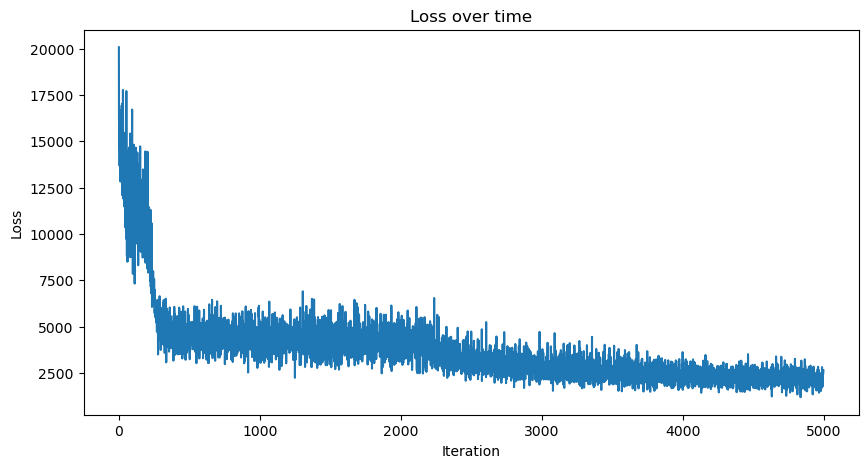

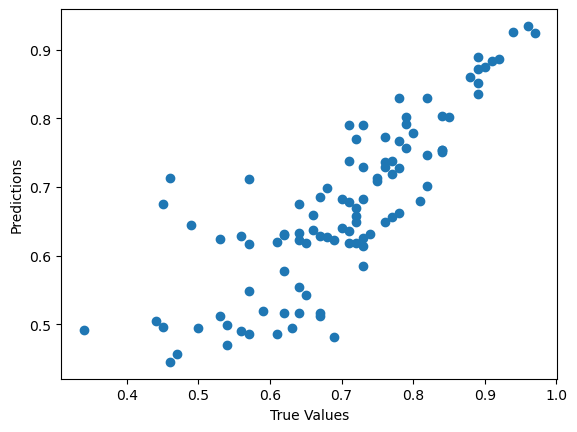

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3       zz1     0  
0 -2.421464 -0.377880 -1.259957  1.619955  0.69  
1 -2.707994  0.046223 -1.073638  1.695544  0.61  
2 -1.192886  0.324570 -1.462075  0.649683  0.66  
3 -1.196115 -1.038596 -1.687317  1.214637  0.67  
4 -0.397129  0.656708  1.827834 -0.308743  0.46  
heatmap_VAE_xdim6_zdim3_zzdim1_lr0001_bs16_epochs200_b110000_b21_b31_b410000_b51_encZ10_10_10_encZZ10_10_dec10_10_10_

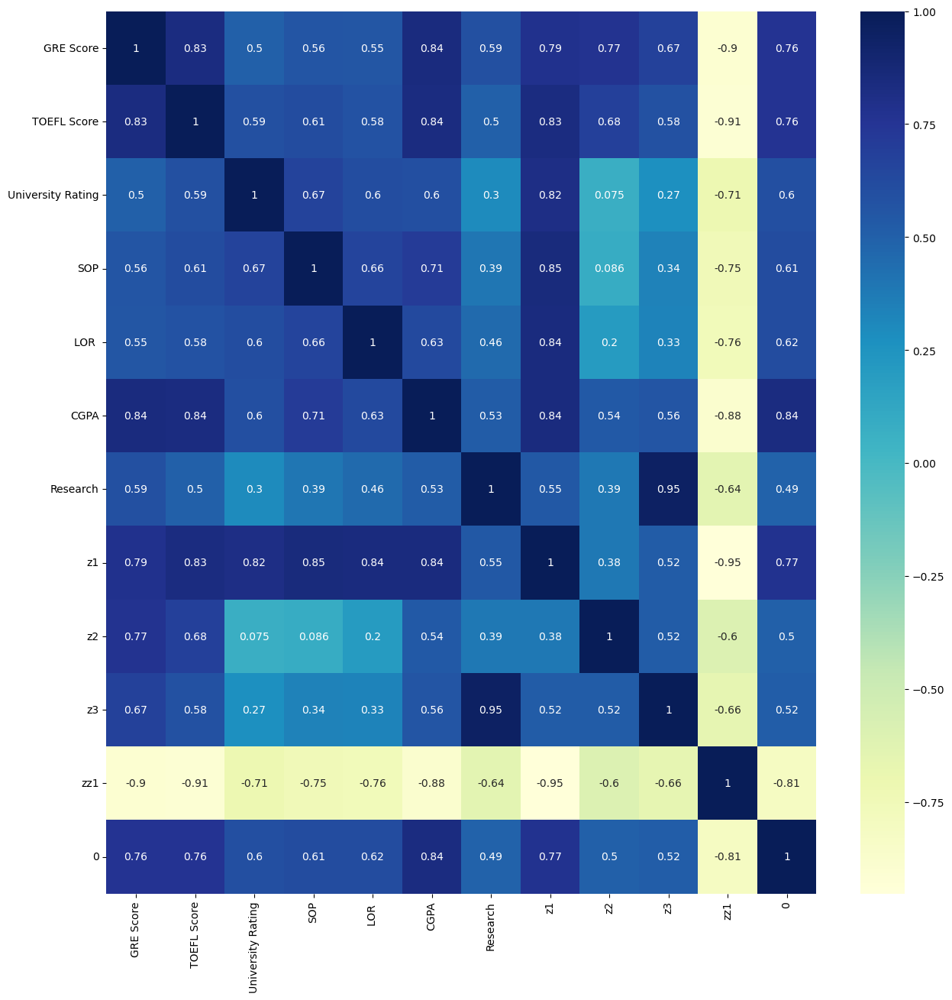

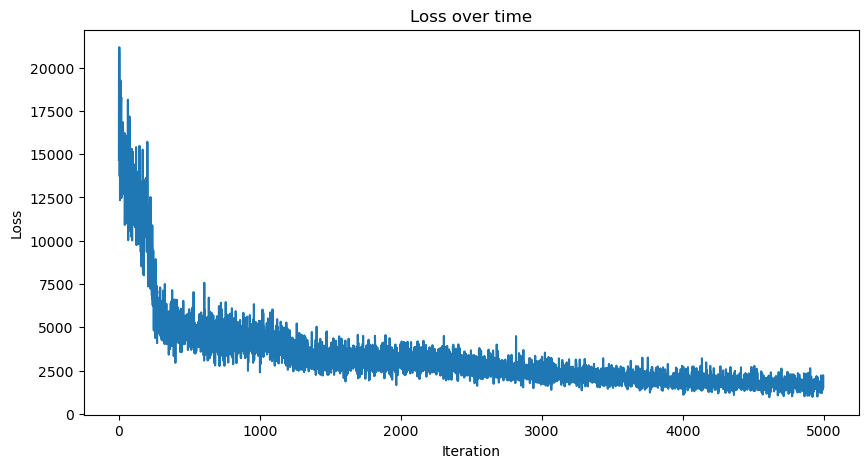

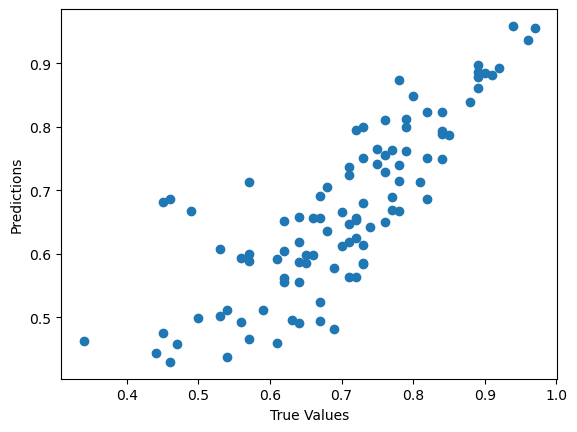

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3       zz1     0  
0 -1.825957 -1.285557  1.424930  1.626466  0.69  
1 -1.215697 -1.312661  1.968629  1.752121  0.61  
2 -0.732990 -1.871552  1.005023  0.955805  0.66  
3 -1.963380 -2.104694  0.839290  1.420896  0.67  
4  0.739786 -0.522552  0.312794  0.204558  0.46  
heatmap_VAE_xdim6_zdim3_zzdim1_lr0001_bs16_epochs200_b110000_b21_b31_b410000_b51_encZ10_10_10_encZZ10_10_dec10_10_10_

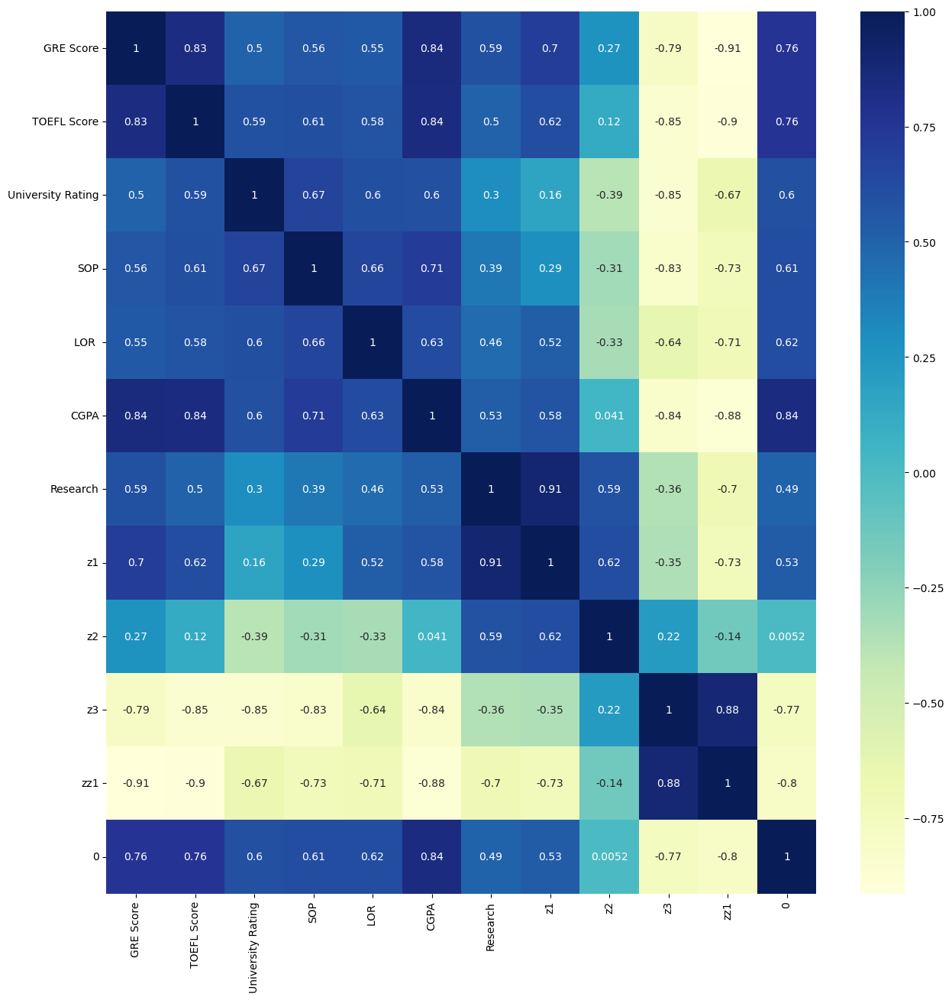

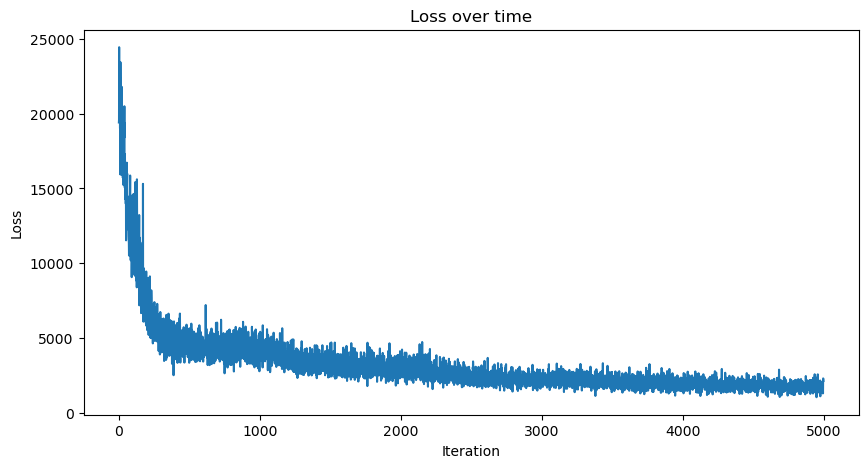

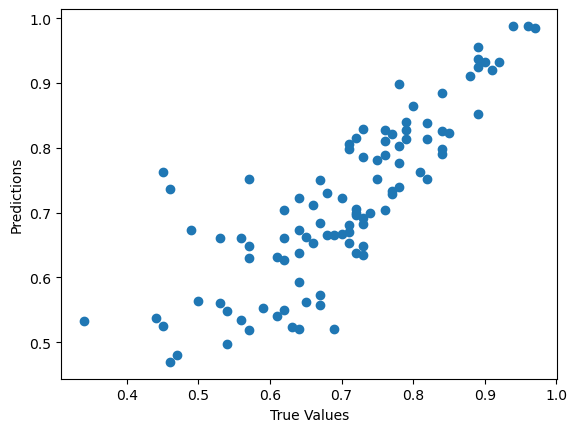

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3       zz1     0  
0 -0.911910 -0.648232  2.543948 -0.789039  0.69  
1 -1.614349 -0.803591  2.640711 -0.796387  0.61  
2 -2.076161  0.081402  2.125343 -0.010950  0.66  
3 -0.882419  0.041606  2.447344 -0.553917  0.67  
4  1.360738  0.656661  1.032754  0.519403  0.46  
heatmap_VAE_xdim6_zdim3_zzdim1_lr0001_bs16_epochs200_b110000_b21_b31_b410000_b51_encZ10_10_10_encZZ10_10_dec10_10_10_

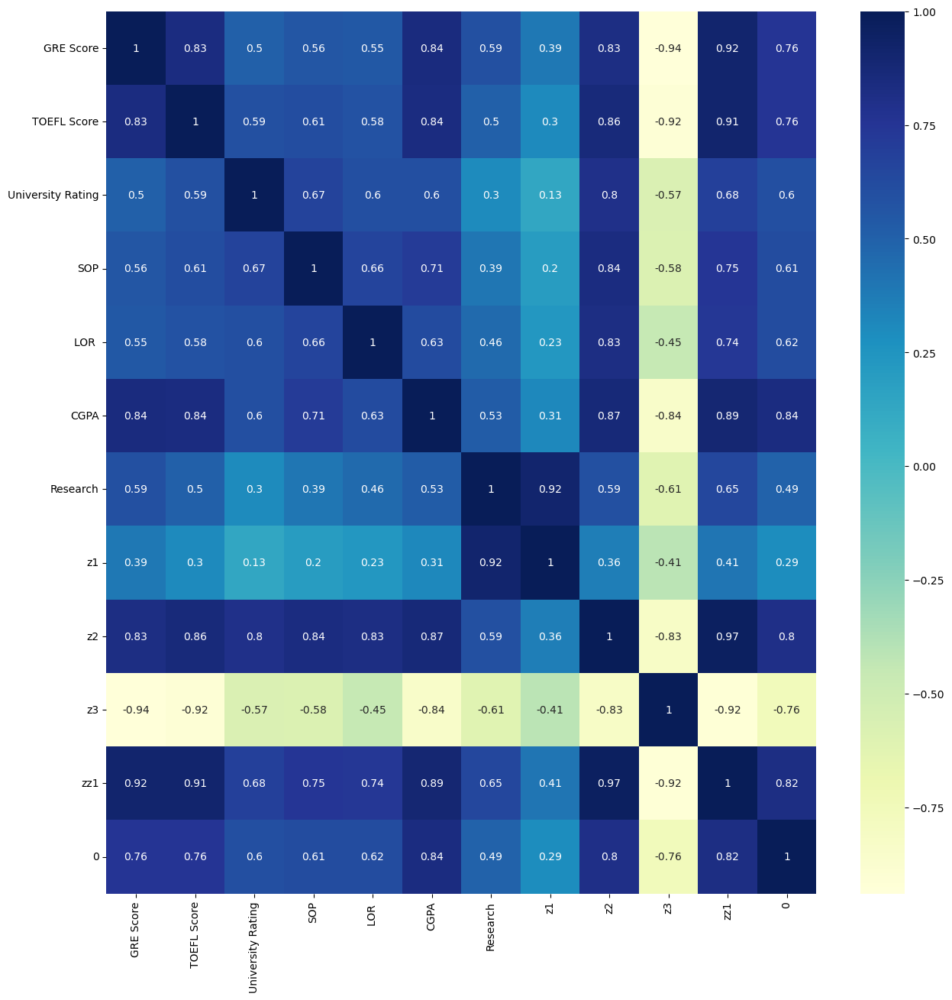

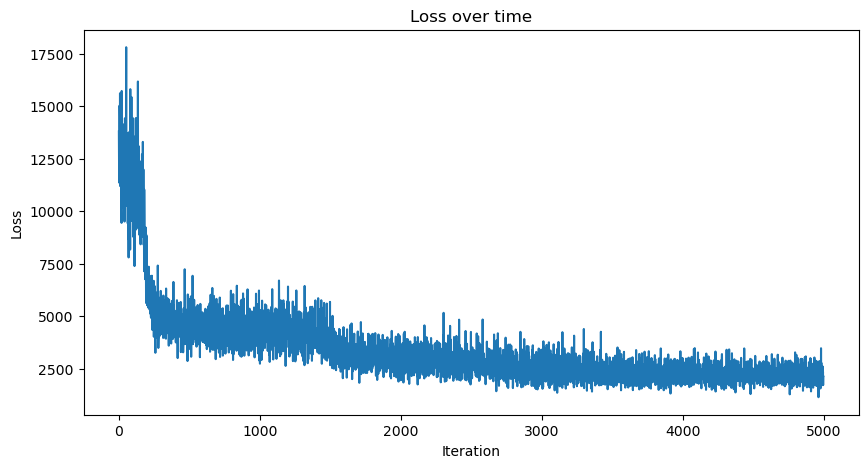

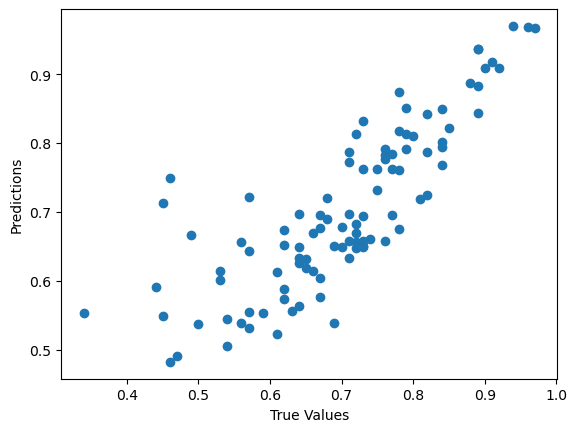

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3       zz1     0  
0 -1.662745  2.388663  1.343228 -0.972759  0.69  
1 -1.738093  2.594915  1.284557 -1.162511  0.61  
2 -1.450289  1.473047  1.197613 -0.593942  0.66  
3 -1.945210  1.618750  1.571178 -0.775734  0.67  
4  1.542055  1.527036 -0.877573  0.247259  0.46  
heatmap_VAE_xdim6_zdim3_zzdim1_lr0001_bs16_epochs200_b110000_b21_b31_b410000_b51_encZ10_10_10_encZZ10_10_dec10_10_10_

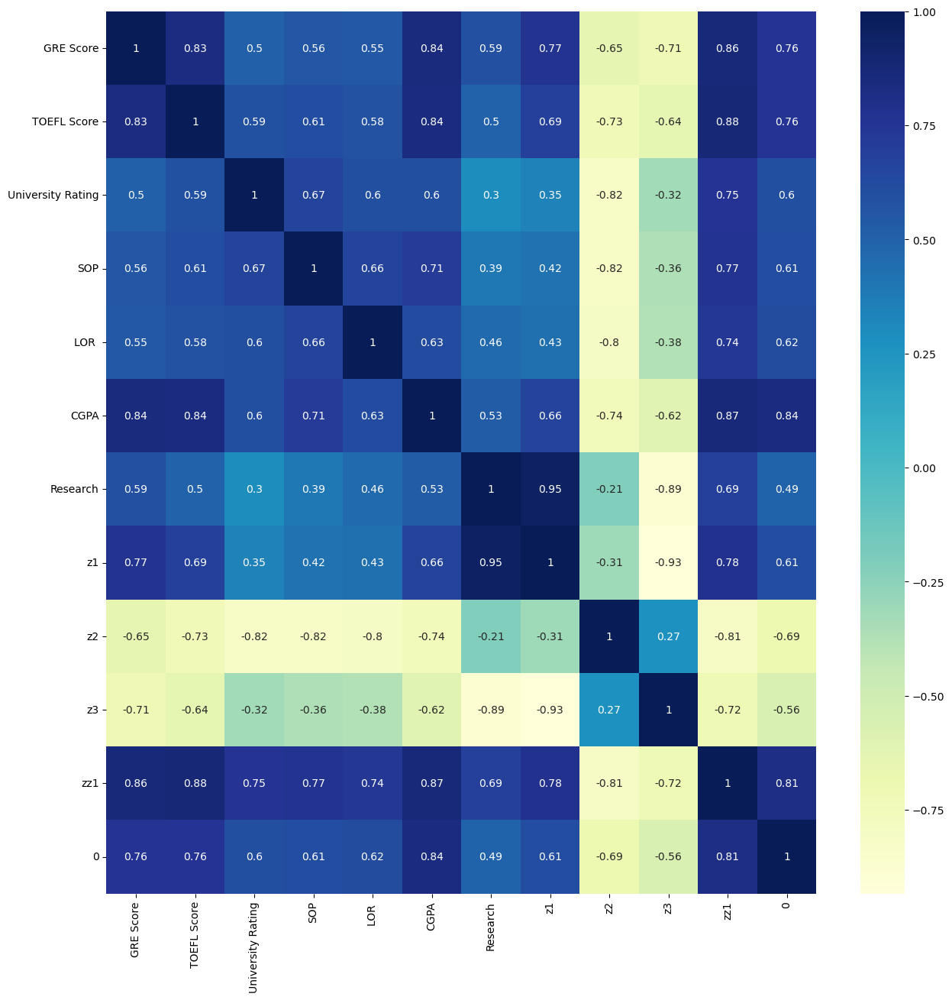

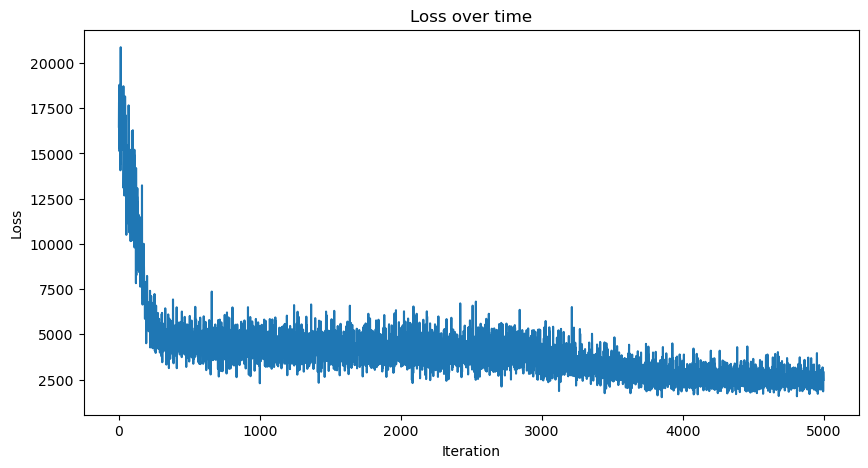

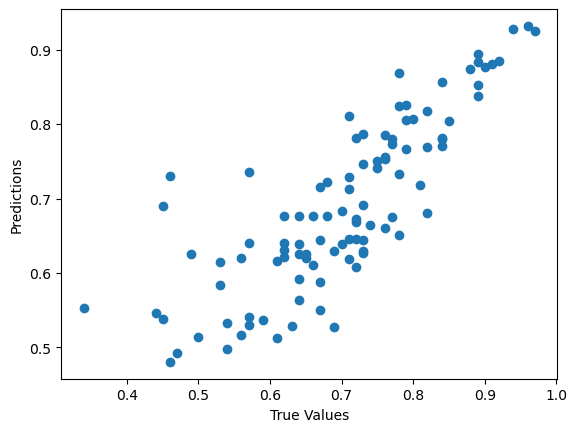

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3       zz1     0  
0  1.121928  1.681856  2.230153 -2.048362  0.69  
1  0.915688  1.985527  2.238005 -2.247198  0.61  
2  1.176658  0.741196  1.155989 -1.212758  0.66  
3  0.853479  0.867538  1.063905 -1.471259  0.67  
4 -0.287328 -0.876704  1.029258  0.754412  0.46  
heatmap_VAE_xdim6_zdim3_zzdim1_lr0001_bs16_epochs200_b110000_b21_b31_b410000_b51_encZ10_10_10_encZZ10_10_dec10_10_10_

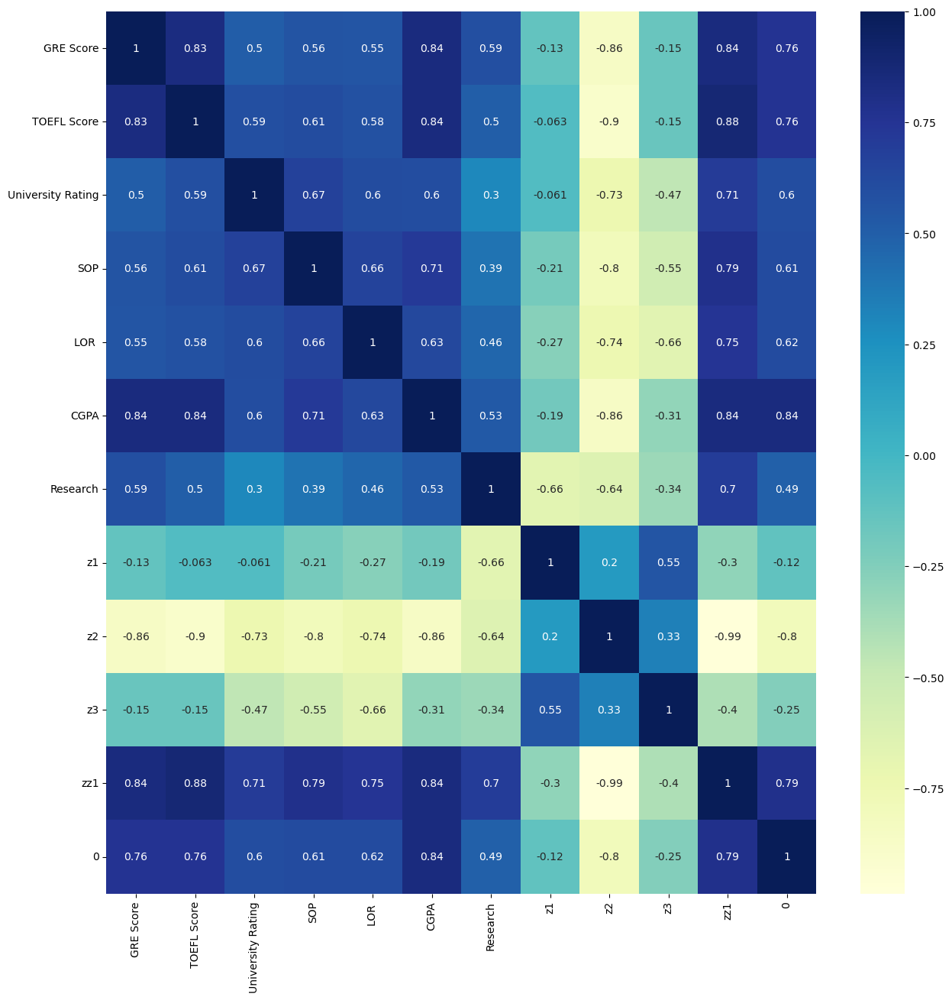

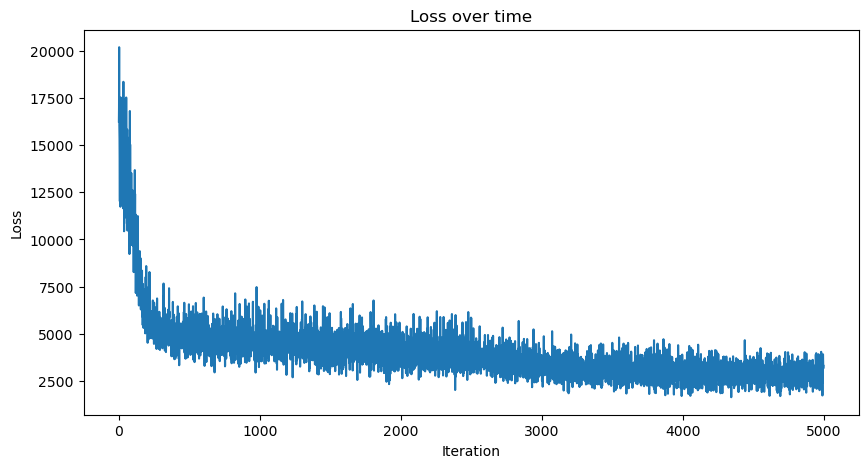

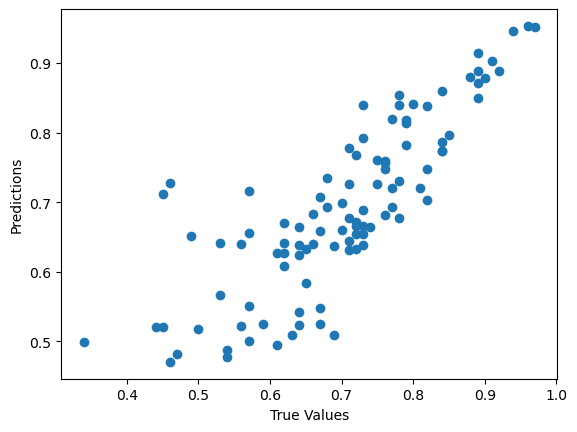

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3       zz1     0  
0 -0.831576  2.143086  2.068237 -0.673366  0.69  
1 -0.786260  2.383249  2.325435 -0.754086  0.61  
2 -0.910254  1.500630  1.237994 -0.374945  0.66  
3 -1.243037  1.791358  1.436940 -0.442016  0.67  
4 -0.452626  0.207719 -0.051318  0.379120  0.46  
heatmap_VAE_xdim6_zdim3_zzdim1_lr0001_bs16_epochs200_b110000_b21_b31_b410000_b51_encZ10_10_10_encZZ10_10_dec10_10_10_

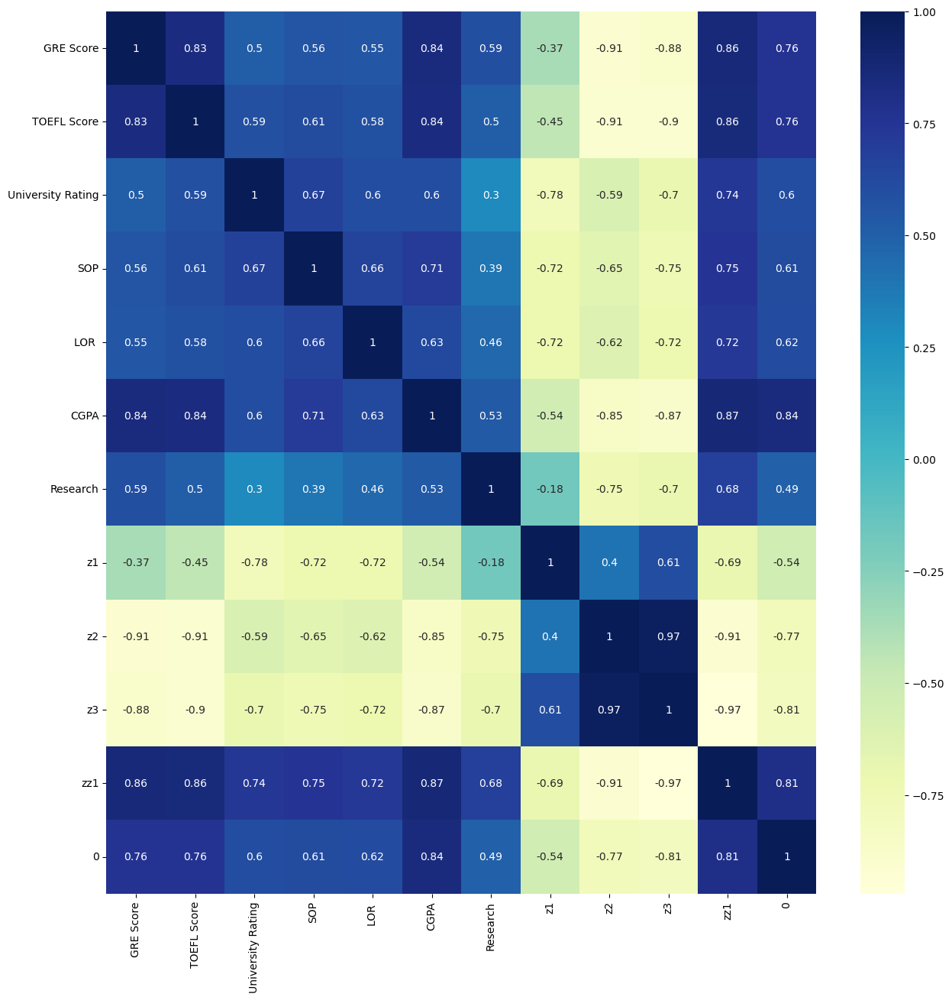

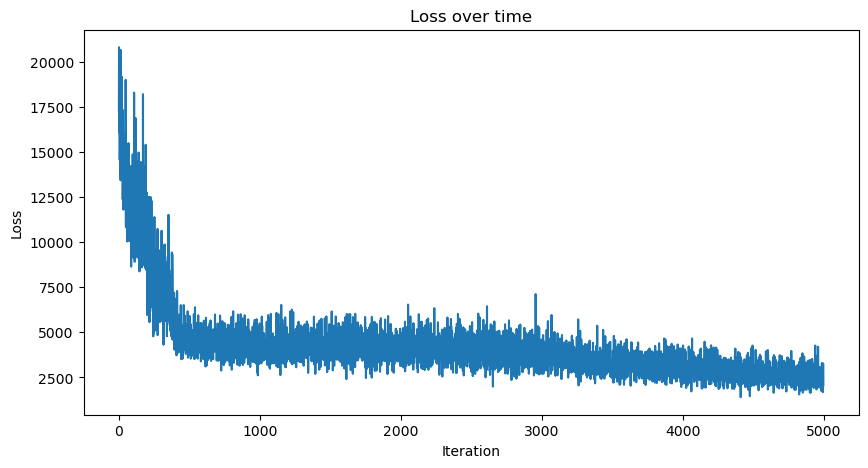

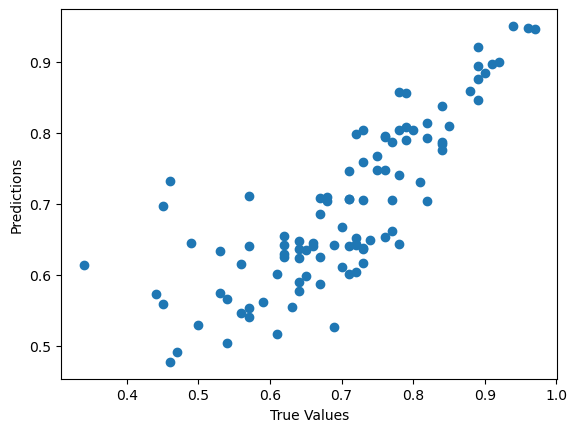

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3       zz1     0  
0  3.254782 -2.305019 -0.095670  1.558272  0.69  
1  3.427989 -2.632264  0.011430  1.640524  0.61  
2  1.993381 -0.962857 -0.238184  0.912226  0.66  
3  2.199592 -1.019532 -0.475739  0.947926  0.67  
4  0.004450  1.303913 -0.637456 -0.903085  0.46  
heatmap_VAE_xdim6_zdim3_zzdim1_lr0001_bs16_epochs200_b110000_b21_b31_b410000_b51_encZ10_10_10_encZZ10_10_dec10_10_10_

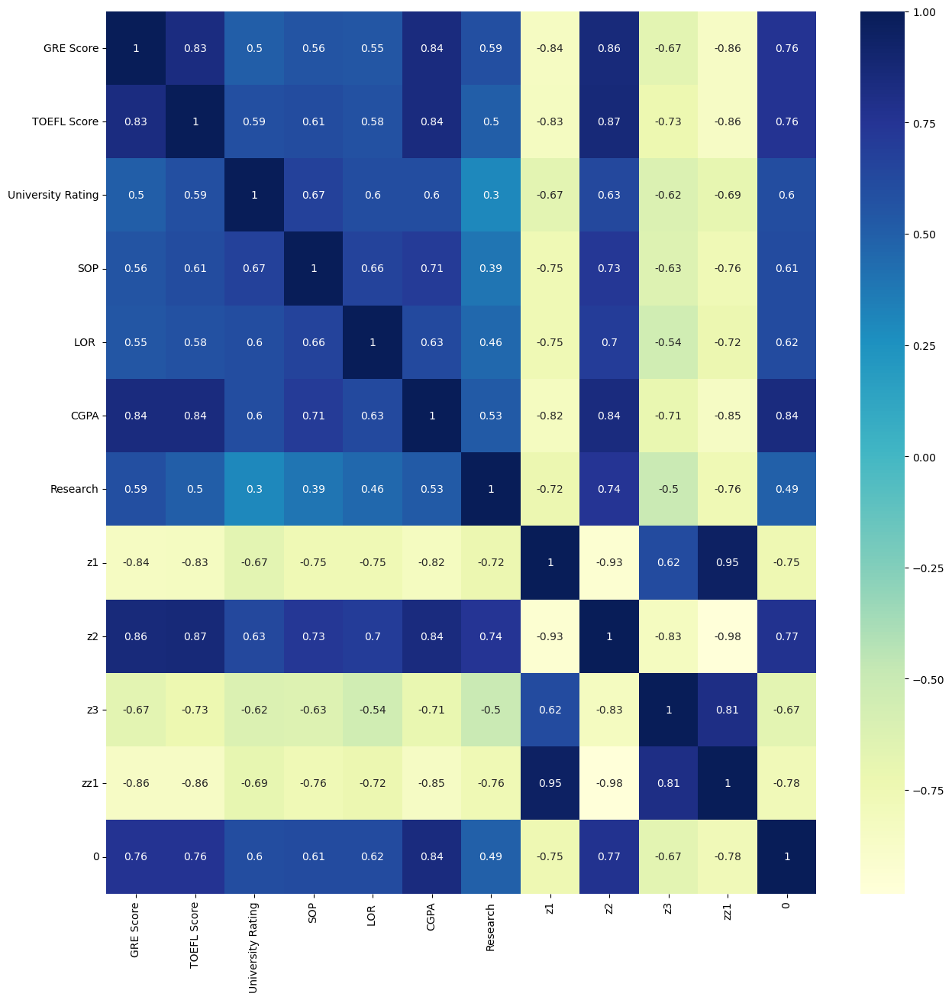

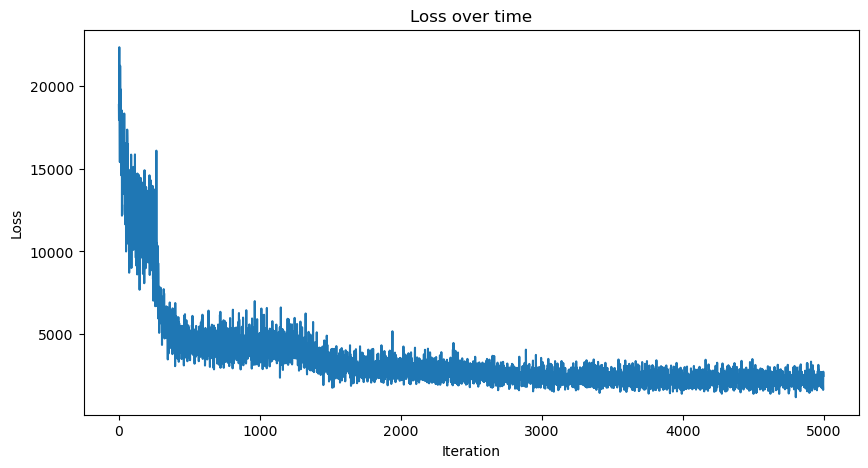

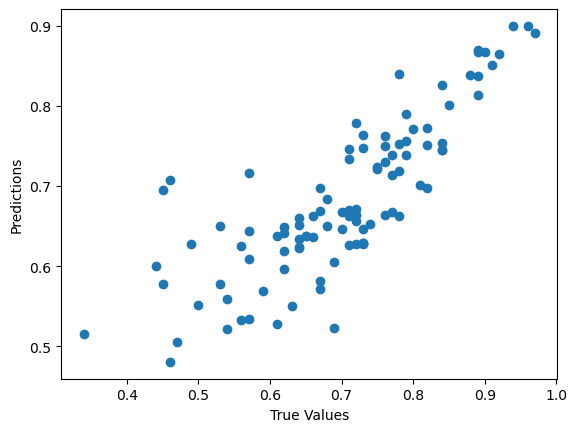

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3       zz1     0  
0  2.653551  1.770433  0.795917  1.060558  0.69  
1  2.597645  1.666027 -0.078018  1.039610  0.61  
2  1.565893  1.045470  0.562248  0.569669  0.66  
3  2.000323  1.476089  1.668169  0.795629  0.67  
4 -0.568986 -1.089377 -2.016876 -0.007842  0.46  
heatmap_VAE_xdim6_zdim3_zzdim1_lr0001_bs16_epochs200_b110000_b21_b31_b410000_b51_encZ10_10_10_encZZ10_10_dec10_10_10_

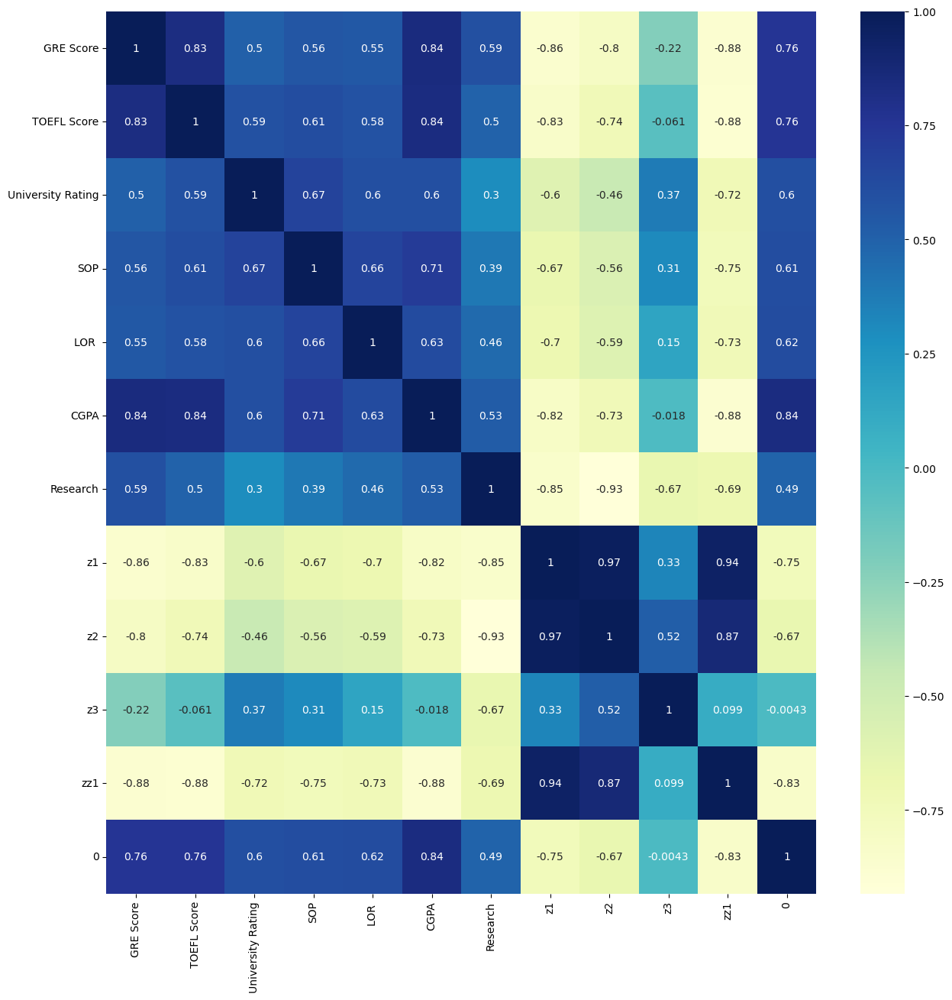

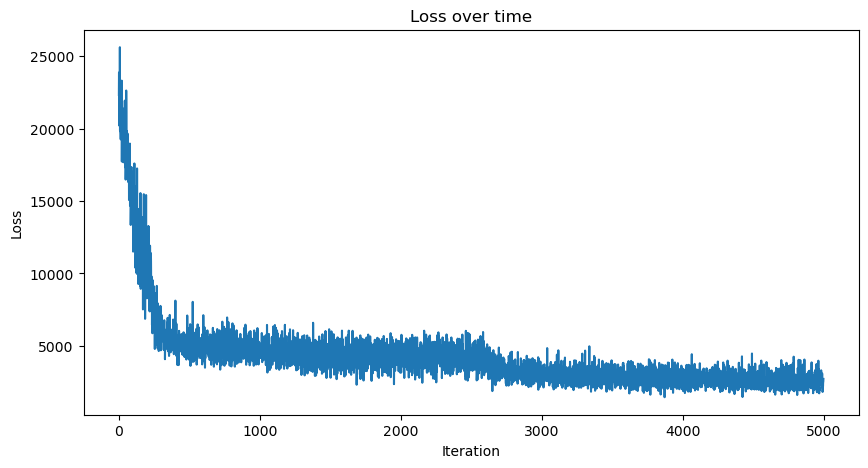

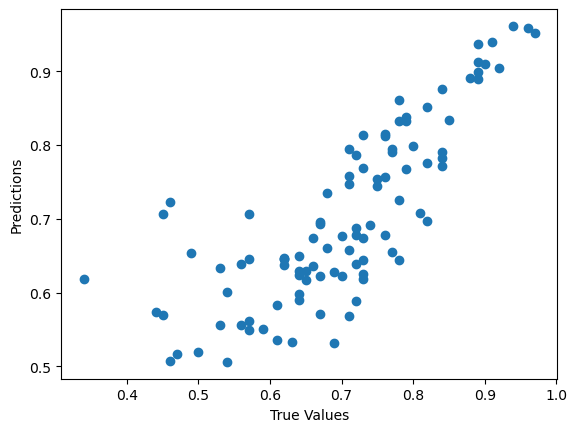

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3       zz1     0  
0  0.286529  1.130899 -2.779639  0.321689  0.69  
1  0.546933  1.081096 -2.666442  0.332726  0.61  
2  0.128877  1.085839 -2.001458  0.101573  0.66  
3  0.023461  0.295765 -2.173408  0.159706  0.67  
4  2.307159 -1.243323 -1.191555 -0.168996  0.46  
heatmap_VAE_xdim6_zdim3_zzdim1_lr0001_bs16_epochs200_b110000_b21_b31_b410000_b51_encZ10_10_10_encZZ10_10_dec10_10_10_

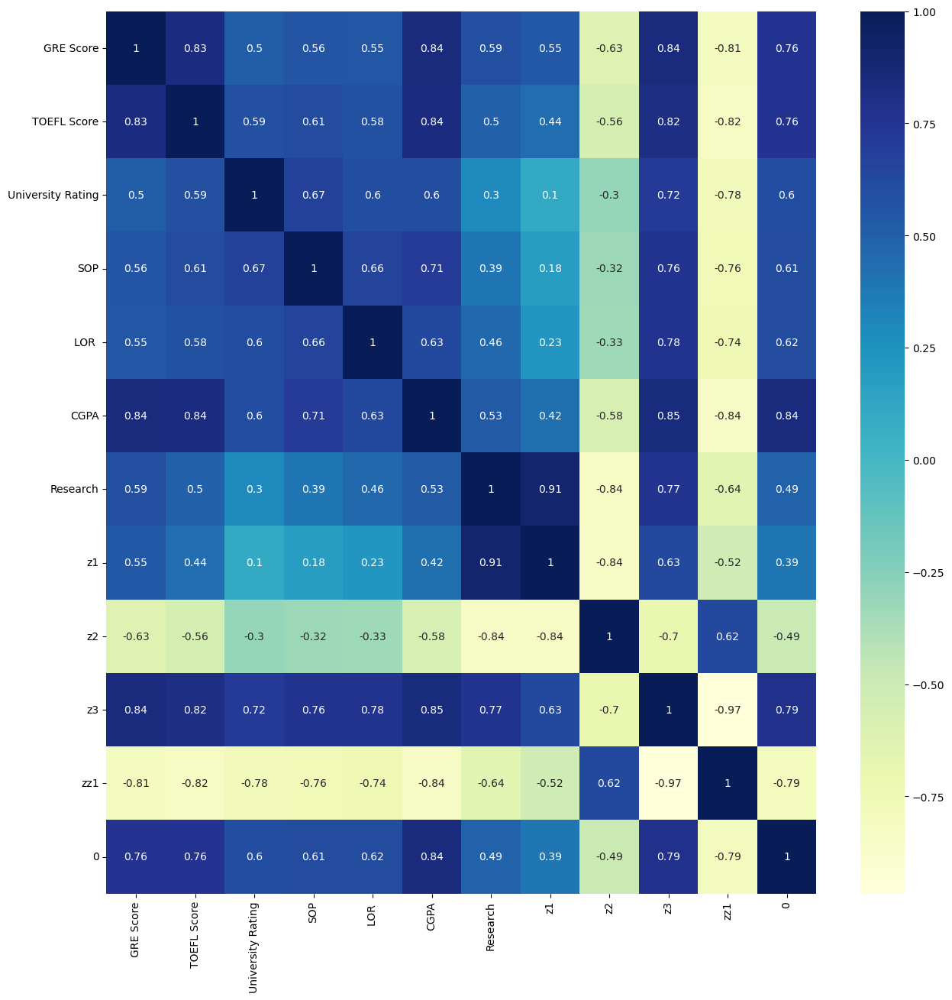

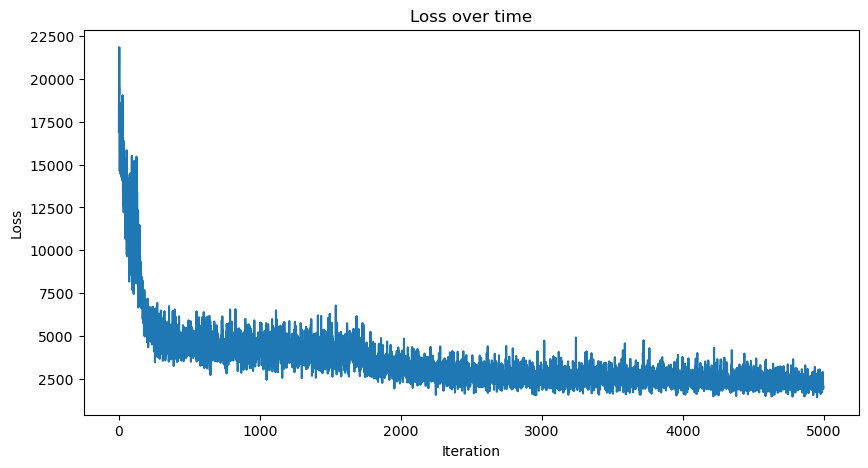

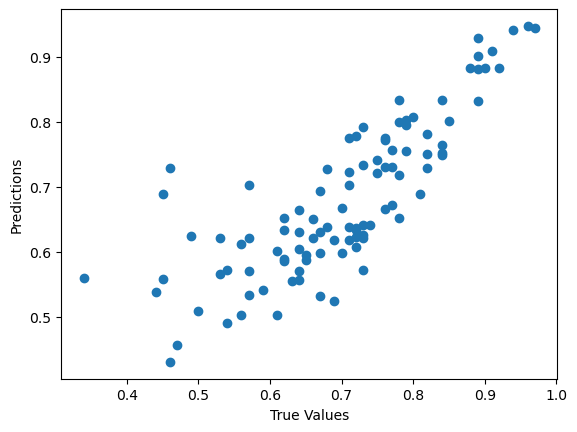

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3       zz1     0  
0  0.961592 -0.875703  3.063585 -1.758737  0.69  
1  1.424221 -1.073633  2.830461 -1.713485  0.61  
2  0.925220  0.373938  1.518623 -1.056469  0.66  
3  0.571525  0.689807  2.307297 -1.071493  0.67  
4  0.211062 -1.443717 -0.734304  0.172294  0.46  
heatmap_VAE_xdim6_zdim3_zzdim1_lr0001_bs16_epochs200_b110000_b21_b31_b410000_b51_encZ10_10_10_encZZ10_10_dec10_10_10_

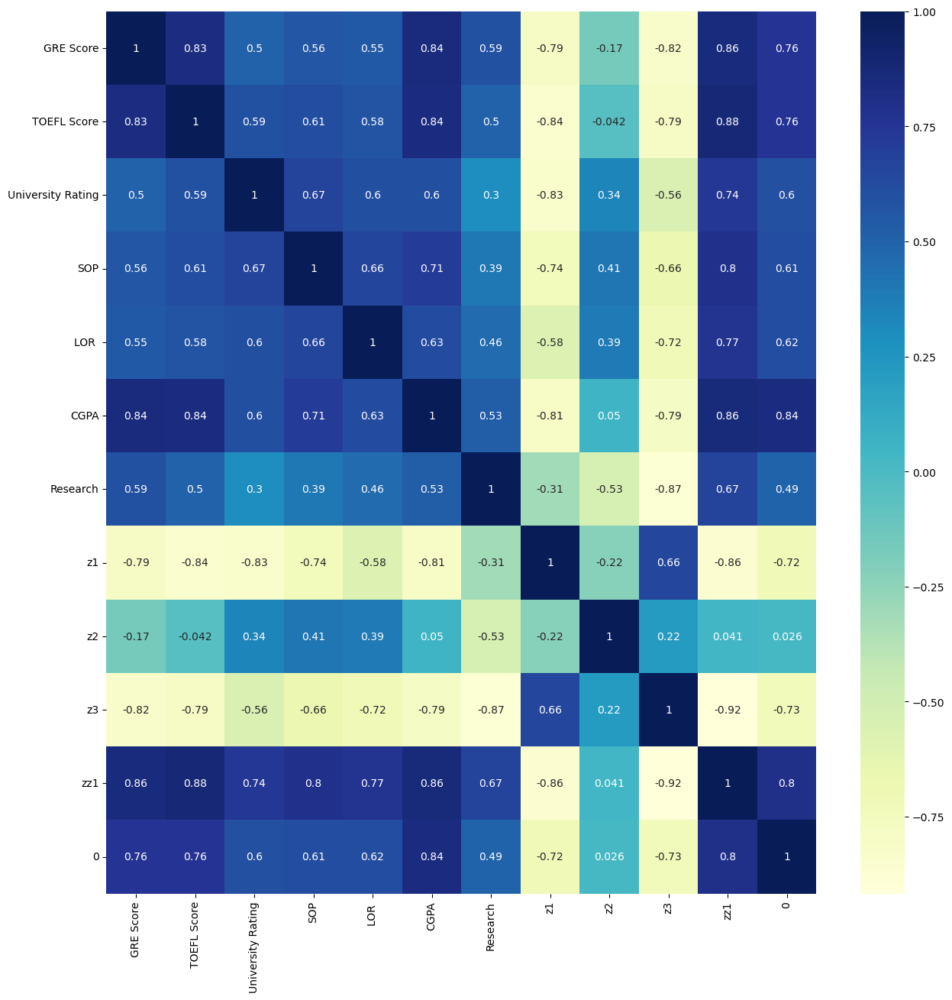

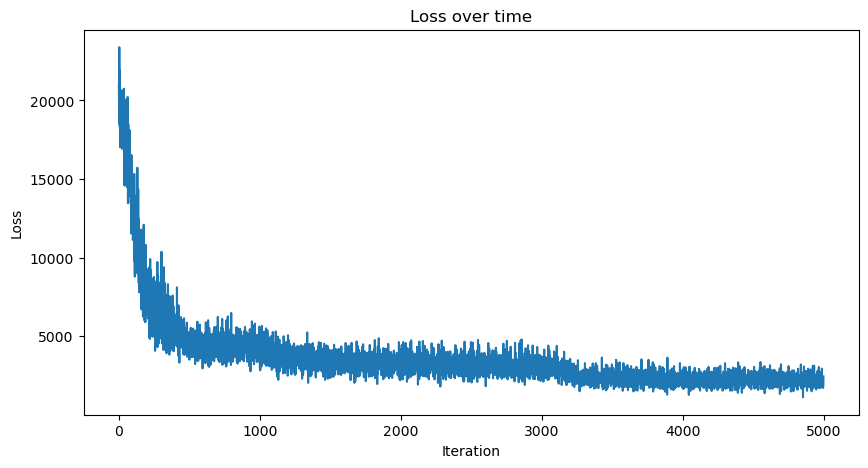

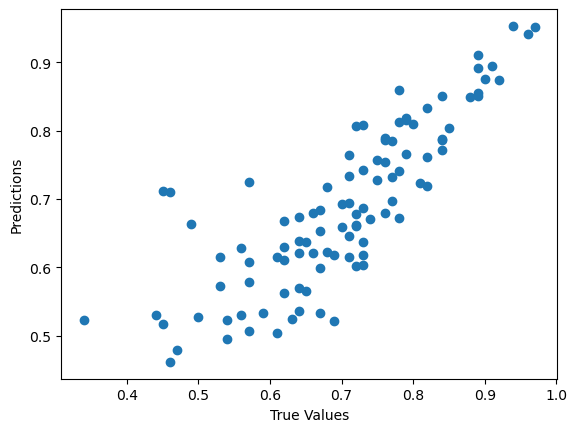

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3       zz1     0  
0  1.561850 -0.800723  1.155699 -0.379765  0.69  
1  1.189226 -0.941896  1.312192 -0.464007  0.61  
2  1.110577 -0.037150  0.479269  0.008087  0.66  
3  1.005251 -0.267242 -0.084896 -0.311726  0.67  
4 -0.040776  0.579007  1.570049  0.781896  0.46  
heatmap_VAE_xdim6_zdim3_zzdim1_lr0001_bs16_epochs200_b110000_b21_b31_b410000_b51_encZ10_10_10_encZZ10_10_dec10_10_10_

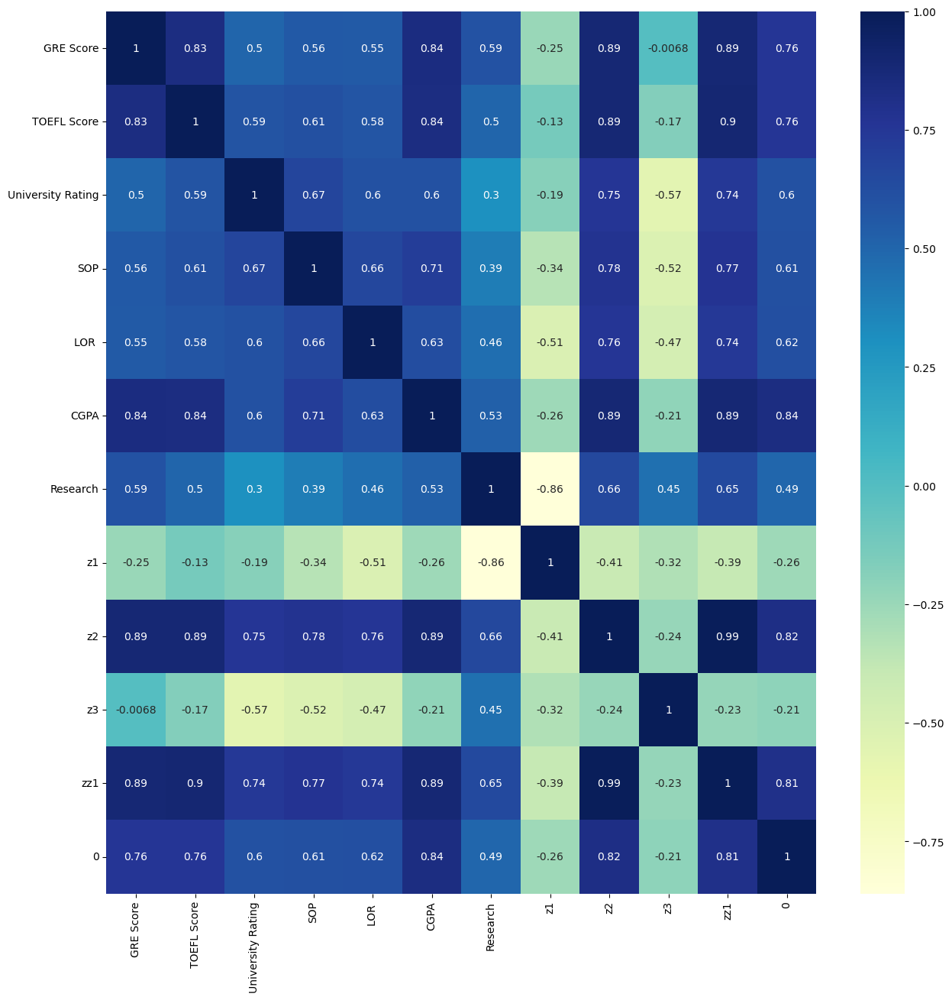

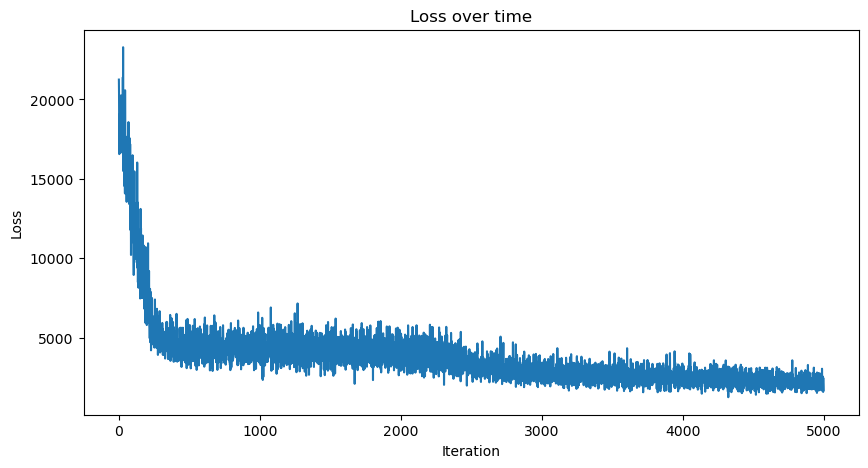

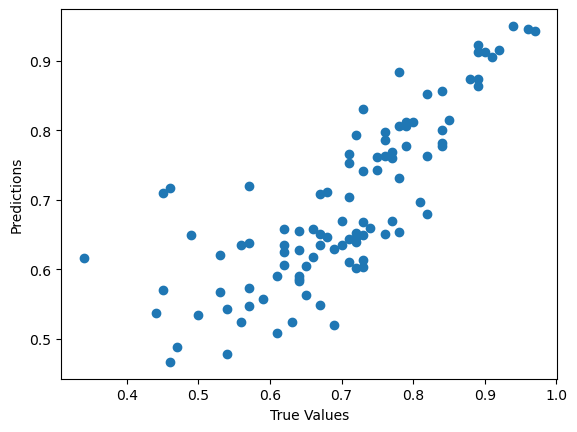

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3       zz1     0  
0  1.259043  1.863717 -0.010013  0.773085  0.69  
1  1.054342  2.214622 -2.022775  0.997534  0.61  
2  1.367934  0.786984  1.473279  0.199510  0.66  
3  0.905374  0.924784  0.948779  0.331356  0.67  
4 -1.280825 -0.234338 -0.279157 -0.473231  0.46  
heatmap_VAE_xdim6_zdim3_zzdim1_lr0001_bs16_epochs200_b110000_b21_b31_b410000_b51_encZ10_10_10_encZZ10_10_dec10_10_10_

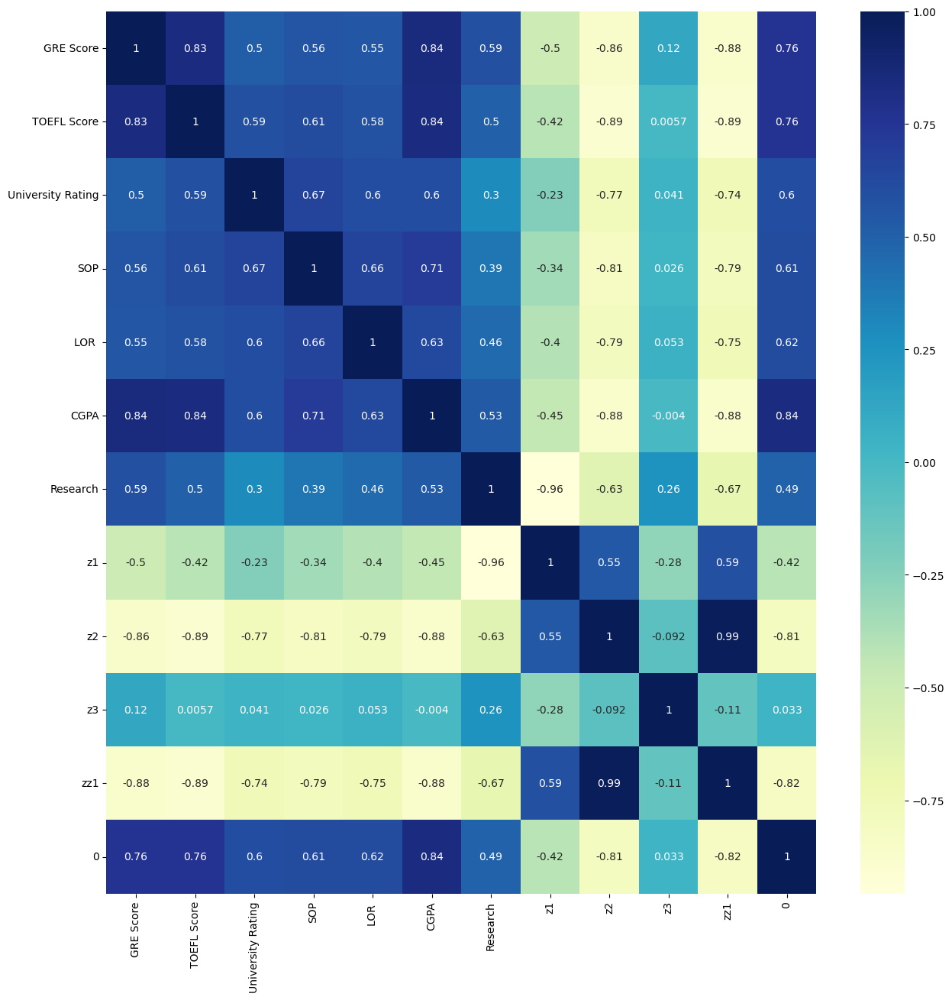

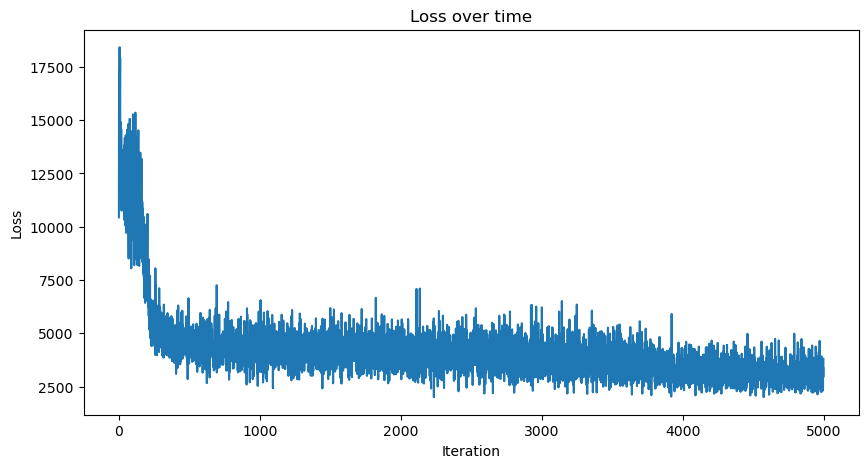

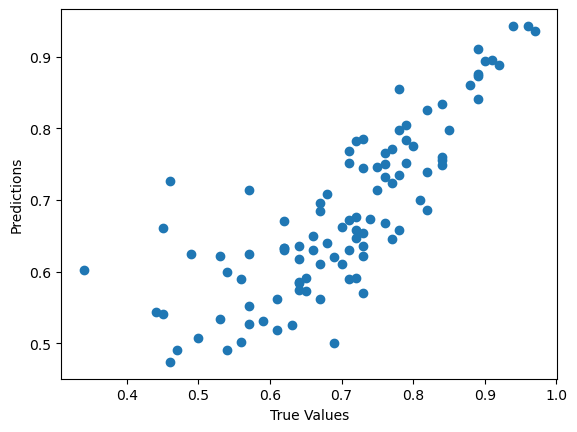

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3       zz1     0  
0  0.677891 -1.863068  2.398397  1.040274  0.69  
1  0.182394 -2.162609  2.063432  1.149116  0.61  
2  0.631644 -0.787752  1.893585  0.257878  0.66  
3  1.188189 -0.828998  2.256046  0.526806  0.67  
4 -0.422248  0.339295  0.844672 -0.088567  0.46  
heatmap_VAE_xdim6_zdim3_zzdim1_lr0001_bs16_epochs200_b110000_b21_b31_b410000_b51_encZ10_10_10_encZZ10_10_dec10_10_10_

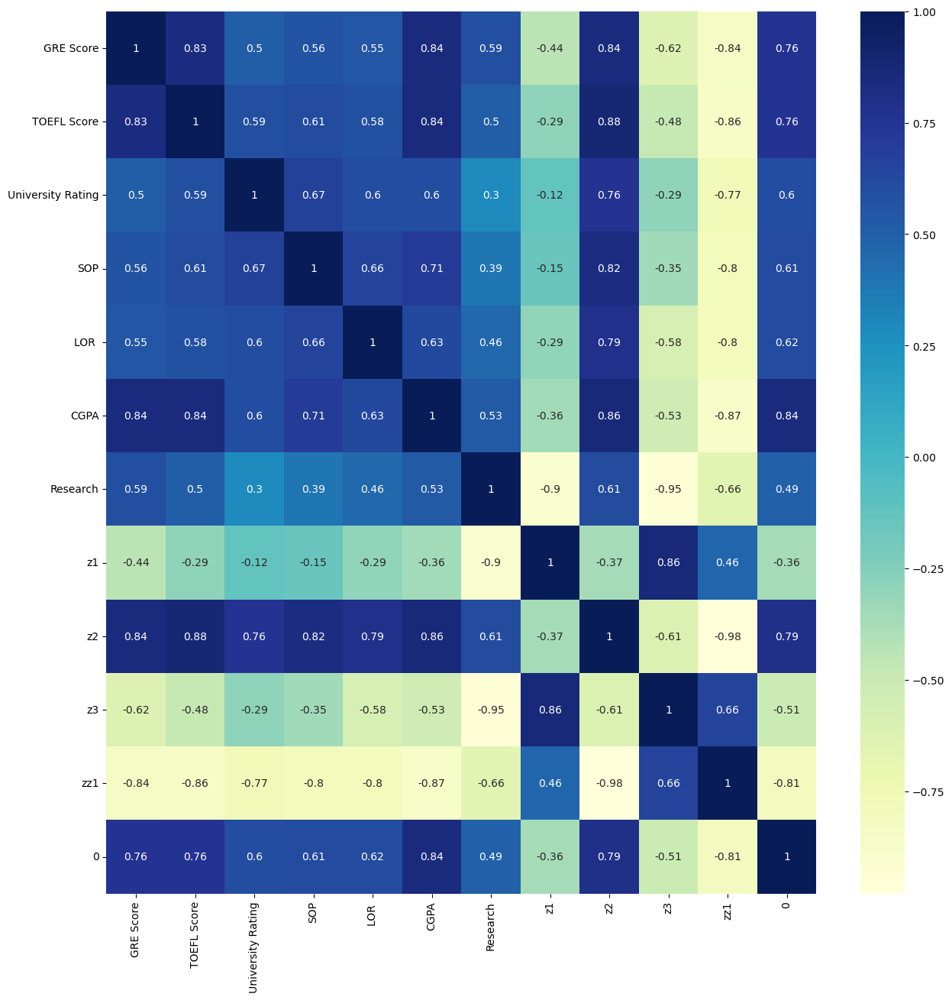

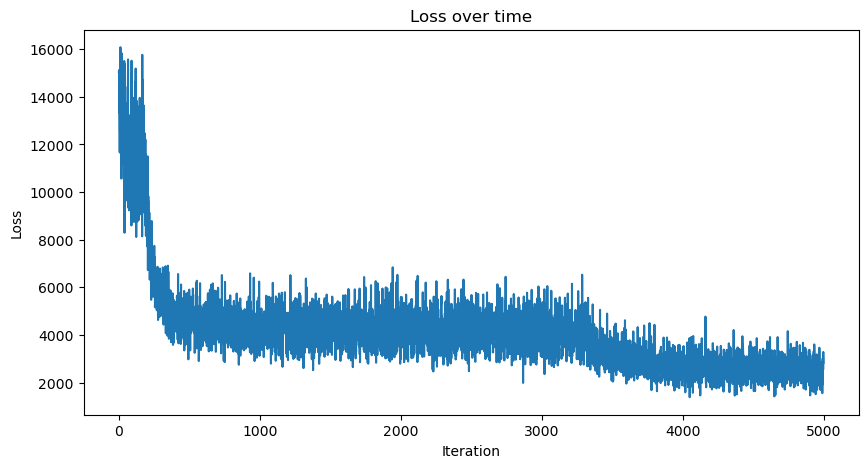

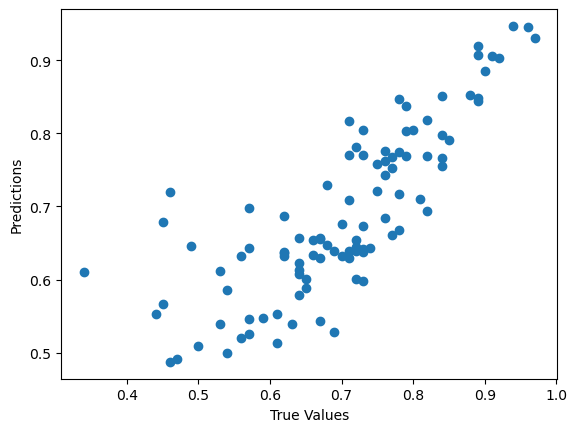

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3       zz1     0  
0  2.195697  2.188082  0.008799 -1.230137  0.69  
1  2.316795  1.231418 -0.711296 -1.316448  0.61  
2  1.228850 -0.195519  0.027406 -0.580620  0.66  
3  1.557574 -1.165746  0.674429 -0.662429  0.67  
4 -0.070772  1.967831 -1.955986  0.155725  0.46  
heatmap_VAE_xdim6_zdim3_zzdim1_lr0001_bs16_epochs200_b110000_b21_b31_b410000_b51_encZ10_10_10_encZZ10_10_dec10_10_10_

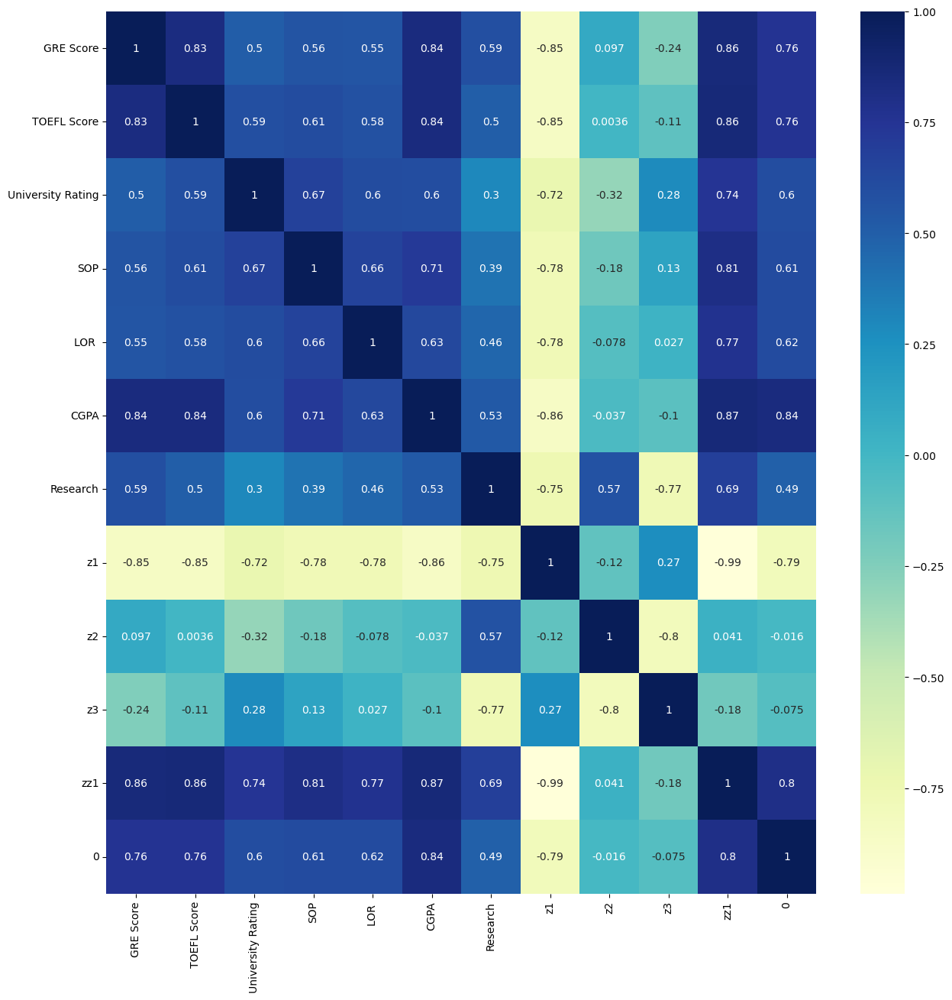

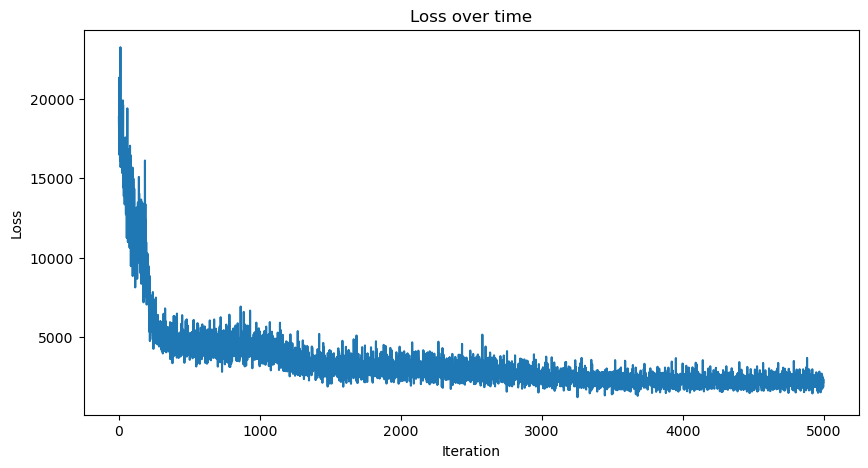

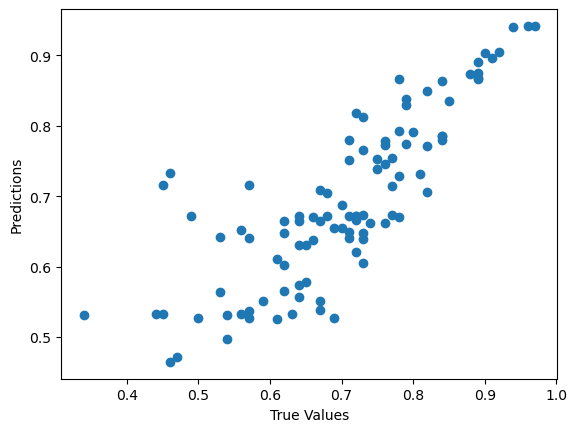

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3       zz1     0  
0  1.390959 -2.439909  1.695617  1.312950  0.69  
1  1.646958 -2.567305  1.615376  1.435675  0.61  
2  0.673621 -1.195983  1.549093  0.186555  0.66  
3  0.191975 -1.576724  2.190756  0.677252  0.67  
4  1.369894 -0.142707 -1.747113 -0.743475  0.46  
heatmap_VAE_xdim6_zdim3_zzdim1_lr0001_bs16_epochs200_b110000_b21_b31_b410000_b51_encZ10_10_10_encZZ10_10_dec10_10_10_

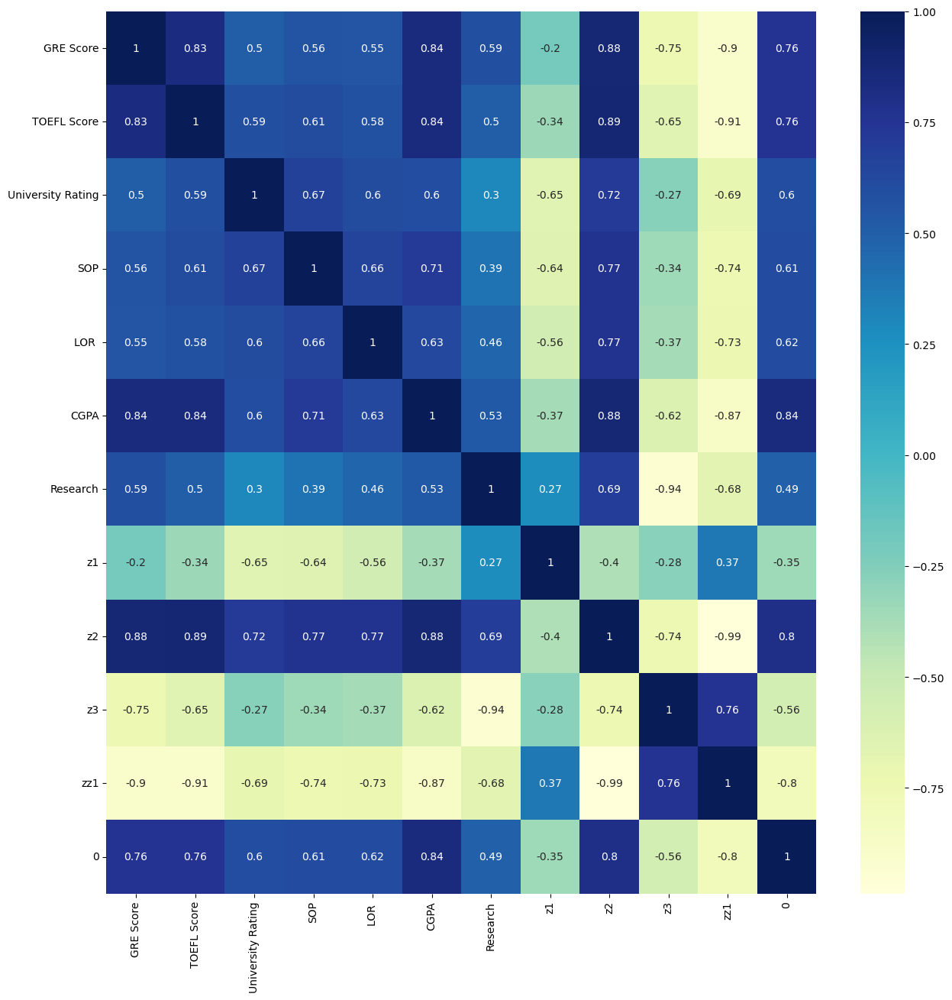

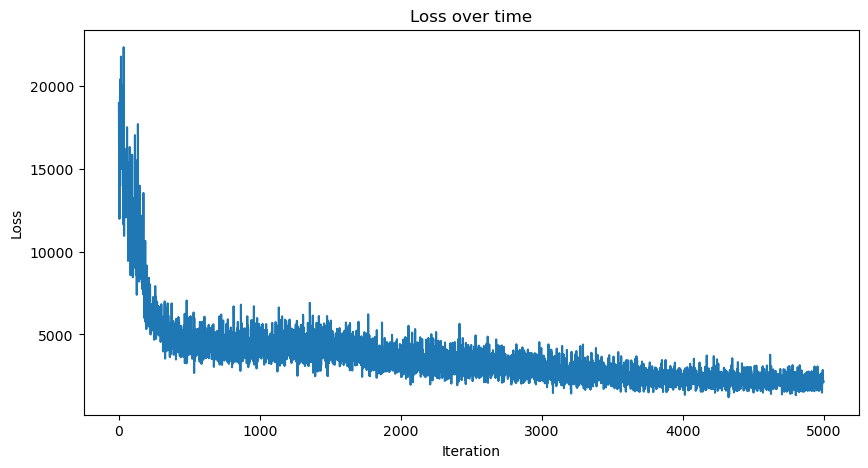

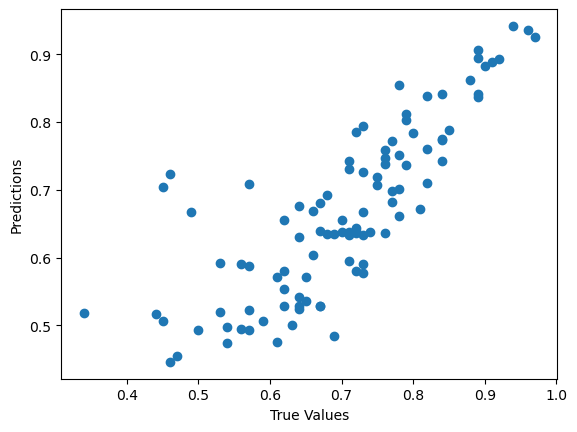

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3       zz1     0  
0 -1.847943 -2.305441  0.429234  1.918714  0.69  
1 -1.601186 -2.528747  1.284121  2.046540  0.61  
2 -1.954363 -1.340919  0.544644  1.185710  0.66  
3 -2.501032 -1.522848  0.156686  1.408969  0.67  
4  0.909943 -0.948905  0.359433  0.184191  0.46  
heatmap_VAE_xdim6_zdim3_zzdim1_lr0001_bs16_epochs200_b110000_b21_b31_b410000_b51_encZ10_10_10_encZZ10_10_dec10_10_10_

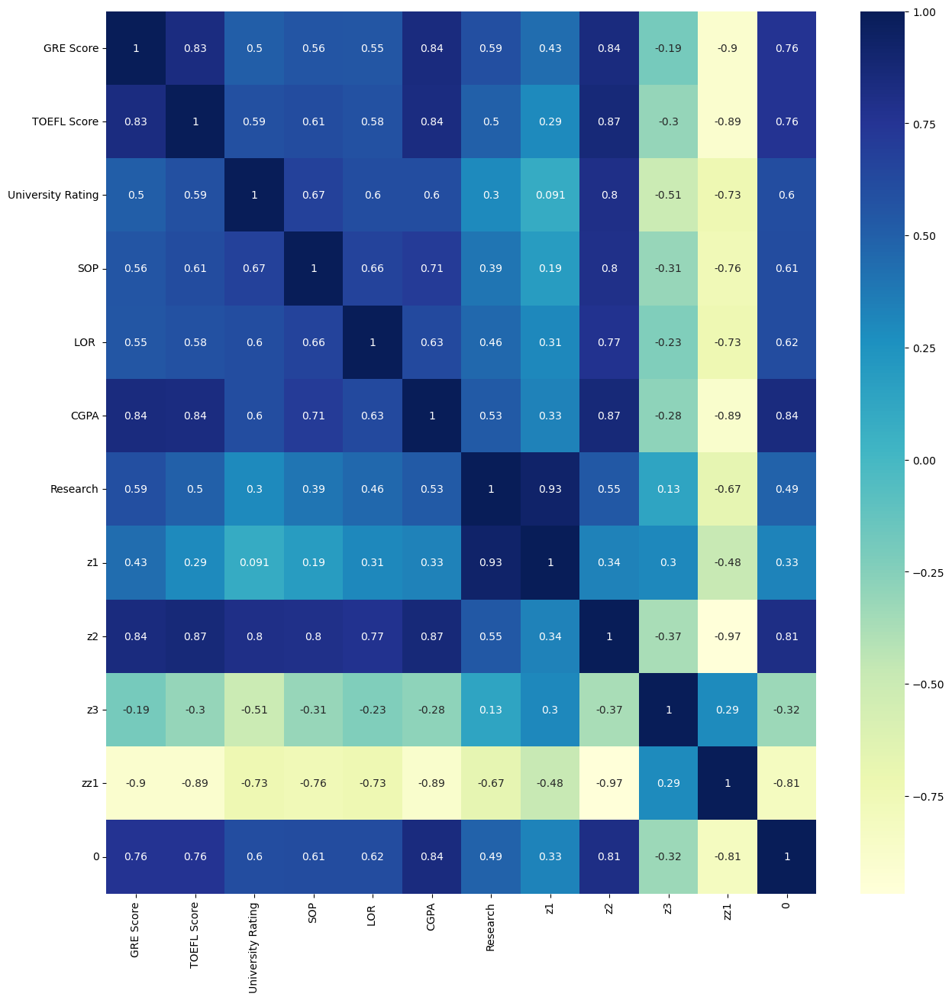

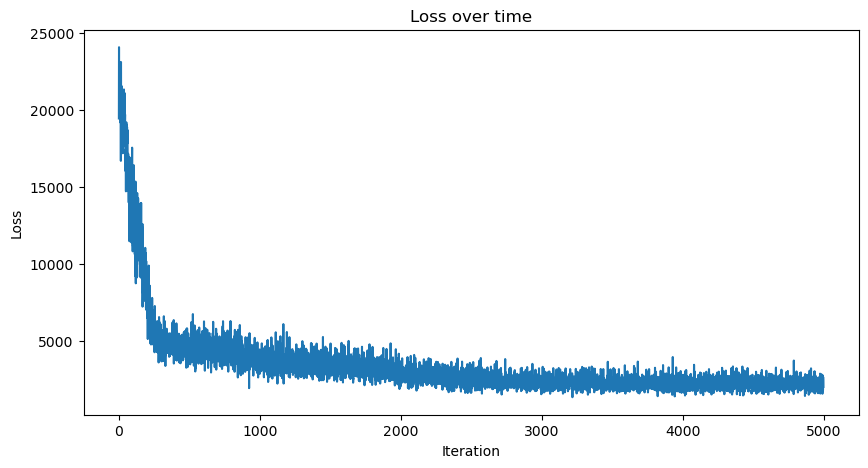

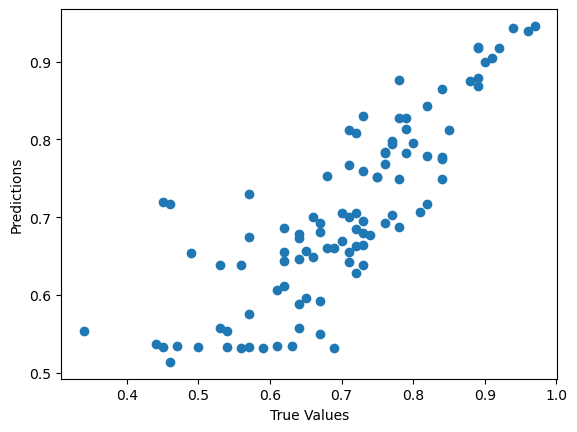

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3       zz1     0  
0 -1.999558 -0.810822  1.789864 -0.529486  0.69  
1 -2.199158 -1.132967  1.920277 -0.613740  0.61  
2 -1.194230  0.530200  1.735163  0.496030  0.66  
3 -1.106361  0.250290  1.399179  0.083661  0.67  
4 -0.108610  0.487356 -0.868887  0.962291  0.46  
heatmap_VAE_xdim6_zdim3_zzdim1_lr0001_bs16_epochs200_b110000_b21_b31_b410000_b51_encZ10_10_10_encZZ10_10_dec10_10_10_

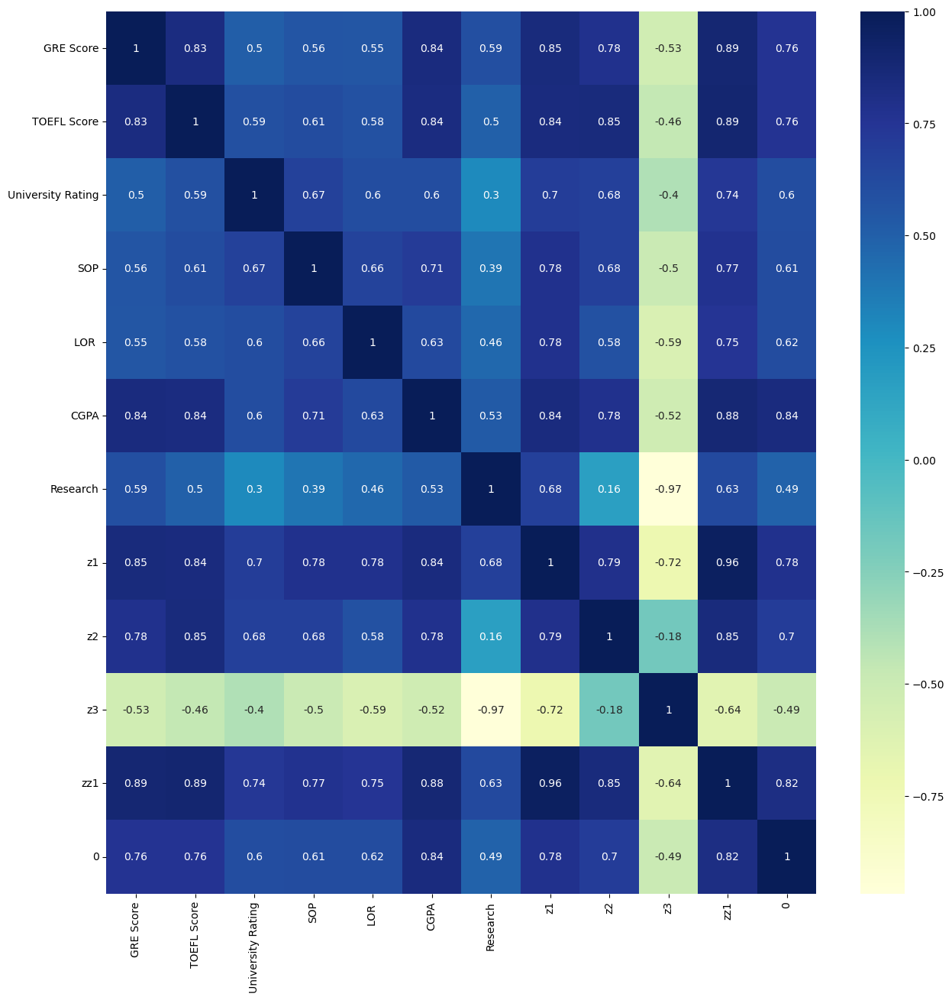

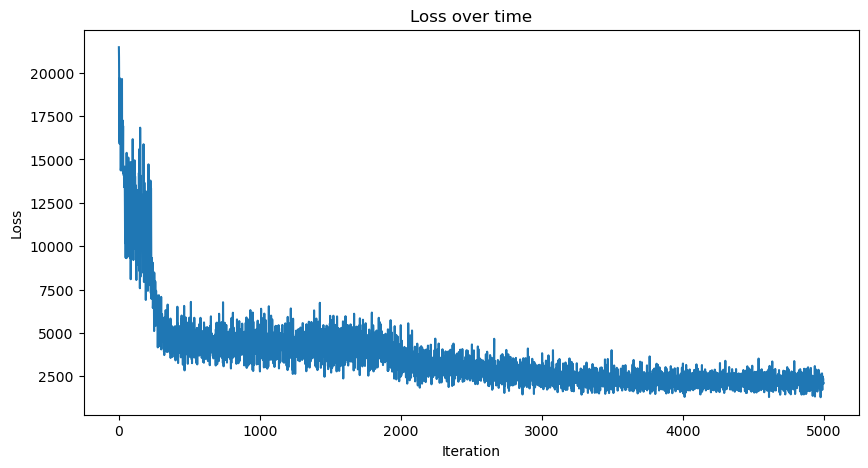

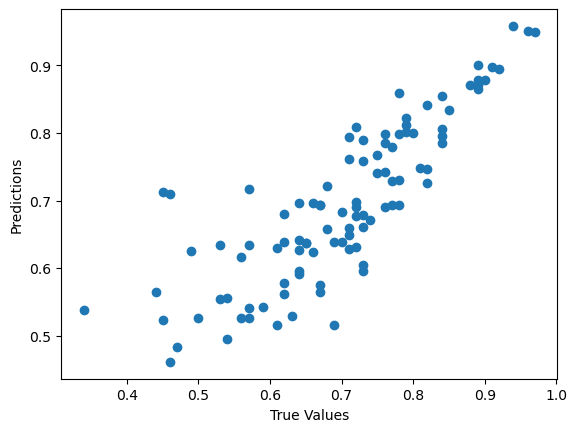

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3       zz1     0  
0 -1.487274 -0.287748 -2.473557 -1.380470  0.69  
1 -1.519887 -0.702142 -2.345859 -1.375083  0.61  
2 -0.278311  0.416239 -1.520017 -0.602641  0.66  
3 -0.572396  0.958880 -2.214841 -1.028405  0.67  
4 -0.161495 -1.454176  1.308655  0.313407  0.46  
heatmap_VAE_xdim6_zdim3_zzdim1_lr0001_bs16_epochs200_b110000_b21_b31_b410000_b51_encZ10_10_10_encZZ10_10_dec10_10_10_

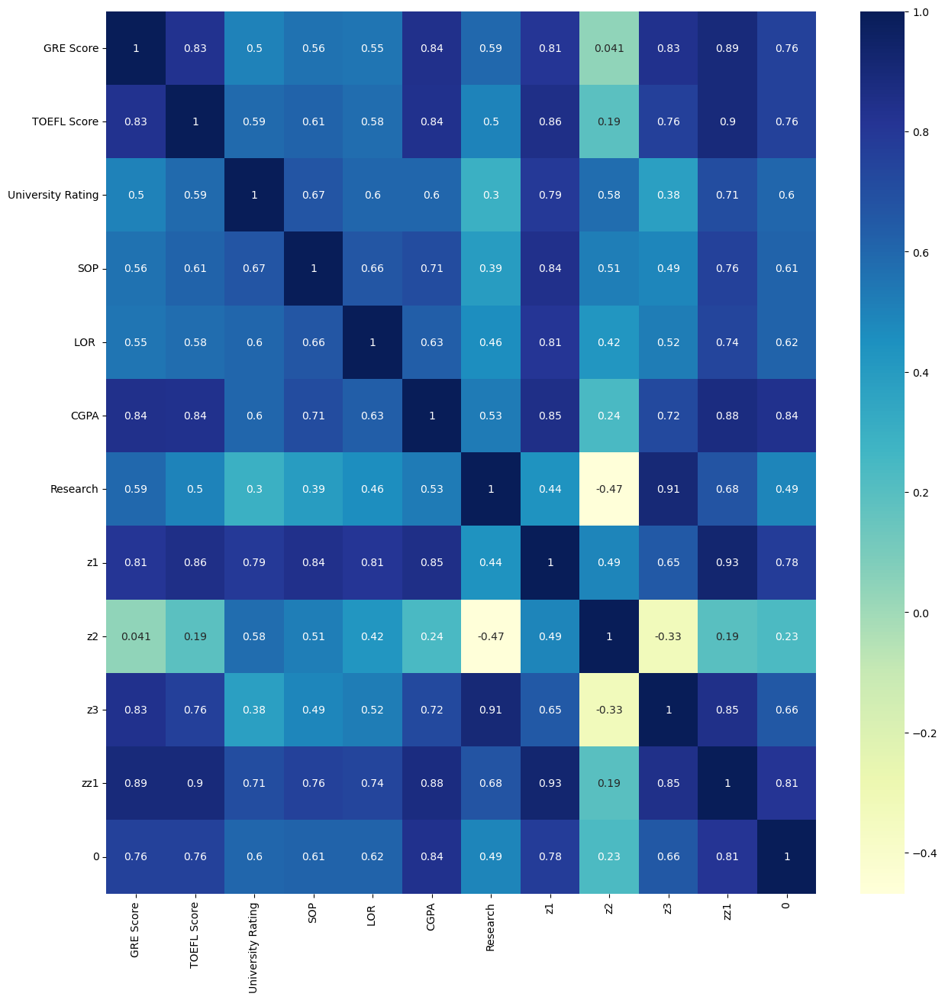

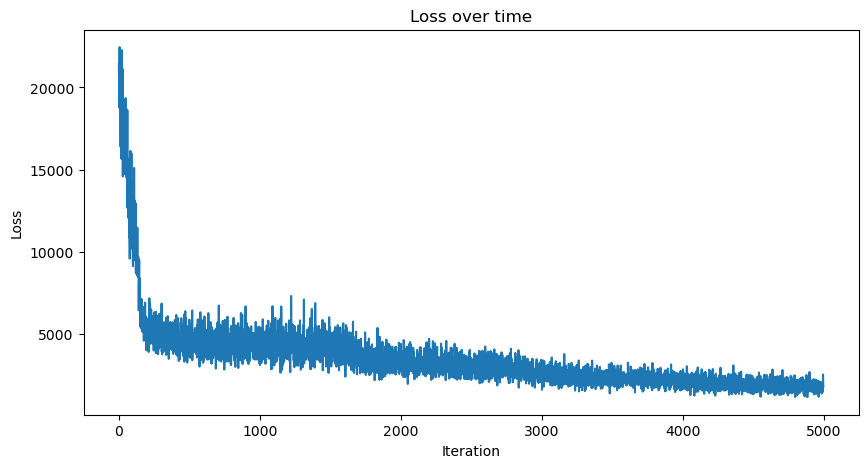

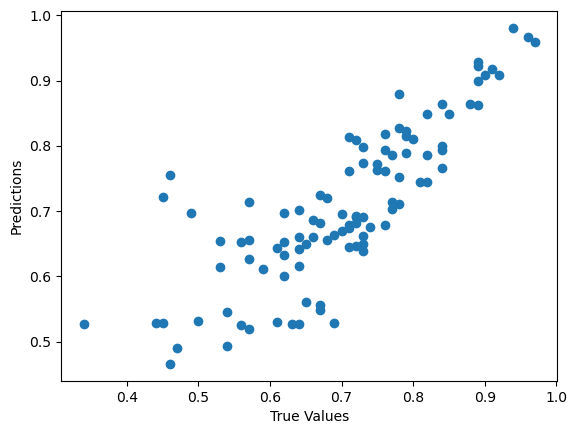

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3       zz1     0  
0 -2.278126 -1.617254  1.932624 -1.616120  0.69  
1 -2.431075 -1.539449  2.544704 -1.590670  0.61  
2 -1.282155 -1.038260  2.706574 -0.886075  0.66  
3 -1.372682 -1.516672  1.358258 -1.298559  0.67  
4 -1.666408  0.844985  0.180576  0.175017  0.46  
heatmap_VAE_xdim6_zdim3_zzdim1_lr0001_bs16_epochs200_b110000_b21_b31_b410000_b51_encZ10_10_10_encZZ10_10_dec10_10_10_

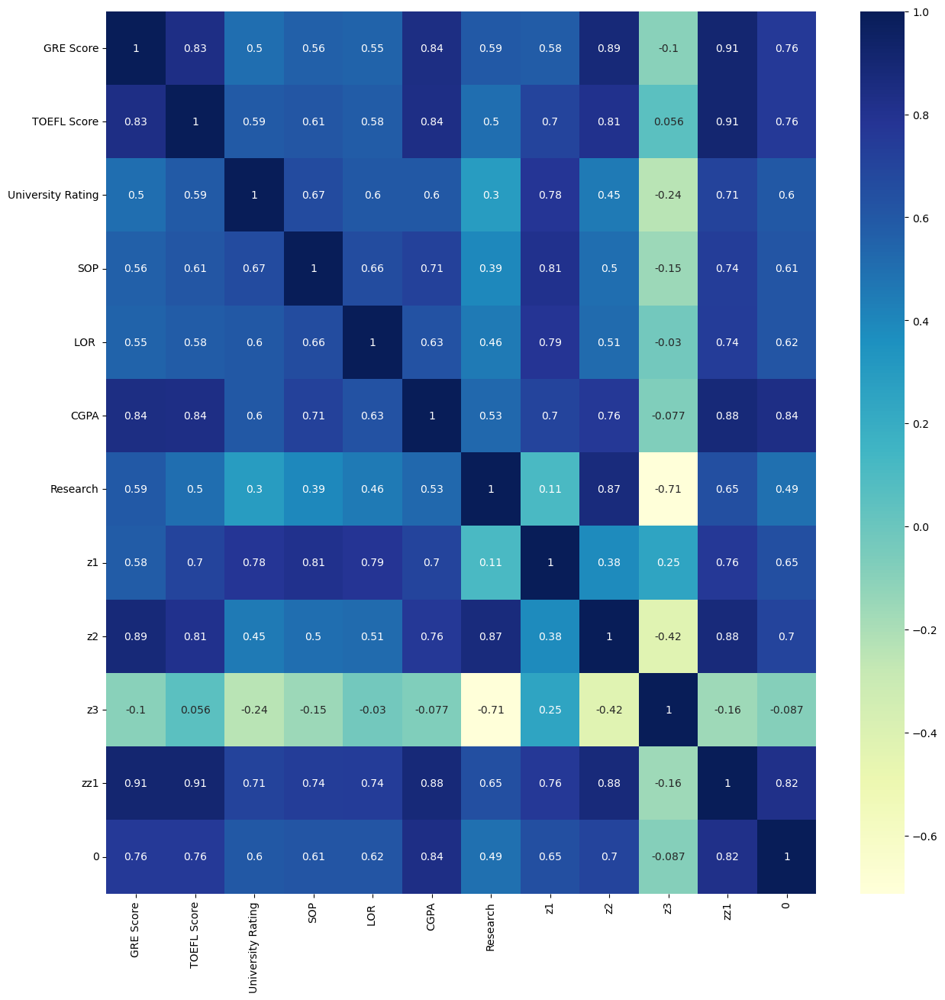

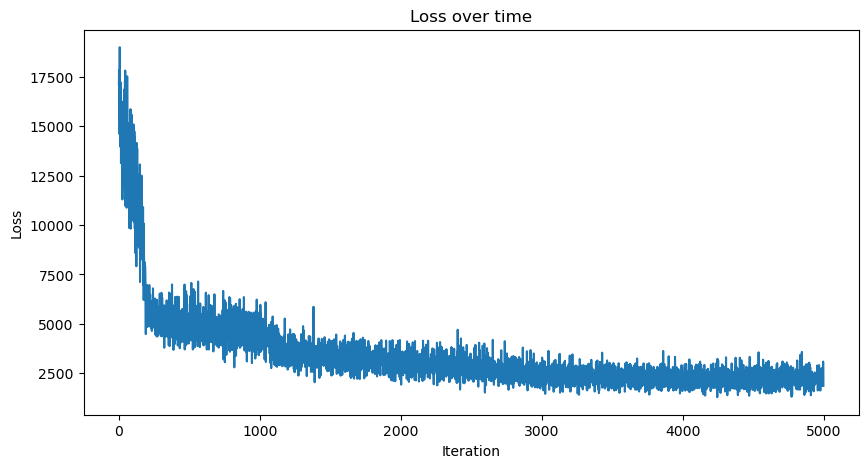

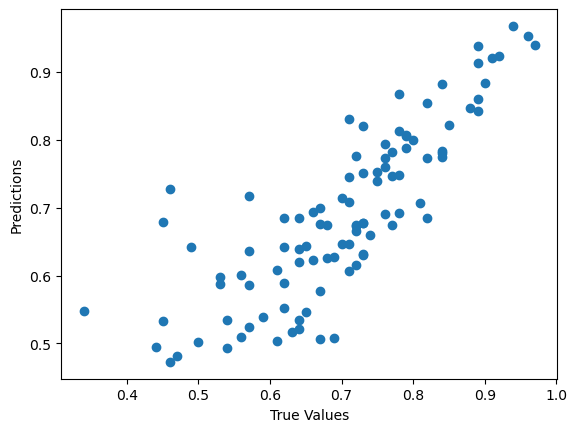

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3       zz1     0  
0  0.358465  2.409402 -0.359004  0.234123  0.69  
1  0.267734  2.558824 -0.705356  0.248427  0.61  
2  0.824697  1.468658  0.301058 -0.045946  0.66  
3  0.430847  1.498839 -0.172447  0.020743  0.67  
4 -1.562610  0.230083 -1.379725 -0.402791  0.46  
heatmap_VAE_xdim6_zdim3_zzdim1_lr0001_bs16_epochs200_b110000_b21_b31_b410000_b51_encZ10_10_10_encZZ10_10_dec10_10_10_

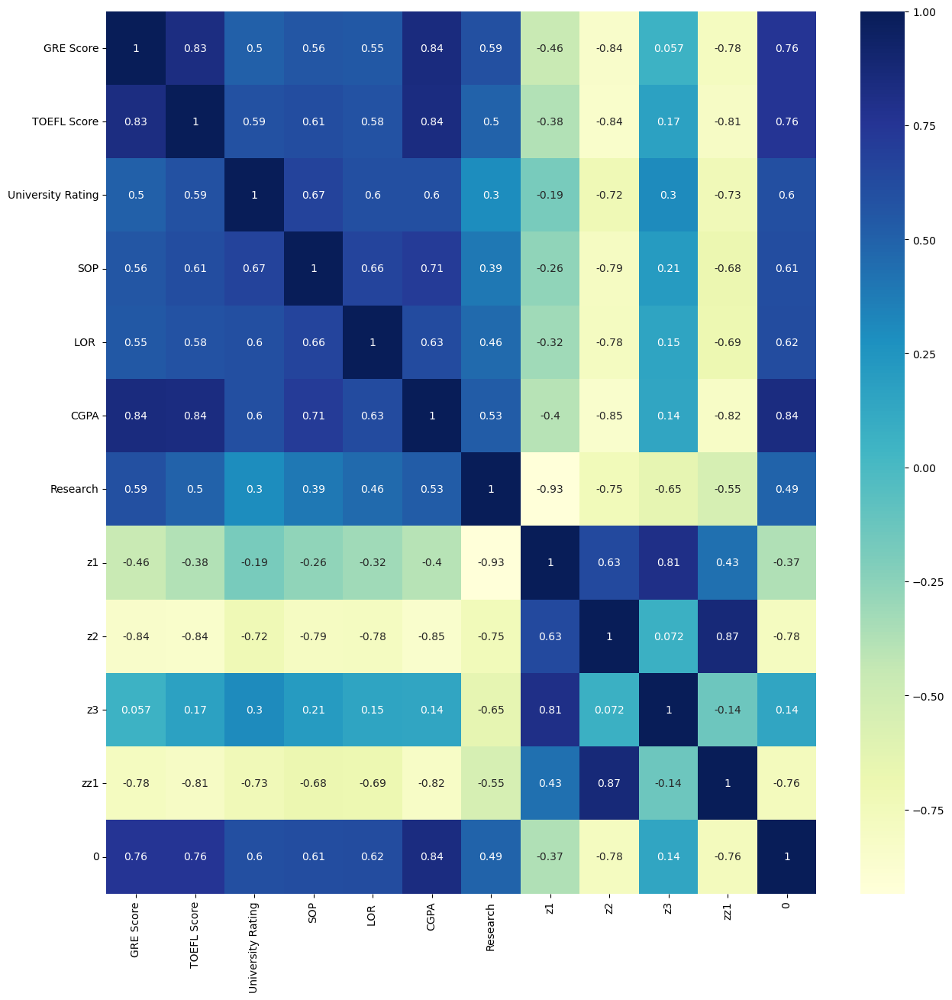

In [14]:
for i in range(20):
    mod,r,lt,ltt=train_VAE(X_train_scaled,X_test_scaled,X_test,y_train.values,y_test.values,configs[0],'./Test',save_pictures=True,freeze_weights=False,z_and_zz_to_y=False)
    if r>0.683:
        dict_d=dict(configs[0])
        r2_text = str(r).replace(".", "_")
        torch.save(mod,f"./Admission/Models/Admission_No_freeze_zz_to_y_R2_{r2_text}_model.zip")
        with open(f"./Admission/Models/Config_Admission_No_freeze_zz_to_y_R2_{r2_text}.json", 'w') as outfile:
            json.dump(dict_d, outfile)

# Freeze z_and_zz to y 

{'config': {'x_dim': 6,
  'z_dim': 4,
  'zz_dim': 1,
  'encoder_z_layers': [10, 10, 10],
  'encoder_zz_layers': [10, 10],
  'decoder_layers': [10, 10, 10, 6],
  'fc_z_to_y_layers': [12, 12, 1]},
 'beta': {'b1': 10000, 'b2': 1, 'b3': 1, 'b4': 10000, 'b5': 1},
 'lr': 0.001,
 'batch_size': 32,
 'num_epochs': 600}

In [5]:
import itertools

# Define the ranges for your parameters
x_dim_values = [X_train_with_confounder.shape[1]]
z_dim_values = [4]
zz_dim_values = [1]
encoder_z_layers_values = [[10,10,10]]
encoder_zz_layers_values = [[10,10]]
#decoder_layers_values = [[14,X_train_with_confounder.shape[1]],[32, 32,X_train_with_confounder.shape[1]],[128,128,128,X_train_with_confounder.shape[1]]]
fc_z_to_y_layers_values = [[12,12,1],]

# Get all combinations
configurations = list(itertools.product(x_dim_values, z_dim_values, zz_dim_values, encoder_z_layers_values, encoder_zz_layers_values, fc_z_to_y_layers_values))

# Convert to a list of dictionaries
config_dicts = [{'x_dim': x_dim, 'z_dim': z_dim, 'zz_dim': zz_dim, 'encoder_z_layers': encoder_z_layers, 'encoder_zz_layers': encoder_zz_layers, 'decoder_layers': encoder_z_layers+ [x_dim], 'fc_z_to_y_layers': fc_z_to_y_layers} for x_dim, z_dim, zz_dim, encoder_z_layers, encoder_zz_layers, fc_z_to_y_layers in configurations]
print(config_dicts)
# Define betas
BETAS=[
    #{'b1': 6, 'b2': 1, 'b3': 1, 'b4': 6,'b5':1},
    #{'b1': 1, 'b2': 1, 'b3': 1, 'b4': 1000,'b5':1},
    #{'b1': 100, 'b2': 1, 'b3': 100, 'b4': 100,'b5':1},
    #{'b1': 100,'b2': 1, 'b3': 1, 'b4': 10,'b5':1},  
    #{'b1': 10000, 'b2': 1, 'b3': 1, 'b4': 10000,'b5':1},
    {'b1': 10000, 'b2': 1, 'b3': 1, 'b4': 10000,'b5':1}
]
import itertools

# Define the ranges for your parameters
lr_values = [1e-3]
batch_size_values = [32]
num_epochs_values = [600]

# Get all combinations
configs = list(itertools.product(config_dicts, BETAS, lr_values, batch_size_values, num_epochs_values))

# Convert to a list of dictionaries
configs = [{'config': config, 'beta': beta, 'lr': lr, 'batch_size': bs, 'num_epochs': epochs} for config, beta, lr, bs, epochs in configs]
print(len(configs))

[{'x_dim': 6, 'z_dim': 4, 'zz_dim': 1, 'encoder_z_layers': [10, 10, 10], 'encoder_zz_layers': [10, 10], 'decoder_layers': [10, 10, 10, 6], 'fc_z_to_y_layers': [12, 12, 1]}]
1


{'config': {'x_dim': 6, 'z_dim': 4, 'zz_dim': 1, 'encoder_z_layers': [10, 10, 10], 'encoder_zz_layers': [10, 10], 'decoder_layers': [10, 10, 10, 6], 'fc_z_to_y_layers': [12, 12, 1]}, 'beta': {'b1': 10000, 'b2': 1, 'b3': 1, 'b4': 10000, 'b5': 1}, 'lr': 0.001, 'batch_size': 16, 'num_epochs': 1000}
False
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1                   [-1, 10]              70
              ReLU-2                   [-1, 10]               0
            Linear-3                   [-1, 10]             110
              ReLU-4                   [-1, 10]               0
            Linear-5                   [-1, 10]             110
              ReLU-6                   [-1, 10]               0
            Linear-7                    [-1, 4]              44
            Linear-8                    [-1, 4]              44
            Linear-9                   [-1, 10]         

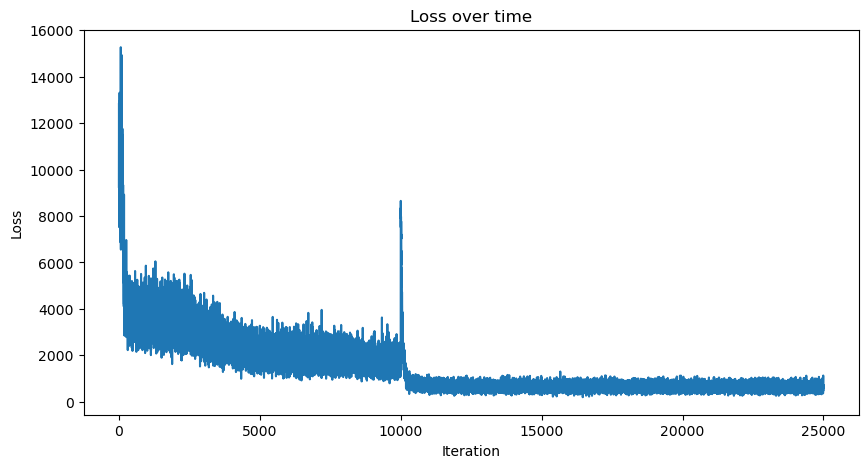

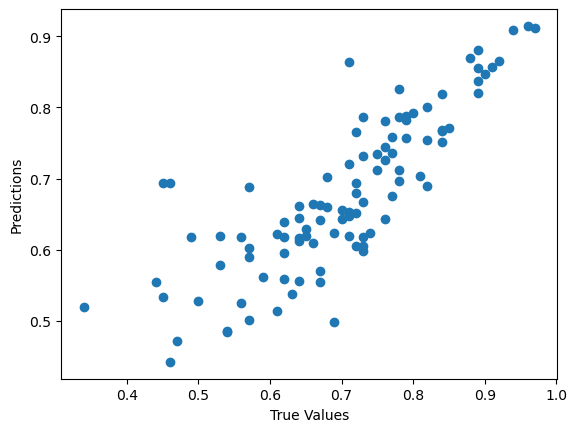

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3        z4       zz1     0  
0  1.233814  1.620143  2.505172  1.359213  1.082816  0.69  
1  1.518008  1.576735  2.407320  0.839287  0.821358  0.61  
2  0.408985  1.240105  1.372706  0.185796  1.151196  0.66  
3  0.153556  1.164308  1.983670 -0.507411  1.054998  0.67  
4 -0.148329 -0.699266  1.753683  1.218861  2.466534  0.46  
heatmap_VAE_xdim6_zdim4_zzdim1_lr0001_bs16_epochs1000_b11

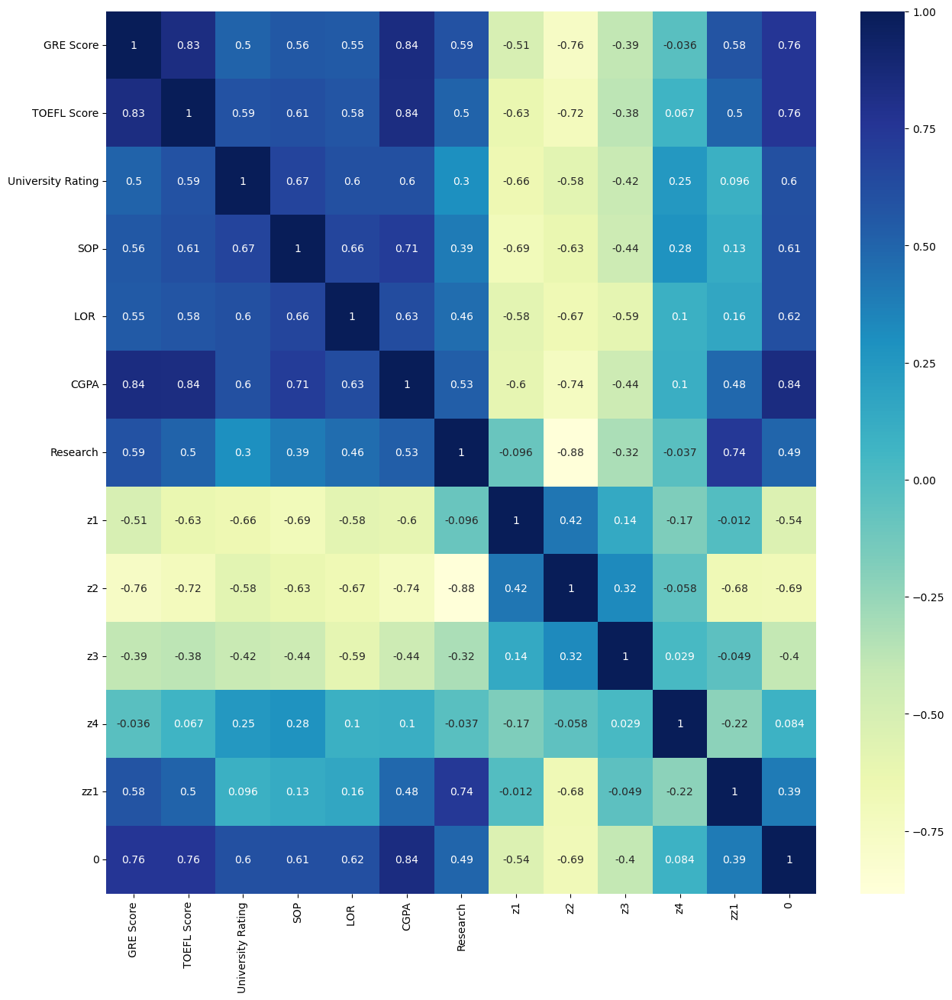

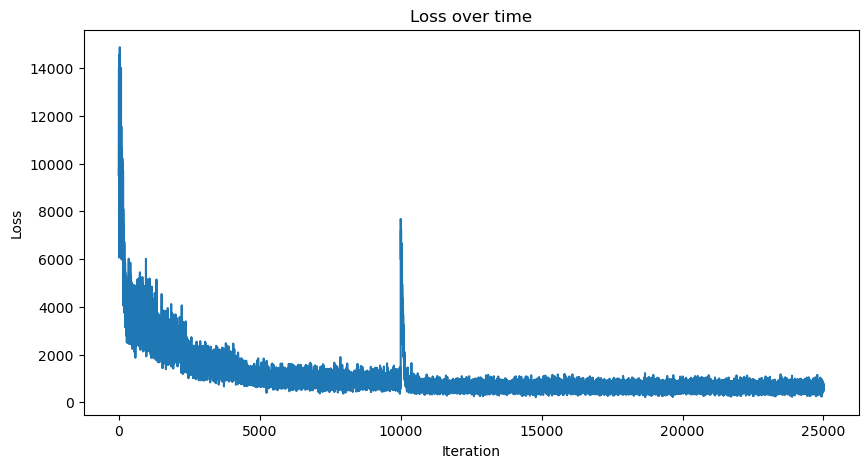

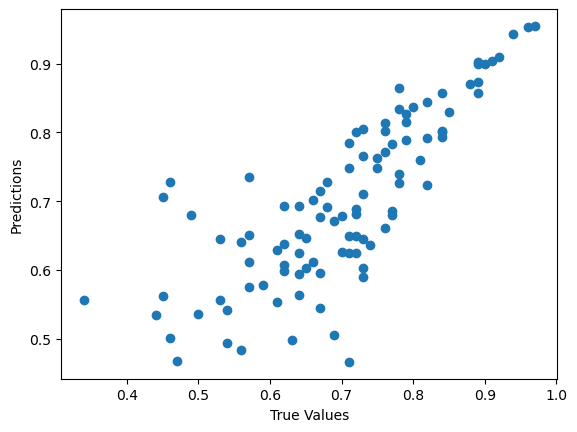

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3        z4       zz1     0  
0  1.670391  0.599681 -0.329268 -1.559193 -2.130895  0.69  
1  1.057787  0.650495  0.248221 -1.894367 -1.552338  0.61  
2  0.867524 -1.532925  0.305856 -1.014102 -1.639193  0.66  
3  1.611140 -0.629691  0.240679 -0.655368 -1.624117  0.67  
4 -1.317569  0.505273  0.212285 -0.924090 -2.406372  0.46  
heatmap_VAE_xdim6_zdim4_zzdim1_lr0001_bs16_epochs1000_b11

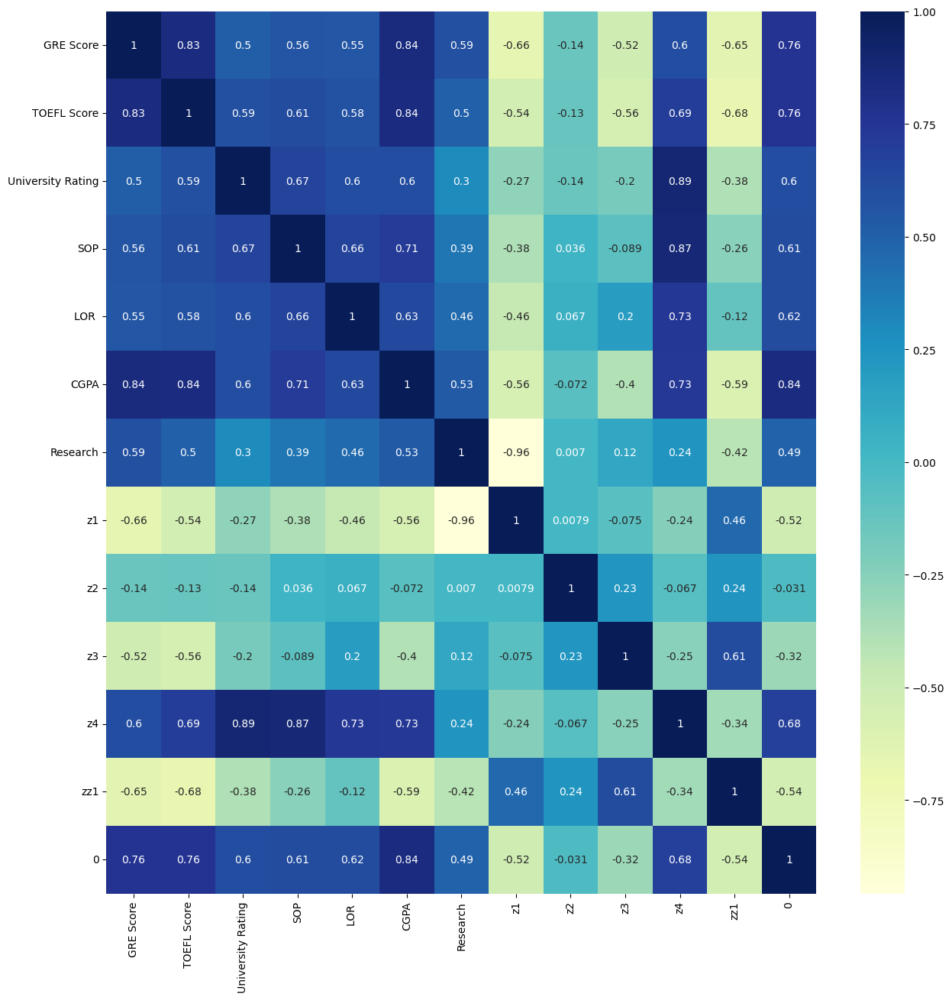

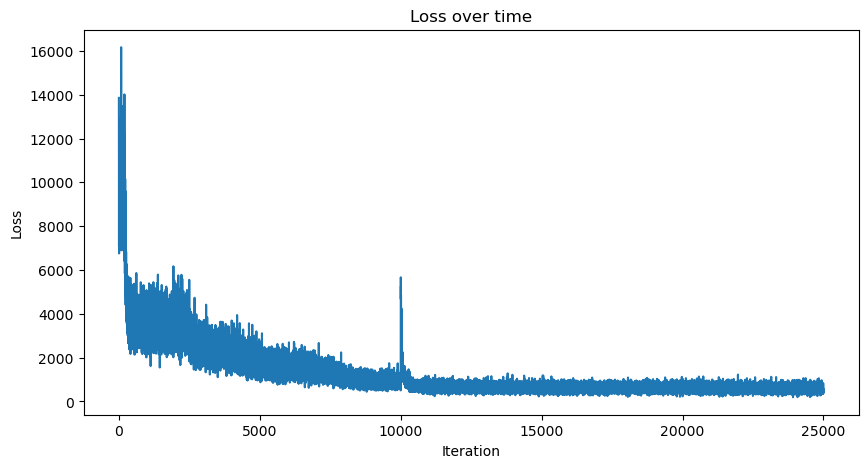

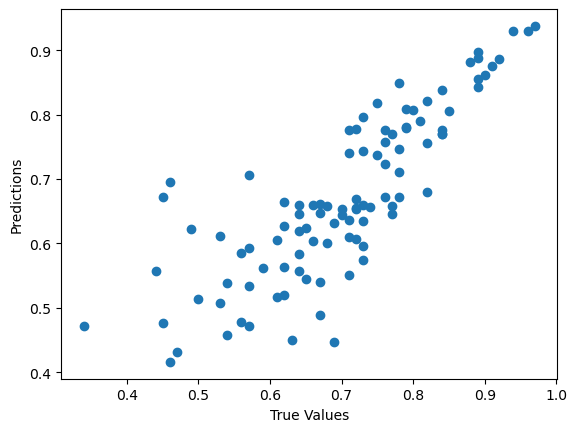

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3        z4       zz1     0  
0 -1.380027  1.703496  1.801377 -0.929958 -2.555985  0.69  
1 -1.544159  1.964938  0.887410  1.029622 -1.661951  0.61  
2 -0.507330  1.580841  1.235058 -0.130563 -1.975372  0.66  
3 -0.550351  1.543770  2.446589  1.070888 -2.262091  0.67  
4 -1.279860 -1.102131  0.427774 -0.931340 -1.405717  0.46  
heatmap_VAE_xdim6_zdim4_zzdim1_lr0001_bs16_epochs1000_b11

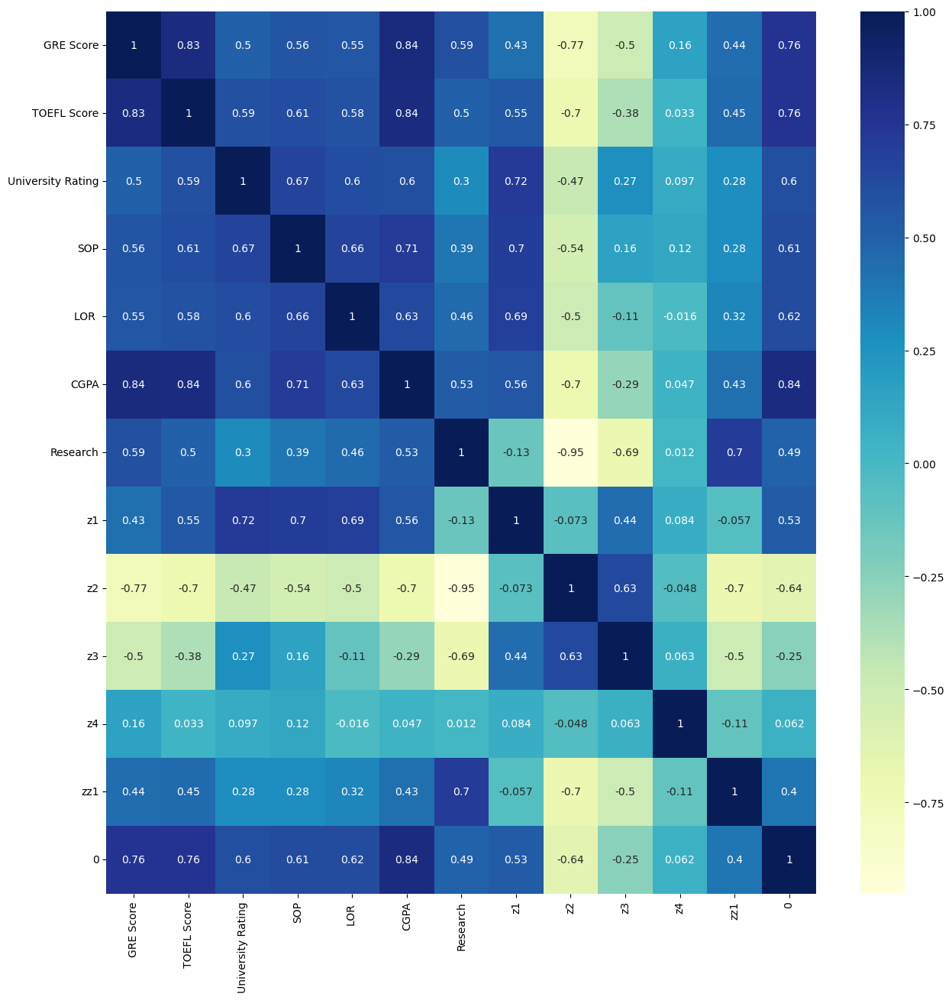

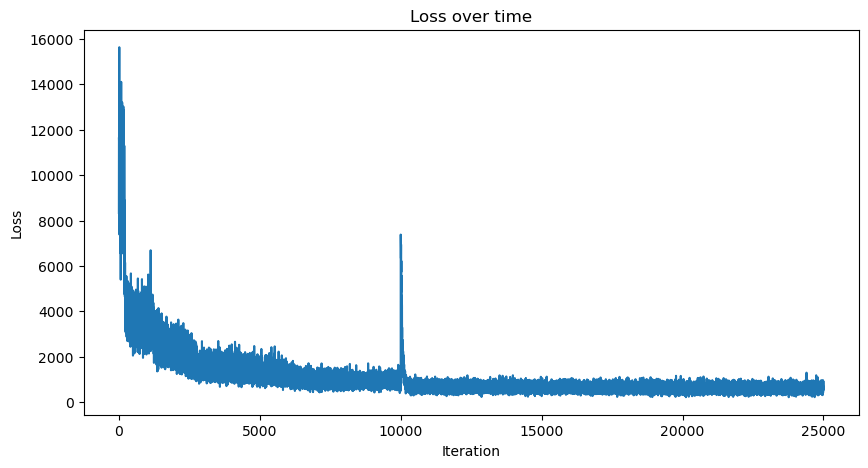

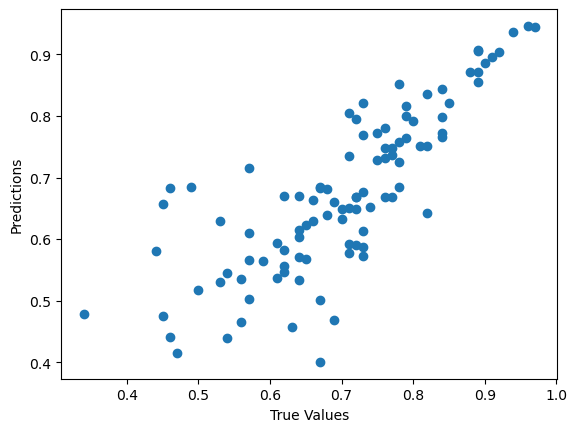

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3        z4       zz1     0  
0 -0.696495  1.853312  0.494751 -0.961704  3.503084  0.69  
1 -0.073957  2.050876  1.805582 -0.570004  2.251538  0.61  
2 -0.443860  0.940846 -0.351397 -0.898731  1.992760  0.66  
3 -1.354154  1.010088 -0.632494 -0.835453  2.670334  0.67  
4  1.062459 -0.445101 -0.780195  1.046559  2.157182  0.46  
heatmap_VAE_xdim6_zdim4_zzdim1_lr0001_bs16_epochs1000_b11

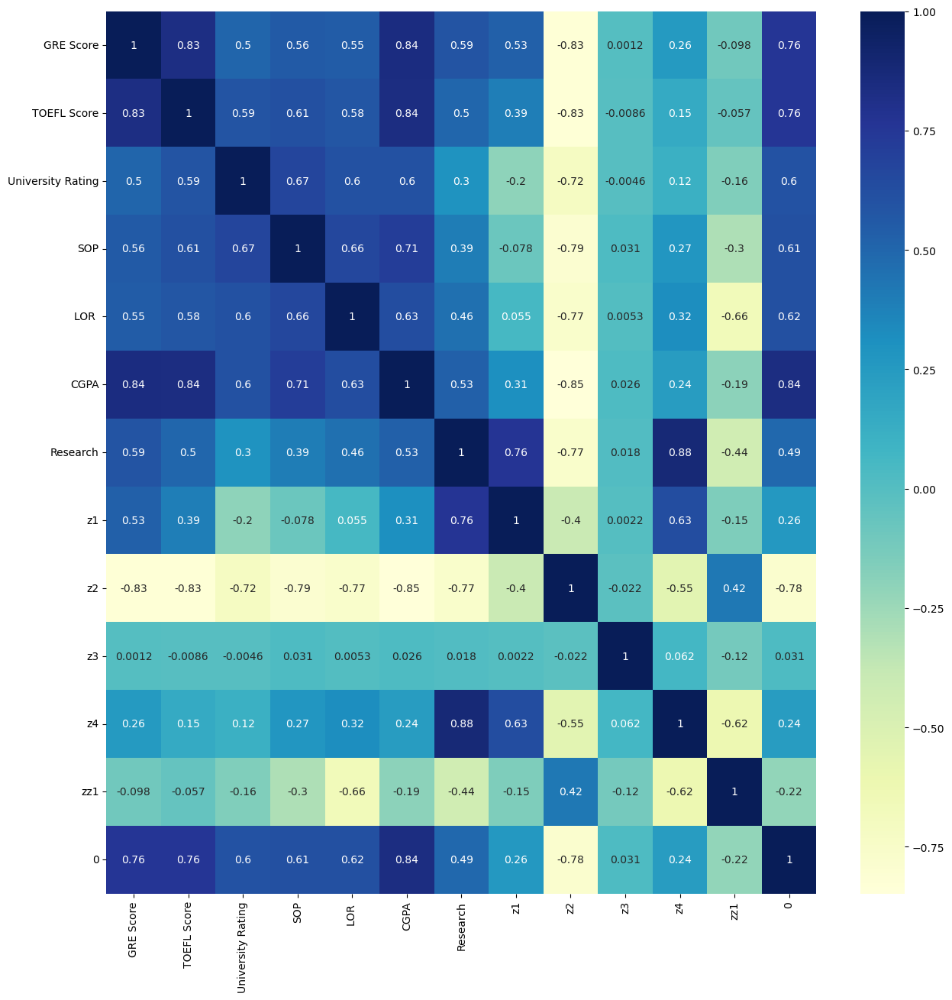

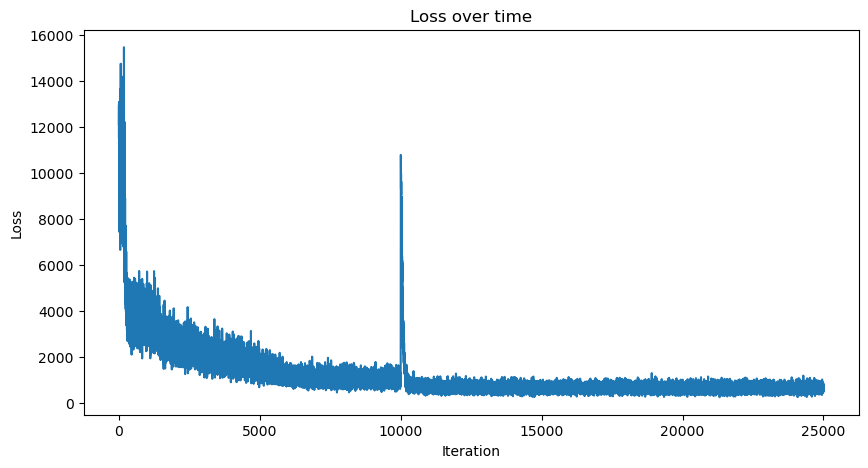

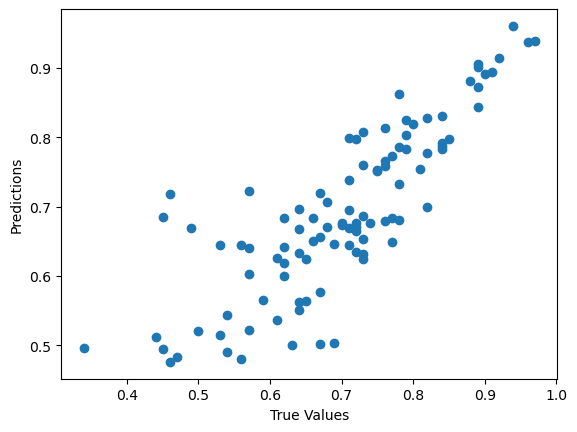

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3        z4       zz1     0  
0 -1.170668  2.281149  0.517201  1.227130 -2.222926  0.69  
1 -1.618060  2.212283 -0.301280  0.316241 -2.290289  0.61  
2 -0.722197  1.570293  0.334151 -0.120989 -3.169876  0.66  
3 -0.268205  2.267200  0.736051  0.548530 -2.670186  0.67  
4  0.483063  0.074754 -1.236137  0.979718 -3.349763  0.46  
heatmap_VAE_xdim6_zdim4_zzdim1_lr0001_bs16_epochs1000_b11

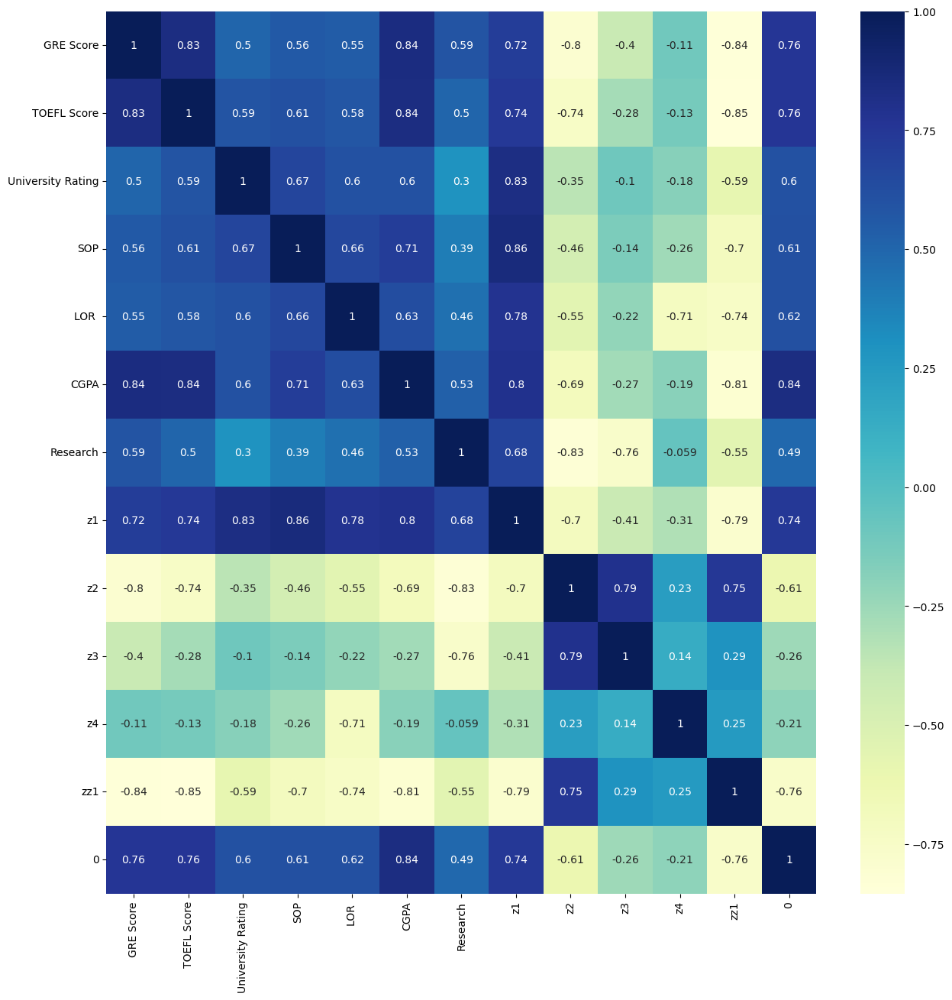

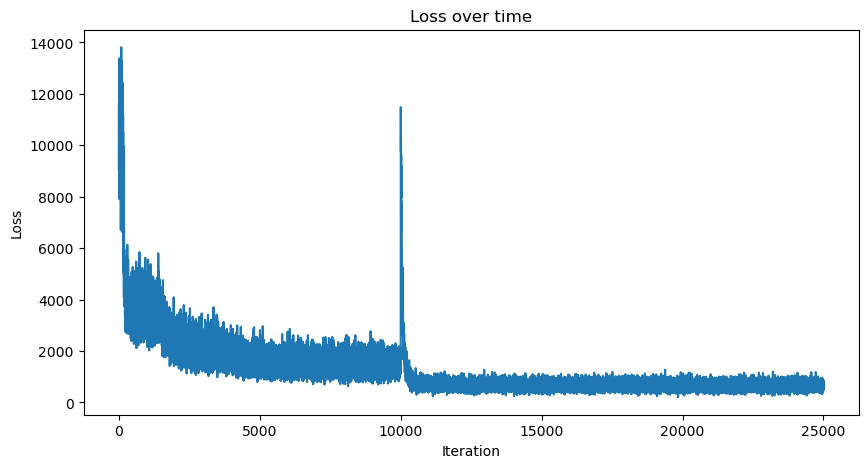

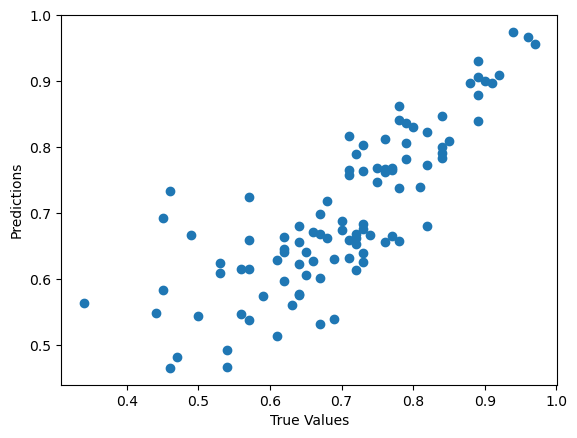

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3        z4       zz1     0  
0  0.295228  1.767928 -0.791172 -1.138422  2.223510  0.69  
1 -0.001144  1.865922 -0.275377 -1.669156  2.221927  0.61  
2  0.787709  1.067923  0.480967  1.590436  2.259553  0.66  
3  0.551643  0.942002  0.314708 -1.168173  1.721666  0.67  
4 -0.898991 -0.131473 -1.054065 -0.098253  0.922595  0.46  
heatmap_VAE_xdim6_zdim4_zzdim1_lr0001_bs16_epochs1000_b11

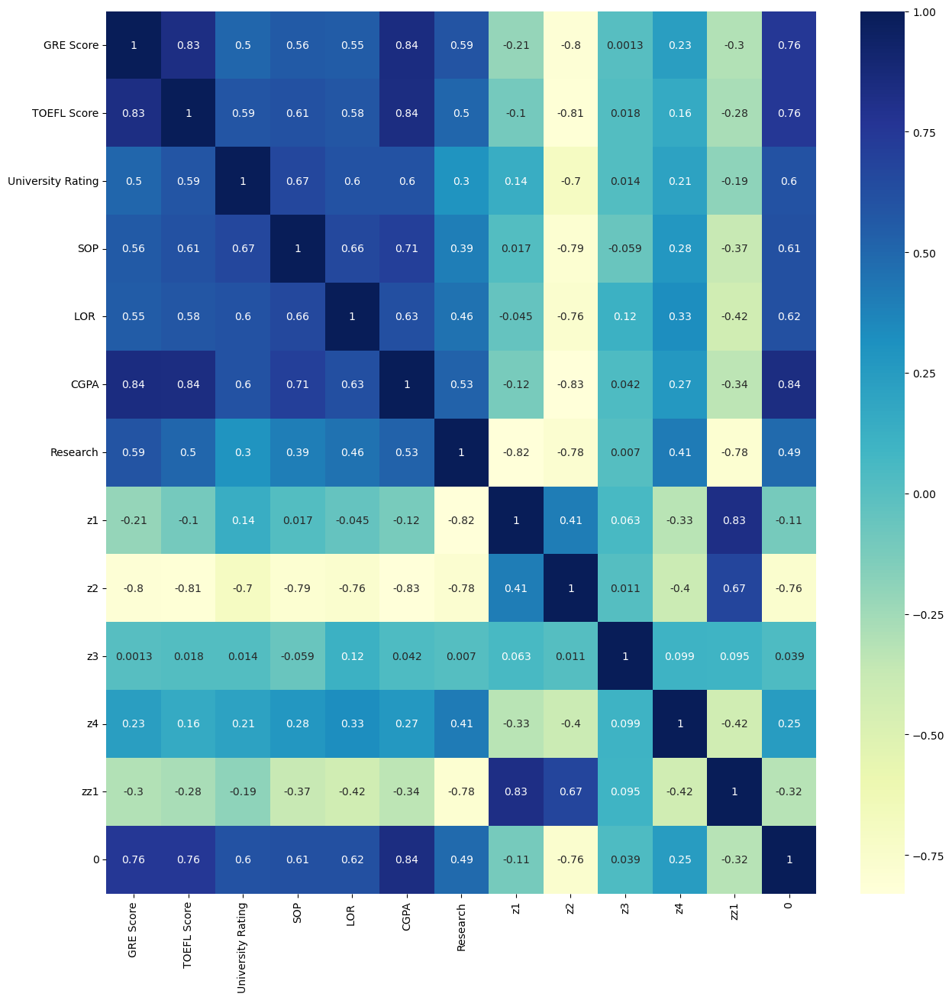

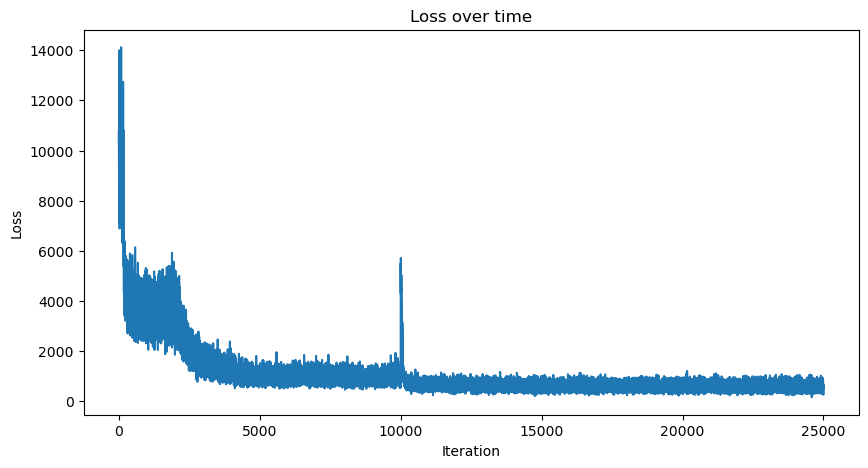

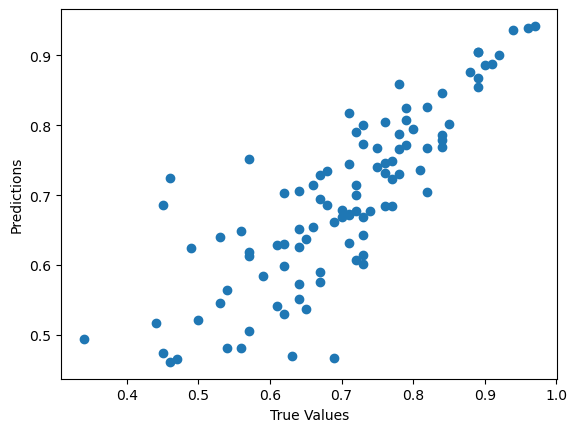

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3        z4       zz1     0  
0 -1.066548  1.725314  1.746079  1.367948  0.033049  0.69  
1 -1.504272  0.936365  1.438955  0.658915 -1.621756  0.61  
2 -0.369890  0.859201  1.127927  0.910722 -1.467898  0.66  
3 -0.047227  1.591059  1.851621  0.115861  0.396058  0.67  
4 -0.790050  0.671394 -1.120302 -0.423773 -0.738770  0.46  
heatmap_VAE_xdim6_zdim4_zzdim1_lr0001_bs16_epochs1000_b11

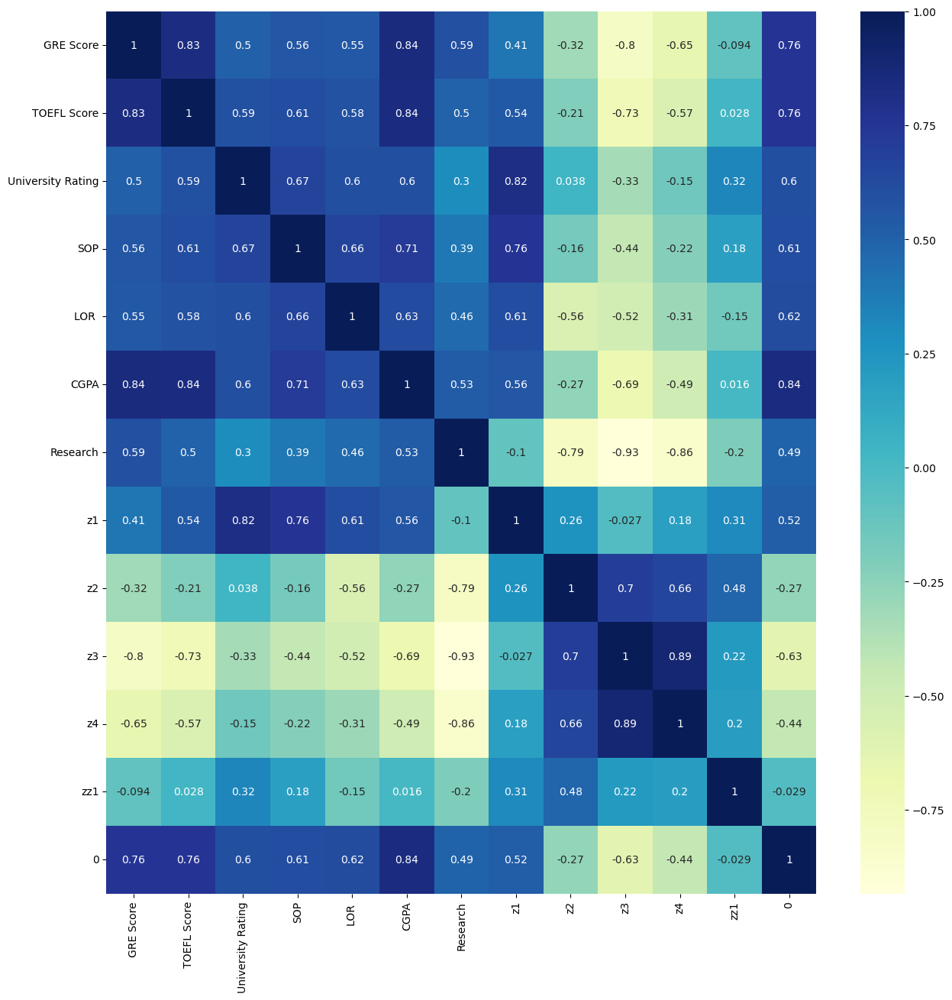

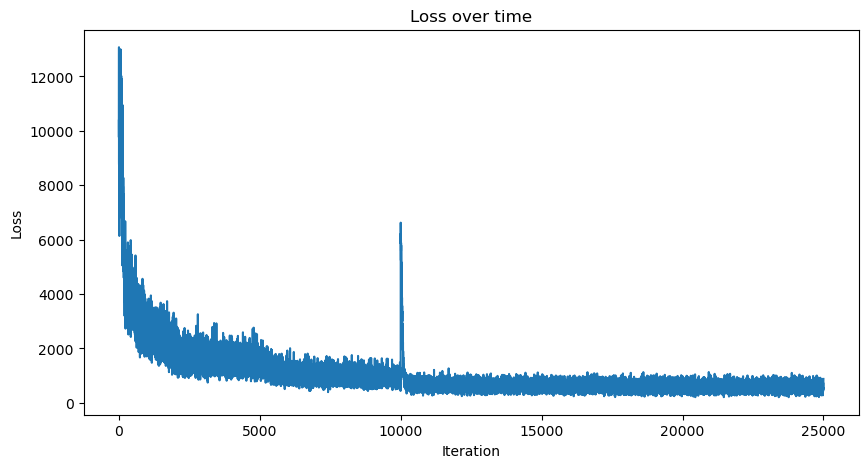

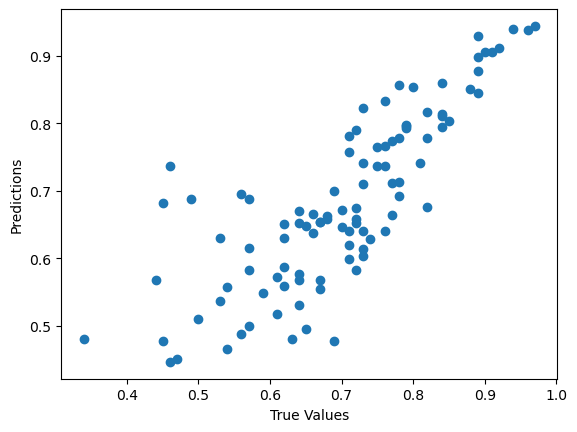

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3        z4       zz1     0  
0 -1.156689 -1.655110 -1.931191  0.536899  1.806227  0.69  
1  1.393279 -1.972125 -1.637155 -0.022344  2.859772  0.61  
2 -0.977971 -0.858595 -1.352915 -0.376640  2.519622  0.66  
3 -0.862720 -0.683067 -2.132435 -0.250528  1.525148  0.67  
4  0.149203 -1.128909  0.848900 -0.061633 -1.228773  0.46  
heatmap_VAE_xdim6_zdim4_zzdim1_lr0001_bs16_epochs1000_b11

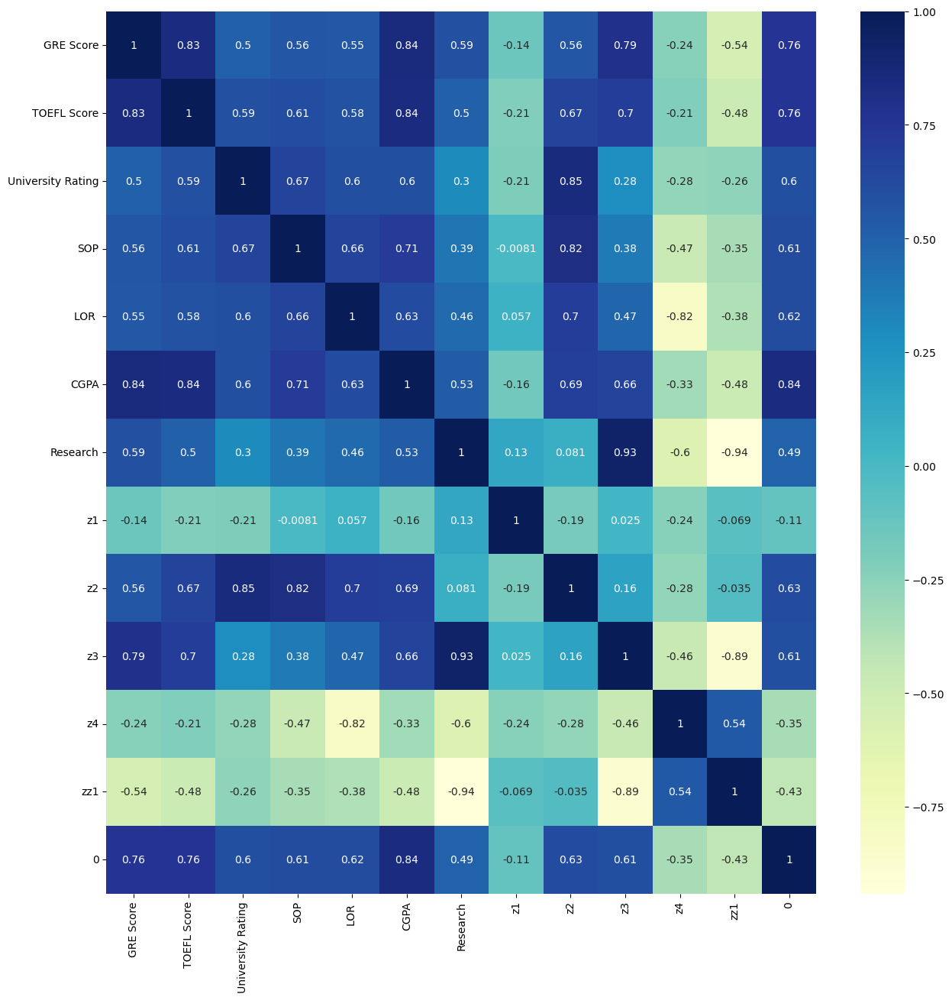

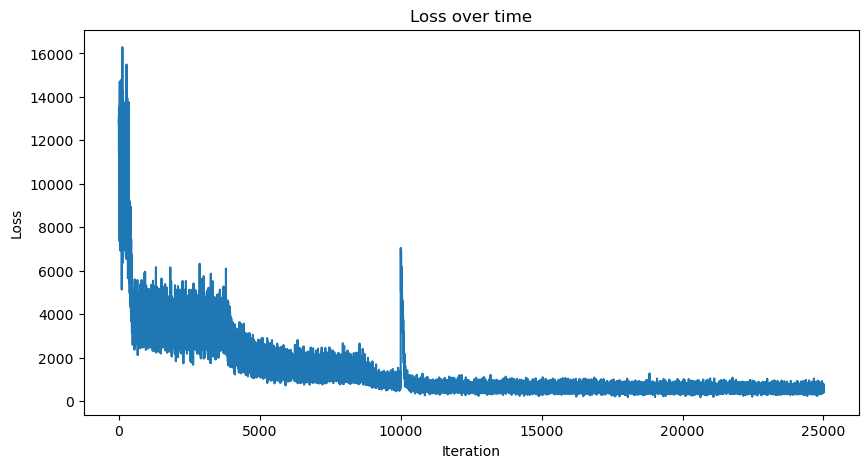

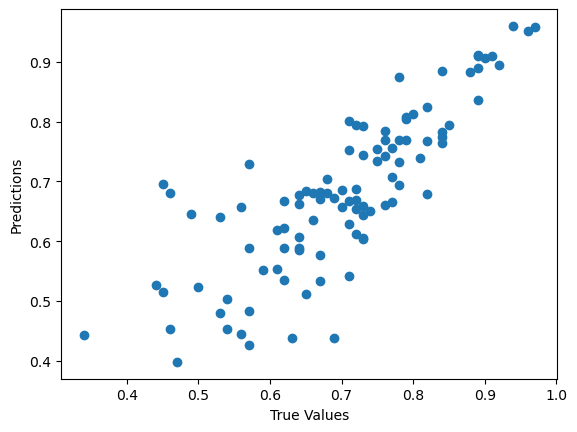

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3        z4       zz1     0  
0 -1.131205  2.188386 -1.353259  1.018391 -1.174308  0.69  
1 -0.180702  2.512471 -0.640927  1.803039 -1.017244  0.61  
2 -1.546484  1.321381 -0.834859  1.831084 -0.289526  0.66  
3  1.287697  1.368487 -2.072596  1.144991 -0.998090  0.67  
4  2.594293  0.197356  1.413935 -0.280172  1.156101  0.46  
heatmap_VAE_xdim6_zdim4_zzdim1_lr0001_bs16_epochs1000_b11

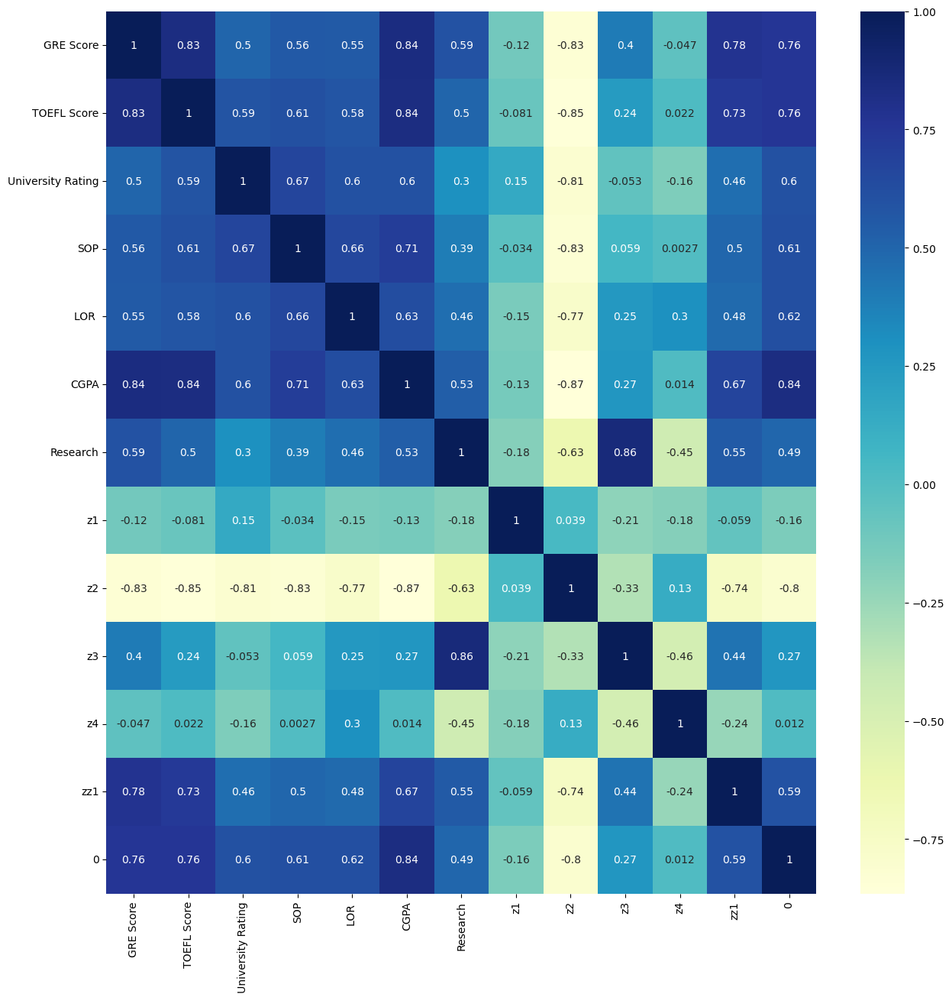

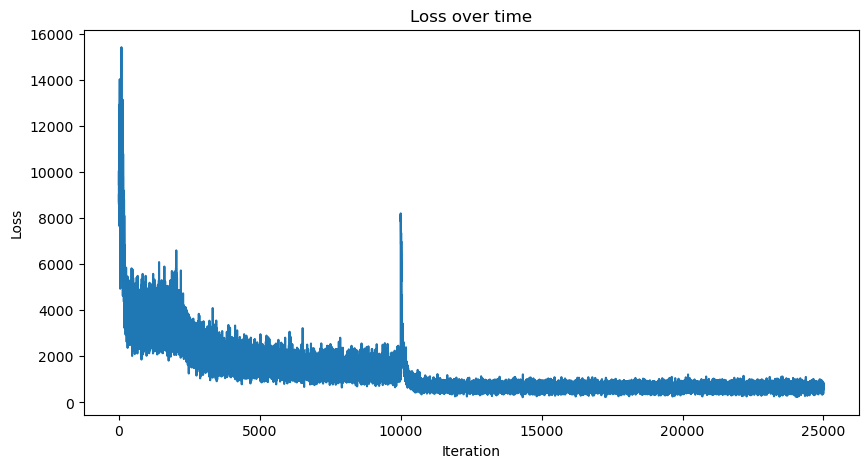

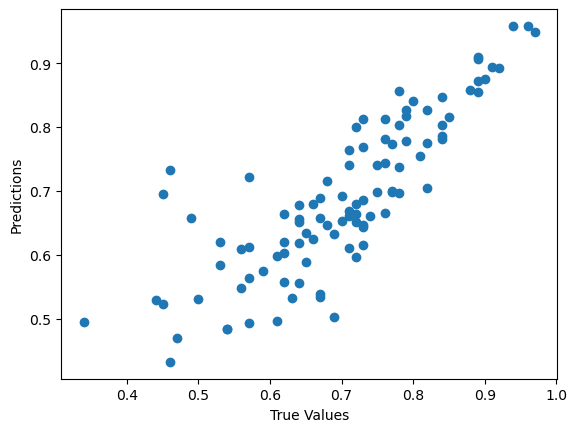

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3        z4       zz1     0  
0 -0.188765 -1.225550  1.353139 -2.354321 -0.946117  0.69  
1  0.022462  0.599664 -0.798932 -2.515062 -1.296525  0.61  
2 -0.600695  0.071706  0.738003 -1.486869 -0.953736  0.66  
3 -1.029922  0.435887 -0.741093 -1.715837 -0.912561  0.67  
4  1.454831 -0.186767 -1.292307  0.263140  0.355548  0.46  
heatmap_VAE_xdim6_zdim4_zzdim1_lr0001_bs16_epochs1000_b11

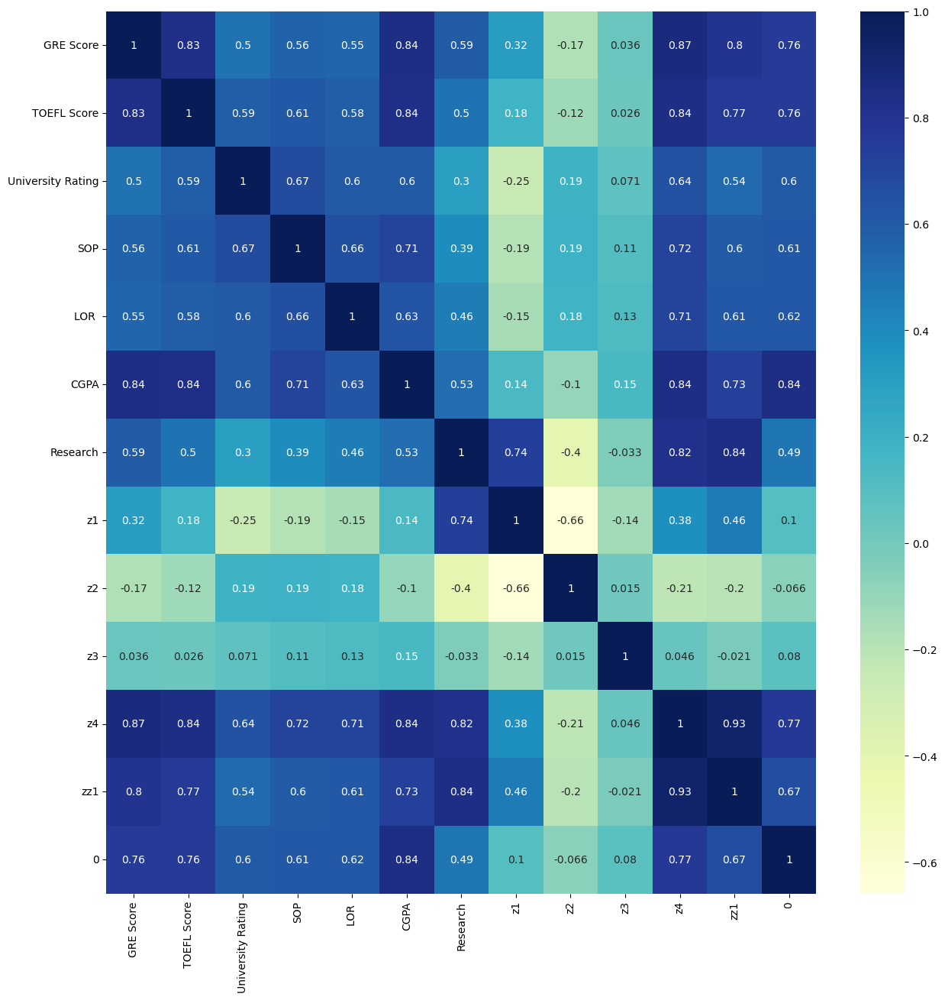

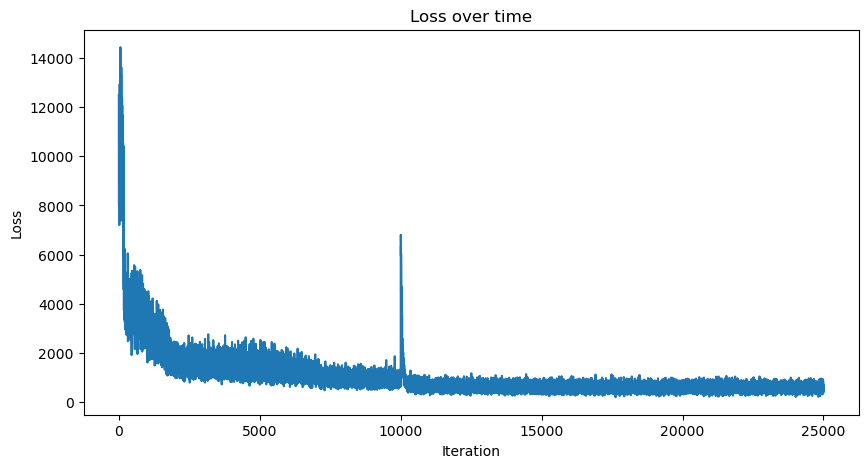

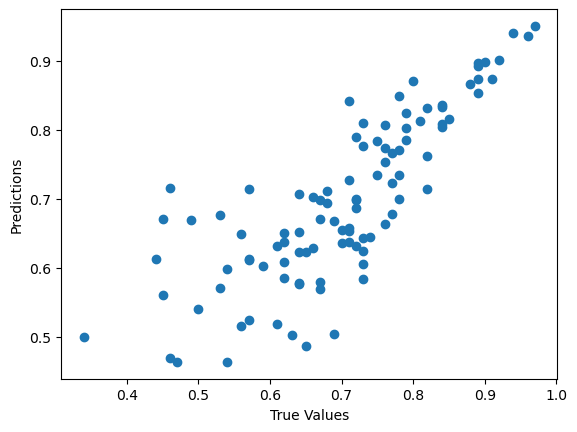

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3        z4       zz1     0  
0 -1.995731  0.711966  0.665545  0.772024 -0.560002  0.69  
1 -2.206650  0.903826  0.949553 -0.011786 -0.666857  0.61  
2 -1.306673  1.042752  0.842859 -0.263784 -0.367506  0.66  
3 -1.221523  1.151165  0.772413  1.059739 -0.138823  0.67  
4 -0.608539 -1.689301 -1.344539  0.796325 -0.313010  0.46  
heatmap_VAE_xdim6_zdim4_zzdim1_lr0001_bs16_epochs1000_b11

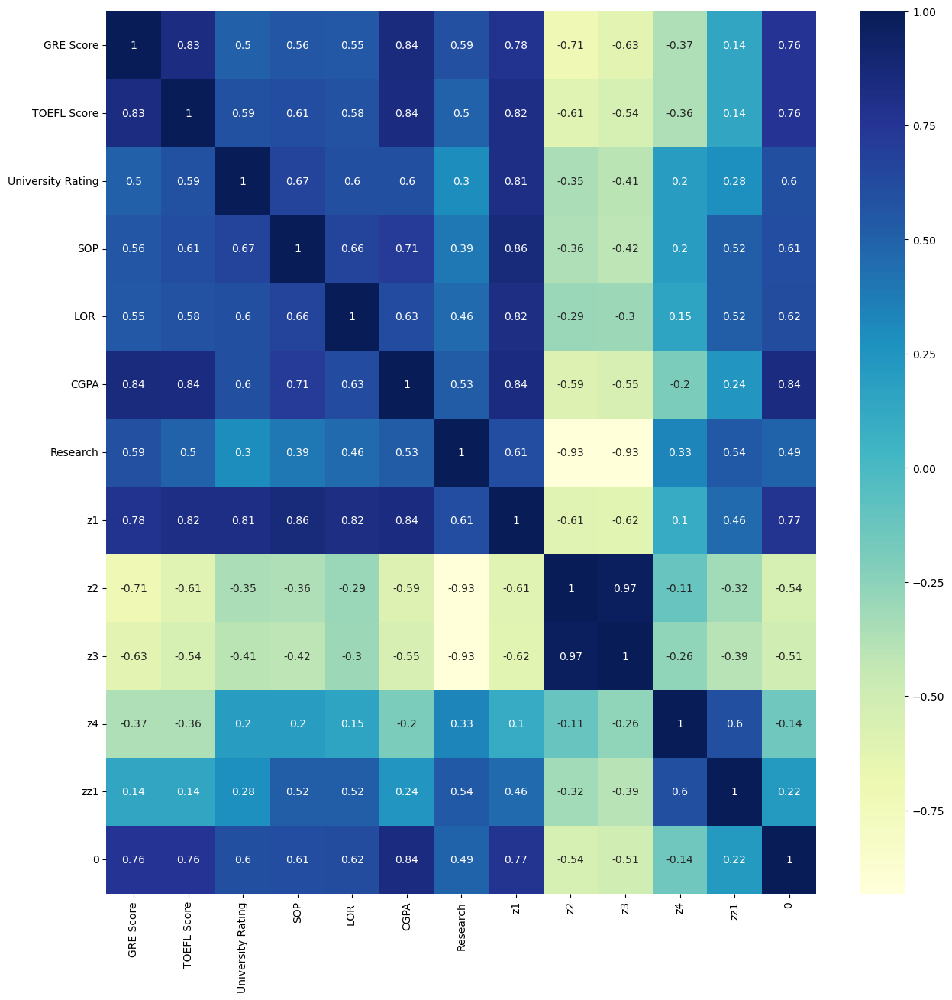

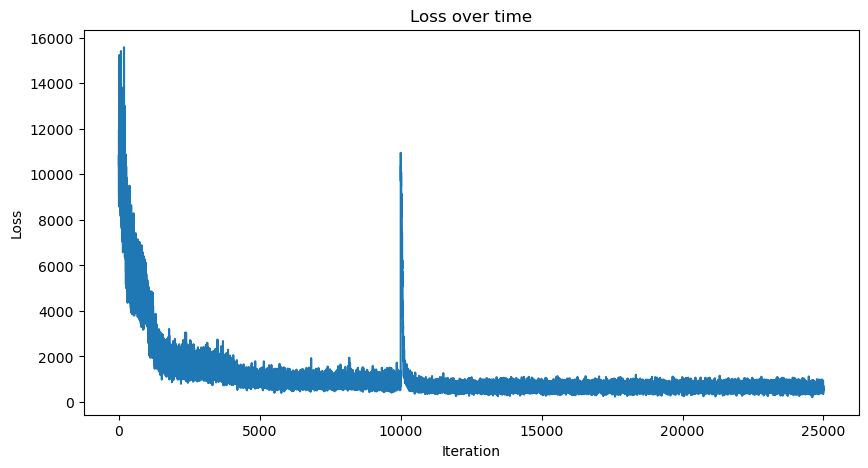

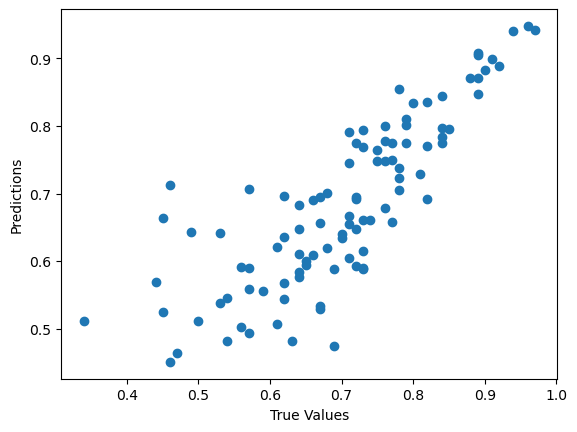

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3        z4       zz1     0  
0  2.332470  1.161282  0.530208  0.270885 -2.409510  0.69  
1  1.890211  1.752356 -0.227138  0.005515 -2.428651  0.61  
2  1.446737  0.806293 -0.204098  0.520978 -2.771451  0.66  
3  2.336410  0.443999  0.121039  0.858062 -3.126791  0.67  
4  0.513152 -0.143673 -2.317409 -1.647854 -2.902746  0.46  
heatmap_VAE_xdim6_zdim4_zzdim1_lr0001_bs16_epochs1000_b11

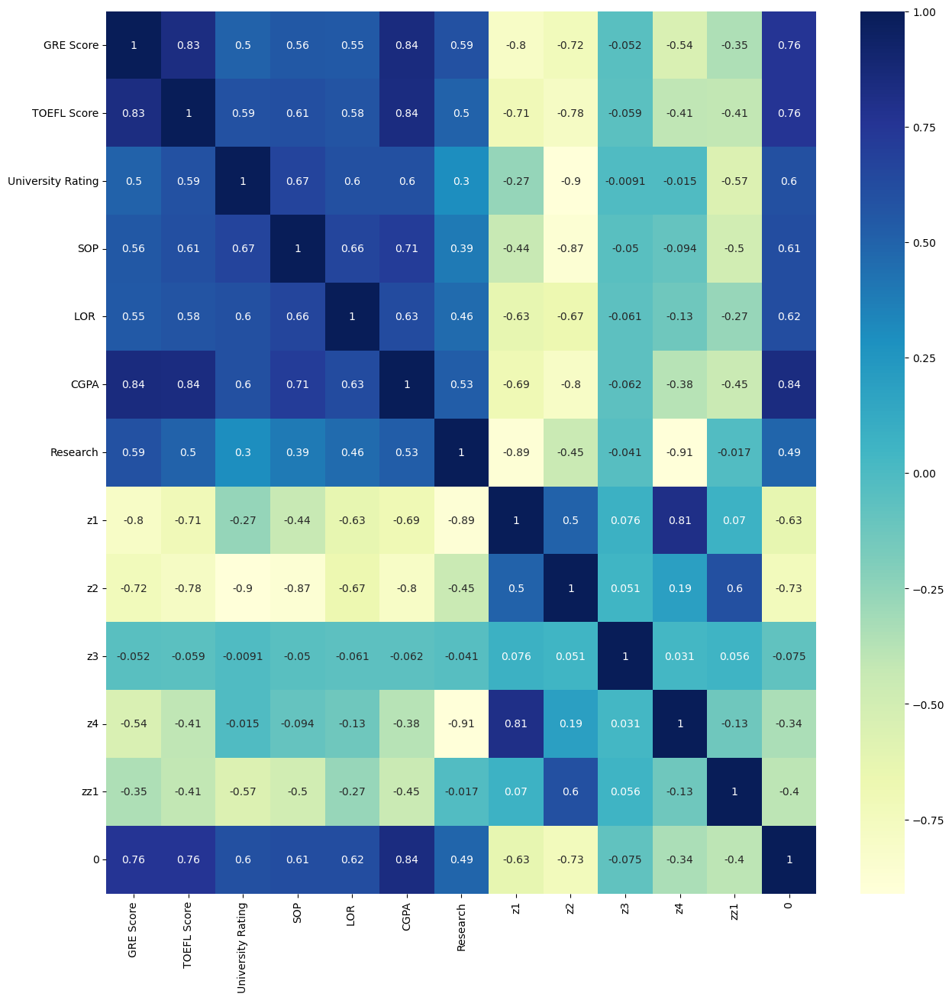

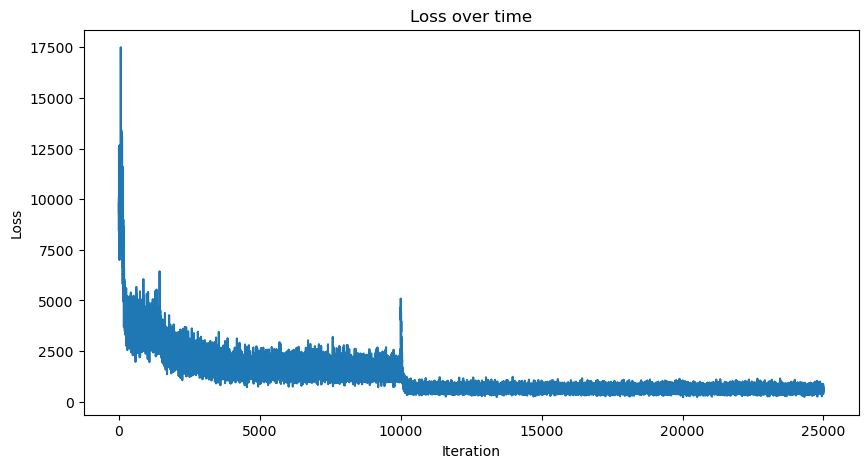

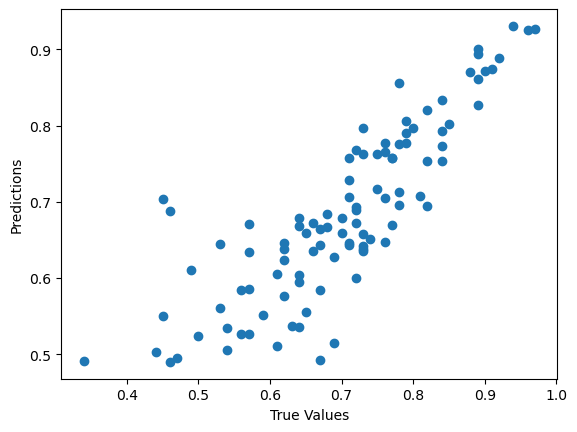

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3        z4       zz1     0  
0 -0.154185  1.854010 -0.511358  1.667600 -0.790667  0.69  
1  0.078869  1.927921 -0.487382  1.917169 -0.804910  0.61  
2 -0.329659  1.373573 -0.535861  1.048269 -1.628741  0.66  
3 -0.638146  1.632784 -1.043415  1.148807 -0.800083  0.67  
4  1.511914 -0.590783  1.141030  0.530409 -0.711157  0.46  
heatmap_VAE_xdim6_zdim4_zzdim1_lr0001_bs16_epochs1000_b11

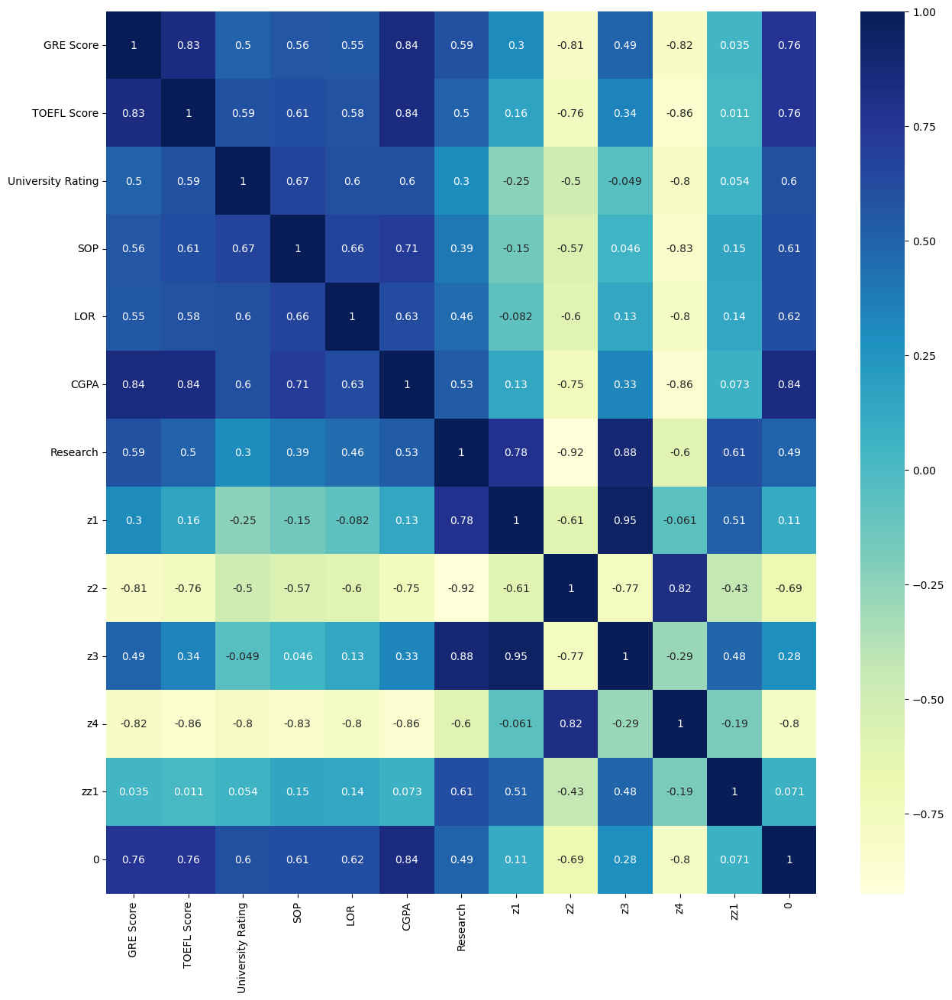

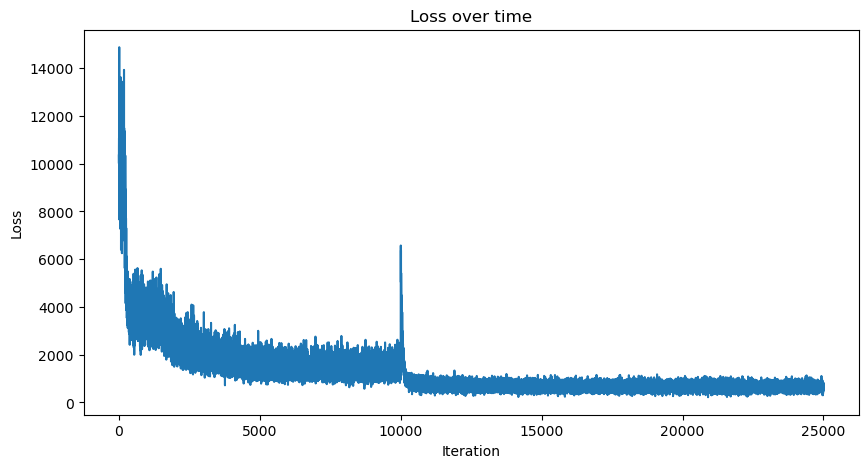

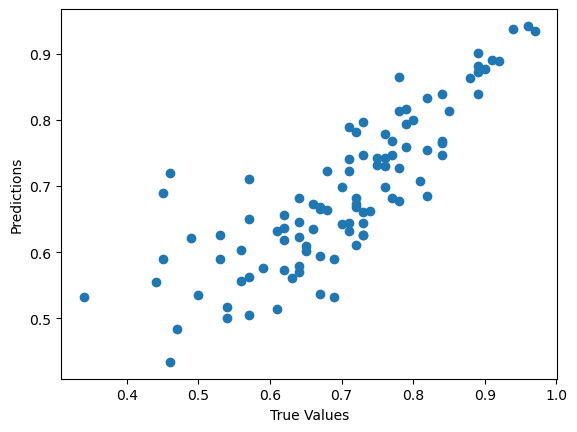

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3        z4       zz1     0  
0 -2.120610  0.961952  0.858834  0.402140  0.047257  0.69  
1 -2.172561 -0.789200  0.972945  2.001431  0.171023  0.61  
2 -1.864552  1.768786  0.092990 -0.006956  0.287921  0.66  
3 -2.101266 -1.400525  0.009970 -0.129890 -0.047641  0.67  
4  0.841897  2.402945  0.515429 -0.230966 -2.272281  0.46  
heatmap_VAE_xdim6_zdim4_zzdim1_lr0001_bs16_epochs1000_b11

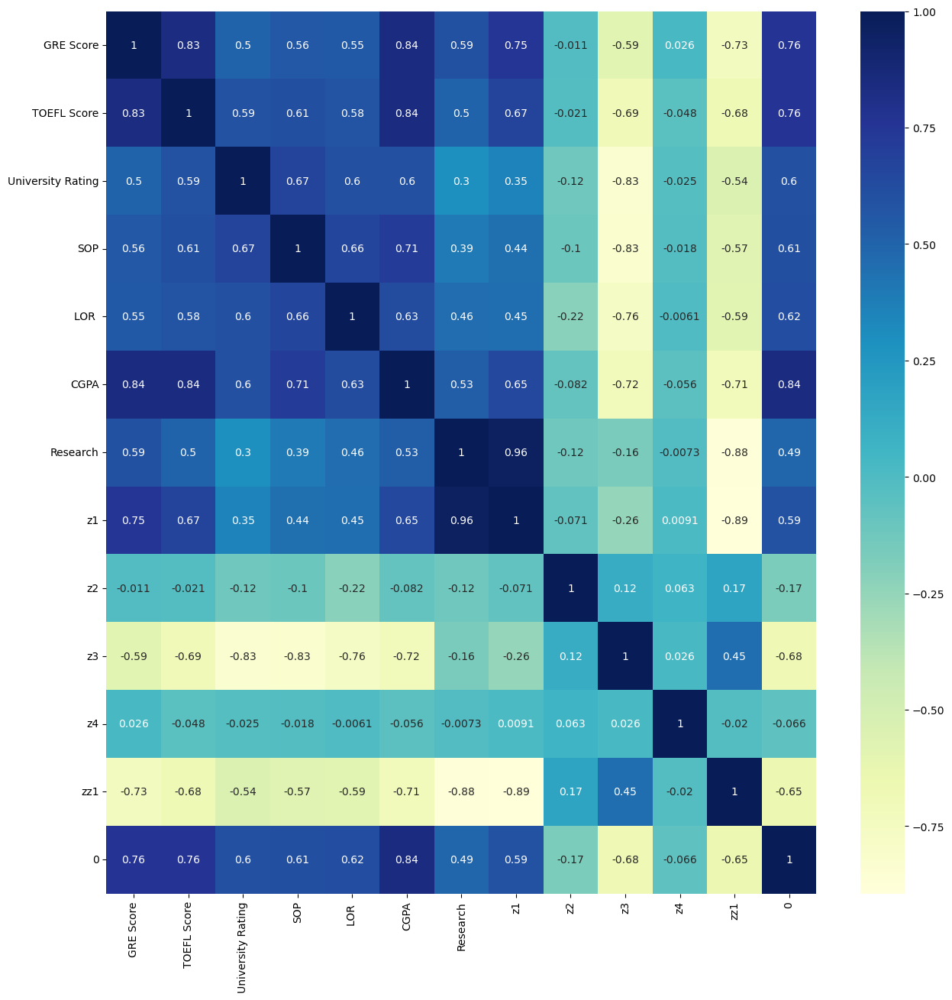

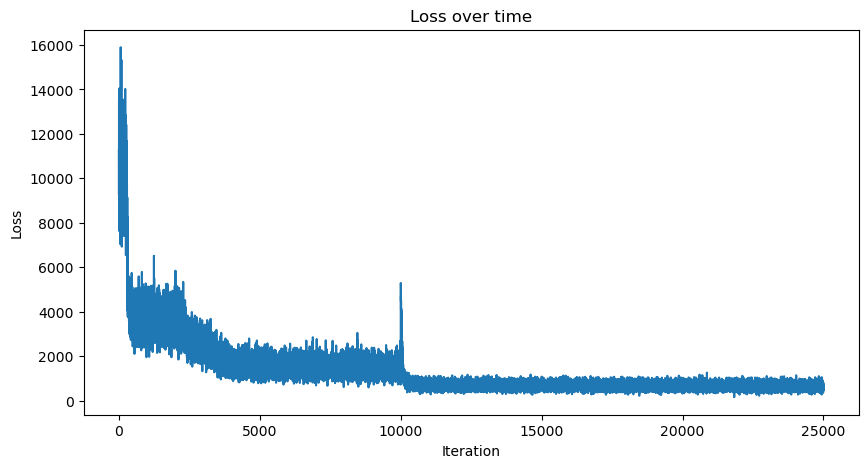

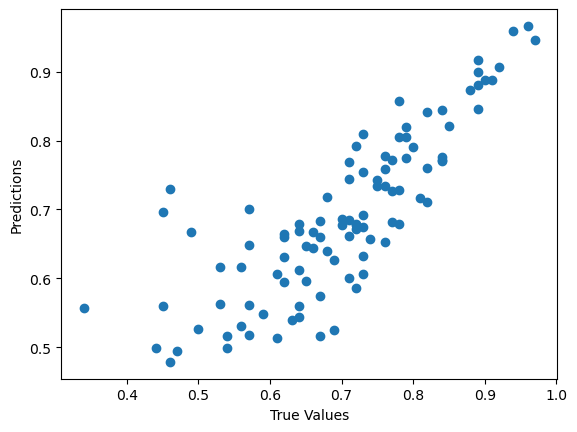

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3        z4       zz1     0  
0  0.359392 -0.036061 -1.058779 -1.734597  0.238788  0.69  
1  0.763959  0.192906  1.030856 -1.842384  0.593420  0.61  
2  1.111108 -0.700775  0.254522 -1.462949  0.213731  0.66  
3  0.740861 -0.830692 -2.137022 -1.664384  0.664155  0.67  
4  0.817183 -0.138422  0.958666  0.490799  0.229846  0.46  
heatmap_VAE_xdim6_zdim4_zzdim1_lr0001_bs16_epochs1000_b11

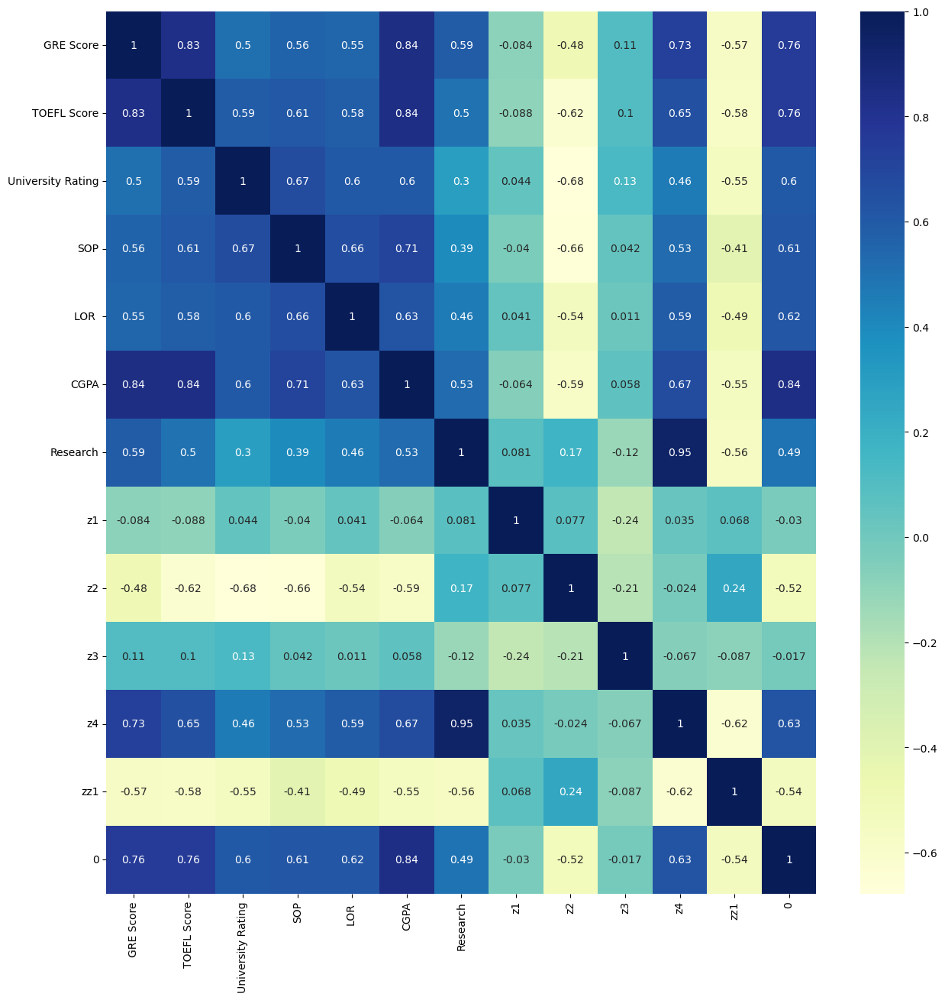

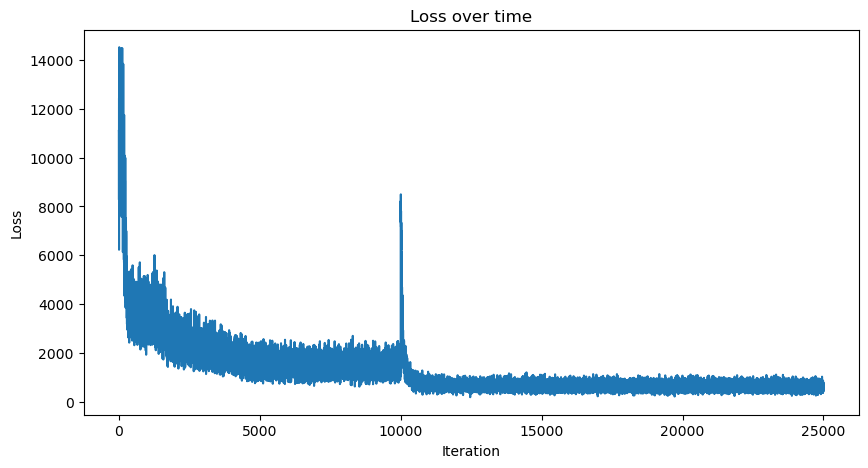

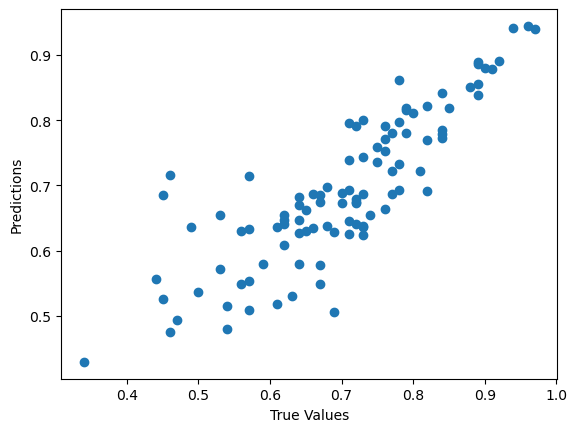

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3        z4       zz1     0  
0 -0.282075  0.670166  0.786889  2.123513 -0.179802  0.69  
1  0.821800  0.991316  0.317040  2.091430 -0.102023  0.61  
2 -0.371619 -0.752160  0.446812  1.414281  0.050663  0.66  
3 -1.275706 -1.160521  2.002125  1.867813  0.574721  0.67  
4  0.221467  1.432412  0.359841 -0.603618  0.136695  0.46  
heatmap_VAE_xdim6_zdim4_zzdim1_lr0001_bs16_epochs1000_b11

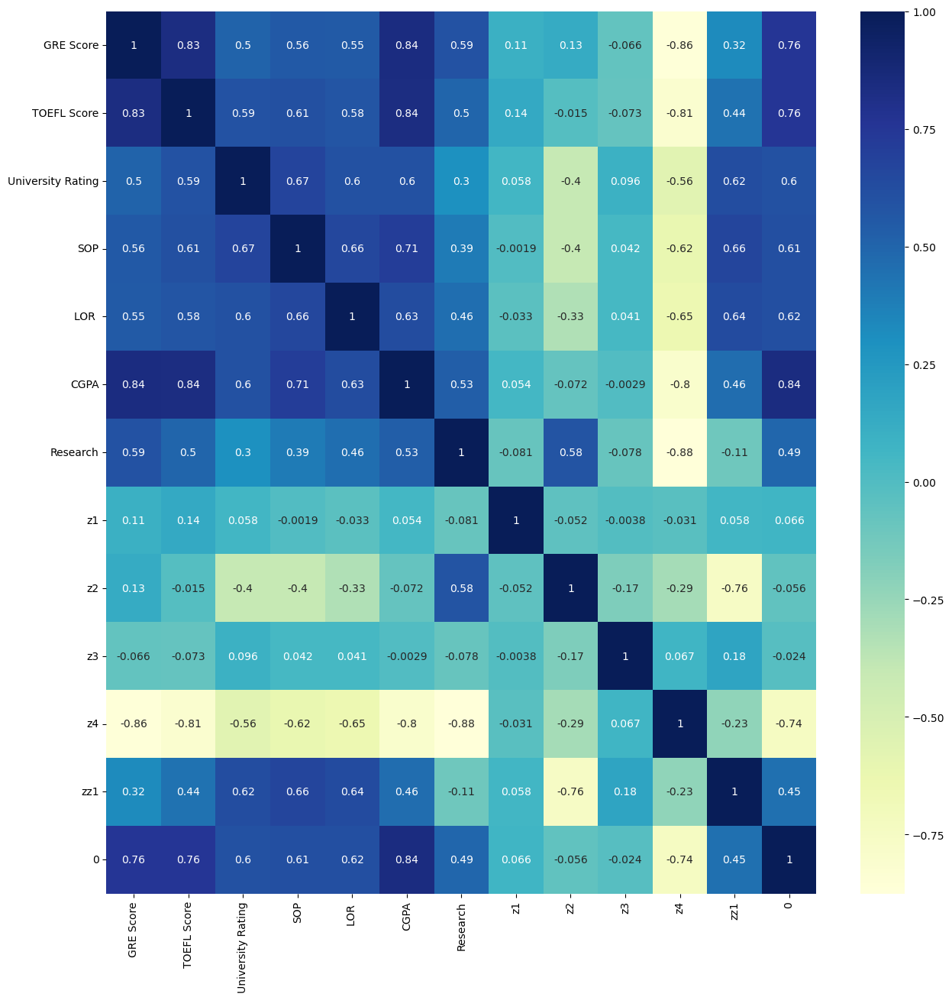

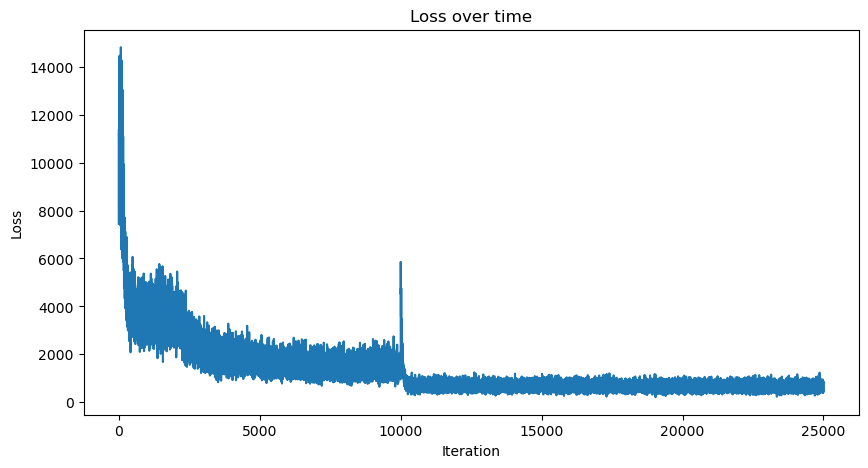

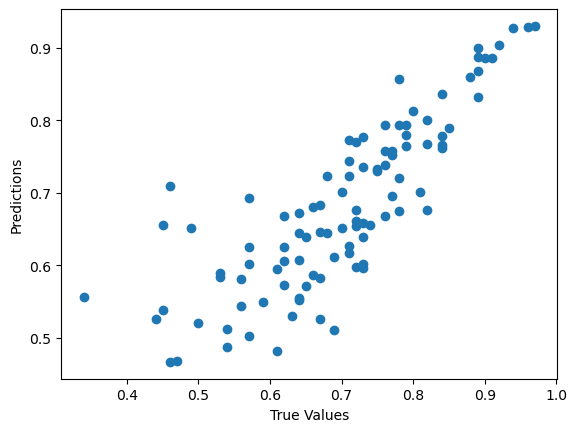

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3        z4       zz1     0  
0  0.046454  2.042054  0.401135  2.332831  0.630565  0.69  
1 -1.595987  2.290962  0.315725 -0.555253  0.411197  0.61  
2  0.580992  1.149686  0.513118  0.310570  0.692805  0.66  
3 -0.680448  1.181242  0.145068  0.028643  0.143440  0.67  
4 -1.803138  0.829160 -1.313067 -0.407381  1.014917  0.46  
heatmap_VAE_xdim6_zdim4_zzdim1_lr0001_bs16_epochs1000_b11

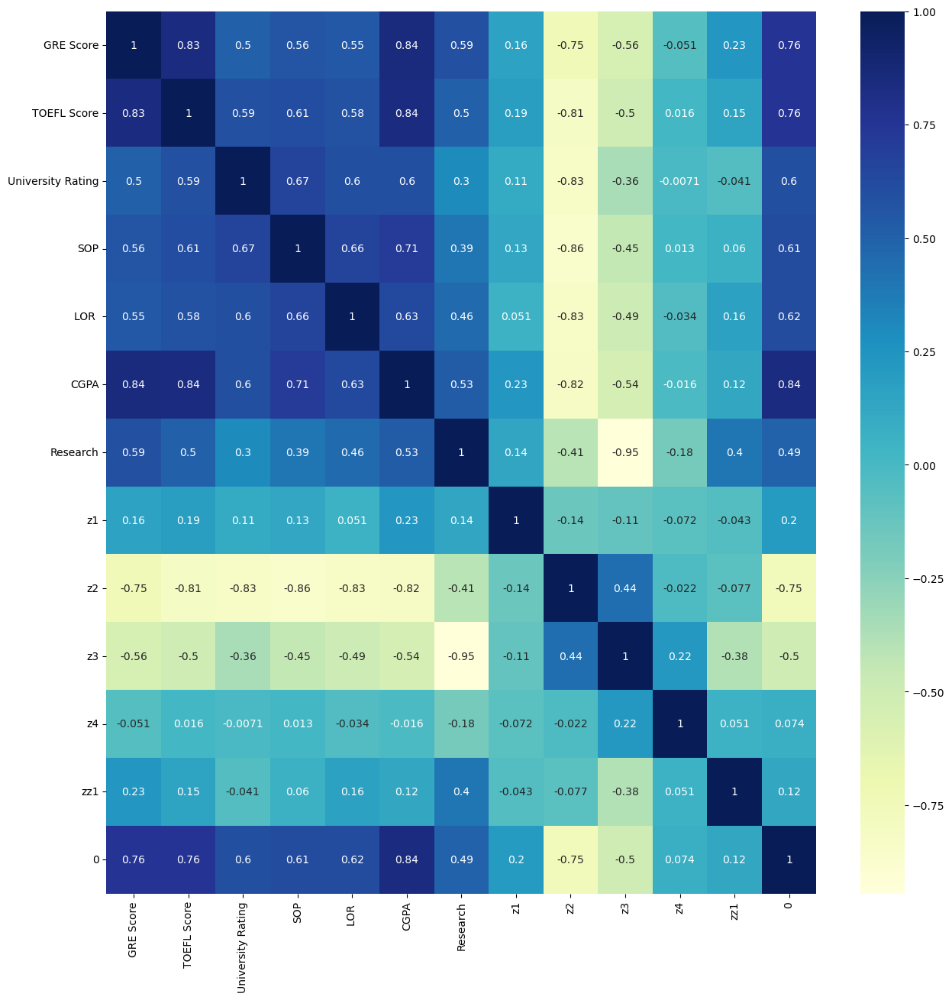

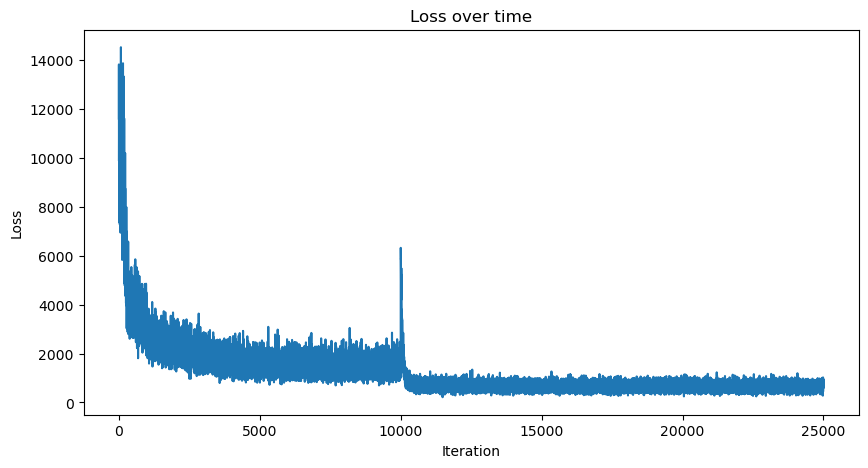

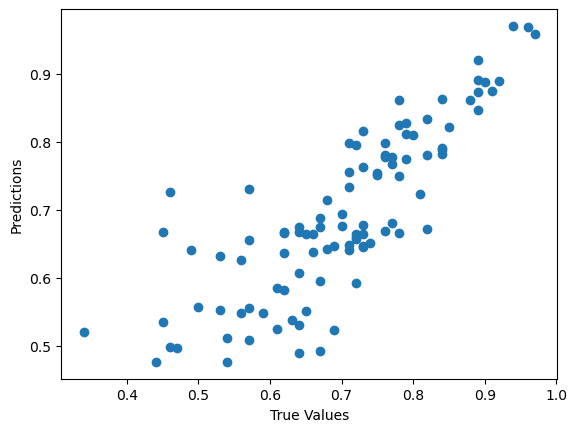

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3        z4       zz1     0  
0  0.158039  0.065868 -0.746652 -1.632763 -0.302617  0.69  
1 -0.591743  1.772378 -1.014264 -1.643030 -0.249136  0.61  
2  0.618281 -1.566180  0.304940 -0.946194 -0.497181  0.66  
3 -0.009446  0.564771  0.132002 -0.731584 -0.372714  0.67  
4 -0.090590  2.649025 -1.114808  1.030394 -0.570622  0.46  
heatmap_VAE_xdim6_zdim4_zzdim1_lr0001_bs16_epochs1000_b11

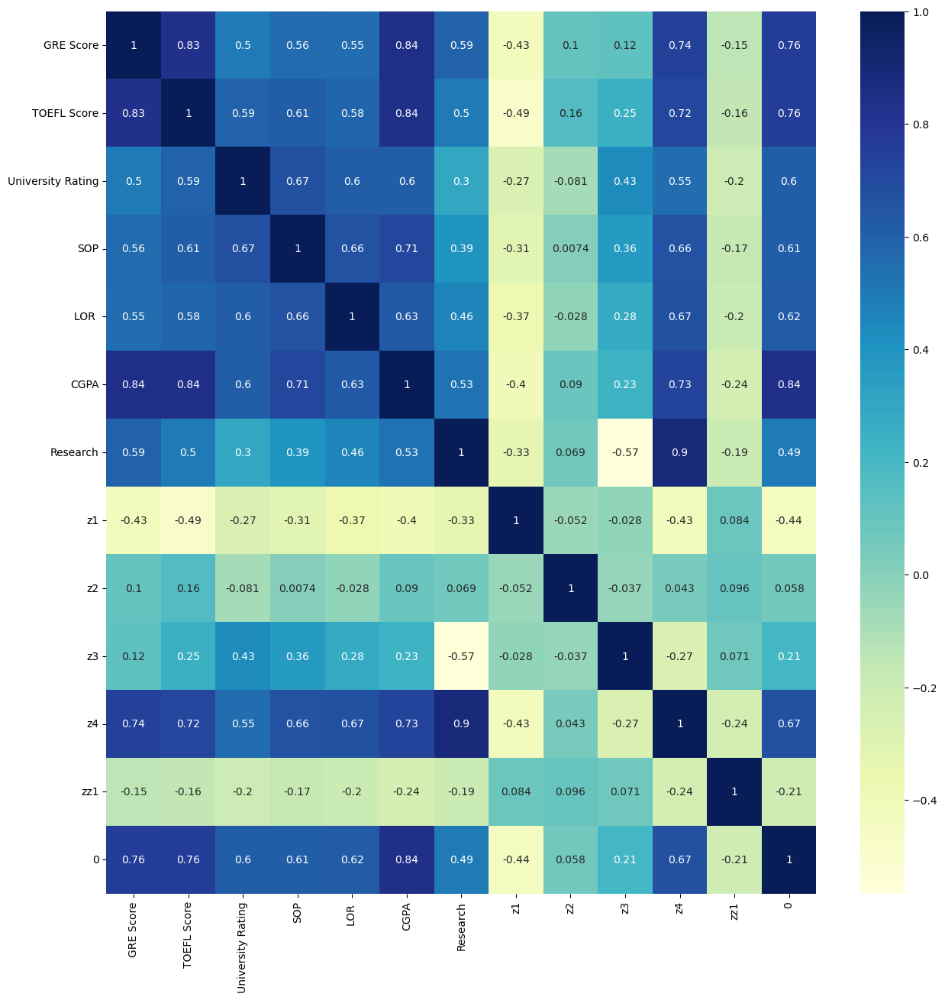

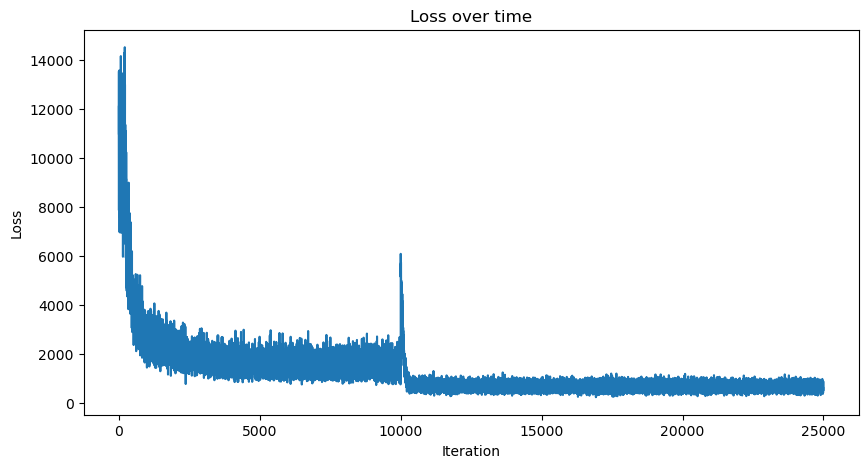

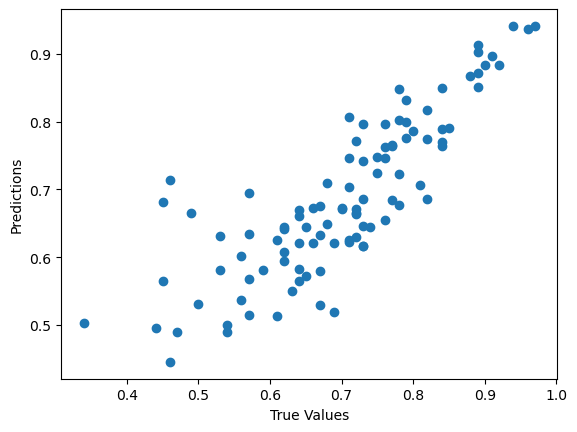

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3        z4       zz1     0  
0  1.009472 -0.305108  1.569462  1.905751 -0.256106  0.69  
1  0.030462 -0.476110  1.801769  1.806254  0.960712  0.61  
2  0.830260 -0.387959  0.884715  1.771844  0.261817  0.66  
3  1.713005 -0.930313  0.799688  2.290031  0.764681  0.67  
4 -0.324258  1.012470  0.958017 -1.270470 -0.714836  0.46  
heatmap_VAE_xdim6_zdim4_zzdim1_lr0001_bs16_epochs1000_b11

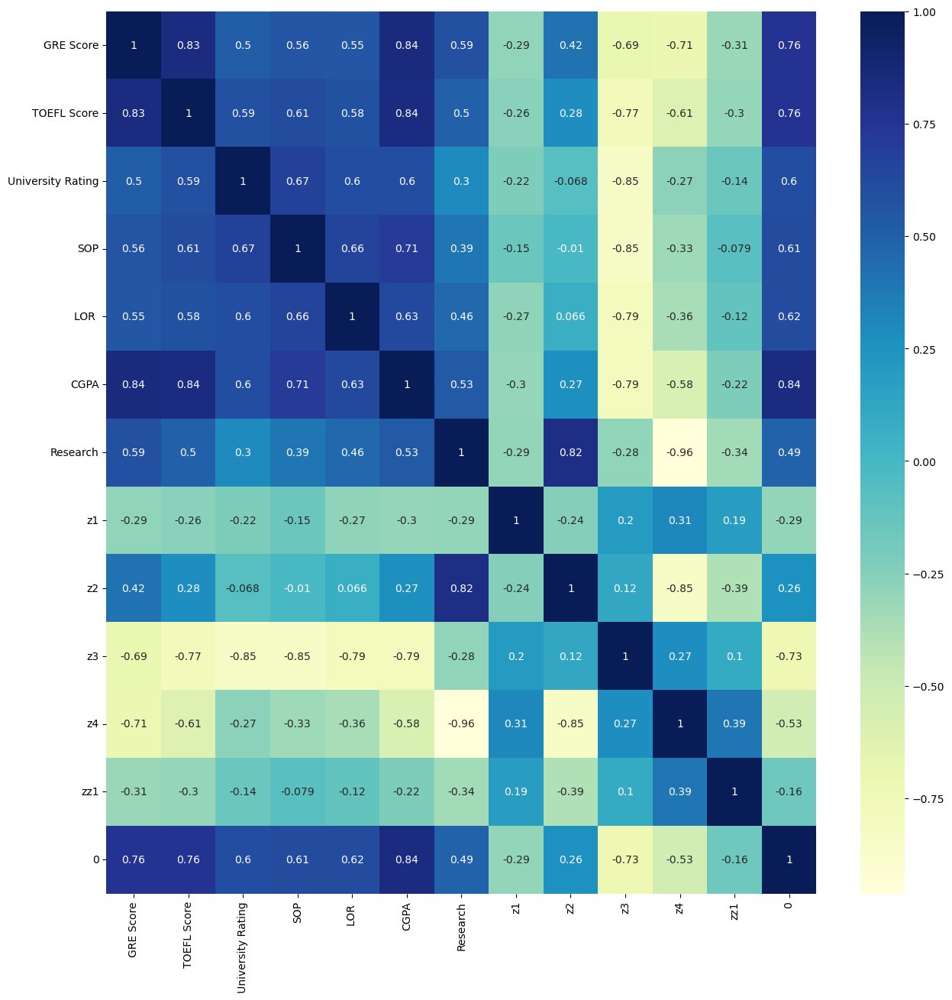

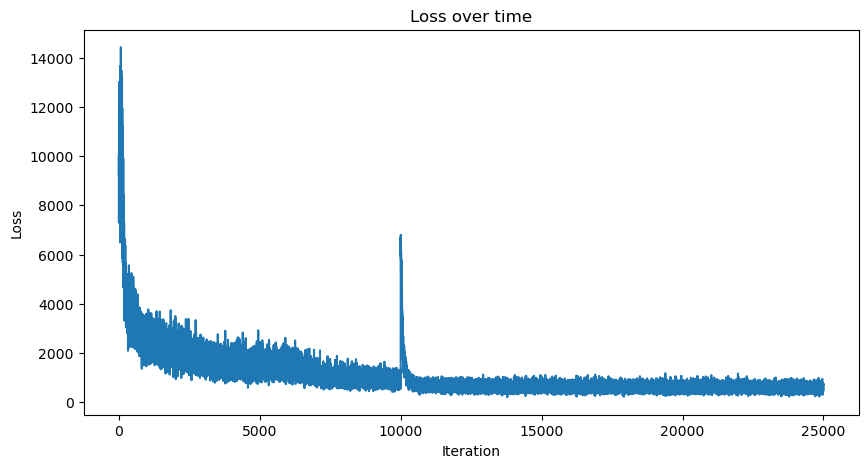

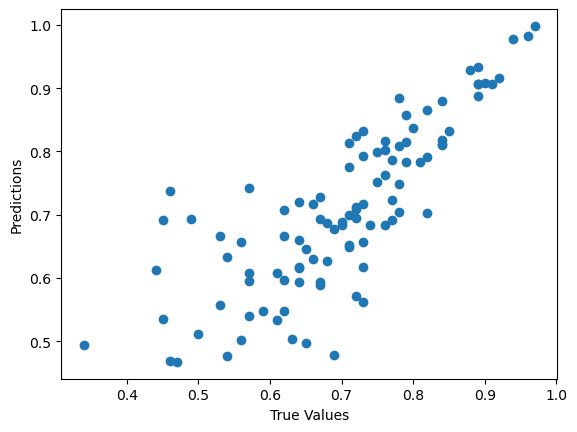

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3        z4       zz1     0  
0 -1.321497 -0.965175 -0.676227  2.081070 -0.272374  0.69  
1 -1.181541 -0.358521 -1.323560  2.238365  0.384915  0.61  
2 -0.398104  1.451573 -0.459850  1.773689 -0.901878  0.66  
3 -0.578217  0.672159  0.204480  1.983900  0.519071  0.67  
4 -1.821804  0.017279  0.238389 -0.968789 -0.515449  0.46  
heatmap_VAE_xdim6_zdim4_zzdim1_lr0001_bs16_epochs1000_b11

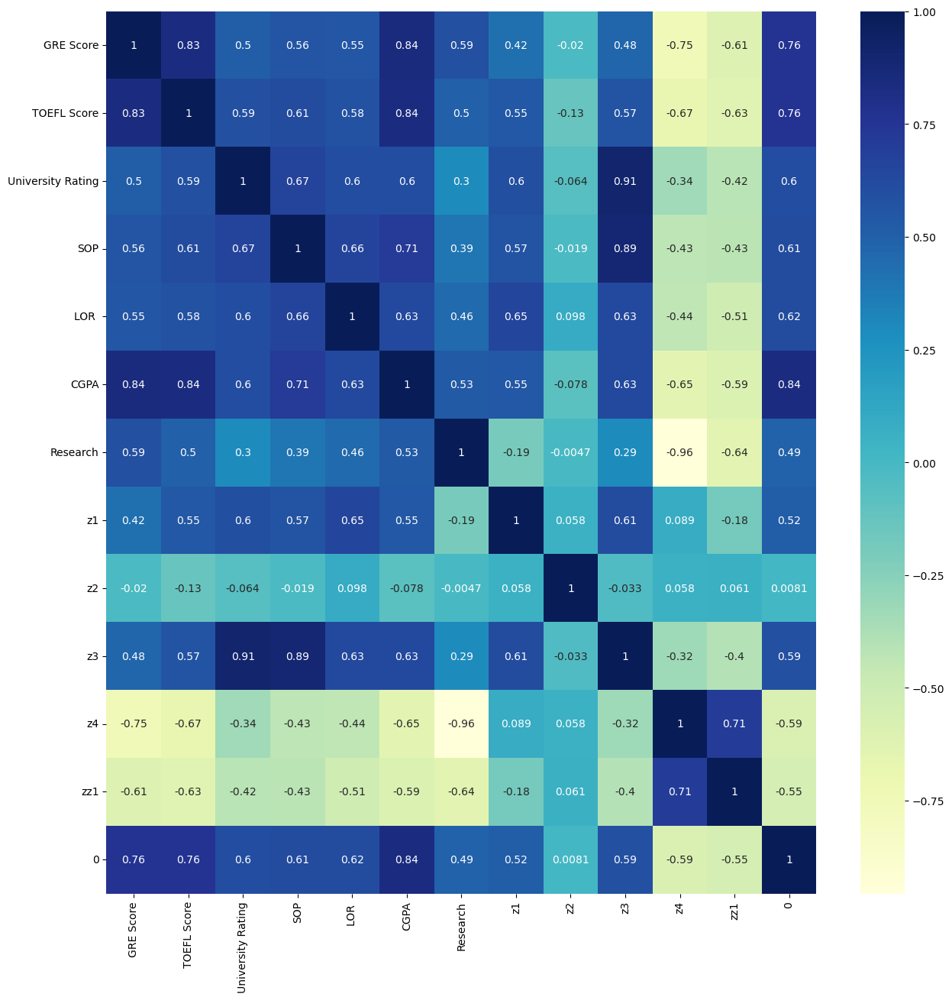

In [11]:
for i in range(20):
    mod,r,lt,ltt=train_VAE(X_train_scaled,X_test_scaled,X_test,y_train.values,y_test.values,configs[0],'./Test',save_pictures=True,freeze_weights=True,partial=400,offset=200)
    if r>0.678:
        dict_d=dict(configs[0])
        r2_text = str(r).replace(".", "_")
        torch.save(mod,f"./Admission/Models/Admission_Freeze_zz_and_z_to_y_R2_{r2_text}_model.zip")
        with open(f"./Admission/Models/Config_Admission_Freeze_zz_and_z_to_y_R2_{r2_text}.json", 'w') as outfile:
            json.dump(dict_d, outfile)

# Freeze zz to y

{'config': {'x_dim': 6,
  'z_dim': 3,
  'zz_dim': 1,
  'encoder_z_layers': [64, 64, 64],
  'encoder_zz_layers': [10, 10],
  'decoder_layers': [64, 64, 64, 6],
  'fc_z_to_y_layers': [32, 32, 32, 1]},
 'beta': {'b1': 10000, 'b2': 1, 'b3': 1, 'b4': 10000, 'b5': 1},
 'lr': 0.001,
 'batch_size': 32,
 'num_epochs': 1000}

In [9]:
import itertools

# Define the ranges for your parameters
x_dim_values = [X_train_with_confounder.shape[1]]
z_dim_values = [4]
zz_dim_values = [1]
encoder_z_layers_values = [[10,10,10]]
encoder_zz_layers_values = [[10,10]]
#decoder_layers_values = [[14,X_train_with_confounder.shape[1]],[32, 32,X_train_with_confounder.shape[1]],[128,128,128,X_train_with_confounder.shape[1]]]
fc_z_to_y_layers_values = [[12,12,1],]

# Get all combinations
configurations = list(itertools.product(x_dim_values, z_dim_values, zz_dim_values, encoder_z_layers_values, encoder_zz_layers_values, fc_z_to_y_layers_values))

# Convert to a list of dictionaries
config_dicts = [{'x_dim': x_dim, 'z_dim': z_dim, 'zz_dim': zz_dim, 'encoder_z_layers': encoder_z_layers, 'encoder_zz_layers': encoder_zz_layers, 'decoder_layers': encoder_z_layers+ [x_dim], 'fc_z_to_y_layers': fc_z_to_y_layers} for x_dim, z_dim, zz_dim, encoder_z_layers, encoder_zz_layers, fc_z_to_y_layers in configurations]
print(config_dicts)
# Define betas
BETAS=[
    #{'b1': 6, 'b2': 1, 'b3': 1, 'b4': 6,'b5':1},
    #{'b1': 1, 'b2': 1, 'b3': 1, 'b4': 1000,'b5':1},
    #{'b1': 100, 'b2': 1, 'b3': 100, 'b4': 100,'b5':1},
    #{'b1': 100,'b2': 1, 'b3': 1, 'b4': 10,'b5':1},  
    #{'b1': 10000, 'b2': 1, 'b3': 1, 'b4': 10000,'b5':1},
    {'b1': 10000, 'b2': 1, 'b3': 1, 'b4': 10000,'b5':1}
]
import itertools

# Define the ranges for your parameters
lr_values = [1e-3]
batch_size_values = [16]
num_epochs_values = [1000]

# Get all combinations
configs = list(itertools.product(config_dicts, BETAS, lr_values, batch_size_values, num_epochs_values))

# Convert to a list of dictionaries
configs = [{'config': config, 'beta': beta, 'lr': lr, 'batch_size': bs, 'num_epochs': epochs} for config, beta, lr, bs, epochs in configs]
print(len(configs))

[{'x_dim': 6, 'z_dim': 4, 'zz_dim': 1, 'encoder_z_layers': [10, 10, 10], 'encoder_zz_layers': [10, 10], 'decoder_layers': [10, 10, 10, 6], 'fc_z_to_y_layers': [12, 12, 1]}]
1


{'config': {'x_dim': 6, 'z_dim': 4, 'zz_dim': 1, 'encoder_z_layers': [10, 10, 10], 'encoder_zz_layers': [10, 10], 'decoder_layers': [10, 10, 10, 6], 'fc_z_to_y_layers': [12, 12, 1]}, 'beta': {'b1': 10000, 'b2': 1, 'b3': 1, 'b4': 10000, 'b5': 1}, 'lr': 0.001, 'batch_size': 16, 'num_epochs': 1000}
False
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1                   [-1, 10]              70
              ReLU-2                   [-1, 10]               0
            Linear-3                   [-1, 10]             110
              ReLU-4                   [-1, 10]               0
            Linear-5                   [-1, 10]             110
              ReLU-6                   [-1, 10]               0
            Linear-7                    [-1, 4]              44
            Linear-8                    [-1, 4]              44
            Linear-9                   [-1, 10]         

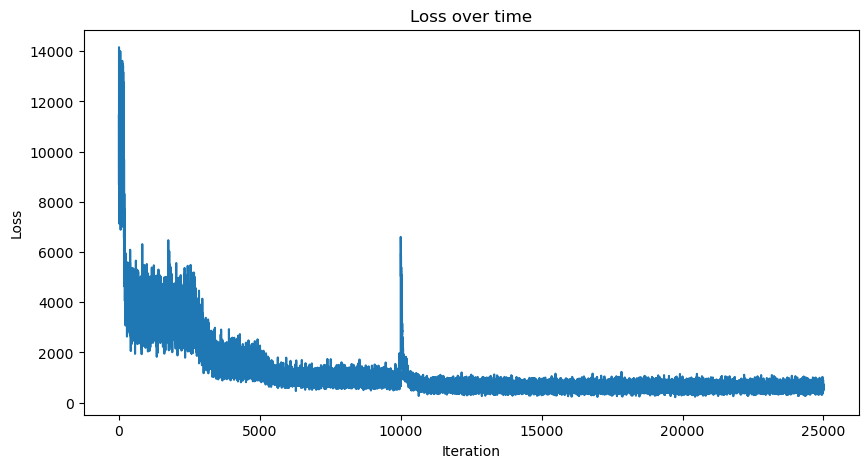

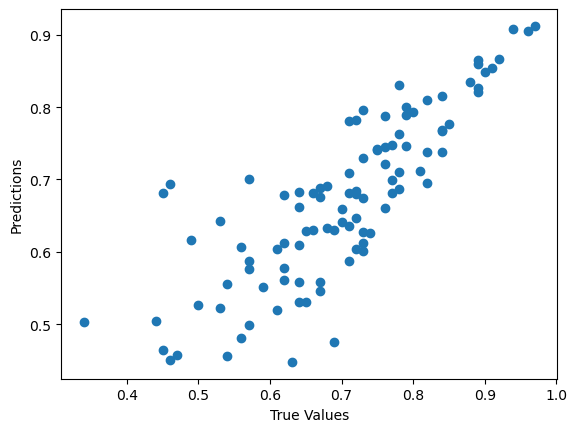

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3        z4       zz1     0  
0  1.398833  0.905760 -1.559101  1.420404  0.949854  0.69  
1  1.886754  0.839975 -1.550990  0.290327  0.652536  0.61  
2  0.752906  0.395771 -0.729351  0.784203  0.055211  0.66  
3  0.583046  0.433570 -0.765027  1.927914  0.569789  0.67  
4  1.147364 -1.287451  0.878544  0.061911 -0.618747  0.46  
heatmap_VAE_xdim6_zdim4_zzdim1_lr0001_bs16_epochs1000_b11

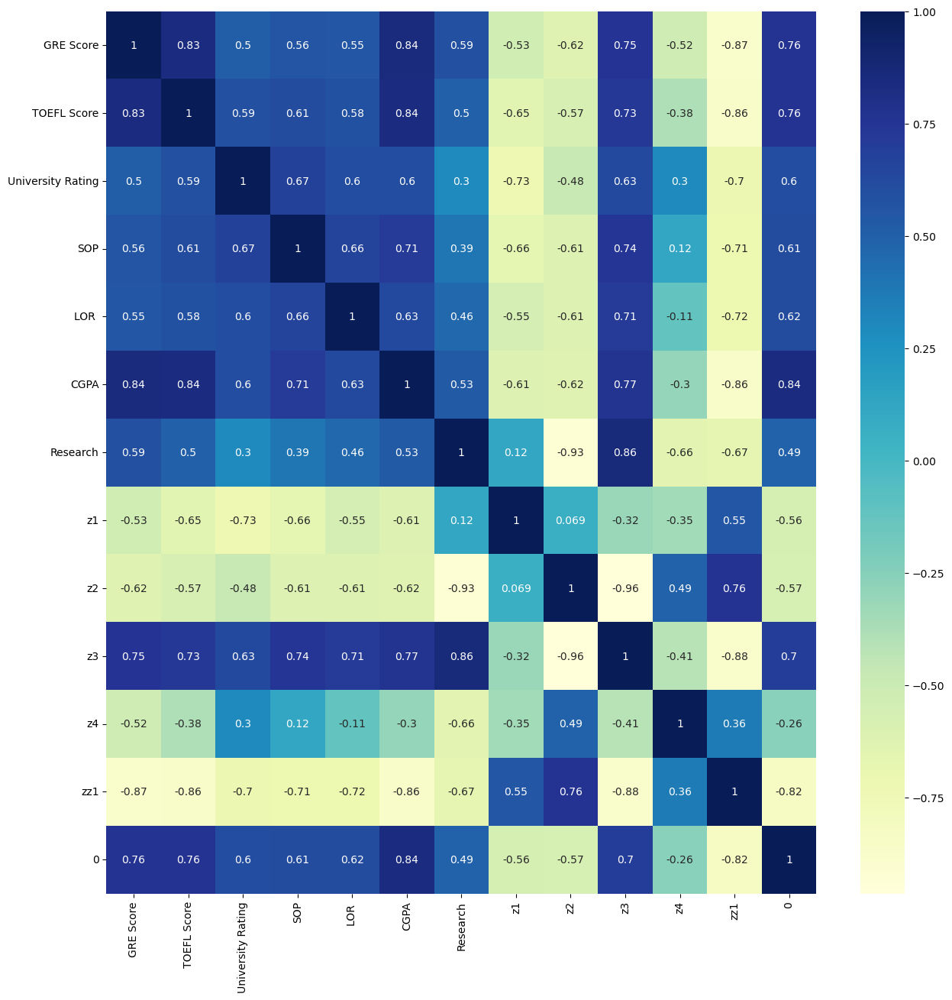

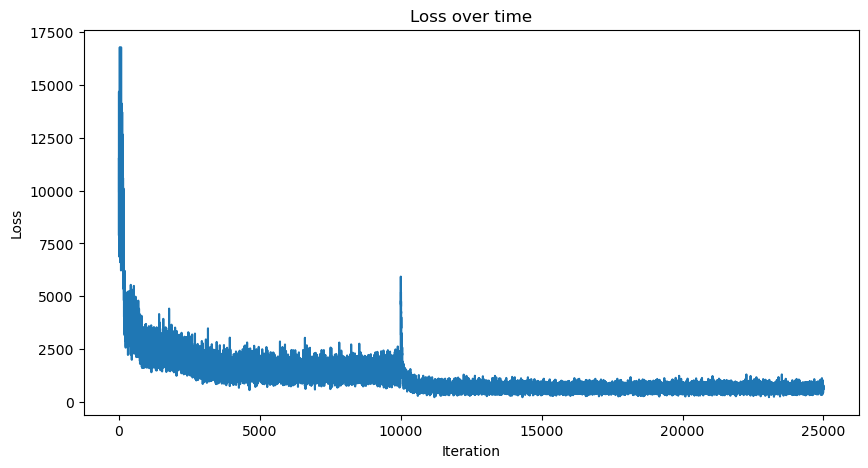

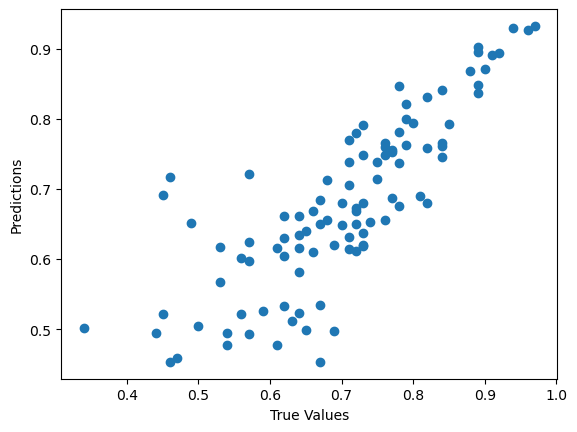

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3        z4       zz1     0  
0  1.197534  0.304443 -1.925091 -0.570165 -1.150448  0.69  
1  1.117807 -1.332521 -2.267306 -2.378226 -1.118193  0.61  
2  1.334867 -0.544700 -1.223122 -0.693315 -0.418184  0.66  
3  1.810016 -1.002443 -1.144848 -0.519737 -0.714640  0.67  
4 -1.464217  1.094151 -0.100303  0.123143  0.834704  0.46  
heatmap_VAE_xdim6_zdim4_zzdim1_lr0001_bs16_epochs1000_b11

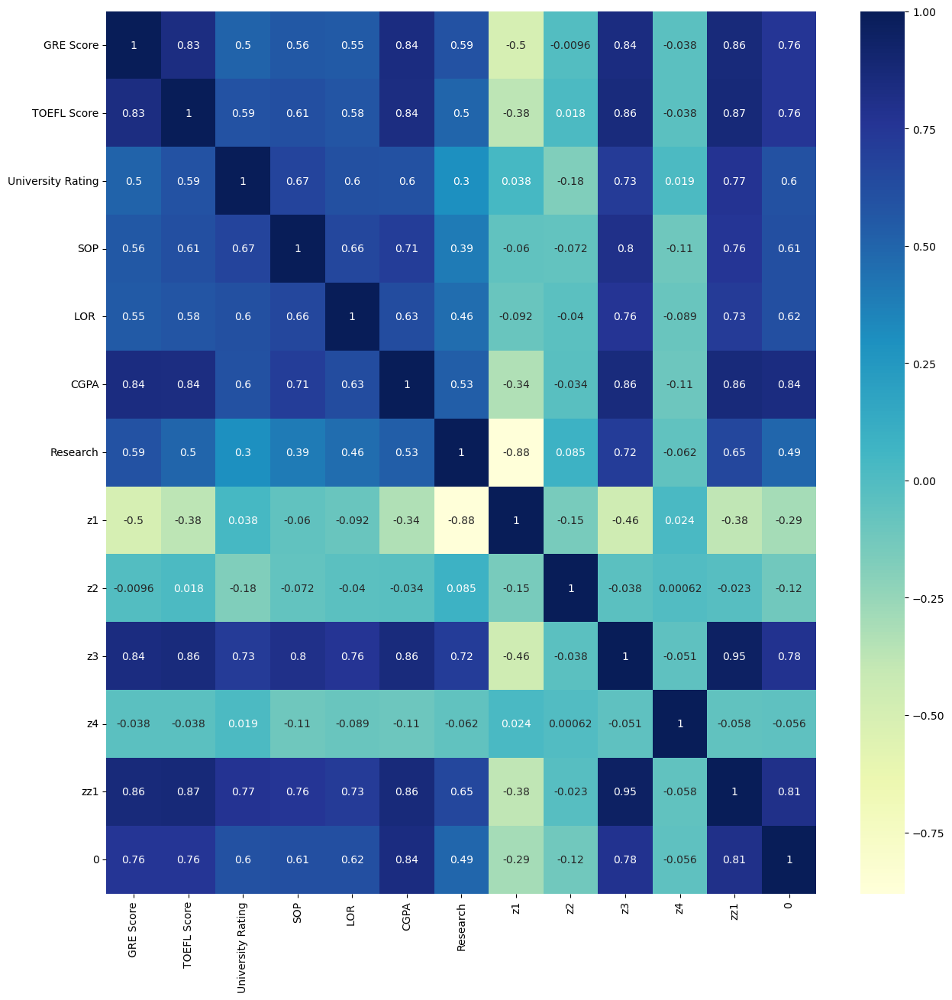

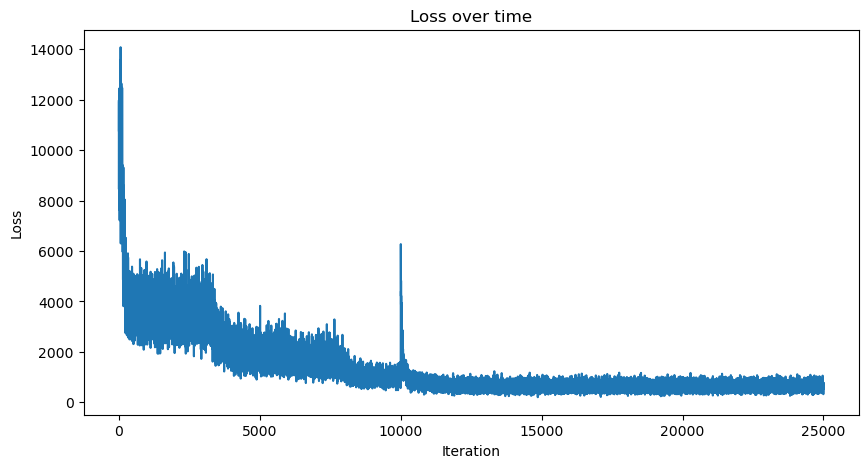

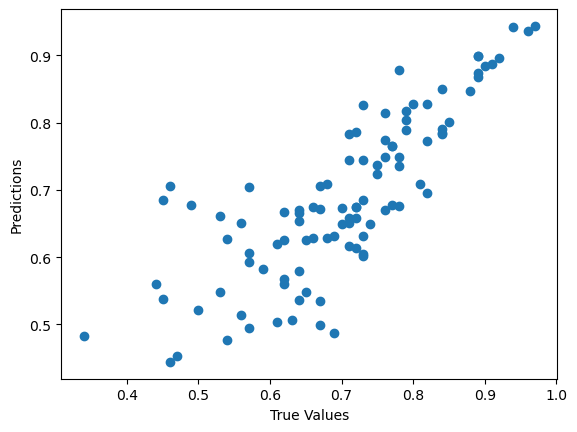

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3        z4       zz1     0  
0 -1.614942  1.970366 -0.186694  0.765364  2.157460  0.69  
1 -0.424450  2.036588 -0.341559 -0.528781  2.045093  0.61  
2 -0.870959  1.213060  0.615780 -0.762241  1.556733  0.66  
3 -1.997887  1.423552  0.780531  0.902466  1.918474  0.67  
4  0.823847 -0.349532 -1.363781  0.856580  0.716041  0.46  
heatmap_VAE_xdim6_zdim4_zzdim1_lr0001_bs16_epochs1000_b11

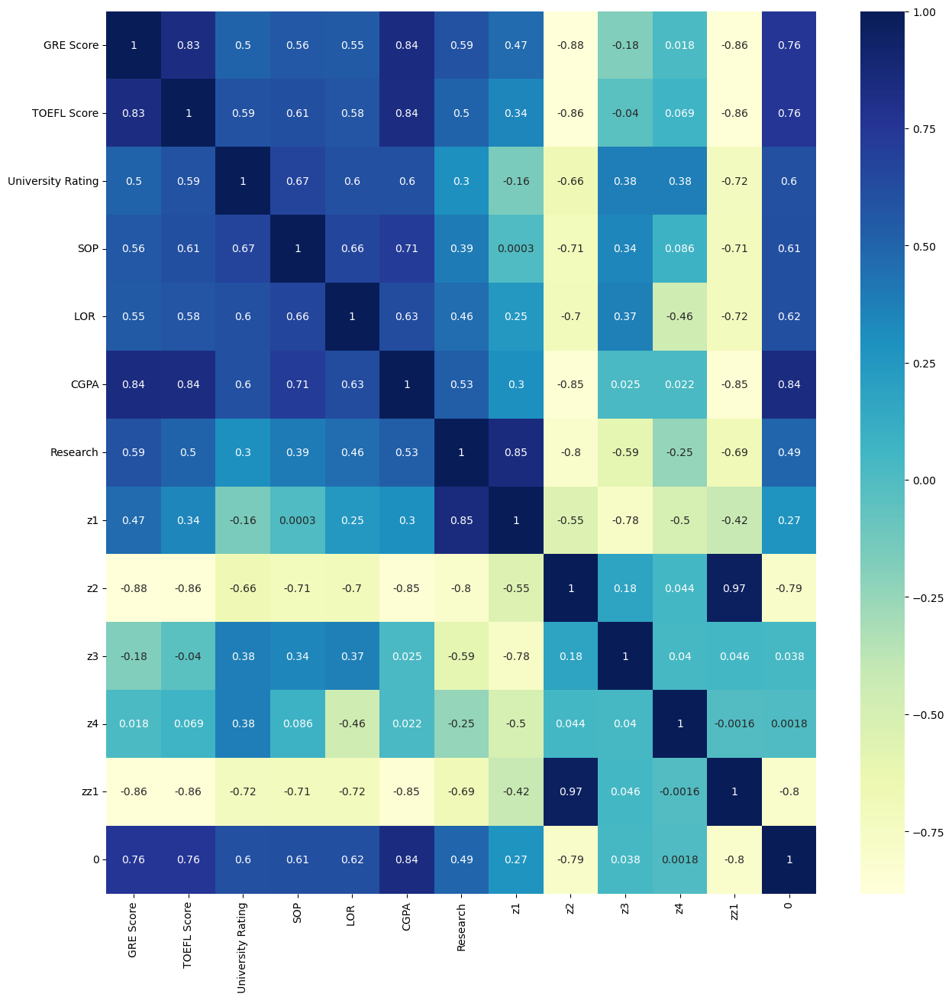

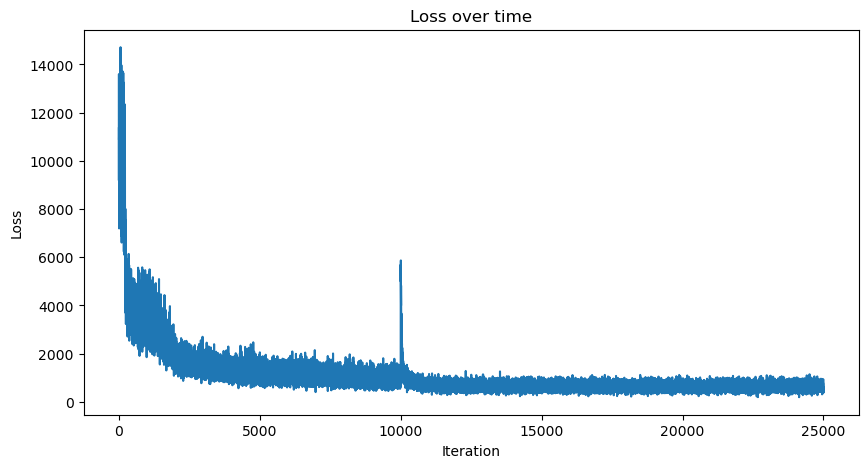

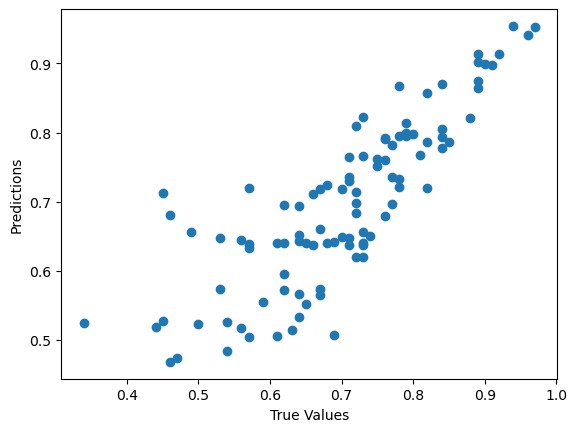

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3        z4       zz1     0  
0 -1.360518 -1.417264  0.580697  1.819946  1.482168  0.69  
1 -1.376879 -1.944306  0.875908  0.199562  1.440109  0.61  
2 -0.324656 -1.055664  1.388216 -1.607314  0.619626  0.66  
3 -1.083306 -0.702754  1.185499 -0.259235  1.054624  0.67  
4 -0.829957  0.328767 -0.429579 -0.504414  0.121202  0.46  
heatmap_VAE_xdim6_zdim4_zzdim1_lr0001_bs16_epochs1000_b11

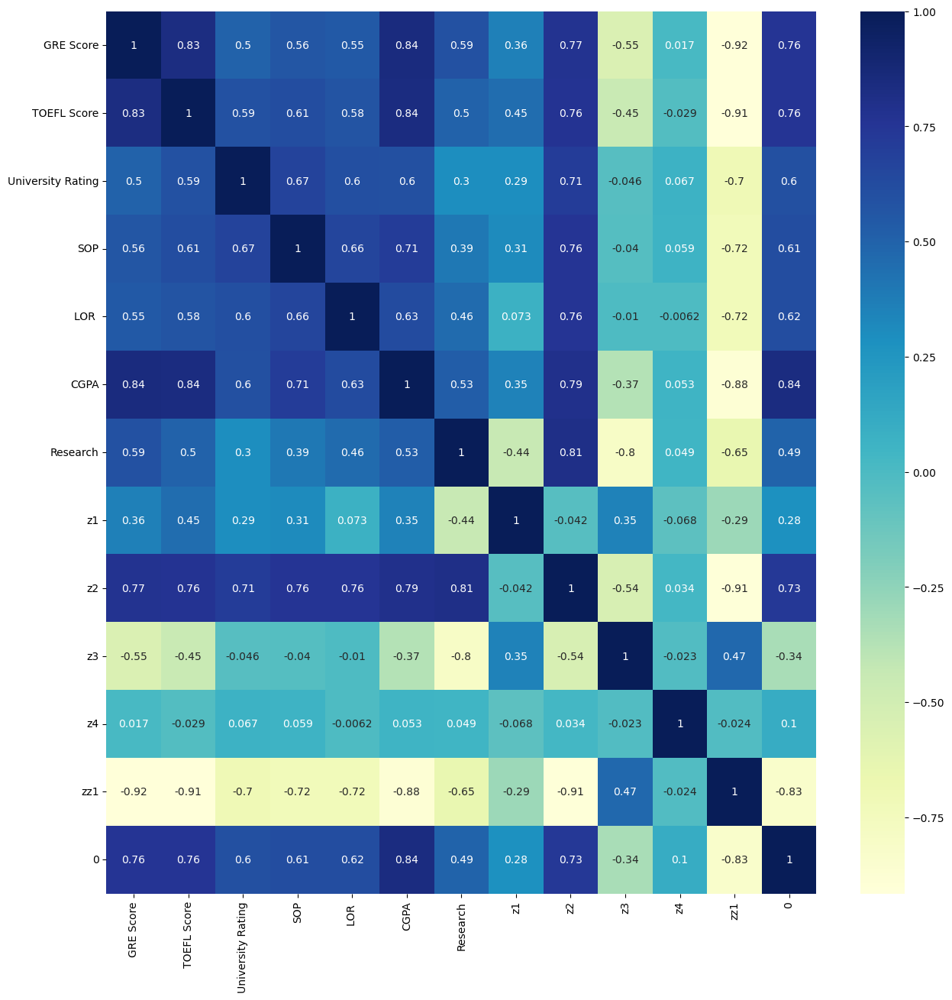

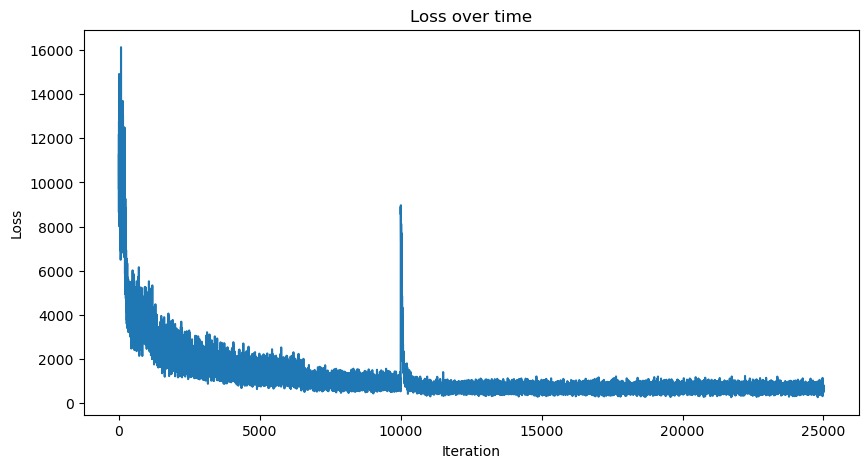

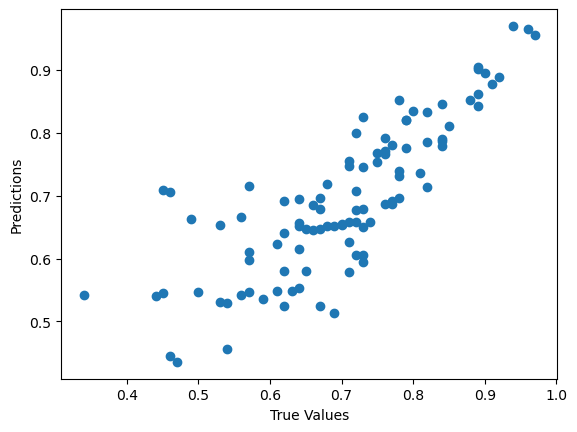

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3        z4       zz1     0  
0  0.163337  0.097008 -1.809578 -2.046466 -0.631693  0.69  
1 -0.133620 -0.444769 -1.115694 -2.357754 -0.502896  0.61  
2 -0.617463 -0.496323 -1.049617 -1.379915  0.694160  0.66  
3 -0.713528 -0.189591 -2.048674 -1.256503 -0.012300  0.67  
4 -1.187743  1.691698  1.093804 -0.223375  1.462664  0.46  
heatmap_VAE_xdim6_zdim4_zzdim1_lr0001_bs16_epochs1000_b11

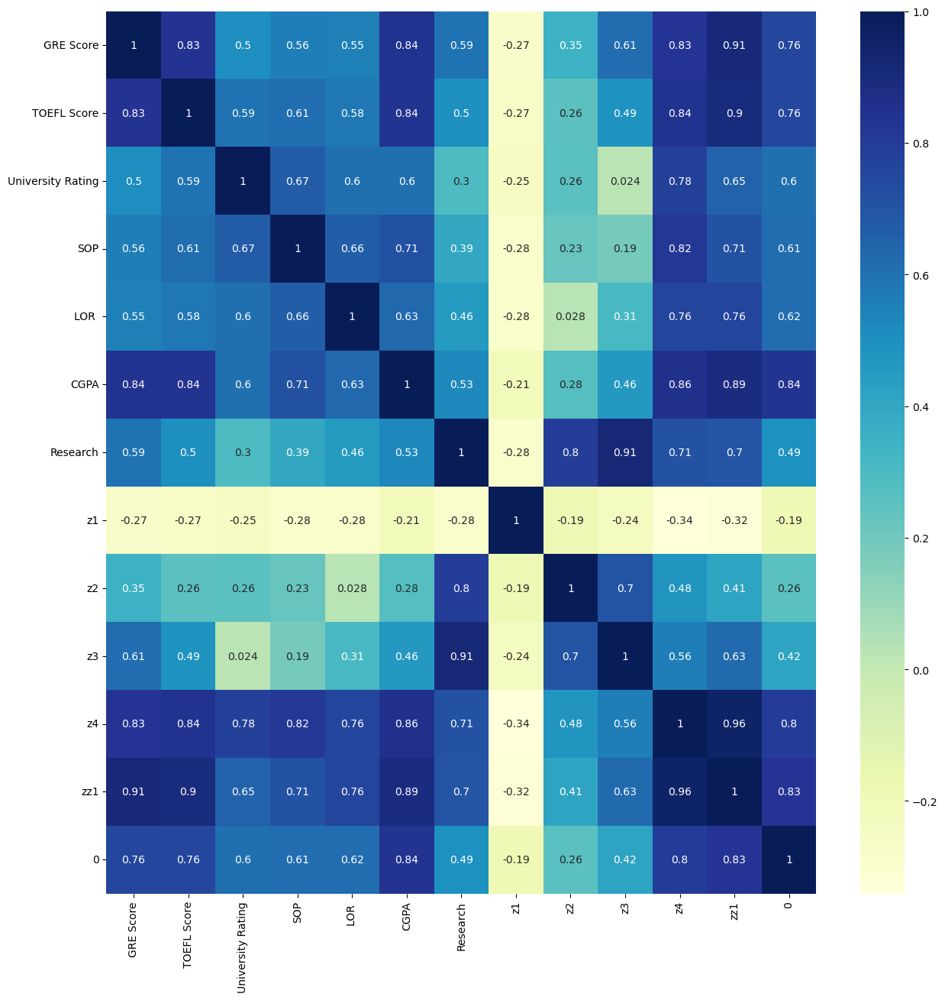

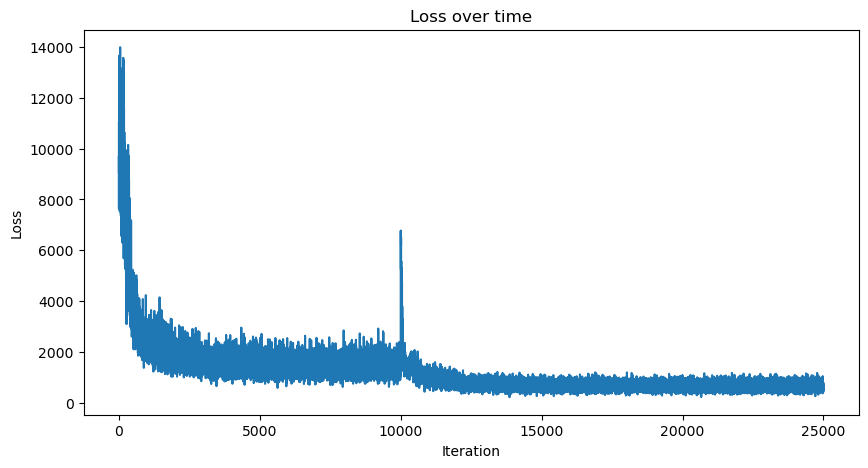

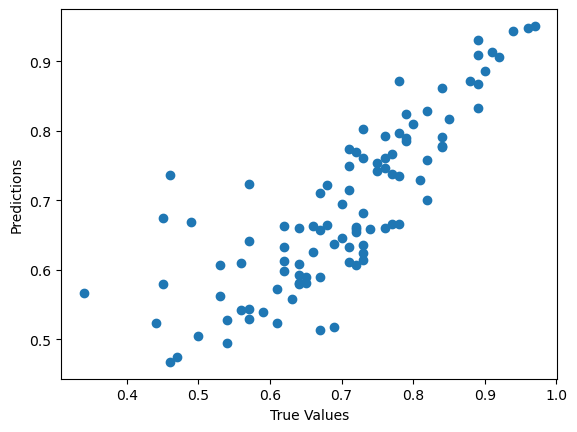

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3        z4       zz1     0  
0  1.141276  0.687768 -2.059684  0.313399 -0.330679  0.69  
1  1.266839 -0.299077 -2.276697  0.122139 -0.421531  0.61  
2  0.287971 -0.114184 -1.439715  0.918433  0.045951  0.66  
3  0.237611 -1.990601 -1.677174  1.388742 -0.038931  0.67  
4  0.371224  1.600539  0.484682 -1.325781  0.850863  0.46  
heatmap_VAE_xdim6_zdim4_zzdim1_lr0001_bs16_epochs1000_b11

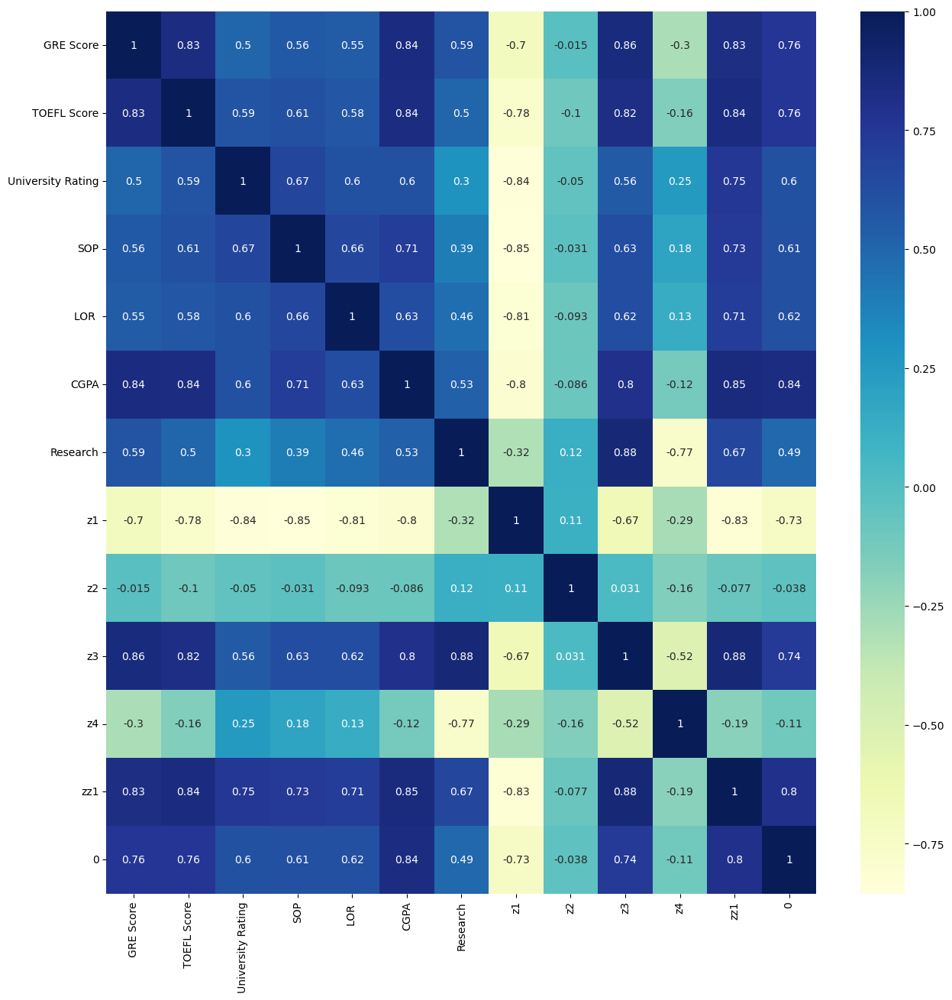

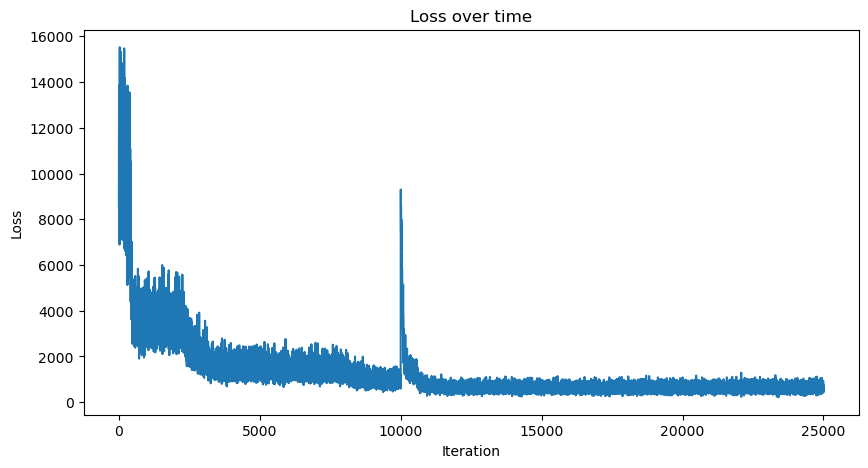

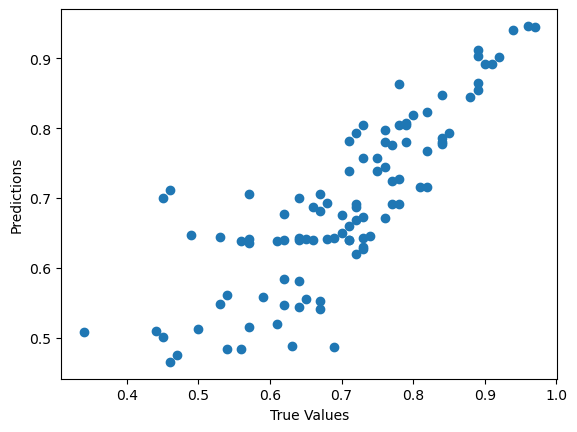

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3        z4       zz1     0  
0 -0.879328  1.164937  1.729602  1.238796  0.855315  0.69  
1 -0.372684  0.720711  1.209730  1.748004  0.545392  0.61  
2  0.226663 -0.563883  1.165430  0.495233 -0.126047  0.66  
3 -1.068461 -1.153560  1.538280  0.322622  0.471864  0.67  
4 -2.148926 -0.870718 -1.110320  0.019409 -0.921067  0.46  
heatmap_VAE_xdim6_zdim4_zzdim1_lr0001_bs16_epochs1000_b11

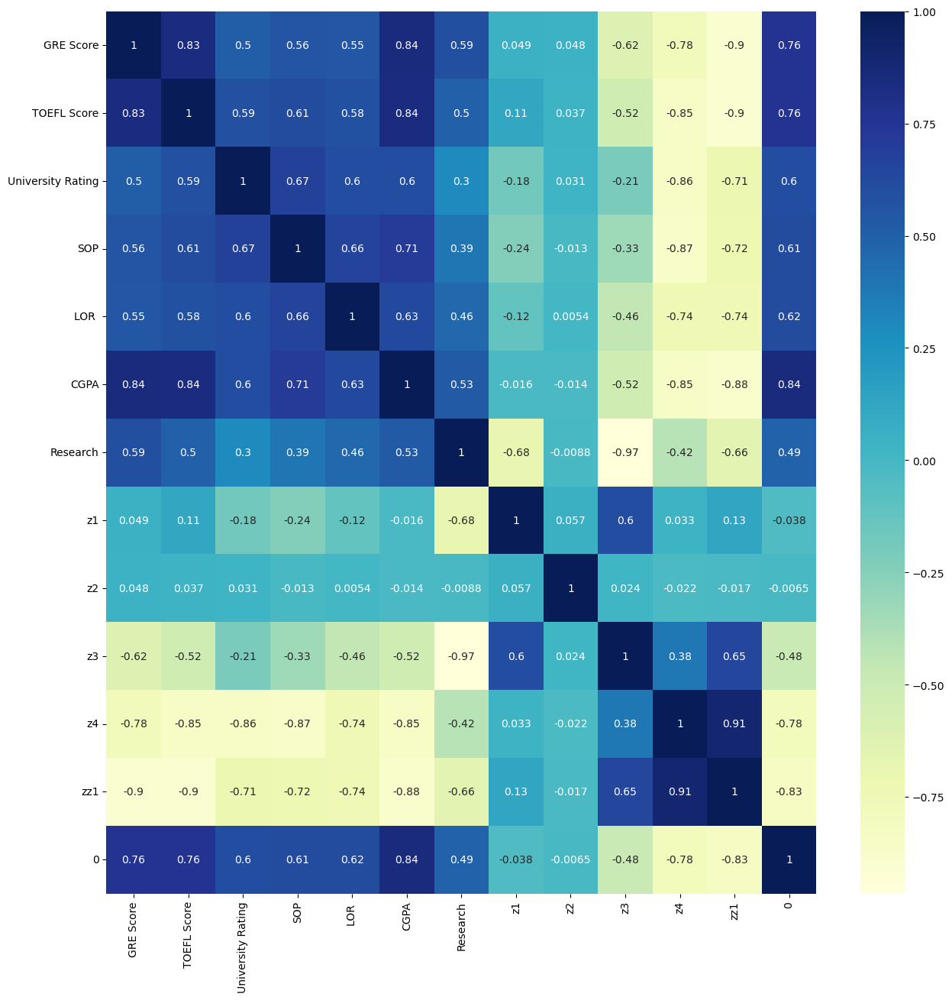

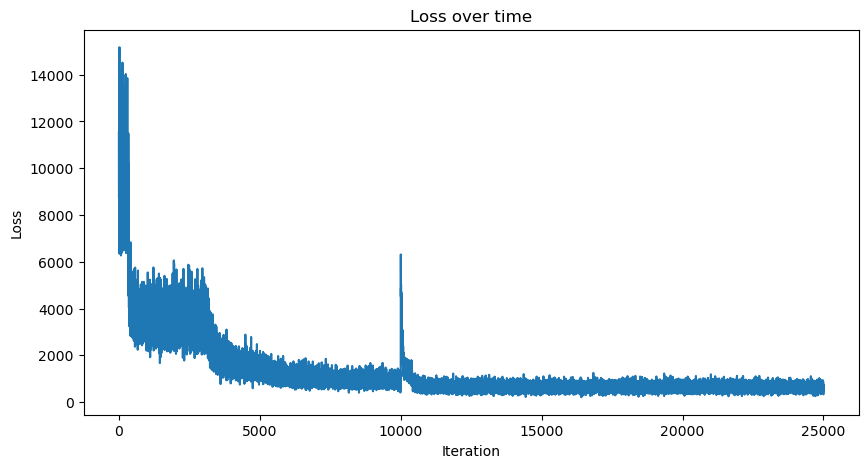

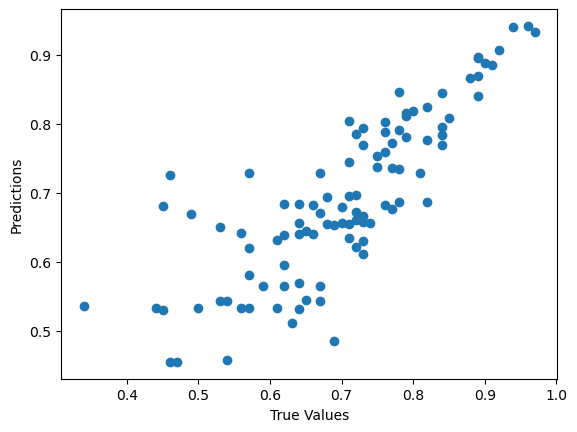

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3        z4       zz1     0  
0  0.296566  1.556237 -0.872206 -0.849705 -1.392595  0.69  
1  0.828544  1.788366 -0.223230 -1.206455 -1.297446  0.61  
2  1.492883  1.003518  0.623247 -0.620277 -0.384279  0.66  
3  0.777332  0.746675 -0.564863 -0.719337 -0.941655  0.67  
4 -0.897044  0.144094  0.571710 -0.885393  0.322536  0.46  
heatmap_VAE_xdim6_zdim4_zzdim1_lr0001_bs16_epochs1000_b11

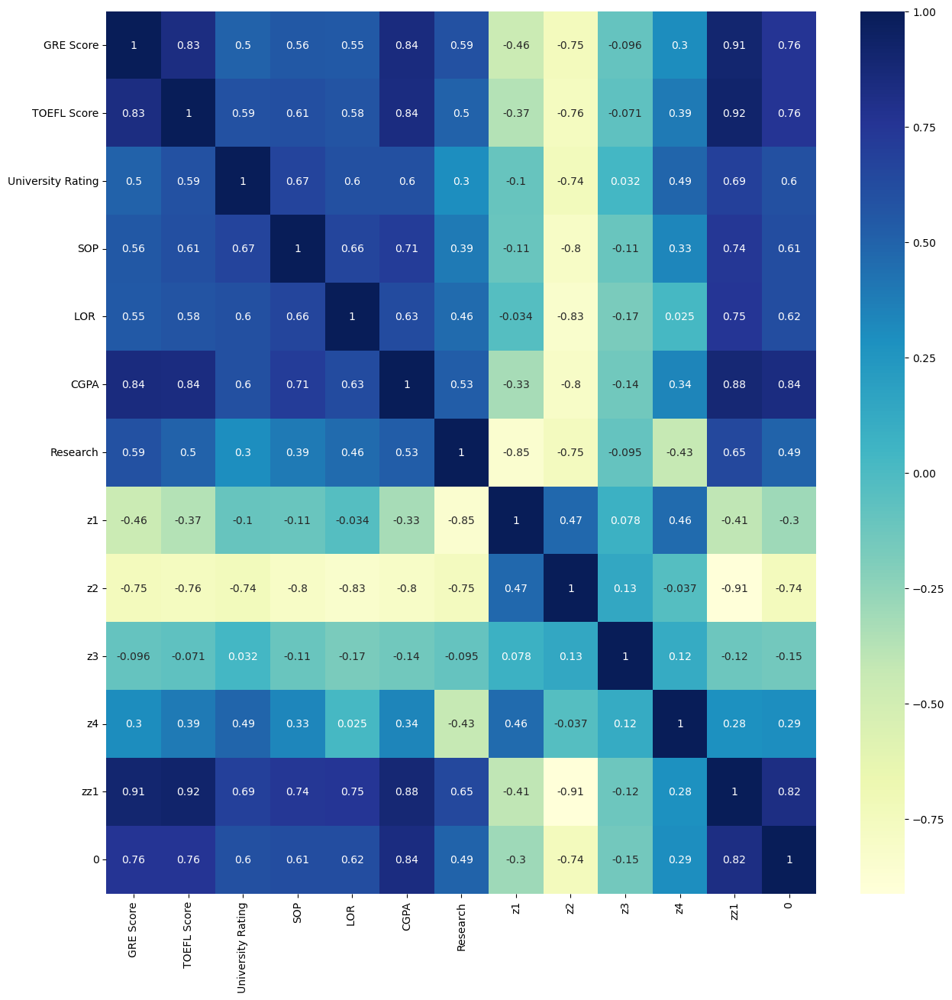

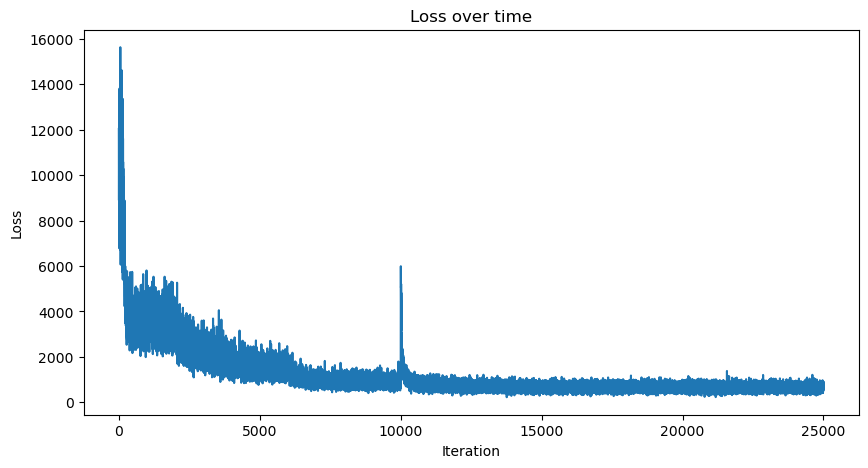

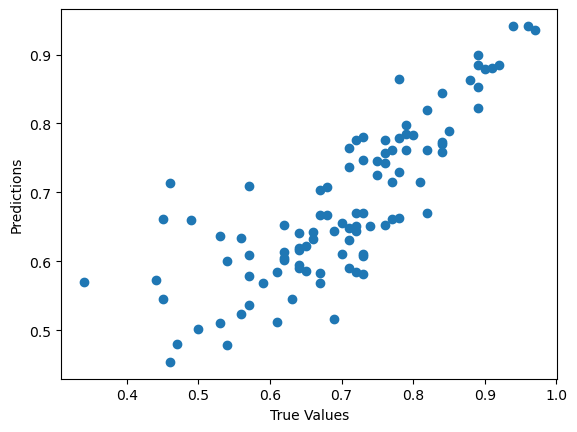

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3        z4       zz1     0  
0 -0.288156 -2.274668 -0.397893  1.152027  0.957791  0.69  
1 -0.716887 -2.290481 -0.438758 -0.021897  1.196944  0.61  
2  0.171899 -1.627770  0.594551 -0.058265  2.184735  0.66  
3  0.835025 -2.005345 -1.237966  1.245968  1.555660  0.67  
4 -1.464309  0.369620 -0.571222  1.256454  4.161311  0.46  
heatmap_VAE_xdim6_zdim4_zzdim1_lr0001_bs16_epochs1000_b11

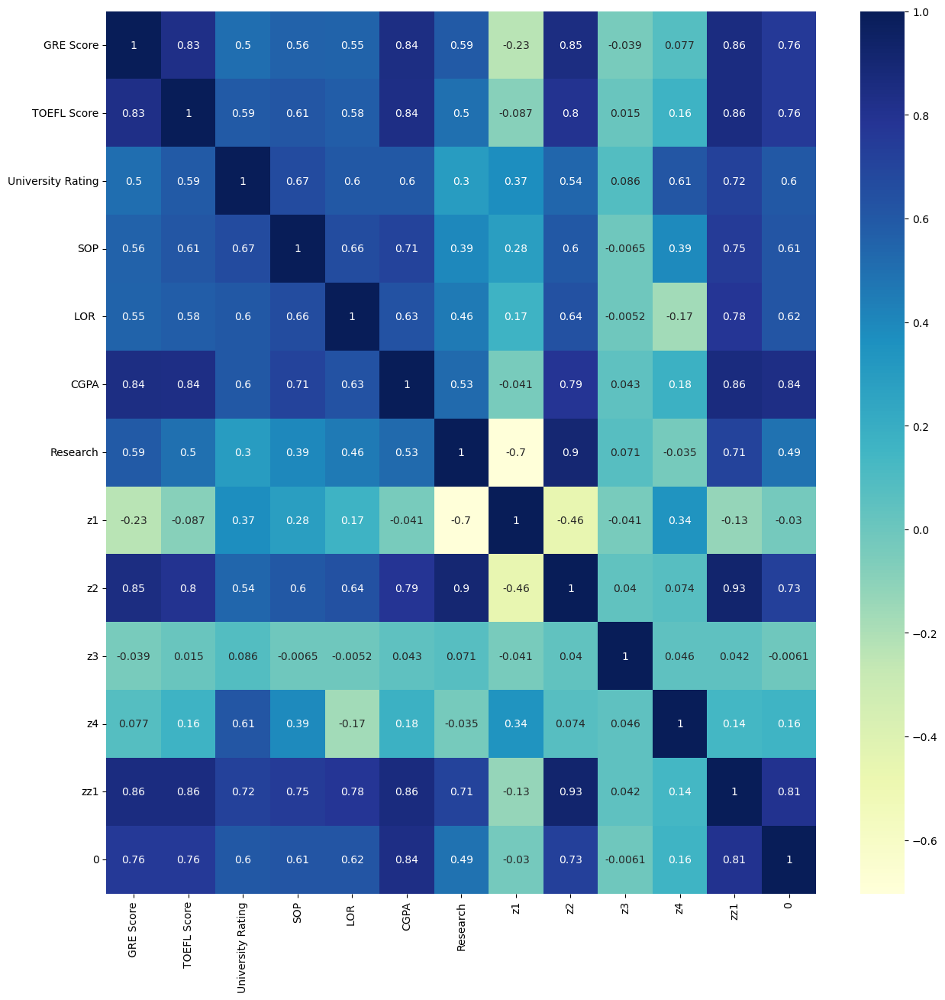

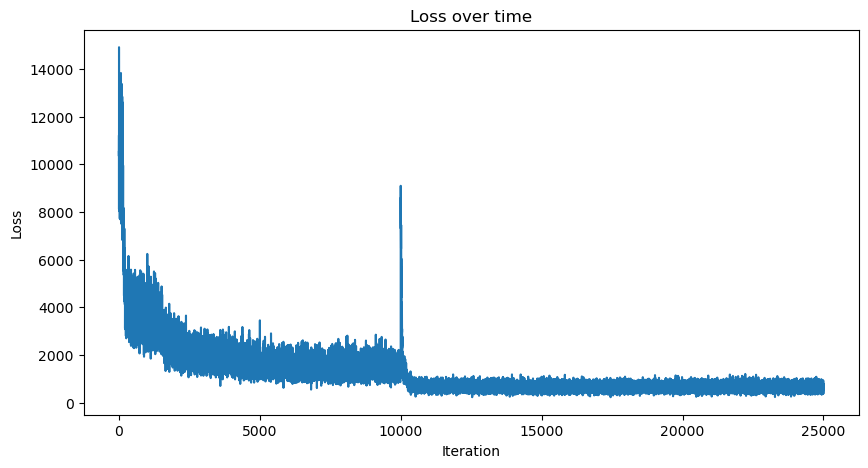

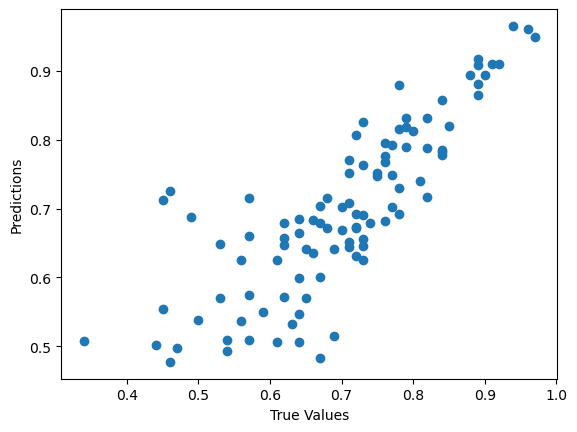

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3        z4       zz1     0  
0 -2.129473  1.079070  1.142033  1.292474 -0.089098  0.69  
1 -2.388853  1.016377  0.340853 -0.428655 -0.106361  0.61  
2 -1.337974  1.619140  2.092232  1.398957  0.514561  0.66  
3 -1.654767  1.943353  1.855122  0.861385  0.318336  0.67  
4  0.089219 -1.268987 -0.111221 -0.472036  1.551273  0.46  
heatmap_VAE_xdim6_zdim4_zzdim1_lr0001_bs16_epochs1000_b11

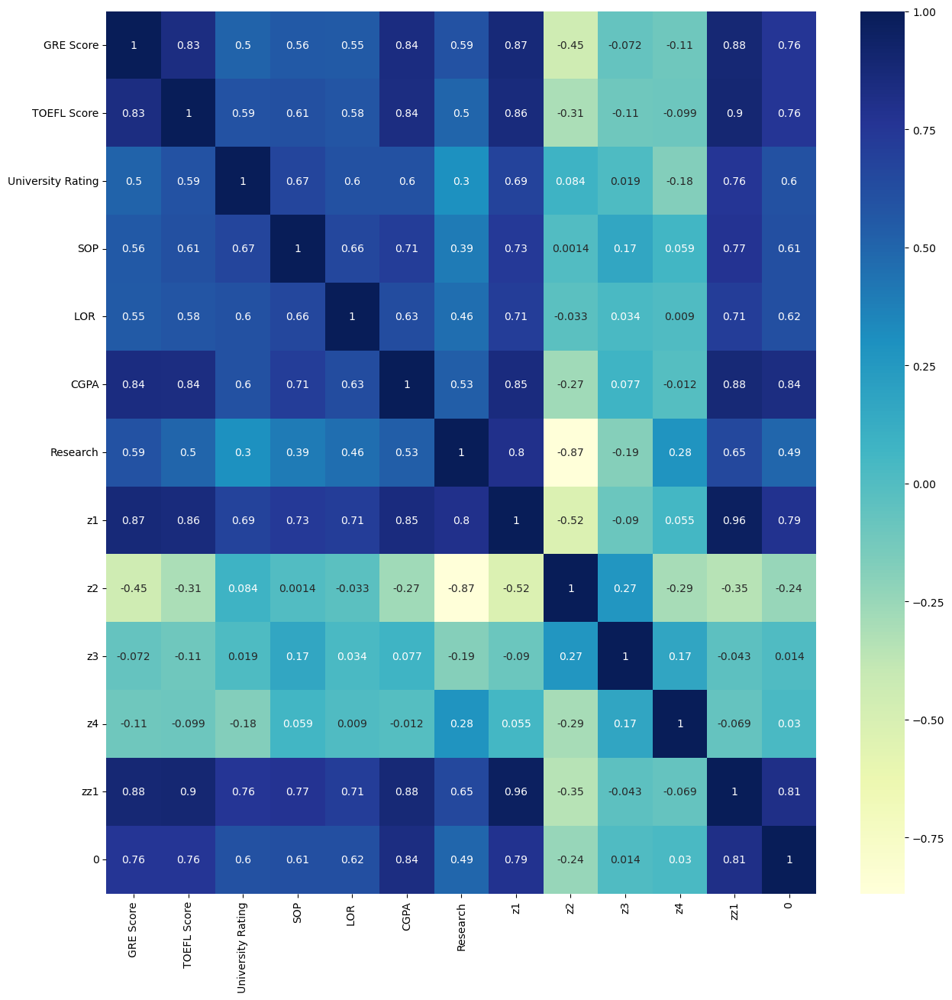

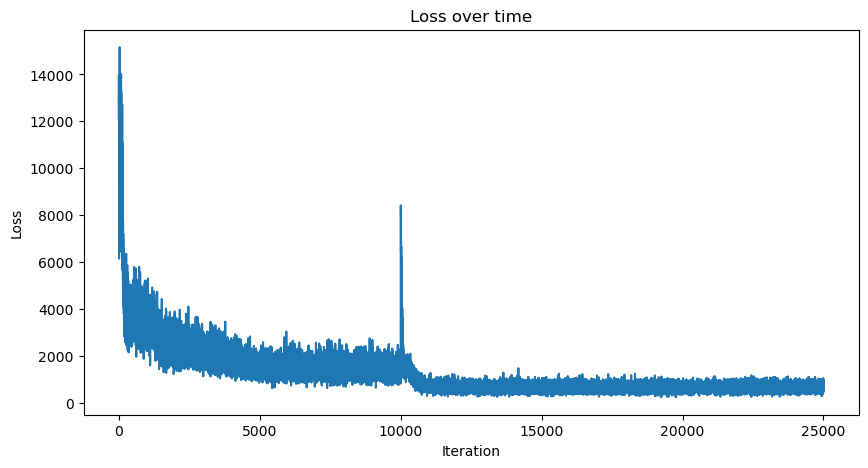

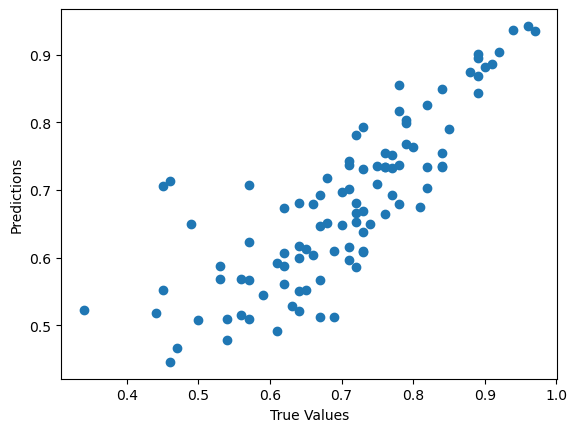

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3        z4       zz1     0  
0 -1.372838 -1.940696  1.367956  0.087899 -3.915359  0.69  
1 -1.272468 -2.179506 -0.041866  0.227885 -4.173263  0.61  
2 -1.706572 -0.939321 -1.624506 -0.279049 -3.172096  0.66  
3 -1.901347 -1.051110  1.551015 -0.157003 -3.401417  0.67  
4 -0.035624 -0.593783 -0.392974  0.998807 -2.068076  0.46  
heatmap_VAE_xdim6_zdim4_zzdim1_lr0001_bs16_epochs1000_b11

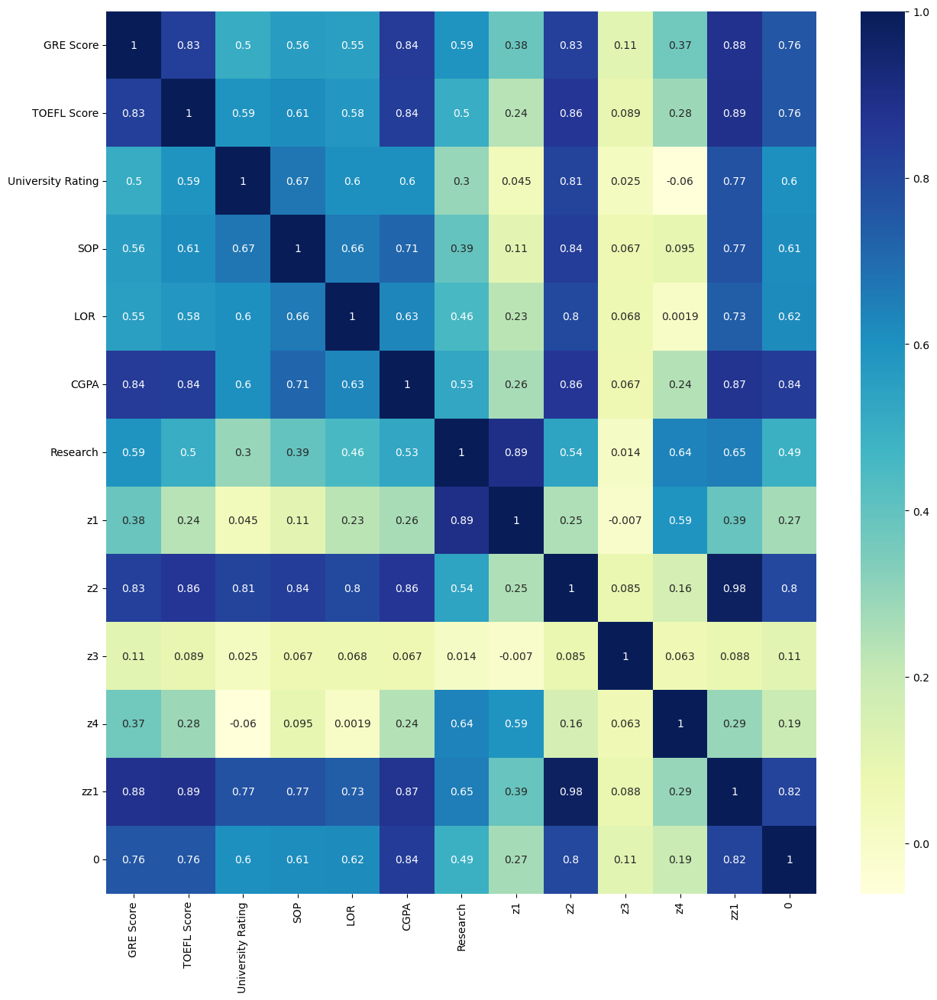

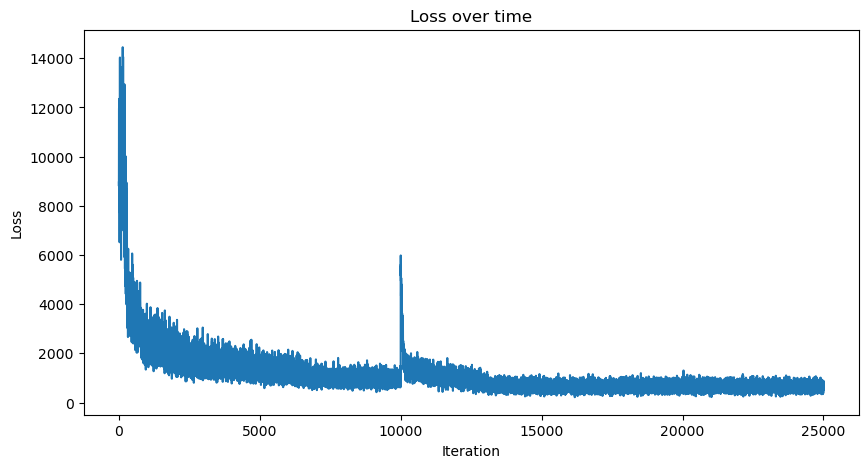

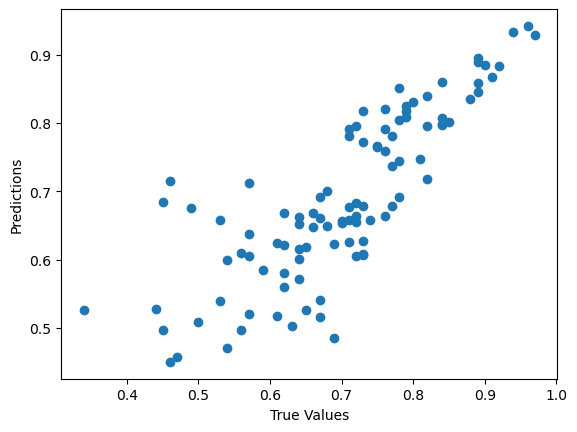

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3        z4       zz1     0  
0 -0.898567  0.076799  0.064737  2.611194  0.227117  0.69  
1 -0.089850  0.829239  0.447361  2.662756  0.151466  0.61  
2  0.222212  1.243353 -0.528291  2.072642  0.029972  0.66  
3 -0.935260  0.483298 -0.971179  2.405140  0.135225  0.67  
4  0.424876 -0.072439  1.427070 -0.274458 -0.204736  0.46  
heatmap_VAE_xdim6_zdim4_zzdim1_lr0001_bs16_epochs1000_b11

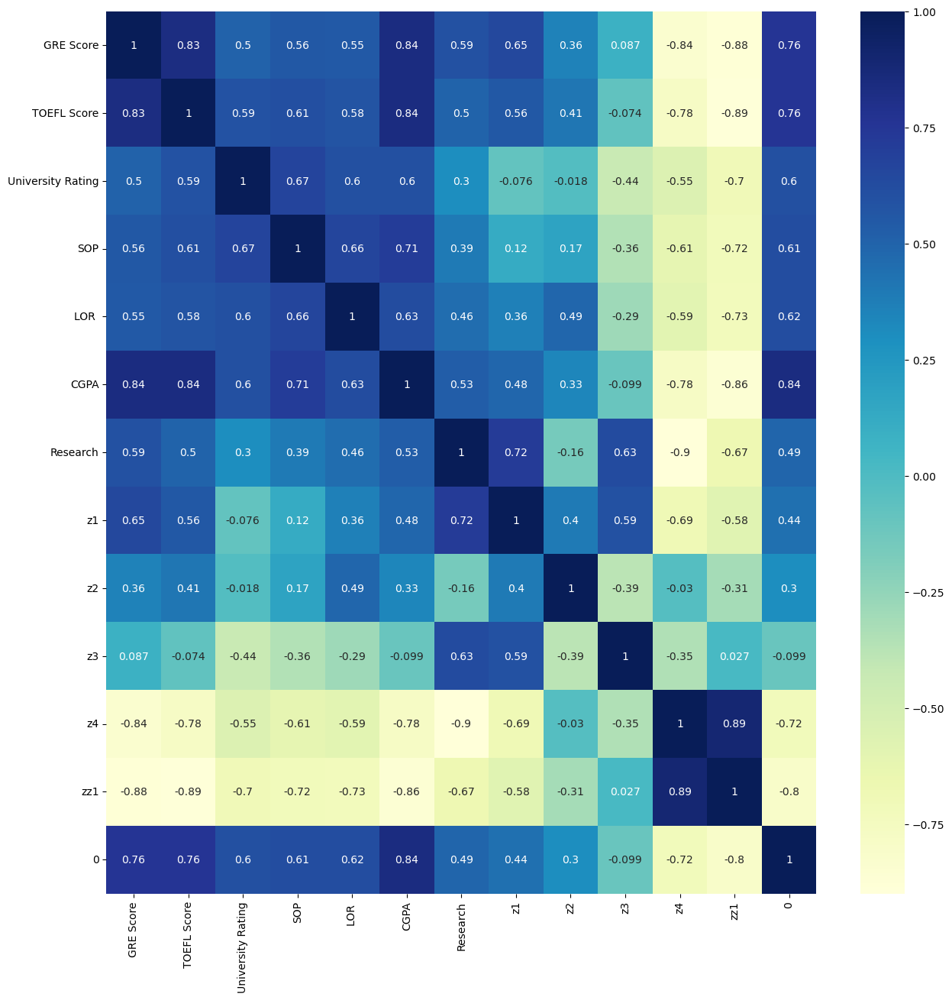

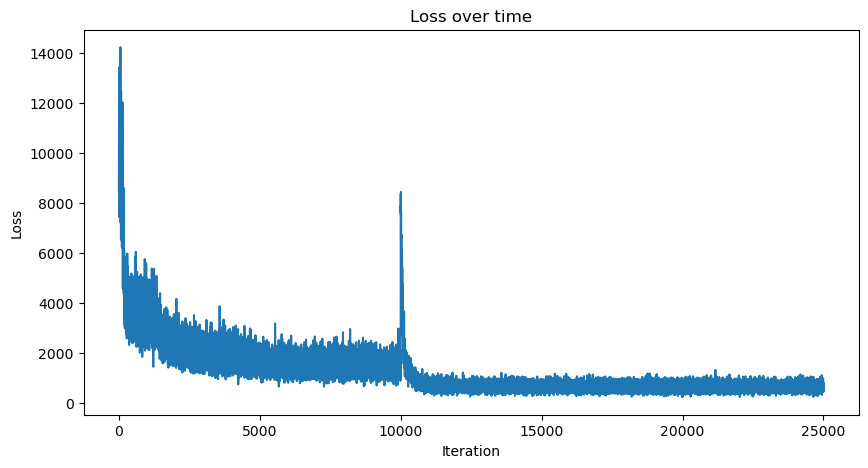

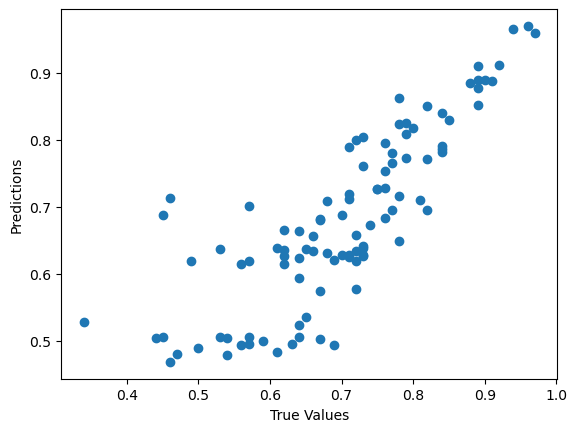

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3        z4       zz1     0  
0 -0.876458  0.320599  1.516380 -0.539766 -2.873475  0.69  
1 -0.896821  0.361100  1.980407  1.343812 -3.014746  0.61  
2 -0.660419 -0.289989  0.627934 -0.121750 -1.540146  0.66  
3 -0.322145 -0.292741  0.664558  2.020248 -1.704075  0.67  
4  1.027494  1.439659  0.291152 -1.214837  0.211631  0.46  
heatmap_VAE_xdim6_zdim4_zzdim1_lr0001_bs16_epochs1000_b11

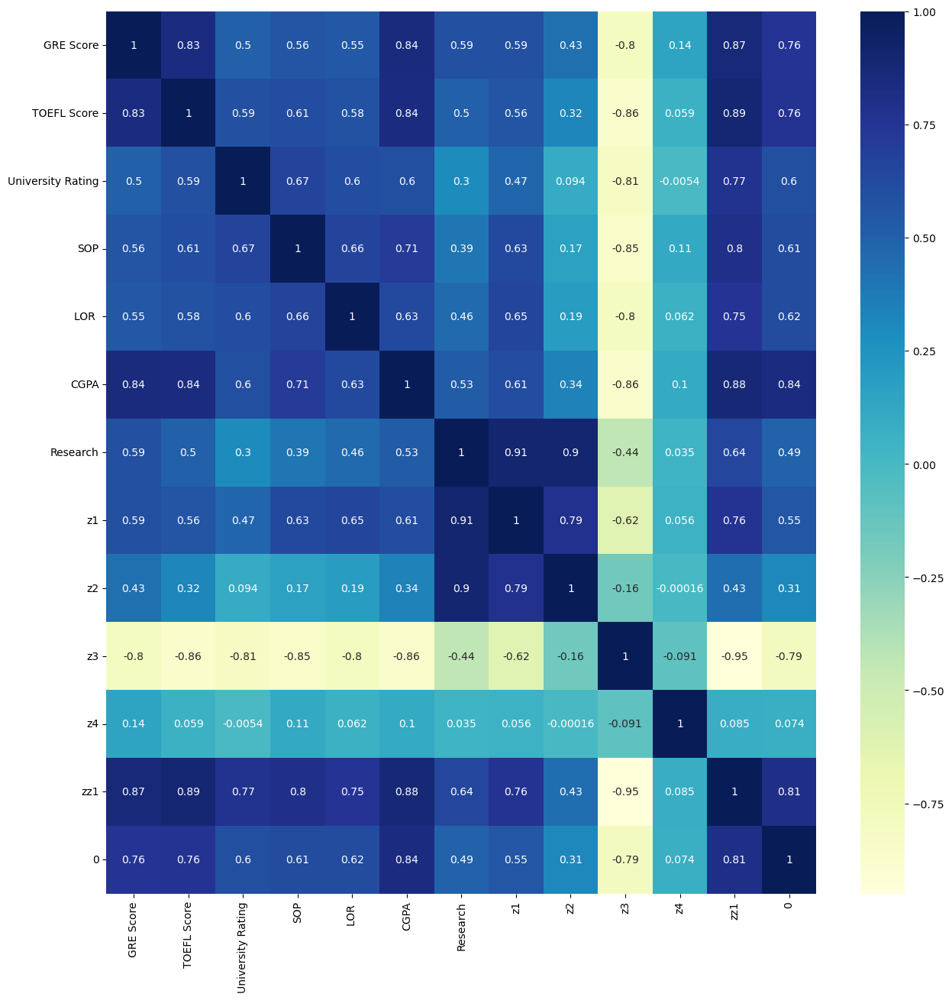

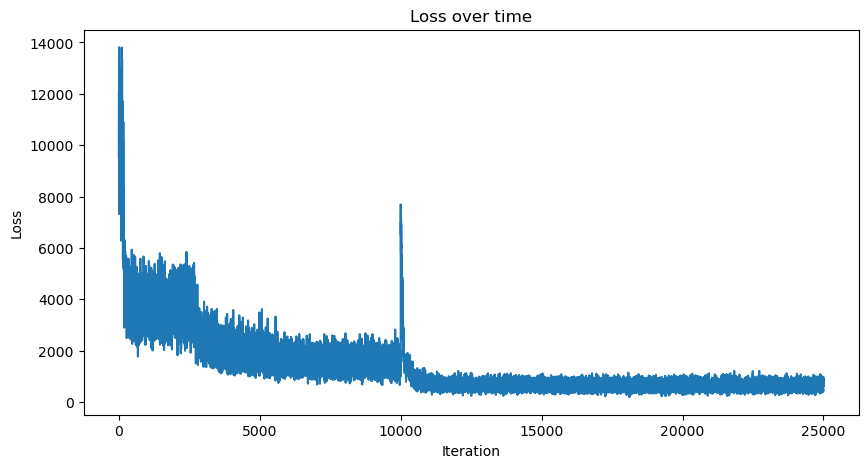

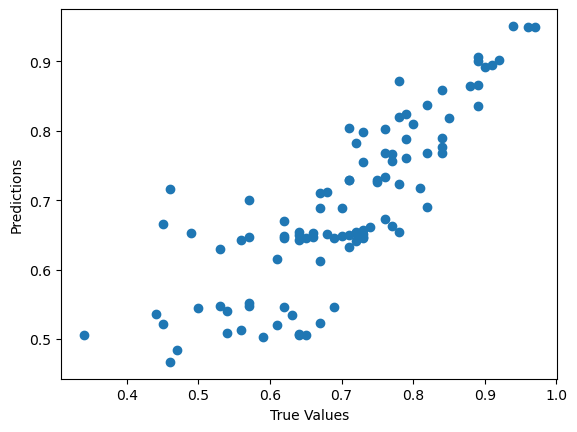

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3        z4       zz1     0  
0 -1.875150  0.293890 -1.273828 -0.032159  0.803227  0.69  
1 -2.017975  0.449104 -0.023633 -0.030311  0.909312  0.61  
2 -1.085676 -0.368080 -0.897329  0.700108 -0.194635  0.66  
3 -0.956747 -0.061013 -0.440216  0.327552 -0.126294  0.67  
4  0.463154  1.839872 -1.781298 -0.491379 -1.436730  0.46  
heatmap_VAE_xdim6_zdim4_zzdim1_lr0001_bs16_epochs1000_b11

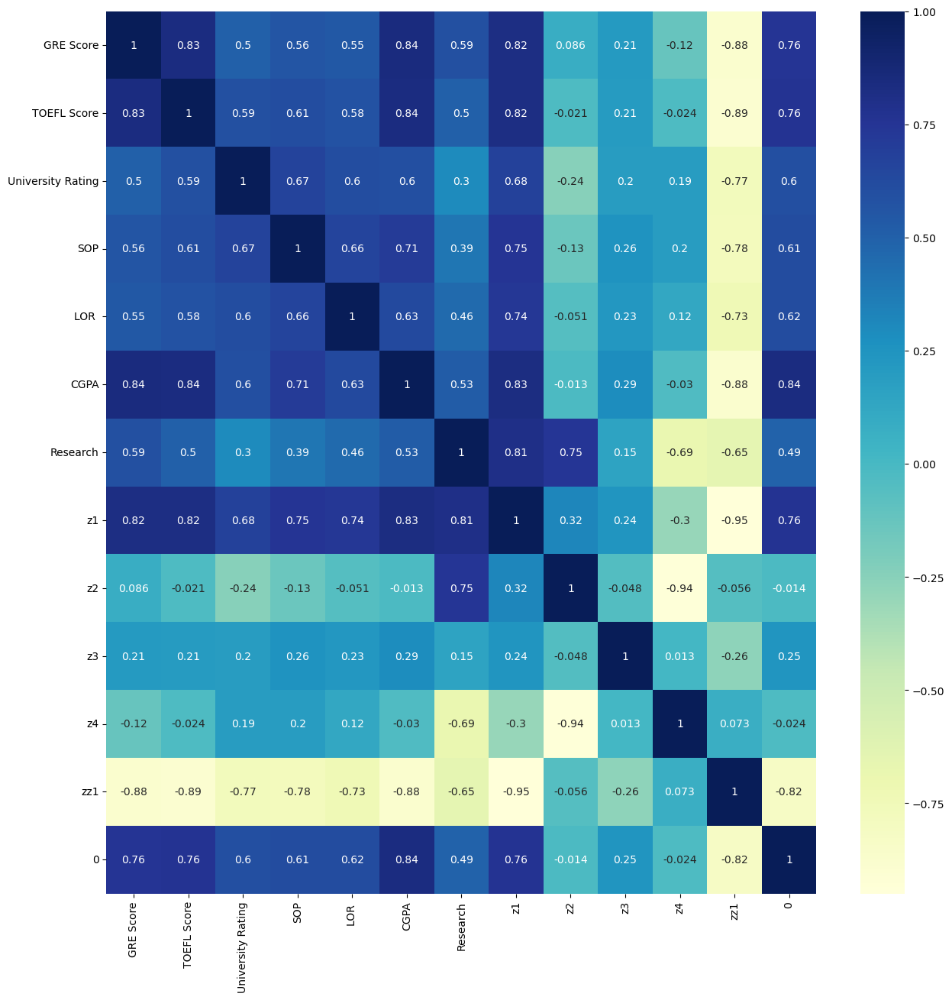

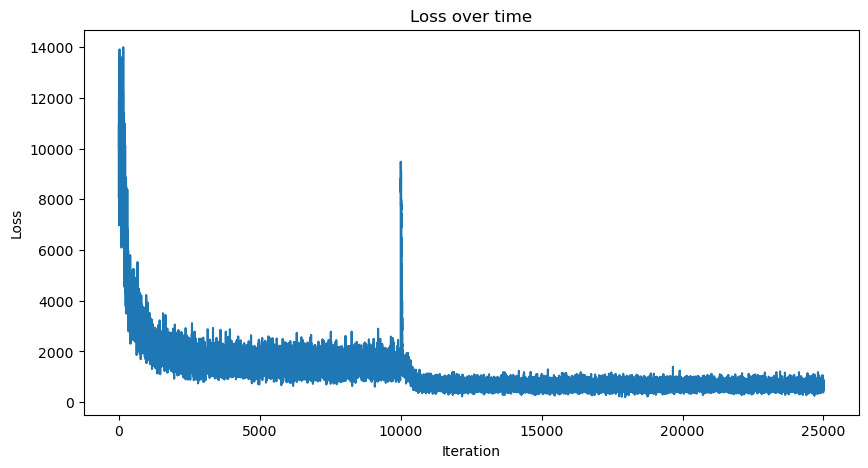

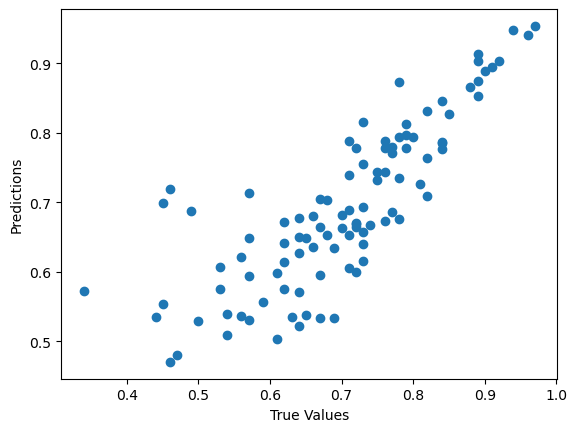

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3        z4       zz1     0  
0  0.580112 -0.613644 -1.266833 -0.397887  1.478729  0.69  
1  0.559099  0.534304 -1.591285 -0.373714  1.785143  0.61  
2  0.839914 -1.297917 -0.362782 -0.051229  0.639602  0.66  
3  0.446037  0.757126 -0.292444  0.105460  0.967186  0.67  
4 -1.281916  0.759005 -0.070816 -0.370407 -0.543388  0.46  
heatmap_VAE_xdim6_zdim4_zzdim1_lr0001_bs16_epochs1000_b11

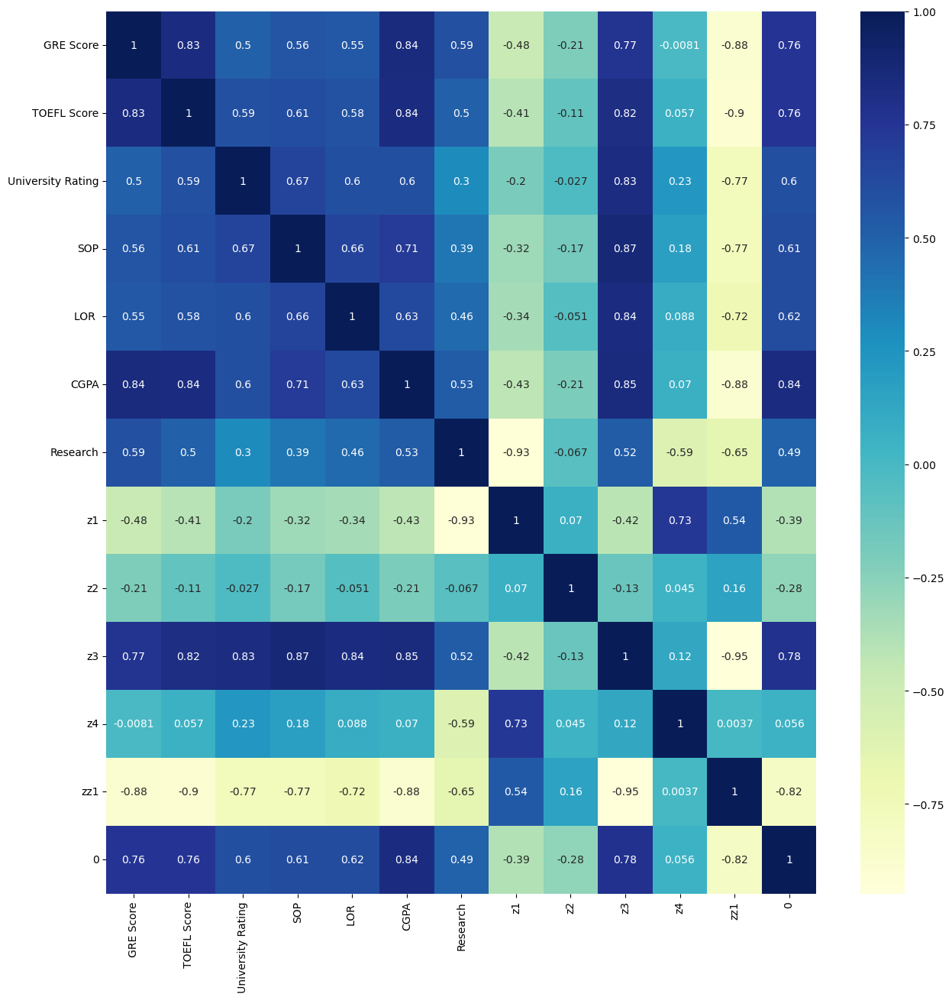

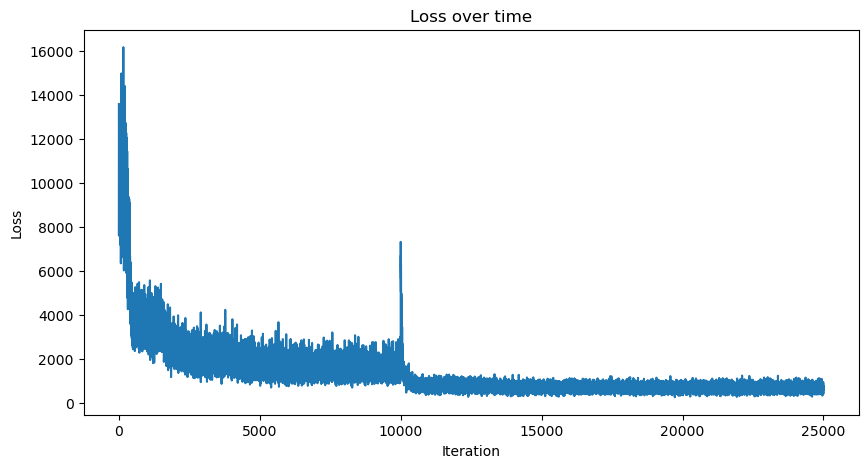

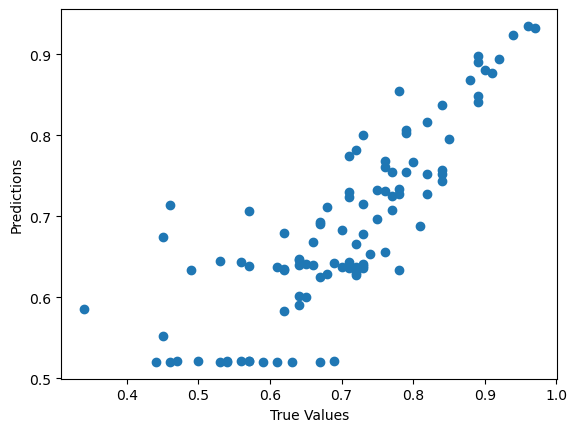

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3        z4       zz1     0  
0  1.956443  0.596720  2.422357  0.069181  1.322494  0.69  
1  0.551984  0.637011  2.565661  0.031413  1.138826  0.61  
2  0.366104  0.542191  1.865902 -0.684194  0.102555  0.66  
3 -0.021412  1.025241  2.033762 -0.932194  0.550660  0.67  
4 -2.090505 -0.906465 -0.049777  1.185951 -2.017587  0.46  
heatmap_VAE_xdim6_zdim4_zzdim1_lr0001_bs16_epochs1000_b11

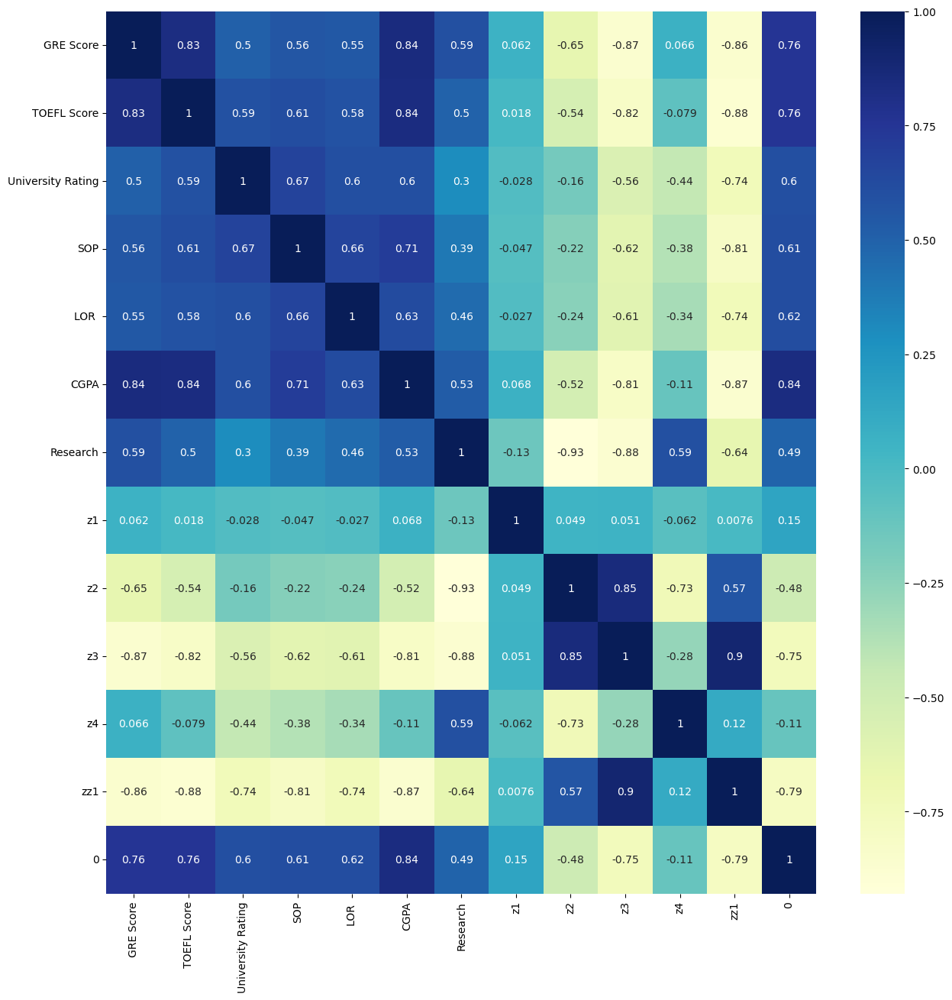

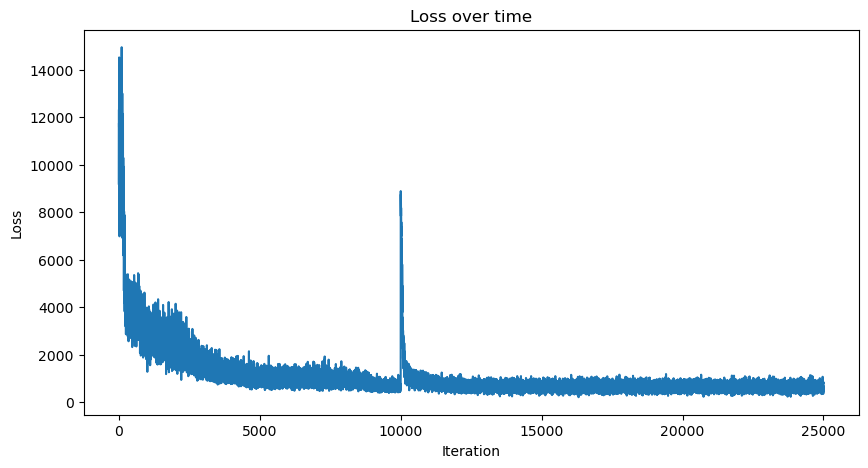

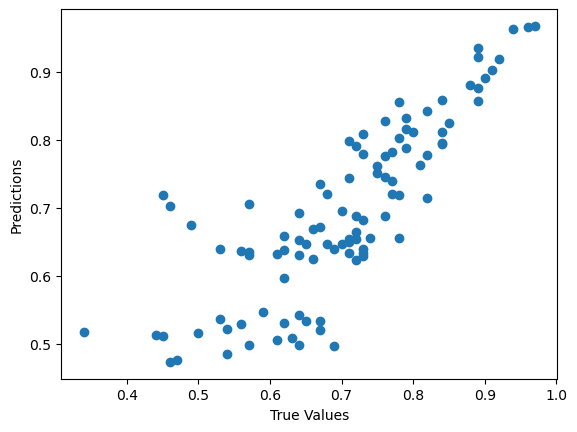

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3        z4       zz1     0  
0 -0.320769 -1.619525 -0.112831  2.255109  1.856599  0.69  
1  0.271541 -1.940844  0.313370  2.224830  1.721333  0.61  
2  0.555895 -0.942228 -0.356144  1.806038  0.592460  0.66  
3 -0.038524 -0.650567  0.286810  2.242293  1.288218  0.67  
4 -2.181653 -0.377732 -0.167349  0.083474 -1.282974  0.46  
heatmap_VAE_xdim6_zdim4_zzdim1_lr0001_bs16_epochs1000_b11

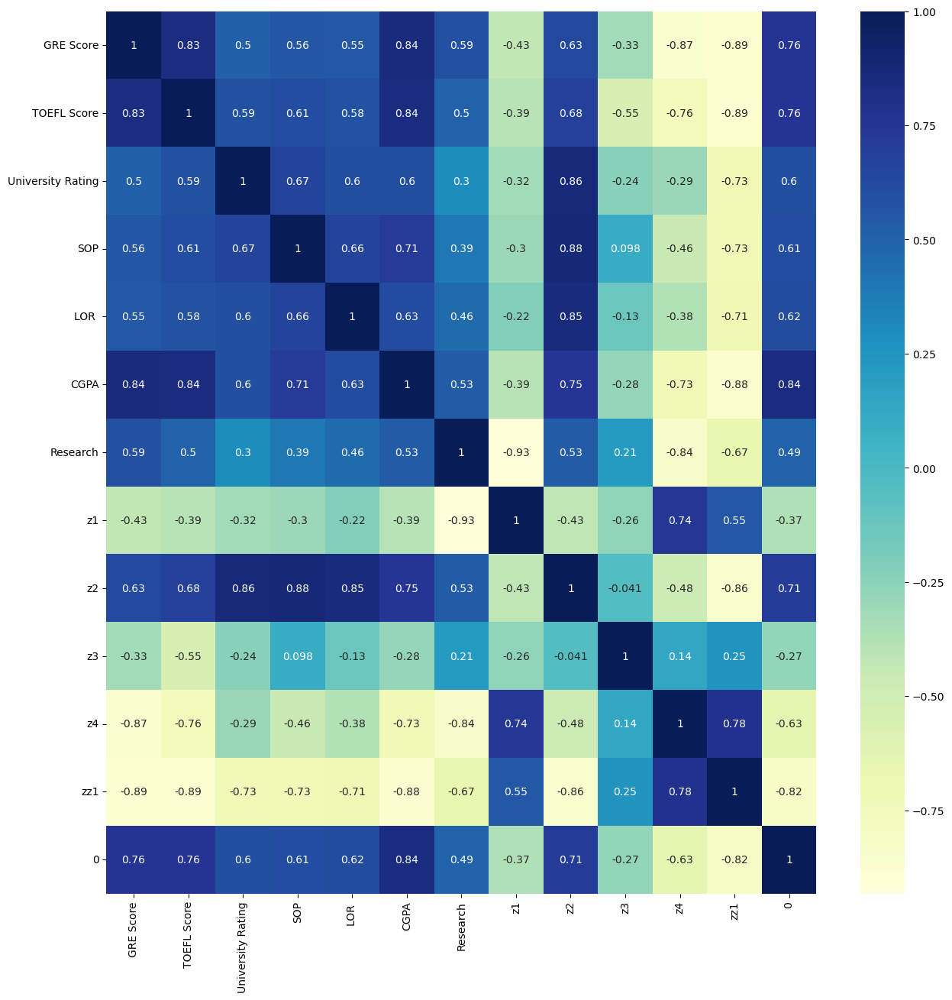

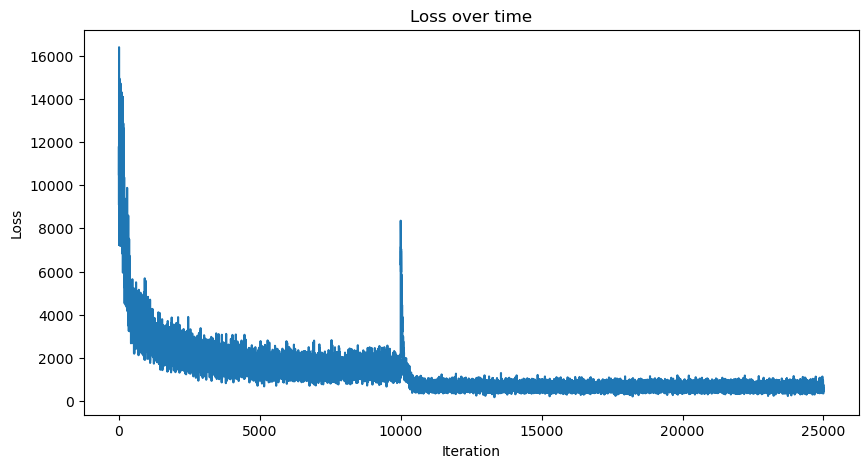

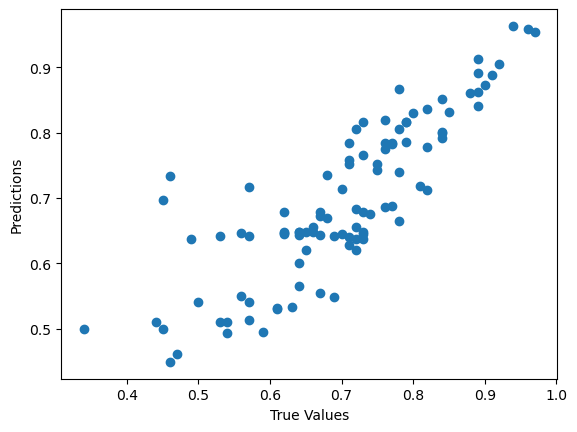

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3        z4       zz1     0  
0  0.540343  1.877416 -1.450345  0.731011  0.804690  0.69  
1  0.495639  1.617670 -1.554163  0.259519  0.865685  0.61  
2  0.236877  1.795320 -0.687942 -1.535590 -1.156124  0.66  
3  0.391694  2.364185 -0.879702  0.542317 -0.844557  0.67  
4 -0.714550 -0.793443  0.837698 -1.541116 -2.706167  0.46  
heatmap_VAE_xdim6_zdim4_zzdim1_lr0001_bs16_epochs1000_b11

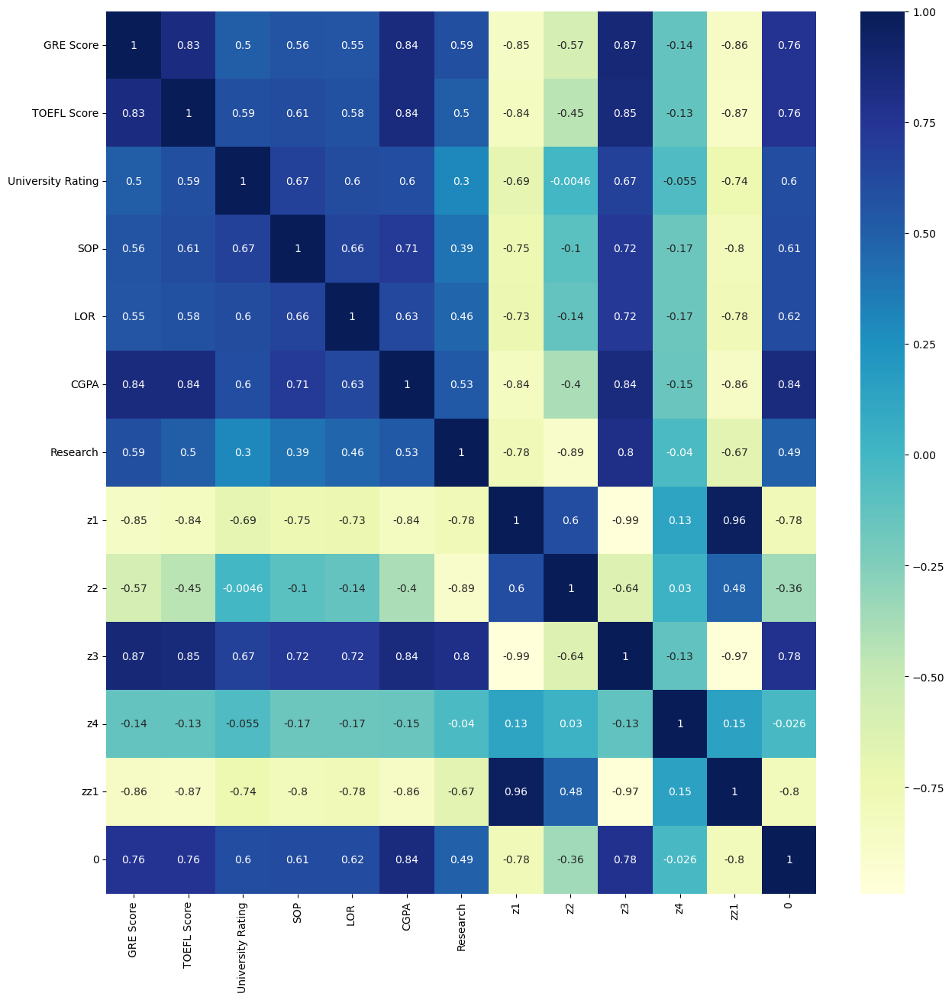

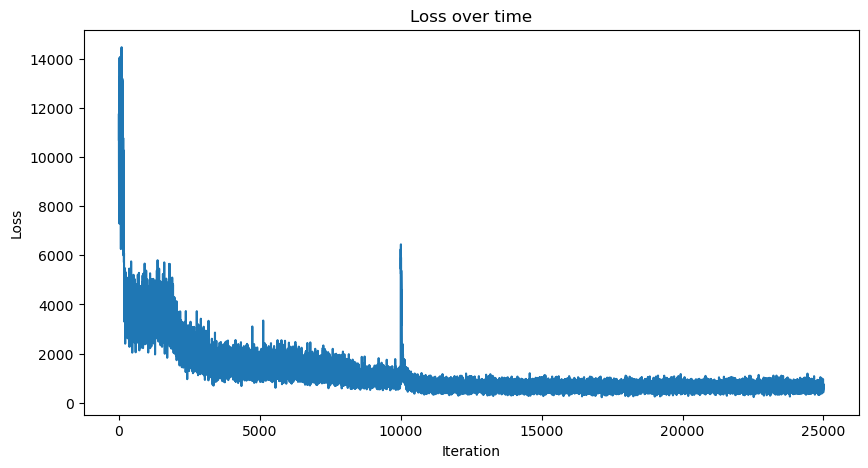

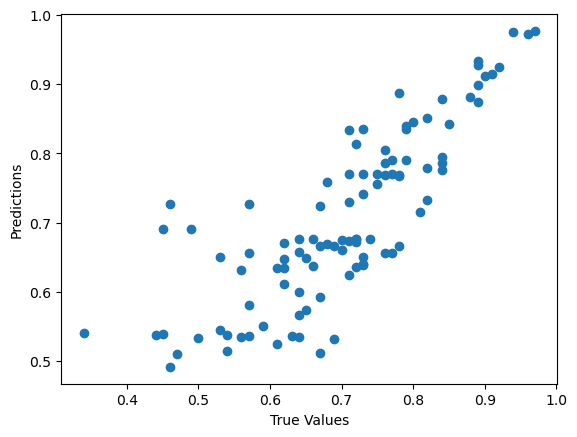

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3        z4       zz1     0  
0 -0.803896 -1.533175  1.905895 -1.525044 -1.279427  0.69  
1 -0.767209 -1.920297  2.054761  0.046797 -1.294397  0.61  
2 -1.072278 -1.078435  0.956197 -0.244464 -0.456819  0.66  
3 -1.554257 -1.162975  1.136382 -1.501187 -0.821280  0.67  
4  1.655549  0.065215  0.201278  0.340652  1.746740  0.46  
heatmap_VAE_xdim6_zdim4_zzdim1_lr0001_bs16_epochs1000_b11

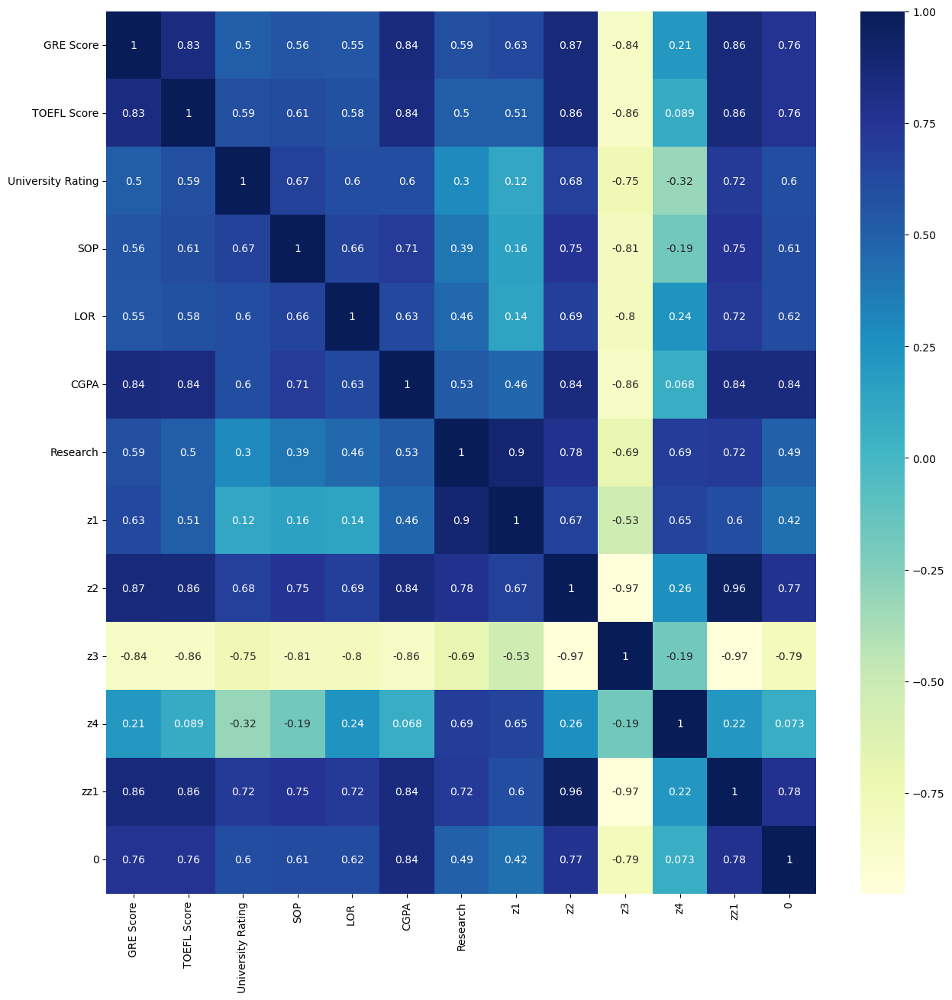

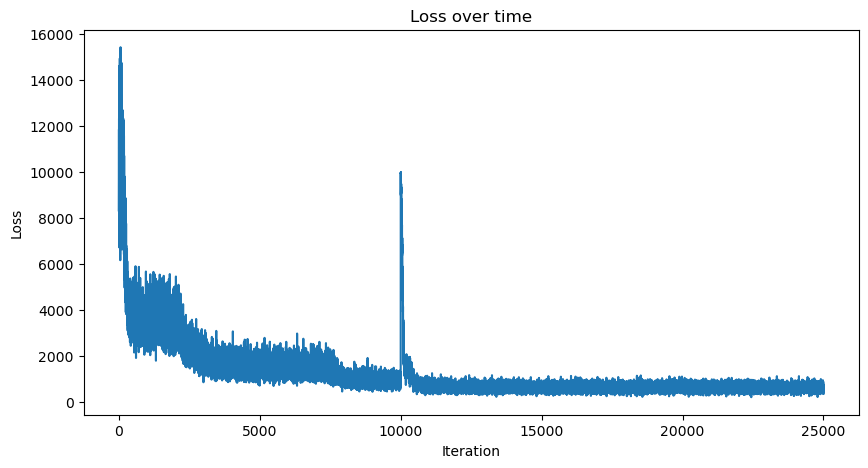

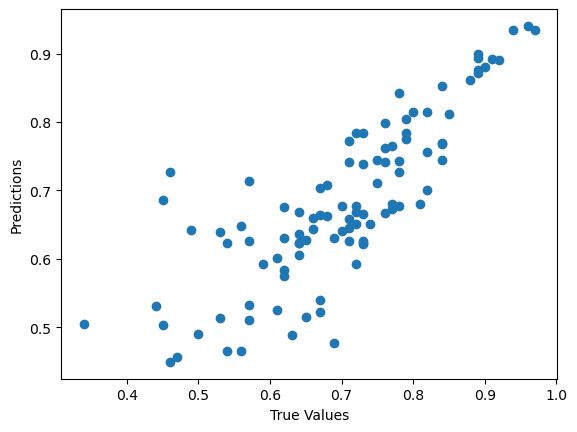

       0
0   0.69
1   0.61
2   0.66
3   0.67
4   0.46
..   ...
95  0.66
96  0.69
97  0.84
98  0.65
99  0.92

[100 rows x 1 columns]
   GRE Score  TOEFL Score  University Rating  SOP  LOR   CGPA  Research  \
0        295          101                  2  2.5   2.0  7.86         0   
1        300           98                  1  2.0   2.5  8.02         0   
2        308          103                  2  3.0   3.5  8.49         0   
3        301          100                  3  3.5   3.0  8.04         0   
4        308          110                  3  3.5   3.0  8.00         1   

         z1        z2        z3        z4       zz1     0  
0 -2.083171  0.908054 -0.037629  1.244555 -1.394403  0.69  
1 -2.239394 -0.097682 -0.309813 -0.398059 -1.129934  0.61  
2 -1.614787  0.810671  0.679198 -0.461668 -0.599656  0.66  
3 -1.828811  0.865735  0.940798  1.265321 -1.001816  0.67  
4  0.818018 -0.258909 -0.527076  1.032517  0.218466  0.46  
heatmap_VAE_xdim6_zdim4_zzdim1_lr0001_bs16_epochs1000_b11

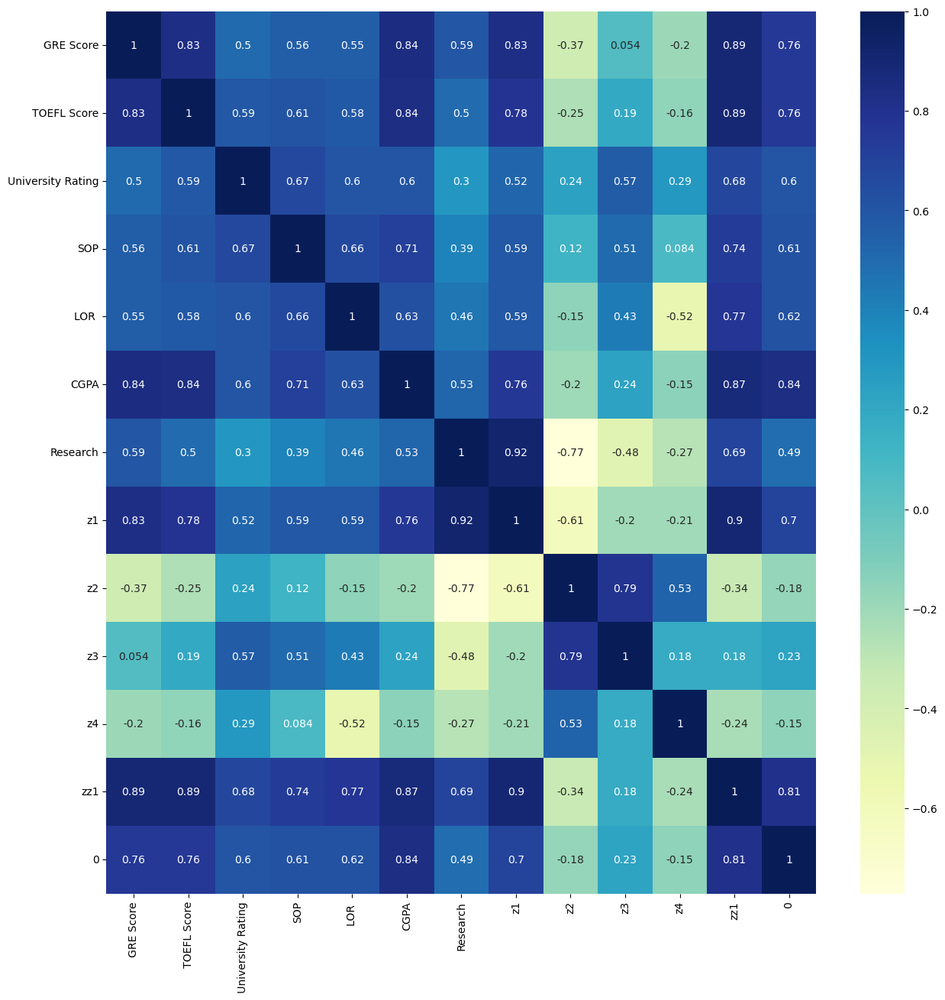

In [10]:
for i in range(20):
    mod,r,lt,ltt=train_VAE(X_train_scaled,X_test_scaled,X_test,y_train.values,y_test.values,configs[0],'./Test',save_pictures=True,freeze_weights=True,partial=400,offset=200,z_and_zz_to_y=False)
    if r>0.683:
        dict_d=dict(configs[0])
        r2_text = str(r).replace(".", "_")
        torch.save(mod,f"./Admission/Models/Admission_Freeze_zz_to_y_R2_{r2_text}_model.zip")
        with open(f"./Admission/Models/Config_Admission_Freeze_zz_to_y_R2_{r2_text}.json", 'w') as outfile:
            json.dump(dict_d, outfile)